In [69]:
import os.path
import  pandas  as  pd
import  numpy  as  np
import  matplotlib.pyplot  as  plt
# import  seaborn  as  sns
import random

## Un normalized LR1


In [70]:
# for preprocessing dataset. note that it returns a copy of the dataset and doesn't modify the original dataset
def preprocess(df_orig, to_standardize=False):
    df = df_orig.copy()

    # fill na values with mean in each column
    for i, col in enumerate(df.columns[2:]):
        df[col] = df[col].fillna(df[col].mean())

    # standardize data wrt normal distribution, only if, to_standardize variable is set to True
    if to_standardize == True:
        for i, col in enumerate(df.columns[2:]):
            df[col] = (df[col] - df[col].mean())/df[col].std()

    # Setting Malignant as the positive class and Benign as the negative class
    df['diagnosis'] = df['diagnosis'].replace('B', 0)
    df['diagnosis'] = df['diagnosis'].replace('M', 1)

    return df

**Read the data**

In [71]:
np.set_printoptions(suppress=True)
df = pd.read_csv("Dsata Set for Assignment 1.csv")
df.dropna( inplace=True)
df = preprocess(df, False)
print(df.shape)
# our target is diagnostic
# m = malignant
# b = benign
target = df.iloc[:, 1]
df = df.drop(['diagnosis','id'], axis=1)
# map m to 1 and b to 0
# target = target.map({'M':1, 'B':0})
print()
print(target)
df.head()

(563, 32)

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 563, dtype: int64


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [72]:
order=[]
for i in range(len(df)):
    order.append(i)


shuffle = random.sample(order, int(len(order) * 0.67))

rem = [i for i in order if i not in shuffle]

In [73]:
X_train = df.iloc[shuffle]
X_test = df.iloc[rem]
Y_train = target.iloc[shuffle]
Y_test = target.iloc[rem]

print(X_train.shape)
print(Y_train)

(377, 30)
23     1
292    0
52     0
295    0
42     1
      ..
274    1
21     0
115    0
95     1
104    0
Name: diagnosis, Length: 377, dtype: int64


In [76]:
def sigmoid_activation(result):
    # final_result = 1/(1+np.exp(-result))
    final_result = 1/(1+np.exp(-result/1e-15))
    return final_result

# this will give overflow
# sigmoid_activation(-800)


/var/folders/7b/_d9vpy5d6hnbmsjtdf9t95y80000gn/T/ipykernel_13310/3543500182.py:3: RuntimeWarning: overflow encountered in exp
  final_result = 1/(1+np.exp(-result/1e-15))


Max accuracy: 0.92042
Accuracy: 0.90186


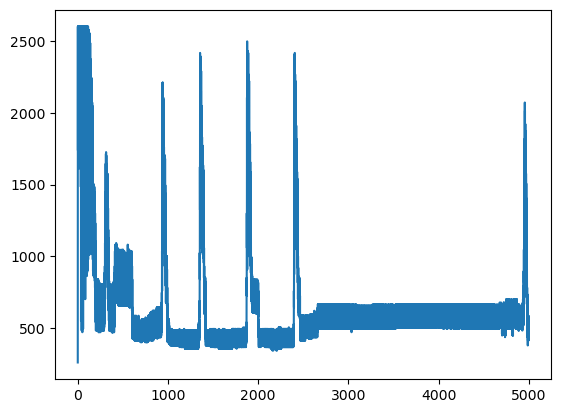

Weights: [ -21.22209605   -0.7633315  -103.802407    -21.29237      -0.05908822
    0.68795843    1.18628767    0.4592969    -0.12665109   -0.08199128
   -0.24717903   -0.12897222    3.4293808    35.47433555    0.00399082
    0.18454552    0.23484327    0.04681721    0.01360993    0.01201006
  -22.28442735   12.4316915   -78.0270485    40.178205      0.05031417
    2.67173445    3.47084765    0.82876234    0.2041828     0.12006048]
Bias: -2.0432500000000053


In [77]:
# batch gradient descent
def model(X_train, y_train, X_test, y_test, learning_rate, num_iter,probability_threshold):
    # initialize weights
    weights = np.zeros(X_train.shape[1])
    bias = 0
    max_accuracy = 0
    chkptw = 0
    chkptb = 0
    accuracy = 0
    activated_output = 0
    costs = []
    epsilon = 1e-5
    # print(weights)
    for i in range(num_iter):
        # weighted sum of inputs / weights
        weighted_sum = np.dot(X_train, weights) + bias
        # activate
        activated_output = sigmoid_activation(weighted_sum)
        # if i == 1 or i == 2:
        #     print(i, activated_output)
        # calculate error
        error = y_train - activated_output

        cost = -np.sum((y_train)*np.log(activated_output + epsilon) + (1-y_train)*np.log(1-activated_output + epsilon))
        
        costs.append(cost)
        # if i == 200 or i == 399:
        #     print(i, cost)
        # if i == 100:
        #     print(-np.sum(y_train*np.log(activated_output) + (1-y_train)*np.log(1-activated_output)))

        # adjust weights
        weights += learning_rate * np.dot(X_train.T, error)
        # adjust bias
        bias += learning_rate * error.sum()
        # calculate accuracy
        predictions = np.where(activated_output >= probability_threshold, 1, 0)
        accuracy = (predictions == y_train).mean()
        if accuracy > max_accuracy:
            max_accuracy = accuracy
            chkptw = weights
            chkptb = bias
    print("Max accuracy: {:.5f}".format(max_accuracy))
    print("Accuracy: {:.5f}".format(accuracy))
    plt.plot(costs)
    plt.show()
    return chkptw, chkptb

weights, bias = model(X_train, Y_train, X_test, Y_test, learning_rate=0.0001, num_iter=5000,probability_threshold=0.5)
print("Weights:", weights)
print("Bias:", bias)

/var/folders/7b/_d9vpy5d6hnbmsjtdf9t95y80000gn/T/ipykernel_13310/753126747.py:2: RuntimeWarning: overflow encountered in exp
  final_result = 1/(1+np.exp(-result))


Max accuracy: 1.00000
Accuracy: 0.95312


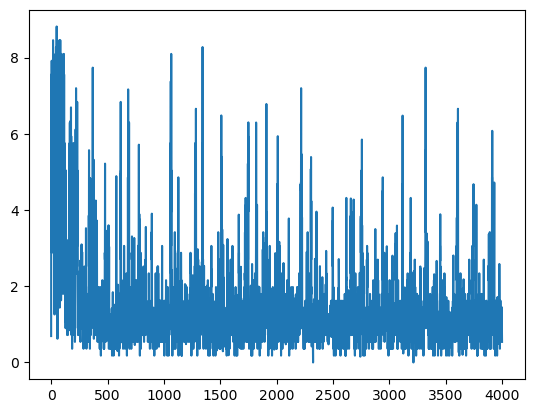

In [ ]:
def mini_batch_gd(X_train, Y_train, learning_rate, num_iter, batch_size, probability_threshold):
    # initialize weights
    weights = np.zeros(X_train.shape[1])
    bias = 0
    max_accuracy = 0
    chkptw = 0
    chkptb = 0
    accuracy = 0
    activated_output = 0
    costs = []
    epsilon = 1e-5
    nrows = X_train.shape[0]

    
    for i in range(int(num_iter)):
        choices = np.random.choice(nrows, replace=False, size = batch_size) # random sample without replacement
        x_train = X_train.iloc[choices] 
        y_train = Y_train.iloc[choices]
        # weighted sum of inputs / weights
        weighted_sum = np.dot(x_train, weights) + bias

        # activate
        activated_output = sigmoid_activation(weighted_sum)

        # calculate error
        error = y_train - activated_output

        cost = -np.mean(y_train*np.log(activated_output + epsilon) + (1-y_train)*np.log(1-activated_output + epsilon))
        costs.append(cost)

        # adjust weights
        weights += learning_rate * np.dot(x_train.T, error)

        # adjust bias
        bias += learning_rate * error.sum()

        # calculate accuracy
        predictions = np.where(activated_output >= probability_threshold, 1, 0)
        accuracy = (predictions == y_train).mean()
        if accuracy > max_accuracy:
            max_accuracy = accuracy
            chkptw = weights
            chkptb = bias
        choices = np.random.choice(nrows, replace=False, size = batch_size)
        x_train = X_train.iloc[choices]
        y_train = Y_train.iloc[choices]

    print("Max accuracy: {:.5f}".format(max_accuracy))
    print("Accuracy: {:.5f}".format(accuracy))
    plt.plot(costs)
    plt.show()
    return chkptw, chkptb

weights, bias = mini_batch_gd(X_train, Y_train, learning_rate=0.0001, num_iter=4000, batch_size = 64, probability_threshold=0.5)

In [ ]:
def compute_accuracy(X_train, Y_train, weights, bias, probability_threshold):
    accuracy = 0
    # weighted sum of inputs / weights
    weighted_sum = np.dot(X_train, weights) + bias
    # activate
    activated_output = sigmoid_activation(weighted_sum)
    # calculate accuracy
    predictions = np.where(activated_output >= probability_threshold, 1, 0)
    accuracy = (predictions == Y_train).mean()

    return accuracy

/var/folders/7b/_d9vpy5d6hnbmsjtdf9t95y80000gn/T/ipykernel_13310/753126747.py:2: RuntimeWarning: overflow encountered in exp
  final_result = 1/(1+np.exp(-result))


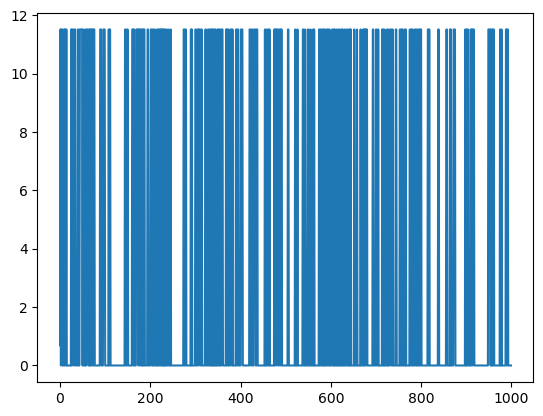

Accuracy: 0.8817204301075269


In [ ]:
def stochastic_gd(X_train, Y_train, learning_rate, num_iter, probability_threshold):
    batch_size = 1
    
    # initialize weights
    weights = np.zeros(X_train.shape[1])
    bias = 0
    max_accuracy = 0
    chkptw = 0
    chkptb = 0
    accuracy = 0
    activated_output = 0
    costs = []
    epsilon = 1e-5
    nrows = X_train.shape[0]
    
    for i in range(int(num_iter)):
        choices = np.random.choice(nrows, replace=False, size = batch_size)
        x_train = X_train.iloc[choices]
        y_train = Y_train.iloc[choices]

        # weighted sum of inputs / weights
        weighted_sum = np.dot(x_train, weights) + bias

        # activate
        activated_output = sigmoid_activation(weighted_sum)

        # calculate error
        error = y_train - activated_output

        cost = -np.mean(y_train*np.log(activated_output + epsilon) + (1-y_train)*np.log(1-activated_output + epsilon))
        costs.append(cost)

        # adjust weights
        weights += learning_rate * np.dot(x_train.T, error)

        # adjust bias
        bias += learning_rate * error.sum()

        # calculate accuracy
        predictions = np.where(activated_output >= probability_threshold, 1, 0)
        accuracy = (predictions == y_train).mean()
        if accuracy > max_accuracy:
            max_accuracy = accuracy
            chkptw = weights
            chkptb = bias
        choices = np.random.choice(nrows, replace=False, size = batch_size)
        x_train = X_train.iloc[choices]
        y_train = Y_train.iloc[choices]

    plt.plot(costs)
    plt.show()
    return chkptw, chkptb

weights, bias = stochastic_gd(X_train, Y_train, learning_rate=5, num_iter=1000, probability_threshold=0.5)
accuracy = compute_accuracy(X_test, Y_test, weights, bias, probability_threshold = 0.5)
print("Accuracy:", accuracy)

## Normalized LR2


**Read the data**

In [ ]:
np.set_printoptions(suppress=True)
df = pd.read_csv("Dsata Set for Assignment 1.csv")
df = preprocess(df, True)
print(df.shape)
# our target is diagnostic
# m = malignant
# b = benign
target = df.iloc[:, 1]
df = df.drop(['diagnosis','id'], axis=1)
# map m to 1 and b to 0
# target = target.map({'M':1, 'B':0})
print()
print(target)
df.head()

(569, 32)

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 569, dtype: int64


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1.102422,-2.071512,1.268389,0.983510,1.567087,3.280628,2.650837,2.530249,2.215566,2.253764,...,1.885031,-1.358098,2.301575,1.998658,1.306537,2.614365,2.107374,2.294058,2.748204,1.935312
1,1.836635,-0.353322,1.684639,1.907030,-0.826235,-0.486643,-0.025417,0.547662,0.001391,-0.867889,...,1.804340,-0.368879,1.533776,1.887973,-0.375282,-0.430066,-0.147968,1.086129,-0.243675,0.280943
2,1.586206,0.455786,1.565122,1.557513,0.941382,1.052000,1.361666,2.035440,0.938859,-0.397658,...,1.510541,-0.023953,1.346291,1.454016,0.526944,1.081980,0.853340,1.953282,1.151242,0.201214
3,-0.767260,0.253509,-0.595257,-0.763792,3.280667,3.399917,1.913989,1.450431,2.864862,4.906602,...,-0.281217,0.133866,-0.249720,-0.551147,3.391291,3.889975,1.987485,2.173873,6.040726,4.930672
4,1.756953,-1.150804,1.775308,1.824624,0.280125,0.538866,1.369198,1.427237,-0.009552,-0.561956,...,1.297434,-1.465481,1.337363,1.218589,0.220362,-0.313119,0.611645,0.728618,-0.867590,-0.396751


In [ ]:
order=[]
for i in range(len(df)):
    order.append(i)


shuffle = random.sample(order, int(len(order) * 0.67))

rem = [i for i in order if i not in shuffle]

In [ ]:
X_train = df.iloc[shuffle]
X_test = df.iloc[rem]
Y_train = target.iloc[shuffle]
Y_test = target.iloc[rem]

print(X_train.shape)
print(Y_train)

(381, 30)
222    0
334    0
352    1
220    0
188    0
      ..
36     1
115    0
72     1
150    0
437    0
Name: diagnosis, Length: 381, dtype: int64


In [ ]:
def sigmoid_activation(result):
    final_result = 1/(1+np.exp(-result))
    # final_result = 1/(1+np.exp(-result/1e5))
    return final_result

# this will give overflow
# sigmoid_activation(-800)


Max accuracy: 0.98688
Accuracy: 0.98688


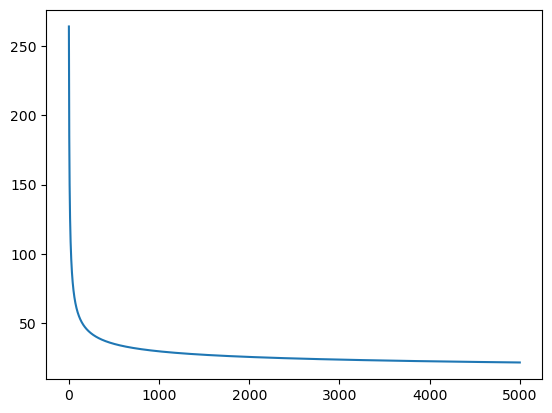

In [ ]:
def model(X_train, y_train, X_test, y_test, learning_rate, num_iter,probability_threshold):
    # initialize weights
    weights = np.zeros(X_train.shape[1])
    bias = 0
    max_accuracy = 0
    chkptw = 0
    chkptb = 0
    accuracy = 0
    activated_output = 0
    costs = []
    epsilon = 1e-5
    # print(weights)
    for i in range(num_iter):
        # weighted sum of inputs / weights
        weighted_sum = np.dot(X_train, weights) + bias
        # activate
        activated_output = sigmoid_activation(weighted_sum)
        # if i == 1 or i == 2:
        #     print(i, activated_output)
        # calculate error
        error = y_train - activated_output

        cost = -np.sum((y_train)*np.log(activated_output + epsilon) + (1-y_train)*np.log(1-activated_output + epsilon))
        
        costs.append(cost)
        # if i == 200 or i == 399:
        #     print(i, cost)
        # if i == 100:
        #     print(-np.sum(y_train*np.log(activated_output) + (1-y_train)*np.log(1-activated_output)))

        # adjust weights
        weights += learning_rate * np.dot(X_train.T, error)
        # adjust bias
        bias += learning_rate * error.sum()
        # calculate accuracy
        predictions = np.where(activated_output >= probability_threshold, 1, 0)
        accuracy = (predictions == y_train).mean()
        if accuracy > max_accuracy:
            max_accuracy = accuracy
            chkptw = weights
            chkptb = bias
    print("Max accuracy: {:.5f}".format(max_accuracy))
    print("Accuracy: {:.5f}".format(accuracy))
    plt.plot(costs)
    plt.show()
    # print("Activated Output", activated_output)
    return chkptw, chkptb

weights, bias = model(X_train, Y_train, X_test, Y_test, learning_rate=0.0001, num_iter=5000,probability_threshold=0.5)

Max accuracy: 1.00000
Accuracy: 1.00000


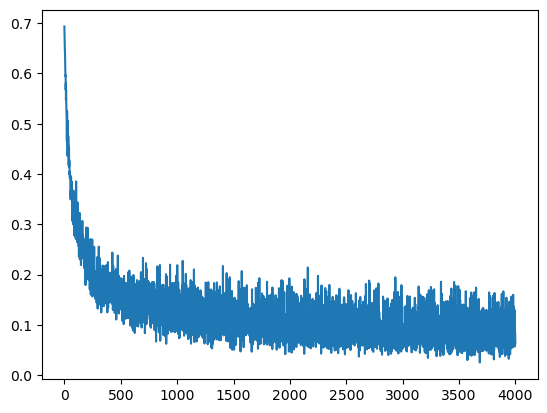

In [ ]:
def mini_batch_gd(X_train, Y_train, learning_rate, num_iter, batch_size, probability_threshold):
    # initialize weights
    weights = np.zeros(X_train.shape[1])
    bias = 0
    max_accuracy = 0
    chkptw = 0
    chkptb = 0
    accuracy = 0
    activated_output = 0
    costs = []
    epsilon = 1e-5
    nrows = X_train.shape[0]

    for i in range(int(num_iter)):
        choices = np.random.choice(nrows, replace=False, size = batch_size)
        x_train = X_train.iloc[choices]
        y_train = Y_train.iloc[choices]

        # weighted sum of inputs / weights
        weighted_sum = np.dot(x_train, weights) + bias

        # activate
        activated_output = sigmoid_activation(weighted_sum)

        # calculate error
        error = y_train - activated_output

        cost = -np.mean(y_train*np.log(activated_output + epsilon) + (1-y_train)*np.log(1-activated_output + epsilon))
        costs.append(cost)

        # adjust weights
        weights += learning_rate * np.dot(x_train.T, error)

        # adjust bias
        bias += learning_rate * error.sum()

        # calculate accuracy
        predictions = np.where(activated_output >= probability_threshold, 1, 0)
        accuracy = (predictions == y_train).mean()
        if accuracy > max_accuracy:
            max_accuracy = accuracy
            chkptw = weights
            chkptb = bias
        choices = np.random.choice(nrows, replace=False, size = batch_size)
        x_train = X_train.iloc[choices]
        y_train = Y_train.iloc[choices]

    print("Max accuracy: {:.5f}".format(max_accuracy))
    print("Accuracy: {:.5f}".format(accuracy))
    plt.plot(costs)
    plt.show()
    return chkptw, chkptb

weights, bias = mini_batch_gd(X_train, Y_train, learning_rate=0.0001, num_iter=4000, batch_size = 64, probability_threshold=0.5)

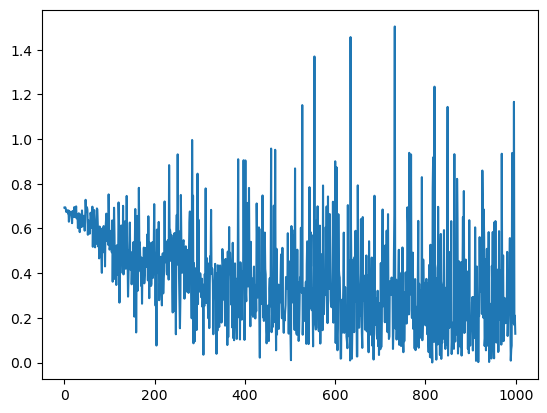

Accuracy: 0.9448818897637795


In [ ]:
def stochastic_gd(X_train, Y_train, learning_rate, num_iter, probability_threshold):
    batch_size = 1
    # initialize weights
    weights = np.zeros(X_train.shape[1])
    bias = 0
    max_accuracy = 0
    chkptw = 0
    chkptb = 0
    accuracy = 0
    activated_output = 0
    costs = []
    epsilon = 1e-5
    nrows = X_train.shape[0]

    for i in range(int(num_iter)):
        choices = np.random.choice(nrows, replace=False, size = batch_size)
        x_train = X_train.iloc[choices]
        y_train = Y_train.iloc[choices]
        # weighted sum of inputs / weights
        weighted_sum = np.dot(x_train, weights) + bias

        # activate
        activated_output = sigmoid_activation(weighted_sum)

        # calculate error
        error = y_train - activated_output

        cost = -np.mean(y_train*np.log(activated_output + epsilon) + (1-y_train)*np.log(1-activated_output + epsilon))
        costs.append(cost)

        # adjust weights
        weights += learning_rate * np.dot(x_train.T, error)

        # adjust bias
        bias += learning_rate * error.sum()

        # calculate accuracy
        predictions = np.where(activated_output >= probability_threshold, 1, 0)
        accuracy = (predictions == y_train).mean()
        if accuracy > max_accuracy:
            max_accuracy = accuracy
            chkptw = weights
            chkptb = bias
        choices = np.random.choice(nrows, replace=False, size = batch_size)
        x_train = X_train.iloc[choices]
        y_train = Y_train.iloc[choices]
    plt.plot(costs)
    plt.show()
    return chkptw, chkptb

weights, bias = stochastic_gd(X_train, Y_train, learning_rate=0.001, num_iter=1000, probability_threshold=0.5)
accuracy = compute_accuracy(X_train, Y_train, weights, bias, probability_threshold = 0.5)
print("Accuracy:", accuracy)

## LR1

Max accuracy: 0.99213
Accuracy: 0.99213


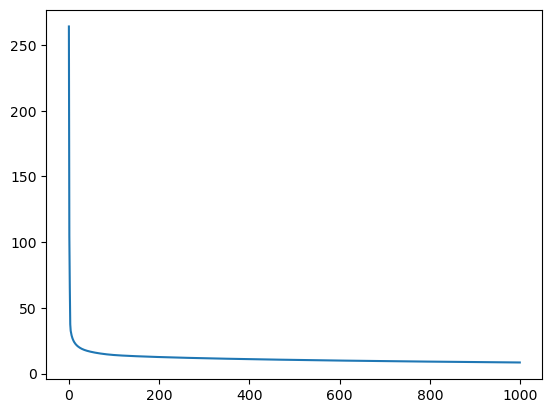

Max accuracy: 1.00000
Accuracy: 1.00000


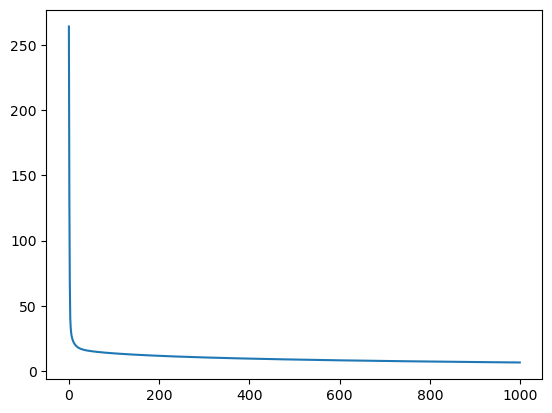

Max accuracy: 0.98425
Accuracy: 0.98425


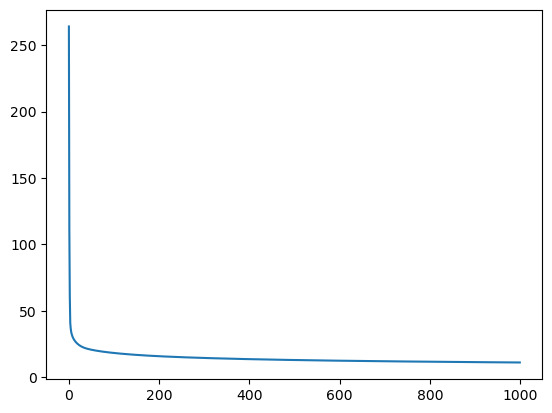

Max accuracy: 0.99213
Accuracy: 0.99213


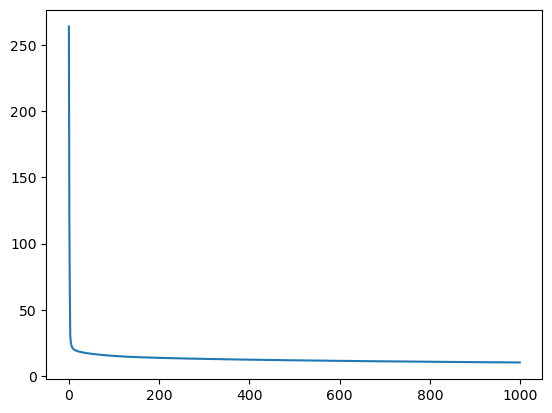

Max accuracy: 0.99213
Accuracy: 0.99213


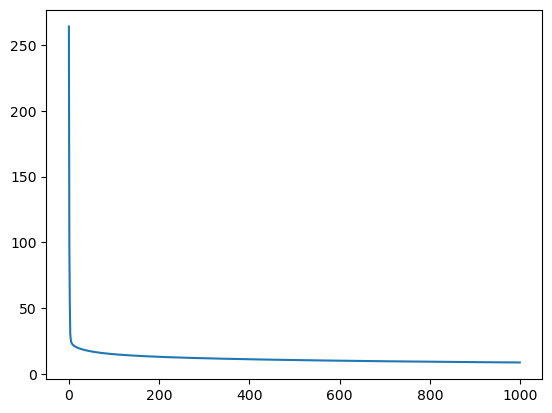

Max accuracy: 0.97900
Accuracy: 0.97638


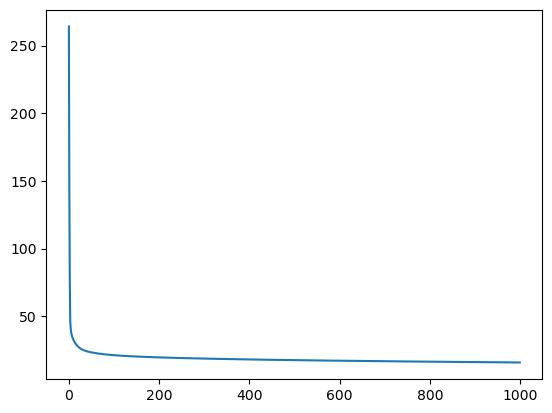

Max accuracy: 0.98425
Accuracy: 0.98425


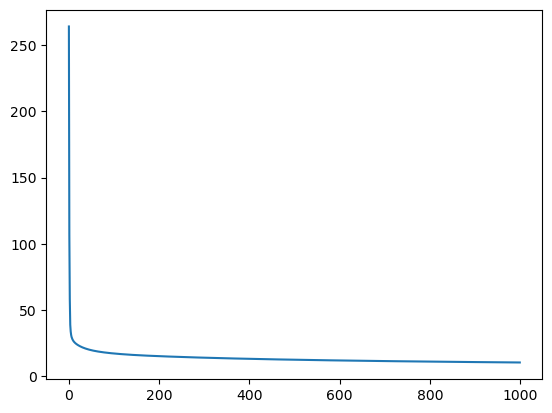

Max accuracy: 0.97900
Accuracy: 0.97638


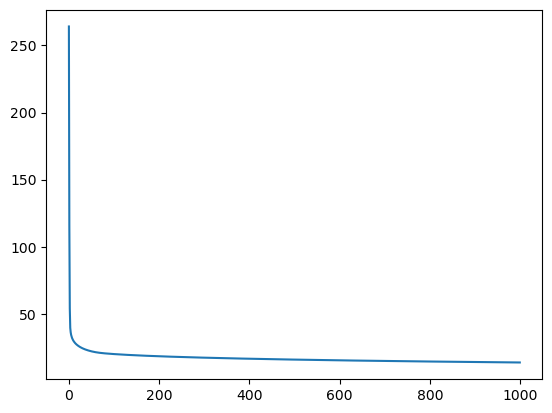

Max accuracy: 0.98950
Accuracy: 0.98950


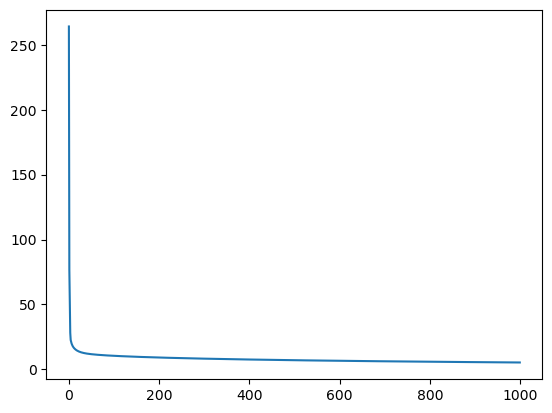

KeyboardInterrupt: 

In [ ]:
neta_list = [ 0.01, 0.001 ,0.0001]
grad =['bgd','mbgd','sgd']
thresh = [0.3,0.4,0.5,0.6,0.7]
accuracy_bgd = []
accuracy_mbgd = []
accuracy_sgd = []
max_neta_sgd = 0
max_neta_bgd = 0
max_neta_mbgd = 0
max_thresh_sgd = 0
max_thresh_bgd = 0
max_thresh_mbgd = 0
for g in grad:
    for t in thresh:
        for n in neta_list:
            average_accuracy_bgd = []
            average_accuracy_mbgd = []
            average_accuracy_sgd = []
            for i in range(10):
                # ---------------- test train split--------------------
                
                order=[]
                for i in range(len(df)):
                    order.append(i)
                shuffle = random.sample(order, int(len(order) * 0.67))

                rem = [i for i in order if i not in shuffle]
                X_train = df.iloc[shuffle]
                X_test = df.iloc[rem]
                Y_train = target.iloc[shuffle]
                Y_test = target.iloc[rem]
                # ---------------- test train split--------------------
                if g == 'bgd':
                    # def model(X_train, y_train, X_test, y_test, learning_rate, num_iter,probability_threshold):
                    weights, bias = model(X_train, Y_train, X_test, Y_test,n,1000,t)
                    average_accuracy_bgd.append(compute_accuracy(X_test, Y_test, weights, bias, probability_threshold=t))
                    max_neta = max(n,0)
                    max_thresh_bgd = max(t,0)
                elif g == 'mbgd':
                    weights, bias = mini_batch_gd(X_train, Y_train, learning_rate=n, num_iter=1000, batch_size = 64, probability_threshold=t)
                    average_accuracy_mbgd.append(compute_accuracy(X_test, Y_test, weights, bias, probability_threshold=t))
                    max_neta_mbgd = max(n,0)
                    max_thresh_mbgd = max(t,0)
                elif g == 'sgd':
                    weights, bias = stochastic_gd(X_train, Y_train, learning_rate=n, num_iter=1000, probability_threshold=t)
                    average_accuracy_sgd.append(compute_accuracy(X_test, Y_test, weights, bias, probability_threshold=t))
                    max_neta_sgd = max(n,0)
                    max_thresh_sgd = max(t,0)
            # mean 
            if g == 'bgd':
                accuracy_bgd.append(np.mean(average_accuracy_bgd))
            elif g == 'mbgd':
                accuracy_mbgd.append(np.mean(average_accuracy_mbgd))
            elif g == 'sgd':
                accuracy_sgd.append(np.mean(average_accuracy_sgd))
print("max_neta_bgd",max_neta)
print("max_thresh_bgd",max_thresh_bgd)
print("max_neta_mbgd",max_neta_mbgd)
print("max_thresh_mbgd",max_thresh_mbgd)
print("max_neta_sgd",max_neta_sgd)
print("max_thresh_sgd",max_thresh_sgd)

In [ ]:
variance_bgd = np.var(accuracy_bgd)
variance_mbgd = np.var(accuracy_mbgd)
variance_sgd = np.var(accuracy_sgd)

In [ ]:
print("Accuracy for BGD:", accuracy_bgd)
print("Variance for BGD:", variance_bgd)
print("Accuracy for MBGD:", accuracy_mbgd)
print("Variance for MBGD:", variance_mbgd)
print("Accuracy for SGD:", accuracy_sgd)
print("Variance for SGD:", variance_sgd)

Accuracy for BGD: [0.9595744680851064, 0.9691489361702128, 0.9664893617021277, 0.9654255319148938, 0.973936170212766, 0.9718085106382979, 0.9675531914893618, 0.975, 0.977659574468085, 0.9670212765957448, 0.971276595744681, 0.975, 0.9622340425531917, 0.9707446808510639, 0.9648936170212765]
Variance for BGD: 2.423670841506937e-05
Accuracy for MBGD: [0.9638297872340426, 0.9686170212765959, 0.9345744680851065, 0.977127659574468, 0.9707446808510639, 0.9563829787234042, 0.9771276595744682, 0.9680851063829788, 0.9670212765957448, 0.975531914893617, 0.977659574468085, 0.9664893617021277, 0.9680851063829788, 0.9696808510638298, 0.9547872340425533]
Variance for MBGD: 0.00011570846536894501
Accuracy for SGD: [0.9595744680851064, 0.8547872340425533, 0.3718085106382979, 0.9670212765957448, 0.926595744680851, 0.5143617021276596, 0.9776595744680853, 0.9585106382978724, 0.9361702127659577, 0.973936170212766, 0.9494680851063831, 0.8159574468085108, 0.95, 0.9122340425531913, 0.6803191489361702]
Variance

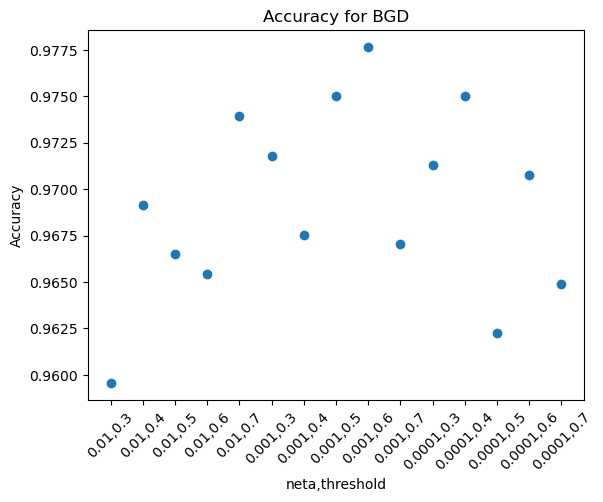

In [ ]:
plt.ylabel('Accuracy')
# scatterplot
neta_list = [ 0.01, 0.001 ,0.0001]
thresh = [0.3,0.4,0.5,0.6,0.7]
plt.scatter(range(0,15),accuracy_bgd)
_ =[]
for i in neta_list:
    for j in thresh:
        _.append(str(i)+","+str(j))
plt.xticks(range(0,15),_)
plt.xticks(rotation=45)
plt.title('Accuracy for BGD max of {:.3f} at ({},{})'.format(max(accuracy_bgd),max_neta_bgd,max_thresh_bgd))
plt.xlabel('neta,threshold')
plt.title('Accuracy for BGD')
plt.show()


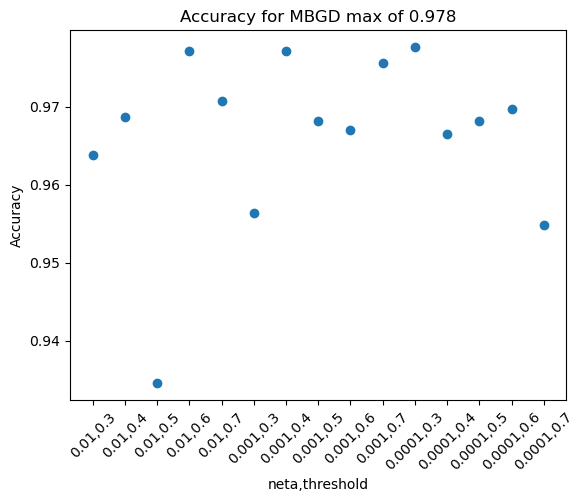

In [ ]:
plt.ylabel('Accuracy')
# scatterplot
plt.scatter(range(0,15),accuracy_mbgd)
_ =[]
for i in neta_list:
    for j in thresh:
        _.append(str(i)+","+str(j))
plt.xticks(range(0,15),_)
plt.xticks(rotation=45)
plt.xlabel('neta,threshold')
plt.title('Accuracy for MBGD max of {:.3f}'.format(max(accuracy_mbgd)))
plt.show()


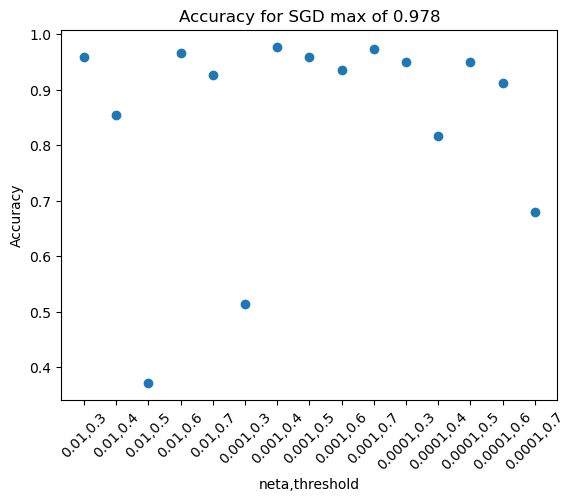

In [ ]:
plt.ylabel('Accuracy')
# scatterplot
plt.scatter(range(0,15),accuracy_sgd)
_ =[]
for i in neta_list:
    for j in thresh:
        _.append(str(i)+","+str(j))
plt.xticks(range(0,15),_)
# increase space in y axis
plt.xticks(rotation=45)
plt.xlabel('neta,threshold')
plt.title('Accuracy for SGD max of {:.3f}'.format(max(accuracy_sgd)))
plt.show()


## LR2


Max accuracy: 0.99213
Accuracy: 0.99213


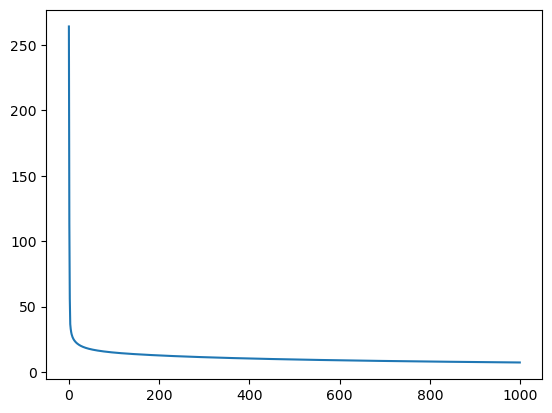

Activated Output [0.00162733 1.         0.00000064 0.0000001  0.00000001 0.01681343
 0.0004493  0.         0.96006712 0.00082818 1.         0.00000001
 0.00002473 0.00006548 0.00015297 0.99999961 0.99997552 0.
 0.         0.00007341 0.00000005 1.         1.         1.
 0.00013393 0.0220623  0.00004533 0.00001574 0.         0.02024937
 0.00141391 0.00414066 0.         0.00003191 0.99999734 1.
 1.         0.         0.00000002 0.06678987 0.00000009 0.99999199
 0.00000469 0.         0.01139242 0.00025873 0.00000001 0.0002098
 1.         1.         1.         1.         0.00036136 0.00000197
 0.00003904 0.99999999 0.1205168  0.37353255 0.00000115 0.99999109
 0.00294897 0.99999967 0.         0.09151422 1.         1.
 0.00000003 0.99587729 0.00000492 0.0000001  0.00000001 0.00001005
 0.99998348 1.         0.14334613 0.99999998 1.         1.
 0.00000513 0.00375945 0.00000008 0.00000001 0.00000002 0.00000463
 0.00000002 1.         0.00000003 0.         0.00011637 0.0000828
 0.00024209 0.003410

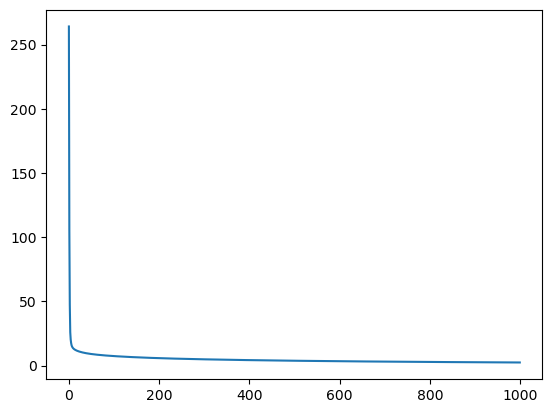

Activated Output [0.         0.         1.         0.99999999 1.         1.
 1.         0.00000085 0.         0.99999637 0.         0.00073932
 0.97887118 0.         0.00002849 0.00000062 0.         1.
 0.00000413 0.         0.         0.99624088 0.99999456 0.
 0.         0.         0.         0.83240581 1.         0.
 1.         0.00000463 0.         0.         1.         1.
 1.         0.         0.00038708 0.96978838 0.00000748 0.99999982
 0.         0.00007323 0.17738387 0.99919295 0.90395822 0.
 0.         0.         0.         1.         0.         0.99983174
 0.         0.         0.         0.04842174 1.         0.00002834
 1.         0.00009431 0.         0.         0.00000433 0.00000203
 0.         1.         0.00000002 1.         0.00002924 0.00307296
 0.99831322 0.94316211 0.99999999 1.         0.         1.
 1.         0.         0.         1.         1.         0.00119822
 1.         0.00000049 0.02628101 1.         0.99996818 0.
 0.         0.         0.00000007 0.      

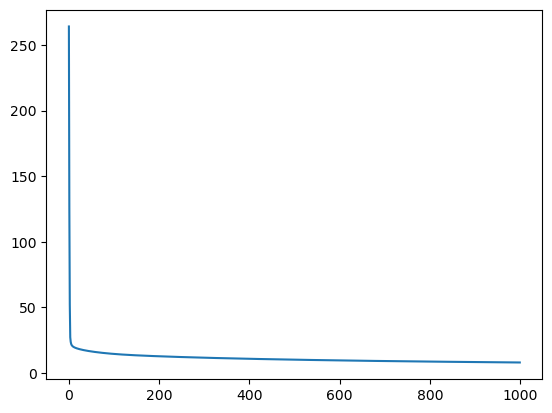

Activated Output [0.00073091 0.         0.00019439 0.         0.99894111 0.00053546
 0.99999993 0.00000015 1.         1.         1.         0.
 1.         0.00001262 0.         0.01726468 1.         0.
 0.00000003 0.         0.79796285 1.         1.         0.00000001
 0.00000013 0.42233638 0.07821587 0.         0.99999756 0.
 0.99999961 0.00000024 0.00000105 1.         0.         0.
 0.99999996 0.         1.         0.00000007 1.         1.
 0.99999874 1.         1.         0.99995244 1.         0.00123077
 0.00001656 0.00000019 1.         0.         0.00006787 0.00002887
 0.         0.06122455 0.00017351 0.8325132  1.         0.00000372
 0.00042249 0.         0.03845817 0.99999988 0.00000005 0.00003479
 0.         0.00000004 0.00000001 0.00097663 1.         0.
 0.00000022 0.00000017 0.95324668 1.         0.00000001 0.00005438
 0.         1.         0.0000007  0.00000241 0.00000344 0.026492
 1.         1.         0.00000009 0.         1.         0.99438954
 0.00000741 0.00000001 0.999

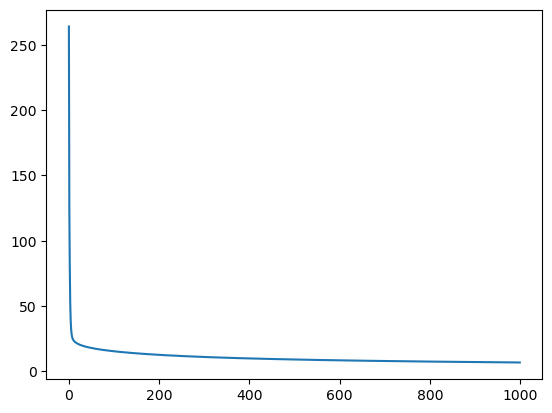

Activated Output [1.         0.99999998 0.00000018 0.         0.00001947 0.99999706
 0.00436587 0.         0.0000027  0.         0.00001083 0.88681865
 0.00001451 0.9999999  0.99985688 0.00000009 1.         0.00228347
 0.99999925 1.         0.00000135 0.00000015 0.00026888 1.
 0.00000055 0.99397092 0.99999815 0.99996935 0.         1.
 0.         0.         0.         0.         0.0003749  0.99999975
 0.00041075 0.00021935 1.         0.00272731 0.99999984 0.00000193
 0.00000219 0.00000044 0.99999823 0.00075322 0.00000058 0.44253634
 0.00000022 0.0000023  0.00000001 0.02777797 0.00000286 0.99999832
 1.         0.0000395  0.         0.         0.00034472 0.00000029
 0.00009535 0.09815946 0.00004214 0.00000099 1.         0.00000001
 0.00143542 0.99999984 0.99999995 1.         0.1200546  0.0121908
 1.         1.         0.00426062 0.00000245 0.03282522 0.00000269
 0.00000113 0.00234692 0.00002308 0.00030719 0.08938618 1.
 1.         0.00000144 0.00000351 1.         0.99999966 0.00001307
 0.

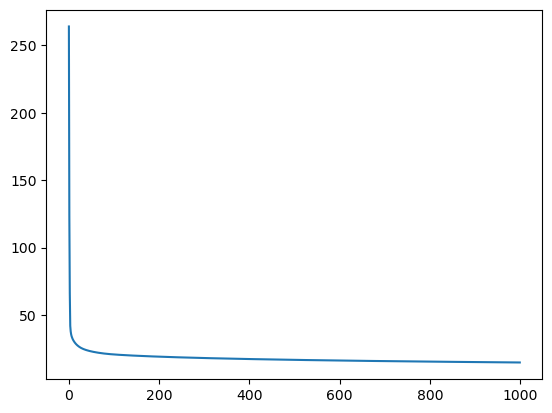

Activated Output [0.00011038 0.99999999 0.00002959 0.1019948  1.         0.67587862
 0.00007164 1.         0.00293882 0.99998113 1.         0.
 1.         1.         0.         0.99999271 0.         0.00000029
 0.00016531 1.         0.00000024 0.00218899 0.         0.00337583
 0.00010942 0.00000102 0.00003075 0.00000127 0.00000877 0.00000005
 0.00022695 0.00001694 1.         0.03207399 0.99999998 0.00001639
 0.02222854 0.000044   0.00486647 0.00012909 0.99999247 0.00001321
 0.00162496 0.00000025 0.00000005 0.0000001  0.00000012 1.
 0.00000001 0.99946539 0.         1.         0.0018413  0.00000013
 0.00000024 0.00003474 0.12425952 1.         0.00384932 0.99938562
 0.9292299  0.99986074 0.00004015 0.00099454 0.25046929 0.0000001
 0.12646008 1.         0.00076985 0.00001276 0.00359163 0.16206744
 0.00000961 0.00007311 1.         1.         0.00000003 1.
 0.0000015  0.00000004 0.9094692  0.         0.00000314 1.
 0.00000065 0.00002716 0.00000196 0.0000015  0.1312578  0.00017025
 0.00421043

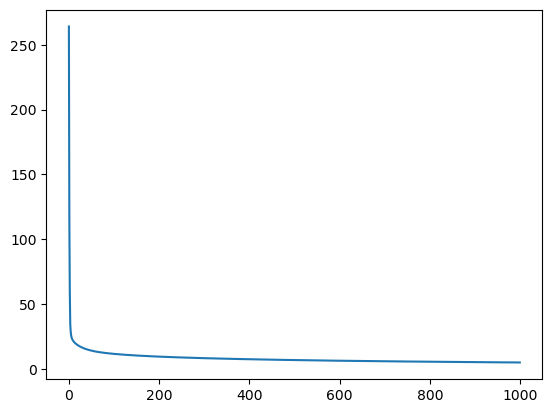

Activated Output [0.         0.         1.         1.         0.00008123 0.
 0.0000002  0.         0.         0.68166309 0.         0.98413627
 0.99970535 0.         1.         0.         0.99221337 0.00013244
 0.00000047 0.00257759 0.99814442 0.         0.99999997 0.99999974
 0.00000001 0.99784435 0.00005185 1.         0.00565613 0.99999999
 0.         1.         1.         0.00463959 0.00000453 0.9999846
 0.99999769 0.         0.00001529 0.06216925 0.0413975  0.09699582
 0.         0.00000021 0.99999975 0.00021649 0.         1.
 0.00199831 0.99999992 0.         0.0000005  0.99991982 0.00000005
 0.00056133 0.         0.         0.         0.         0.98724062
 1.         1.         0.99999985 0.99999999 0.00000498 0.00235656
 0.         0.00000276 0.00072339 0.         1.         0.
 0.         0.         0.99999981 0.00000003 0.         0.00000019
 1.         1.         0.         0.00001535 0.00008745 0.99970315
 1.         1.         1.         0.         0.99999983 0.
 0.03679103

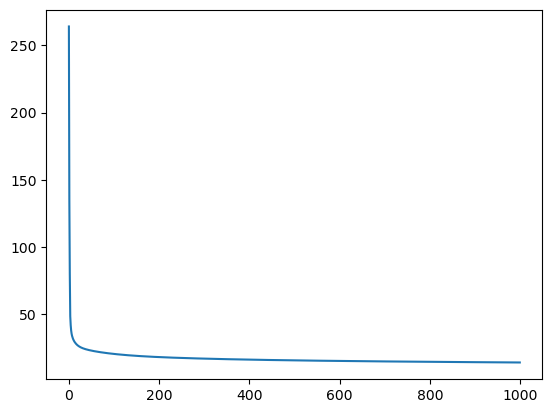

Activated Output [0.00000253 1.         0.09632532 0.00003879 0.56084457 1.
 0.04711736 0.00001233 0.00001024 1.         1.         1.
 1.         1.         1.         1.         0.00006218 0.00001493
 0.00085455 0.00185281 1.         0.00004423 0.88965227 1.
 1.         0.00000001 0.0001738  1.         0.0000461  0.00000004
 0.00000294 0.00000075 1.         1.         1.         1.
 1.         0.99997154 0.00000016 0.99999999 0.00189516 0.00006658
 1.         0.0133268  0.00000011 1.         0.00026359 0.00000392
 0.00002909 0.00421185 0.99874666 0.99999996 0.53852177 0.00336063
 0.00000813 0.00000123 0.00000623 1.         1.         0.
 0.00002099 1.         0.61795075 0.99999927 0.21484094 0.00000001
 0.99988448 1.         0.10862878 0.         0.00000001 0.00000018
 0.0000002  1.         0.00000659 0.00000005 0.99999995 0.00000006
 0.91581323 1.         0.99566589 0.16431418 1.         0.00000069
 0.00000066 0.00156544 0.00000148 0.         0.00001751 0.9999971
 0.99999997 0.00001

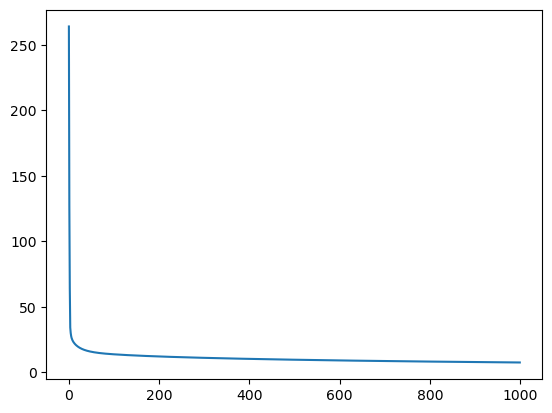

Activated Output [0.00000031 0.00005253 0.99999972 0.         1.         0.
 1.         1.         0.         0.00000006 0.99999997 0.28979143
 0.00015783 0.99999838 0.10252953 0.99992762 0.         0.9999573
 0.00013775 0.99999989 0.00000042 0.00651045 0.         0.00000684
 0.99999997 0.16483819 0.00004754 0.00017673 1.         0.00000291
 0.99998903 1.         0.00941852 1.         0.         0.
 1.         0.00000057 0.         0.00002101 0.00022472 1.
 0.         0.00019399 0.99991859 1.         0.         0.00234737
 0.00003535 0.00000048 0.00000016 1.         0.00000608 0.00006804
 0.00042583 1.         0.         0.00038469 0.02094415 0.00000091
 0.00000084 0.00000027 1.         0.00057615 0.00003344 1.
 0.00000013 1.         0.99724823 1.         0.99999235 0.0000001
 0.04352077 0.99999356 0.00003701 0.99389186 0.00037638 1.
 1.         0.99999996 0.00000002 0.         0.73269598 0.0000747
 0.00000015 0.00000005 0.00000002 0.         1.         0.
 1.         0.         0.0000

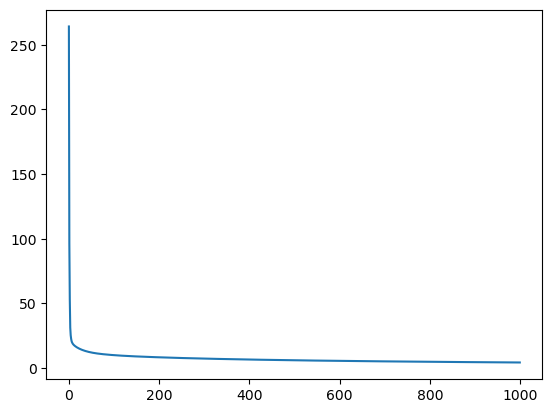

Activated Output [1.         0.00051601 0.00002498 1.         0.         0.0002838
 0.00001957 0.99994245 0.00000004 0.99999982 0.         0.
 0.         0.00006713 0.         0.         1.         0.
 0.00000012 0.         1.         0.00000036 0.00002534 0.
 0.00000292 0.         0.         0.00000006 1.         1.
 0.05229062 0.00000002 1.         0.         1.         0.
 0.         0.00000123 0.9999844  1.         1.         0.
 1.         0.99887837 0.00001581 1.         0.         0.00002399
 0.99984252 0.99999994 0.00000018 0.00000017 0.99367796 0.
 0.00148164 0.0000293  0.00207691 0.0000042  0.         0.00002903
 0.99999627 0.00000979 0.00133809 0.00000063 0.         1.
 0.         0.00000059 1.         0.99999762 0.00859729 0.
 0.         0.         1.         0.         0.         0.00009349
 0.00022343 0.9999977  1.         1.         0.         0.
 0.00005783 0.00000004 0.99998625 0.         0.         0.
 1.         1.         1.         1.         1.         1.
 0.00000

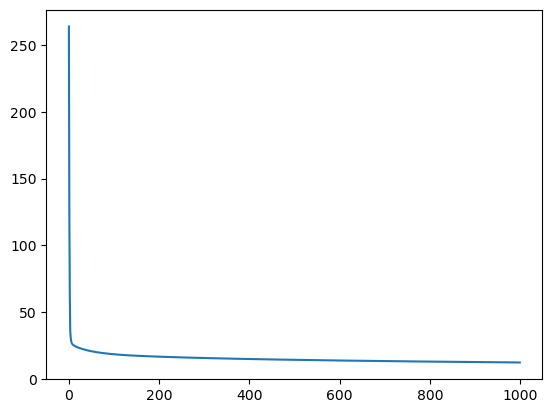

Activated Output [1.         0.00001261 0.00000909 0.00024934 0.99990656 0.0000097
 0.02161886 0.00597954 0.00000023 0.00000046 0.99999988 0.00000038
 0.00000006 0.00000004 0.00026579 1.         0.0038498  0.99546203
 0.97233321 0.88312062 0.00000257 0.06083589 0.99999905 0.99737602
 0.99999996 1.         0.99992456 0.00000099 0.00000184 0.99999996
 0.99718146 0.01067636 0.26222365 0.00011372 0.99999999 1.
 0.04828969 0.9999997  0.00033127 0.00000626 0.04022068 0.21128936
 1.         0.67599345 0.00000013 0.00000196 1.         0.00032048
 0.97167337 1.         1.         0.00000049 0.00000002 0.00009029
 0.00000001 0.99616322 0.1441002  0.99995305 0.06576727 0.00000001
 1.         0.00063747 0.00026443 0.00805159 0.00928506 0.00268198
 0.00000122 0.08964459 0.17067944 1.         0.00000068 0.99999996
 0.0000003  0.00030774 0.00000952 0.00004787 0.05777156 0.99999746
 1.         1.         0.0168     0.03947373 0.00156201 0.01550564
 0.89335213 0.99999756 0.00003218 0.99999623 0.9998720

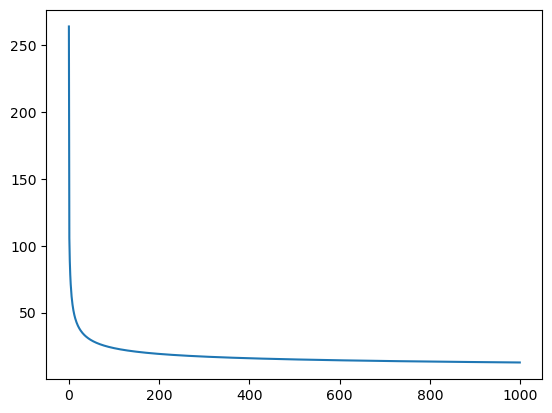

Activated Output [0.00202466 0.0000043  0.99973229 0.00000146 0.00000067 1.
 1.         0.00001541 0.00000046 1.         1.         0.99999992
 0.98919206 0.00317498 0.99999832 0.99999858 0.03519291 0.00006514
 0.99995392 0.00707801 0.00006268 0.0001087  0.99996752 0.00198002
 1.         0.00018139 0.00000033 1.         1.         0.99999186
 0.00000757 0.00000379 0.99992566 0.00004633 0.00000001 0.00002769
 0.00362851 0.00004678 1.         0.00003299 0.00000011 0.05530207
 0.00000056 0.88496328 0.99999991 0.00022694 0.01827933 0.04355791
 0.         0.99980581 0.99997991 0.97411501 1.         1.
 1.         0.00001123 1.         0.00000004 0.00000803 0.00000001
 0.00010092 0.00016634 0.00004445 0.00000161 0.         0.00000364
 1.         0.99872841 0.76595625 0.00719284 0.94419808 0.00000006
 0.0249659  0.00000004 0.99998688 0.0000317  0.00000406 0.82637413
 0.79445198 0.00012584 0.00664998 1.         0.01777754 0.00000581
 0.00018484 0.00000514 0.99999284 0.99612324 0.04527369 1.
 0

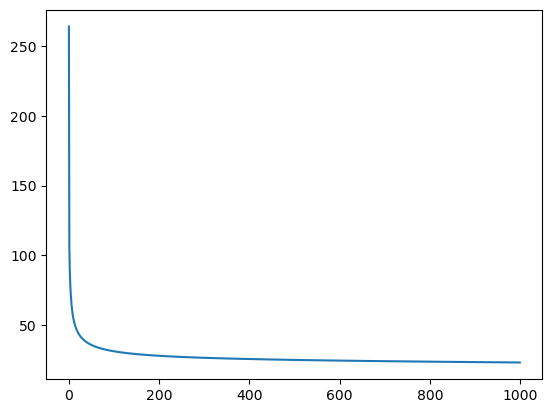

Activated Output [0.00023213 0.00037615 0.25382166 0.00029216 1.         0.00000217
 0.00040164 0.00001389 0.00001601 0.99980206 0.00002421 0.00050888
 0.00119149 0.16797791 0.00676116 0.00146777 0.00003503 0.00228331
 0.04609076 0.99998942 0.00073335 0.55718336 0.02476937 0.98154109
 0.02752727 0.99877061 0.00000139 0.02948044 0.39875553 0.01618306
 0.99868178 0.00000855 0.67053199 0.00175054 0.99951322 1.
 0.00000001 0.0001087  0.00067933 0.00034562 0.00117192 0.13951029
 0.00080891 0.1247667  0.00008434 0.0000049  0.99397703 0.00064339
 0.99999846 0.03371335 0.00115636 1.         0.04275715 0.98059223
 0.00000505 0.00204118 0.00000308 1.         0.94906324 0.99999958
 0.00757252 0.1333765  0.99999981 0.00000469 0.00105032 0.00388686
 0.99999838 0.04150357 0.80766661 0.01118832 0.01142544 0.9999996
 0.00000009 0.99999581 0.00064565 1.         0.99999993 0.00014978
 1.         0.00011278 0.00009458 1.         1.         0.00081529
 0.04092302 0.96505472 0.00002189 0.99988241 0.6525036

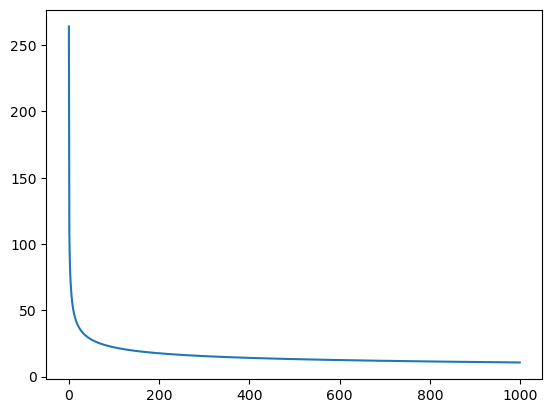

Activated Output [0.00000217 0.99807302 0.00026863 0.00047457 0.00004281 0.0000273
 0.00000042 0.99998708 0.00751778 0.00000013 0.00054779 0.000006
 1.         0.0000027  0.00007866 1.         0.00003312 0.00000006
 0.00000097 0.         0.02498372 0.00000024 0.00000089 0.00000098
 1.         0.00001548 0.00005729 0.00000005 0.02931995 0.00001001
 0.99999963 0.00000003 0.02765513 0.         0.00018113 0.99848245
 0.05513859 1.         0.00689153 0.00000002 0.00000497 0.9996703
 0.00002832 0.00034051 0.00000056 0.00008453 0.979281   0.00144606
 1.         0.99998729 0.99916407 0.99991779 0.87154293 0.00037377
 0.0000028  1.         0.00000571 0.00000036 0.99973972 0.98938383
 0.00477626 0.00011447 0.00001327 0.99989417 1.         0.9794903
 0.00018849 0.01329218 1.         0.00001166 0.00000002 0.00001978
 0.00004988 0.99998321 0.9998851  0.99999999 0.00889822 0.99999999
 0.00002775 0.0666268  0.00000077 0.22999711 1.         1.
 0.9999244  0.00008141 1.         0.00711969 0.98078351 1.

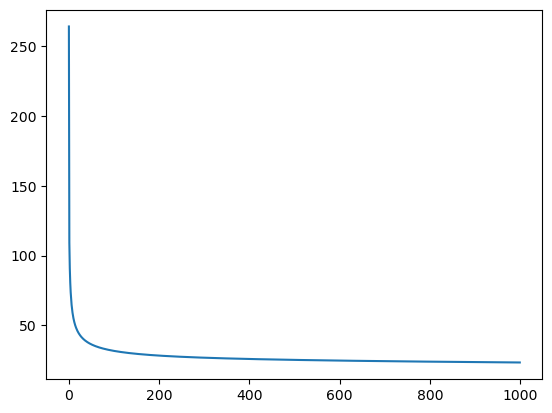

Activated Output [0.99964013 0.10151119 0.00000399 0.21464902 0.02882484 0.00006306
 0.99970944 0.0000417  0.00079493 0.00034475 0.02447703 0.02939151
 0.89537348 0.99999928 0.9501756  0.00132134 0.98266351 1.
 0.99892184 0.00000188 1.         0.44160906 0.99999906 0.99999991
 0.10002579 0.99936381 1.         0.00000845 0.99999996 0.00000005
 0.99841108 0.00386651 0.14628623 0.99999997 0.00000273 1.
 0.23110994 0.99999649 0.17247479 0.53508608 0.99999999 0.33196594
 0.0270056  0.01139384 0.00025913 0.03650136 0.00555759 0.99999996
 0.27836896 0.98956694 0.99974287 0.0001741  0.99983641 0.00001009
 0.6756786  0.00019967 0.99999962 0.99999978 0.00110531 0.00025889
 0.34344333 0.99999326 0.84316601 0.0001372  0.00000461 0.00001259
 0.99999996 0.00651338 1.         0.91050117 0.00000014 0.00086553
 1.         0.00000028 0.00001283 0.00116566 0.04167547 0.0096794
 0.00937083 0.00001149 0.00004285 0.71560533 0.00124038 0.67473856
 0.17374407 0.93924104 0.8933272  0.9998918  0.00000004 0.9904

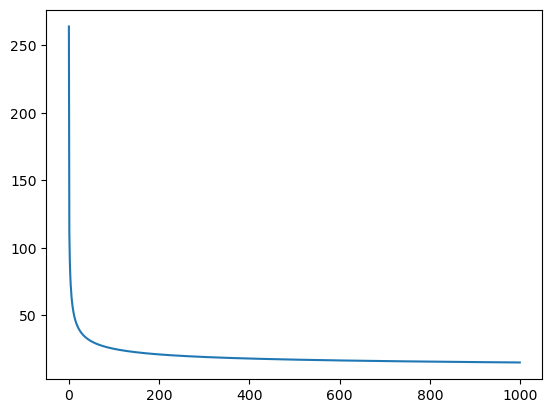

Activated Output [0.00000732 0.00000194 0.02781389 0.99961365 0.15882302 0.00000033
 0.00000013 0.00040471 0.99985049 0.24783391 0.00000132 0.99988837
 0.9999998  0.00001819 0.99860093 0.00293869 0.02002268 0.00282511
 0.00000001 1.         0.99963137 0.85287131 0.99998715 0.000158
 0.00145764 0.         1.         0.11509638 0.0682275  0.00086924
 0.99999999 0.00000113 0.00000521 0.99999999 0.97860014 0.1463689
 0.99995083 0.00163195 0.00000086 1.         1.         0.00000004
 0.00038599 0.00008664 0.00000091 0.00762344 0.00000996 0.99997123
 0.77162713 0.00000029 0.         0.00012371 0.00083458 0.999999
 0.9977775  0.02482944 0.00003751 0.99966859 0.00000768 0.00846448
 0.00005146 0.99974091 0.1247779  0.00085852 1.         1.
 0.99990104 0.00000953 0.84843907 1.         0.00072985 0.99999999
 0.00001515 0.02681318 0.00000972 0.00426576 0.00384744 1.
 0.53993957 0.00000913 0.00010124 0.99999298 1.         0.00001065
 0.0000057  0.00323314 0.98992946 0.99816495 0.01625647 0.99999998

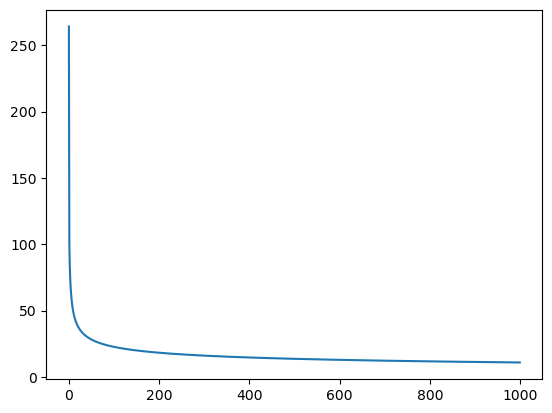

Activated Output [0.03128119 1.         0.00006022 1.         0.00000007 1.
 0.00000014 0.00094604 0.00000049 1.         0.9998065  0.
 0.00137234 0.00026654 0.99999955 0.00002493 0.00000033 0.00027727
 0.98615563 1.         0.00021822 0.00000113 0.98387178 0.00662497
 0.9715824  0.99794375 0.11042057 0.00000138 0.0019629  0.95588667
 0.99999998 1.         0.9999994  0.99960148 0.99853006 0.89207295
 0.00191724 0.00000982 0.00085953 0.00297961 1.         0.99580963
 0.99999999 0.0042236  0.02229754 0.0000462  0.00000044 0.99999935
 0.99998537 0.99972672 0.99999999 0.         1.         0.00001585
 0.0080066  0.00000004 0.00023042 0.00000381 0.00258714 0.00000722
 0.00001045 0.01482937 0.99928284 0.00110073 0.0000003  0.00009771
 0.00043357 0.00000044 0.99999944 0.         0.00466935 1.
 0.99486726 0.99999841 1.         0.0027272  0.0002112  0.00000023
 1.         0.16466237 0.0006641  0.00062871 0.99999052 0.99999876
 0.00020314 0.00000613 0.00000007 0.97966346 0.0055657  0.00186596
 0

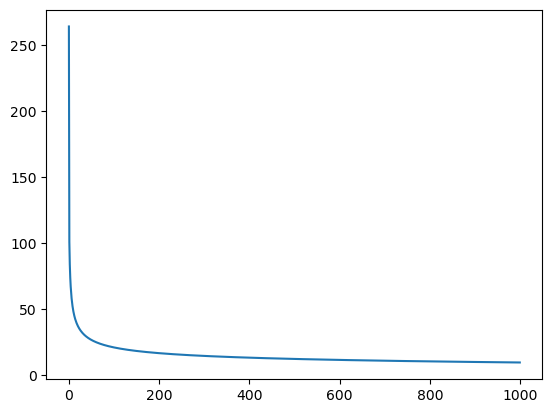

Activated Output [0.00000788 0.00239655 0.99813316 0.00002723 0.00226191 0.00109198
 0.01918364 0.00013559 0.00015021 0.0035425  0.00006861 0.99942608
 0.00230301 1.         0.07234702 0.96635375 0.00000196 0.00000009
 0.0048825  0.00003781 0.00000454 0.00022614 0.00412198 0.02416324
 0.00215729 0.99999999 0.99976328 0.60536415 0.00013842 0.00068218
 0.00009392 0.00003938 0.0000004  0.00010641 0.00011936 0.99054332
 0.00000001 0.00004181 1.         0.00002494 0.0062533  0.92433849
 0.0000035  0.99959477 0.00166502 0.99999999 0.99931156 0.99999612
 0.00001098 0.00000406 0.99953827 0.00092728 0.99998605 0.99999289
 0.99892724 0.99921142 0.00000498 0.00035758 0.00434697 1.
 0.00055215 0.04005132 0.99991827 1.         0.99999963 0.99999999
 0.00000008 0.00045213 0.00004412 0.00003012 0.99999544 0.99999997
 0.00000413 0.00000537 0.9999986  0.00088498 0.0017309  0.08085015
 0.02084834 0.9999118  0.9999996  0.00000186 0.00002034 0.01006135
 0.00009867 0.00593403 0.00000259 0.90890442 0.999827

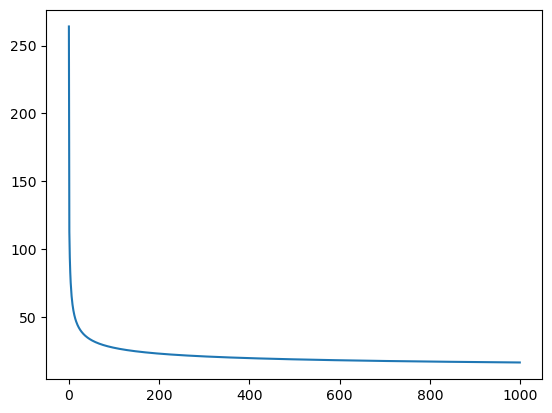

Activated Output [0.63117512 0.9999469  0.00000353 0.99999993 0.00000137 0.99993594
 0.00000093 0.9998237  0.08255358 0.9998478  0.0050122  0.00000345
 0.99956175 0.00000076 0.00000549 0.0000053  0.9983734  0.00000062
 0.00326762 0.99998574 0.00001175 0.99993061 0.00001574 0.00000052
 0.00011962 0.00000001 0.00441394 0.00010999 0.00207878 0.00020196
 0.00497629 0.99999991 0.99917769 0.05057802 0.00000278 0.
 0.00000033 0.00815582 0.00000239 0.00628448 0.00000008 0.99999992
 0.99070676 0.00077576 0.00105787 1.         0.14578032 0.0026569
 0.99914544 0.99999999 0.00000407 0.99999988 1.         1.
 0.07053182 0.99886909 0.0000073  1.         0.00000017 0.85561042
 0.00033184 0.00038659 0.24537988 1.         1.         0.99999661
 0.99998517 0.85488258 0.00000643 0.99998925 0.00008649 0.99997227
 0.03983807 0.79462279 1.         0.00001017 0.9999871  0.99999999
 0.00299087 0.99999959 0.00050206 0.00104234 0.01945689 1.
 0.32510545 0.0000185  0.99999938 0.0568397  0.00003567 0.85913739
 0.

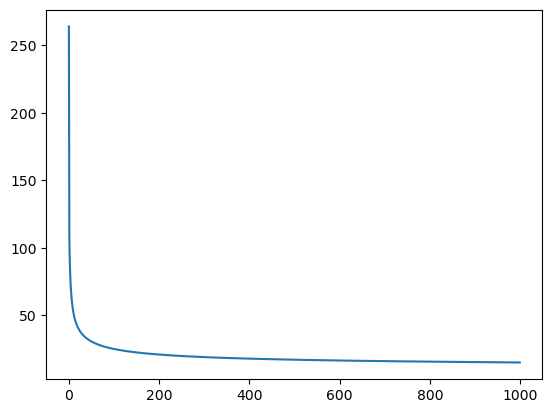

Activated Output [0.00000781 0.99999998 0.00491778 0.99999547 0.00000007 0.99999959
 0.00001462 0.2694382  0.74486345 0.00002689 0.00006182 1.
 0.00669654 0.00000133 0.01088528 0.0000016  0.09698926 0.99999981
 0.99011905 0.00000064 0.00043222 0.00000924 0.11162414 0.35205973
 1.         0.0000476  0.80735339 0.00004176 0.00013252 0.00000097
 0.06550655 0.00585416 0.00108248 0.99999389 0.00017968 0.0045621
 0.0000014  0.00176266 0.00061646 0.04371193 1.         1.
 0.00000053 0.00015493 0.99999999 0.9999994  0.3634524  0.99999999
 0.00000017 0.12495621 0.99999989 0.99966424 0.32480592 1.
 0.00019367 0.00000016 1.         0.00009899 0.9999992  0.99981582
 0.0000335  0.99999999 0.99999939 0.03991602 0.00000005 0.05646904
 0.00000057 0.007432   0.00320831 0.00004089 0.00212046 0.00000156
 0.00117114 0.99868027 1.         0.06150737 0.00003332 0.00000087
 0.00000003 0.00119896 0.00000001 0.98991809 0.00001709 0.99545592
 0.00000003 1.         0.00004826 0.24441568 1.         0.0000007
 0.1

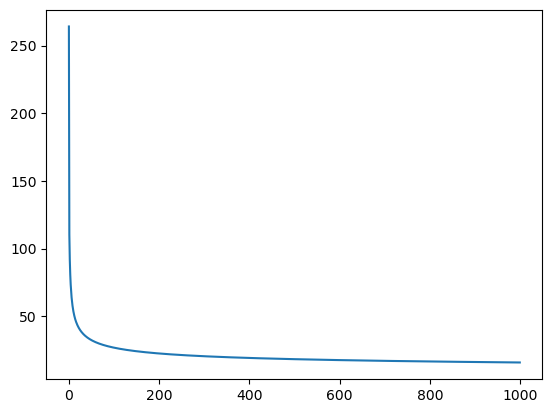

Activated Output [0.99996671 0.98289799 0.00000007 0.00021569 0.00002684 0.00403076
 0.00000702 0.19607674 0.06661611 0.00000507 0.99999996 0.00020036
 0.9830273  0.00000036 0.59575195 0.99999999 0.99994282 0.9015509
 0.99999993 0.00073865 0.99963757 0.00003433 0.00041005 0.99999999
 0.00401686 0.98912565 0.00002508 1.         0.99999973 0.18300298
 0.00017223 0.00000064 0.00002188 0.         0.99999613 0.00001024
 0.00353487 0.9999107  0.99948279 0.00000372 0.00009426 0.00772103
 0.99999917 0.99859437 0.00524911 0.99984957 0.00072253 0.03451226
 0.0006818  0.0000461  0.99999983 0.99934682 0.00022823 0.02683624
 0.26748802 0.00011254 0.00000011 0.00014661 1.         0.03532177
 0.00000222 0.00017563 0.00000102 0.00000671 1.         0.99981781
 0.99192107 0.0452339  0.00778708 0.00002407 0.00000006 0.00119401
 0.00000192 0.91754124 0.99999998 1.         0.00193535 1.
 0.00005727 1.         0.99999992 0.00057107 0.0000208  0.09184843
 0.00005502 0.99931261 0.99669433 0.99056143 0.0869145

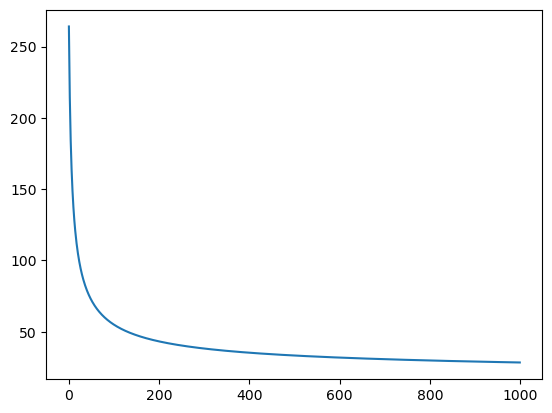

Activated Output [0.00251122 0.99827522 0.99998643 0.01546522 0.97973131 0.11122101
 0.99569977 0.99827692 0.02361546 0.00011445 0.00125424 0.02558106
 0.99887655 0.00860562 0.0010212  0.00443025 0.00897772 0.99858427
 0.01685805 0.01999489 0.01249936 0.01122403 0.00119839 0.99612948
 0.10405583 0.21647157 0.95322244 0.99993986 0.99999988 0.1817433
 0.00037206 0.9863104  0.85678976 0.00492137 0.14167872 0.00046253
 0.99963731 0.99998564 0.9999963  0.00016377 0.0218178  0.03058218
 0.00280422 0.00093134 0.00545421 0.99753912 0.0176888  0.70034564
 0.0237839  0.00268513 0.00104959 0.00032325 0.0573828  0.00341575
 0.00760888 0.00075886 0.999863   0.8837401  0.9998577  0.34048188
 0.16896136 0.00100813 0.00172928 0.16027156 0.00355203 0.04645666
 0.99995584 0.05330032 0.00157108 0.99849954 0.99999385 0.02476079
 0.99999812 0.50763754 1.         0.9999945  0.1609102  0.99996772
 0.34856455 0.00094787 0.00051144 0.99938525 0.00002072 0.0285717
 0.99999844 0.99967022 0.99993446 0.00006242 0.

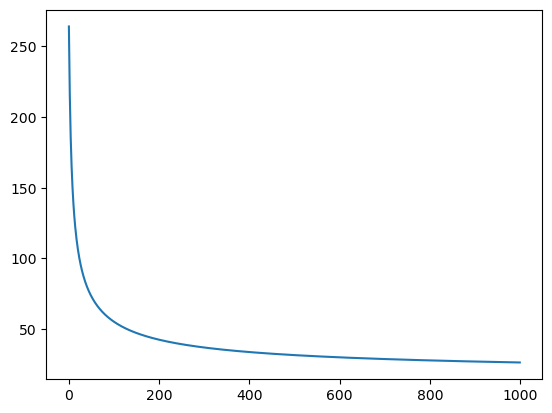

Activated Output [0.0020396  0.00266896 0.11456143 0.0004249  0.01585811 0.74582778
 0.04335399 0.0032817  0.00051026 0.00000682 0.00049913 0.99994508
 0.01565245 0.00233356 0.99999114 0.00236718 0.08013787 0.9974998
 0.00053945 0.02582783 0.9999632  0.0815587  0.00545005 0.14954551
 0.27710309 0.99998616 0.99900792 0.00013662 0.99997188 0.00150701
 0.00143999 0.00084017 0.02280646 0.70052361 0.00015978 0.0018512
 0.00372801 0.02331191 0.99987474 0.99947215 0.00297717 0.8884686
 0.00016014 0.08419368 0.98505064 0.01018494 0.03621448 0.02319645
 0.99999303 0.01494361 0.00728134 0.0002445  0.00005871 0.99878168
 0.99971664 0.03197462 1.         0.00175088 0.01094565 0.00885264
 0.00414117 0.027129   0.0083096  0.9053506  0.04654181 0.10968319
 0.01734415 0.01454404 0.00507521 0.00251341 0.99937611 0.00299156
 0.54649069 1.         0.000356   0.99999781 0.00180845 0.99813336
 0.98694201 0.04074194 0.00046768 0.32664074 0.00020918 0.05153014
 0.99944836 0.23076809 0.00237236 0.00390702 0.4

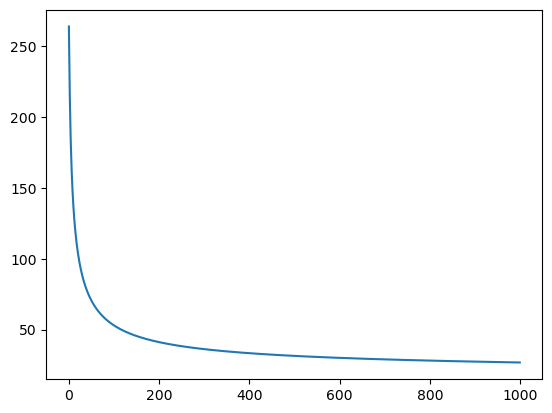

Activated Output [0.93853874 0.98941437 0.00238791 0.0007232  0.99999986 0.0957616
 0.99999999 0.00014279 0.02808041 0.25260629 0.00006868 0.02141323
 0.99996225 0.36221833 0.00364262 1.         0.99996579 0.0020195
 0.83607273 0.99969489 0.56165997 0.01001129 0.99968363 0.98891302
 0.00010898 0.00806514 0.99998083 0.02041093 1.         0.01938282
 0.00784497 0.00002917 0.00190855 0.9819538  0.00430436 0.94363694
 0.91825257 0.99999753 0.16969221 0.00680695 0.30360554 0.44165566
 0.00001676 0.00298057 0.0049352  0.99697015 0.00192375 0.00032124
 0.00011775 0.99935496 0.00026109 0.13337337 0.00608784 0.87569469
 0.01334851 0.00013553 0.99163278 0.10986142 0.04405005 0.00254703
 0.98702476 0.71258807 0.0059148  0.06170516 0.00039007 0.35343886
 0.11625614 0.00078488 0.00596784 0.03742975 0.00140154 0.01180838
 0.05798335 0.99999079 0.00106796 0.99484194 0.00135433 0.16025325
 0.02921275 0.1291038  0.00270684 0.3443905  0.99999882 0.87777621
 0.00213952 0.99530307 0.49612542 0.00838453 0.

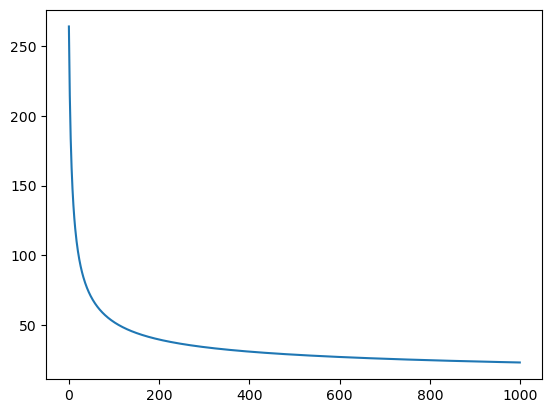

Activated Output [0.00405126 0.75513985 0.00233287 0.89948314 0.01844904 0.99999293
 0.00004322 0.15439869 0.99965068 0.02200611 0.95209317 0.99735667
 0.01077107 0.00236106 0.00082799 0.00293906 0.00377258 0.99998733
 0.24387064 0.00011626 0.99994844 0.01591802 0.00001455 0.94338555
 0.98339032 0.99992908 0.00034278 0.94247051 0.99999878 0.0488535
 0.9999647  0.0081362  0.98580959 0.00594992 0.99332377 0.26606912
 0.47197433 0.00384812 0.00024518 0.00347927 0.00077494 0.00016745
 0.00799633 0.00010603 0.99894686 0.00083148 0.98214001 0.01137938
 0.75245046 0.95781963 0.95140899 0.0061014  0.9144724  0.00368042
 0.0011268  0.00018096 0.25589229 0.00357564 0.00178679 0.0050292
 0.00086688 0.0523374  1.         0.00049524 0.00175767 0.93969977
 0.0017761  0.99999581 0.001078   0.05360487 0.00174935 0.00025786
 0.99997157 0.00013552 0.65644908 0.00044778 0.0160659  0.44133393
 0.00179194 0.99848702 0.00294008 0.00007776 0.0001246  0.98545931
 0.00194082 0.00272445 0.14315867 0.01382599 0.

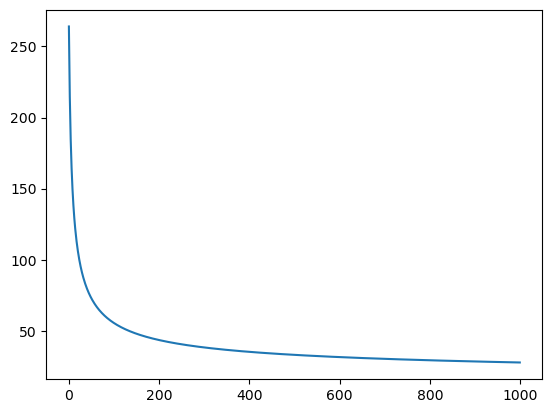

Activated Output [0.00651978 0.00315699 0.00289396 0.0002548  0.00248004 0.99997553
 0.04470779 0.58600665 0.00042512 0.00068481 0.99999566 0.09594911
 0.03328811 0.00054902 1.         0.00302266 0.22547899 0.86033234
 0.80517221 0.00058592 0.01143394 0.00030274 0.00211835 0.99999589
 0.98756586 0.23767741 0.0945389  0.99999057 0.00077204 0.00252301
 0.00370138 0.02786109 0.99442895 0.00674034 0.94348394 0.1181801
 0.00002643 0.02825413 0.01357881 0.02553914 0.00868119 0.99999906
 0.15498446 0.99999716 0.00873419 0.98357188 0.05590876 0.00577018
 0.99987978 0.95779736 0.00035433 0.00515952 0.00074673 0.00290594
 0.00032487 0.00002647 0.99999984 0.00072262 0.99999998 0.01975095
 0.00031655 0.93989328 0.99993653 0.291116   0.00212514 0.99998162
 0.00000587 0.99999974 0.02552621 0.00489602 0.99998041 0.00009375
 0.65230961 1.         0.05510397 0.0024517  0.0003661  0.01856636
 0.01572585 0.99878768 0.9999916  0.00025145 0.02708147 0.00104569
 0.01511189 0.00450254 0.00465539 0.07778315 0

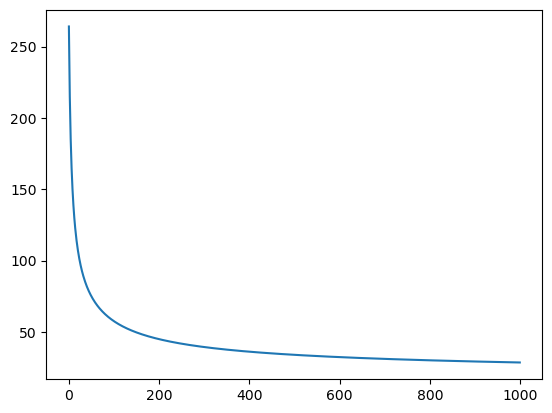

Activated Output [0.98948619 0.00584718 0.00385139 0.99451515 0.08345764 0.01364933
 0.86314136 0.03282965 0.9867745  0.00813045 0.96442788 0.00085911
 0.00116558 0.99904309 0.00056218 0.99075501 0.99993085 0.53520098
 0.00408415 0.00188964 0.99973192 0.00065716 0.99999957 0.99999537
 0.95402253 0.59230037 0.98300913 0.00028339 0.80620159 0.99999999
 0.00262032 0.9847526  0.98521364 0.00104612 0.99993572 0.96092633
 0.00403959 0.99667445 0.00001301 0.13578131 0.00246637 0.00304529
 0.10331027 0.99994899 0.13527634 0.05783465 0.00070649 0.95272023
 0.9738823  0.00013258 0.9999987  0.00120607 0.01313722 0.01532798
 0.00903093 0.04365242 0.00733756 0.00976602 0.02797238 0.00805261
 0.92846976 0.00001372 0.04414088 1.         0.99927969 0.99999981
 0.99992287 0.00014777 0.01513973 0.02586303 0.05786248 0.15454836
 0.00072249 0.96005704 0.00633883 0.00206096 0.01135212 0.52111659
 0.9999918  0.00288385 0.99997495 0.00046171 0.00004982 0.96735023
 0.67508865 0.00017869 0.00001241 0.34695687 

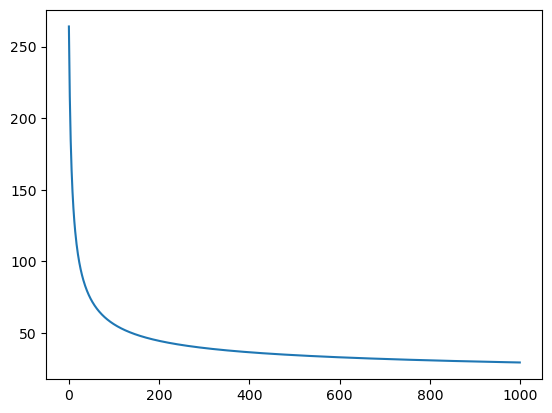

Activated Output [0.66775399 0.01929047 0.25206923 0.01849856 0.99999891 0.99670958
 0.08741316 0.99999315 0.99796918 0.25964053 0.99998037 0.00359454
 0.99503473 0.83184046 0.99979478 0.00657587 0.05664041 0.00448308
 0.00031119 0.00436056 0.2232339  0.00352878 0.99999007 0.99948943
 0.66355355 0.00029674 0.999861   0.29738921 0.99770727 0.94684892
 1.         0.0044093  0.94375292 0.02078754 0.08414093 0.20970271
 0.00246799 0.98658268 0.20351399 0.0126499  0.00493296 0.0002138
 0.00025367 0.99924107 0.08259624 0.95574476 0.01191782 0.97520147
 0.08209301 0.99976505 0.006996   0.0052865  0.9999998  0.99392586
 0.04185705 0.99082372 0.99994543 0.99861679 0.99687733 0.00112142
 0.00394302 0.01664896 0.00154632 0.49335395 0.96250147 0.99597322
 0.00017558 0.00093644 1.         0.99991161 0.00010145 0.99999986
 0.0022273  0.00000608 0.00012293 0.99998634 0.99996145 0.00021639
 0.01517062 0.00273565 0.99999803 0.9870436  0.09056963 0.00010357
 0.14996916 0.15169531 0.0009195  0.00900931 0

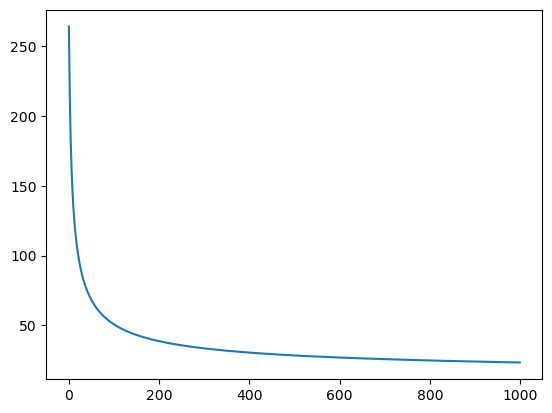

Activated Output [0.01357897 0.97889435 0.99991555 0.00011319 1.         0.03283574
 0.07780182 0.6736543  0.00973445 0.0171451  0.00014157 0.9998946
 0.00010785 0.00052134 0.99983874 0.00183122 0.00005234 0.00521793
 0.00012137 0.02677839 0.1321175  0.96186489 0.99999998 0.00139333
 0.96783872 0.99813353 0.03729462 0.13503285 0.06198847 0.02510667
 0.99903995 0.99999745 0.00015993 0.00122835 0.0928911  0.02493232
 0.02625534 0.00170655 0.99654191 0.99997882 0.00211762 0.99999672
 0.79802475 0.01837785 0.00072289 0.94814295 0.99999868 0.14719935
 0.99969114 0.04307924 0.0000161  0.99966021 0.00313429 0.01384993
 0.87810015 0.00037609 0.00001098 0.00007422 0.00207786 0.99978797
 0.1960414  0.00019274 0.98360783 0.99999877 0.00461015 0.00037413
 0.46825813 0.00800748 0.9999884  0.00075276 0.0112592  0.00137774
 0.99990787 0.99995217 0.02460661 0.70753931 0.99700137 0.29763824
 0.00035933 0.023315   0.98588126 0.02107251 0.01388593 0.01669897
 1.         0.0025513  0.99516586 0.00021304 0

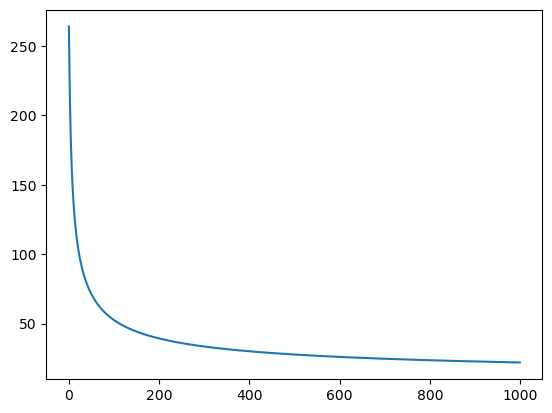

Activated Output [0.00430447 0.01633606 0.00127565 0.99562584 0.00003893 0.01362653
 0.00150232 0.13882533 0.99960091 0.66185781 0.00136043 0.00447623
 0.02453052 0.00049264 0.00412639 0.00003724 0.99754639 0.00007172
 0.03227765 0.00075389 0.00506489 0.99999963 0.96955138 0.99636822
 0.00044611 0.00018666 0.00001533 0.09255532 0.04308913 0.99997336
 0.00004853 0.00149346 0.00010664 0.00207962 0.99999964 0.00449631
 1.         0.98729156 0.99998803 0.0015062  0.00014302 0.93162817
 0.00024058 0.99042661 0.21634327 0.00009662 0.95350104 0.00004543
 0.04287423 0.02310885 0.17180151 0.03819365 0.00388429 0.00876406
 0.00000241 0.03595211 0.99868154 0.00035217 0.90852761 0.01388805
 0.69603648 0.12720853 0.00006614 0.00409978 0.99997329 0.02017681
 0.99999818 0.05393343 0.00367409 0.14341405 0.00071619 0.99991803
 0.98582739 0.02938505 0.0023471  0.99910212 0.00011341 0.25416672
 0.00124787 0.00018119 0.00687287 0.01265727 0.9833736  0.11677973
 0.00077284 0.00018715 0.01059391 0.00244935 

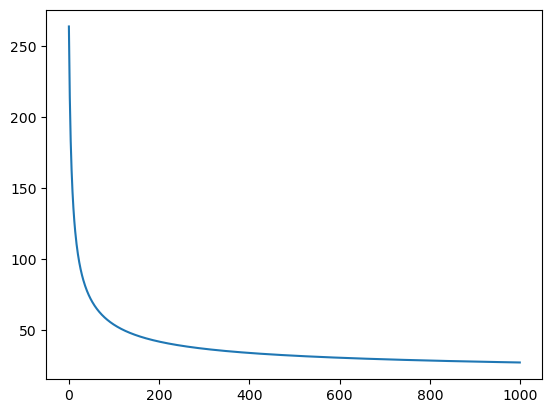

Activated Output [0.93883129 0.01220188 0.00012113 1.         0.29671495 0.00105567
 0.9957283  0.99732288 0.0023741  0.94770741 0.93357243 0.00033017
 0.38432423 0.00249988 0.32192365 0.11394693 0.74723451 0.00703001
 0.07328244 0.00493861 0.00106132 0.09498065 0.91719338 0.00020372
 0.99990185 0.97577229 0.00054909 0.00139934 0.99870002 0.99999995
 0.13768394 0.11103847 0.01213784 0.99324251 0.98501707 0.99886142
 0.00001385 0.95499997 0.00325694 0.99992886 0.99997809 0.00002596
 0.00157919 0.00071033 0.99945328 0.00518218 0.00282569 0.00011606
 0.00466173 0.00446584 0.00186007 0.0000706  0.00781157 0.00262326
 0.02545537 0.00591983 0.00095018 0.00002396 0.99998728 0.30820974
 0.99934851 0.02059411 0.92701189 0.97789041 0.99999796 0.00720612
 0.57837566 0.12276594 1.         0.99985388 0.00249787 0.06696334
 0.00021138 0.81670336 0.99963882 0.00052154 0.00271776 0.0279647
 0.13650622 0.99999987 0.000367   0.00207117 0.99993369 0.00041022
 0.00174548 0.01112974 0.99998504 0.00084052 0

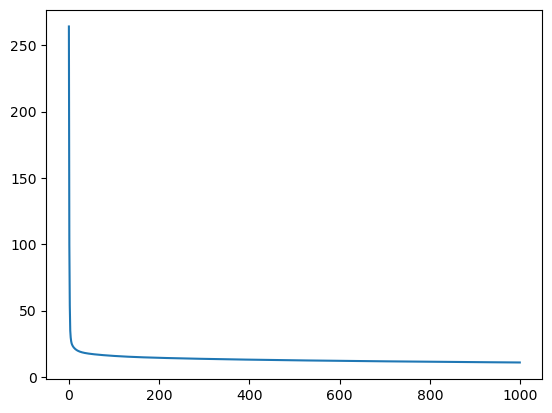

Activated Output [0.00000628 0.00006229 0.99974749 0.00000002 0.00000066 0.05944214
 1.         0.00111991 0.99996643 0.         0.00000762 1.
 1.         0.00000053 0.         0.99999795 0.99371999 0.00041982
 0.91861271 0.00000561 0.00676745 0.         1.         0.9999825
 0.0000001  0.00000008 0.00001089 1.         0.00003124 1.
 0.00015382 0.00171181 1.         0.12124484 0.00000009 0.00000003
 1.         0.99972674 1.         0.59793883 0.00624009 1.
 1.         1.         1.         1.         1.         0.9840142
 0.10044807 0.         0.00027019 0.00000119 0.00000567 1.
 0.99657136 0.00000844 0.00000103 0.00016208 0.         0.
 0.00000522 0.00384639 0.99999993 0.00005921 0.00028986 0.0000007
 1.         0.00000001 0.00000066 0.00063938 0.00000107 0.84182114
 0.00004218 1.         0.00000001 0.         1.         0.00000046
 1.         0.9998891  1.         0.99999999 1.         1.
 0.00001208 0.48685704 0.00438991 0.99999972 0.00002634 0.
 0.00000008 0.99958088 0.         1. 

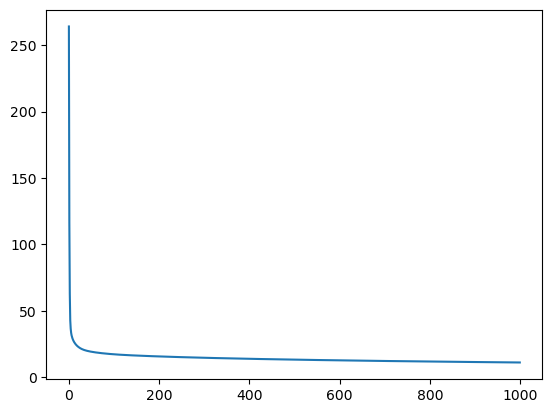

Activated Output [1.         0.00001202 0.22865217 0.99990862 1.         0.00000063
 0.00175013 1.         1.         0.00324399 0.         0.00000002
 0.         1.         0.99999998 0.36150904 0.00000084 0.80671175
 1.         0.00000408 1.         0.00027115 0.99999999 0.00000107
 0.34120796 0.99821756 0.99999395 0.21595383 0.         0.00002215
 0.20806945 0.00000044 0.99999948 0.00001045 0.00000073 0.85565254
 1.         0.00001167 0.07966202 1.         0.00293115 0.07616655
 0.99999999 0.58862477 0.         0.02039785 0.00000098 1.
 0.         0.00000016 1.         0.00020549 0.00000017 0.00000136
 0.00266899 0.         1.         1.         0.00002631 0.00000628
 0.99995848 0.94490518 0.         0.00109635 0.00002298 1.
 0.00000751 0.00000014 0.         0.00000135 0.00000071 0.00003938
 0.00000004 0.99946167 0.00000002 0.00034901 0.0000011  0.13401459
 0.00092722 1.         0.00000548 1.         0.00000293 0.99999969
 1.         0.00344199 0.00035028 0.         0.         0.000

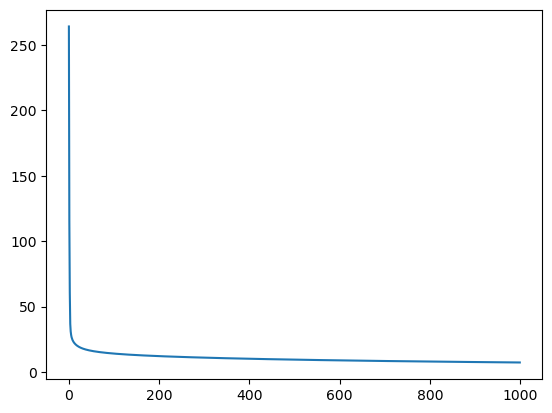

Activated Output [0.17310735 0.99999248 1.         0.0000012  0.00002029 0.99994859
 0.         0.00032575 0.00004234 0.0000001  0.         0.
 0.0012337  0.         0.0900072  0.00000073 1.         0.99995845
 0.01335614 0.000002   0.00000001 0.         0.93928283 0.00857421
 0.         0.00000001 0.17850229 1.         0.00000204 0.00000038
 0.0000035  0.         0.         0.00000935 0.         0.04445587
 0.68209631 0.00000012 0.         1.         0.99999837 0.00014131
 0.00000007 0.00000639 0.99999981 0.         0.00000159 0.
 1.         0.00000413 1.         1.         1.         0.00002238
 0.03002915 0.99999999 0.0000009  0.00166571 1.         0.
 0.28124269 1.         0.00000013 0.0000002  0.00321647 0.
 1.         0.71377876 0.         0.00330563 0.99999995 0.00000031
 0.00002267 0.         0.00012544 0.00011677 0.         1.
 1.         0.00000563 0.00000017 0.00000083 0.0007979  0.03580843
 0.00030937 1.         0.03390719 1.         0.99999695 1.
 0.99999999 0.99275947 0. 

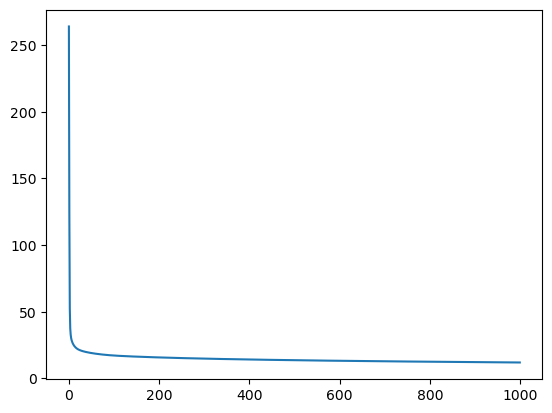

Activated Output [0.9999755  0.05682208 0.0043991  0.00428893 1.         0.02509124
 1.         0.93143223 0.00000027 1.         0.99949469 0.00381543
 0.00000051 0.00000023 0.00000012 1.         1.         0.00586671
 1.         0.00000044 0.00000001 0.00020981 0.00001749 0.00113108
 0.00016541 0.99999992 0.00000428 0.05110217 0.00001612 0.00042314
 0.98370778 0.95559262 0.99999989 0.00018271 0.99992346 0.09963267
 1.         0.00001928 1.         0.99999999 0.99999618 0.00002932
 0.04476905 0.99999972 0.         0.         0.99957705 0.00004817
 0.00000108 0.96593868 1.         0.99998203 0.99897898 0.99999996
 0.00009457 0.13202811 1.         1.         0.00580674 0.02935007
 0.00354508 0.09370779 0.00000028 0.00036422 0.99999033 0.
 0.99996033 0.99990258 0.00003187 0.00000902 0.02882207 0.00003929
 0.000291   0.         0.99373316 0.99832133 0.05677728 0.00000001
 0.99999979 0.00000825 0.99999994 1.         0.99979739 0.00001396
 0.02362169 0.00000345 0.99998904 0.00000143 0.000000

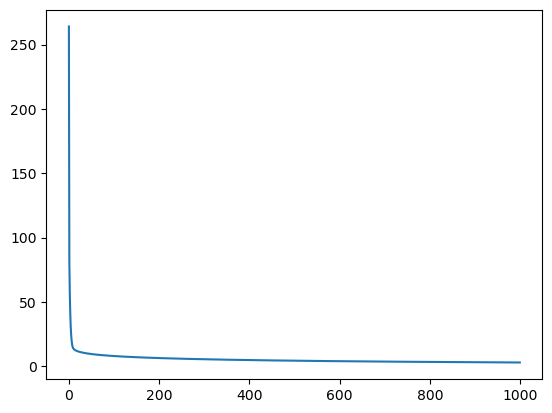

Activated Output [0.00000482 0.00000006 0.01390968 0.         0.9999803  0.00000001
 0.         0.99999998 1.         0.         0.00011134 1.
 1.         1.         1.         0.00310987 0.         0.00004494
 0.15402412 1.         0.00011949 0.00000002 0.00000002 0.
 0.         0.         0.00000172 0.         0.         0.
 1.         0.         0.         1.         1.         1.
 0.70557943 0.         0.88347604 0.         0.30169261 1.
 0.99999994 0.         0.14414901 0.96905591 1.         0.00000322
 0.         0.99993143 0.         0.00000003 1.         0.99963371
 0.00000486 0.00001001 0.00000331 0.99999983 0.         0.00002138
 1.         1.         0.00001358 0.00000002 0.9999997  0.98440592
 0.99999989 0.02313228 1.         1.         1.         0.99999996
 1.         0.         0.0000008  1.         0.00000011 0.01373839
 0.         1.         1.         0.         1.         0.00000002
 0.00002623 0.         1.         0.00566165 1.         0.
 1.         1.         0. 

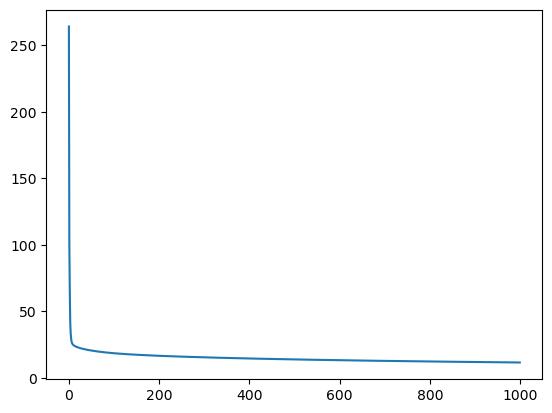

Activated Output [0.99999902 0.00603685 0.8209147  0.79516287 1.         0.99313278
 0.00015788 0.         0.99999999 0.00000623 0.         0.00004158
 1.         0.00001922 0.0000243  0.00204743 1.         0.99999999
 0.00001671 1.         0.00167483 0.00051386 0.0105512  0.00000009
 0.00000007 0.96482359 0.00169657 0.00084883 0.99999727 0.00169231
 0.2290678  0.         0.         0.01549257 0.99999688 0.99998468
 0.96414839 0.79706078 1.         0.00000001 0.00001225 0.99999472
 1.         0.00000335 0.99999807 0.99879353 0.00000001 0.99927785
 0.18262118 0.00019123 0.99992626 0.         0.00000001 0.99999986
 0.00000883 0.00118354 0.00271196 1.         0.00000001 0.00000006
 0.00000006 0.0007189  1.         0.00000186 0.         0.00000011
 0.         0.00000026 1.         0.00041697 0.99982434 0.
 0.00000005 0.01291918 0.00502984 1.         0.         1.
 0.00000019 0.00137371 0.77914754 0.99999804 1.         0.01017625
 0.00000001 1.         0.2376102  1.         1.         1.
 0

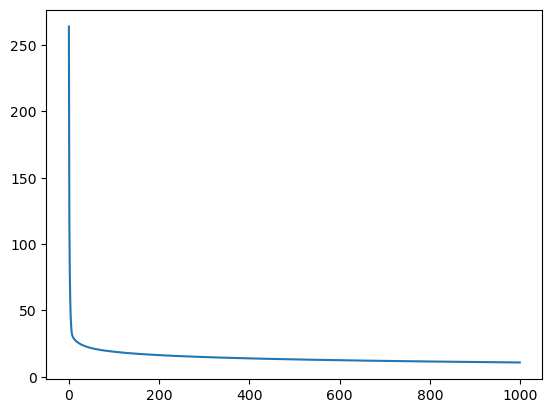

Activated Output [0.99991443 0.9105237  0.         0.96724718 0.00006825 0.99020856
 0.24855029 0.00012608 0.00000008 0.01620382 0.00000064 0.9992217
 0.00906998 0.9012414  0.01260811 0.         0.00001305 1.
 0.99999514 0.99999879 0.         1.         1.         1.
 0.00000001 0.00000027 0.00000247 0.00000718 0.99991753 0.
 0.99989186 1.         0.82871389 0.00000003 0.00000336 0.0000028
 0.00018397 0.99998607 0.         0.00000017 0.00000013 1.
 0.00000252 0.99999973 0.00052476 0.85874459 0.99985425 0.00007528
 0.00011414 0.42975821 1.         0.10884544 0.00000184 1.
 0.         0.         0.99966727 0.00010656 0.00000009 1.
 0.00000001 1.         1.         0.00000278 0.00000005 0.0056684
 0.00417345 0.00000213 0.         0.99922322 0.00000095 0.99999999
 1.         0.0832965  0.0000015  1.         0.00004571 1.
 0.00011877 0.00000162 0.99999999 0.00000002 1.         0.00002474
 0.01122869 0.99999243 0.00000803 0.00004327 0.0193241  0.00000102
 0.00000001 0.         1.         0.9

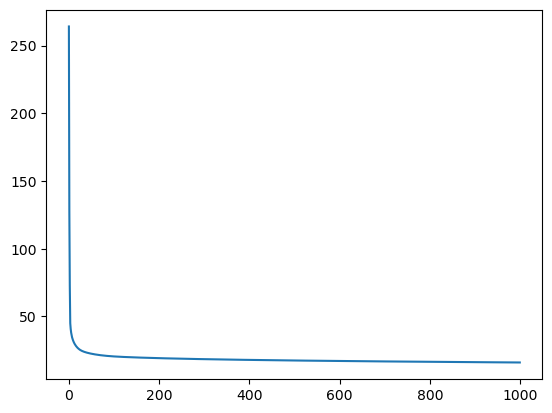

Activated Output [0.00006077 0.63177251 0.00069174 0.00000055 0.         0.00697602
 0.99999999 1.         0.00000218 0.00000299 1.         0.00001452
 0.99999978 0.00045008 1.         0.01513494 0.00037142 0.00056482
 0.00000512 0.08194726 0.94598274 0.0015269  0.99998942 0.99980233
 0.00000007 0.0000001  1.         0.99999998 0.00009876 0.00003226
 0.01814706 0.00000257 0.99981076 0.00000018 0.77286617 0.01284688
 1.         0.00000487 0.00000427 1.         1.         0.9999981
 0.00000003 0.36974985 0.06969485 0.0000052  0.00021269 0.00000024
 0.00023264 0.99999996 1.         0.00002961 0.23079132 1.
 0.03122492 0.99920493 0.0001195  0.00012177 0.00000233 0.00016461
 0.99995944 0.9999903  0.91668762 0.00000006 0.99997674 0.00001729
 0.00000001 0.00000764 0.00354691 0.00000634 0.99988977 0.00000676
 1.         0.00150046 0.00000153 0.99999219 0.00750234 0.0006572
 0.00000017 1.         0.00000035 0.00299364 0.00000001 0.00002759
 0.05455298 0.99995518 0.02597415 1.         0.0788599 

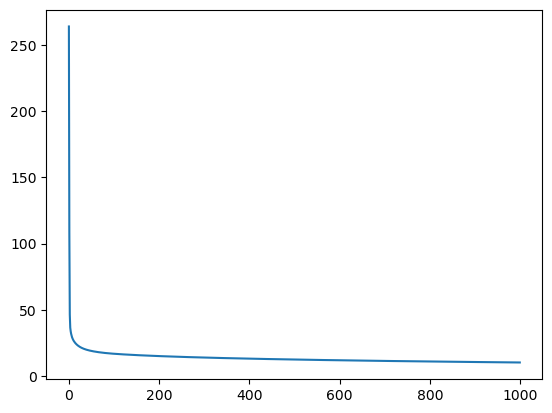

Activated Output [0.00001136 1.         0.31892683 0.99987298 0.88931765 0.0000001
 0.26985365 1.         1.         0.00880879 1.         1.
 0.07688122 0.00242092 0.91800281 0.4280205  0.00000443 1.
 1.         1.         0.00000069 0.         0.4205957  0.
 1.         0.         0.00000027 0.00000002 0.00021788 0.12511536
 0.         0.00107539 0.00392005 1.         0.0829446  0.00017091
 0.98768225 0.00000006 0.99999836 0.00000002 0.99386692 0.
 0.99999977 0.00006098 1.         0.         0.00003612 1.
 0.00063223 0.         0.00000847 0.99999136 0.05196487 0.
 1.         1.         0.00000132 0.00000001 1.         0.12706544
 0.00000003 1.         0.0001067  1.         0.00000075 0.00383055
 0.18229376 1.         0.40191661 0.         1.         0.00000139
 0.9967313  0.00287008 0.         0.44416256 0.00029938 0.99963037
 1.         1.         0.00000387 0.15592048 1.         0.99999984
 0.00036633 0.99999998 0.         1.         0.83430784 0.
 0.00000394 0.04039999 1.         1

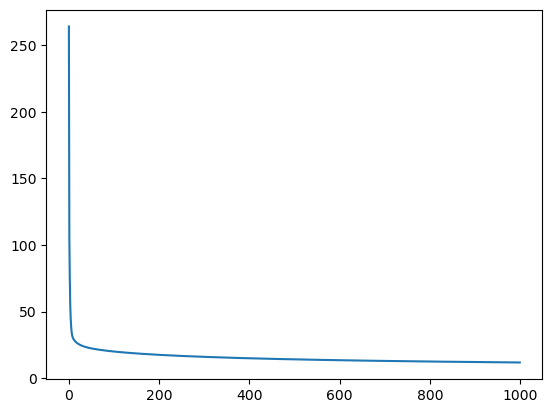

Activated Output [0.00000022 0.01464109 0.00000013 0.00504501 0.00004892 0.99999995
 1.         0.0000047  0.99999999 0.96893733 0.00002186 0.
 1.         1.         0.         0.00003615 0.00000009 0.
 0.0000009  0.1424777  0.36432265 0.00121252 0.00002167 0.00000019
 0.00002988 1.         0.99999915 0.00000039 0.00000001 0.00000004
 0.99999984 1.         0.25794851 0.0000123  0.00025807 1.
 0.00000014 1.         0.00004875 0.00000035 0.99998494 1.
 0.0003923  0.99998738 0.08673674 0.00000241 0.00010401 0.00608103
 0.00004186 1.         0.99831113 0.49317089 0.99998469 0.00142738
 0.99991016 0.00000264 0.00000303 0.         0.         0.00227764
 0.00106573 0.00000014 0.03823446 0.00000279 0.00000004 0.
 0.00002021 0.00006835 0.59496402 0.00000011 0.0000002  1.
 0.00000022 0.00021801 0.44361357 0.00000362 0.00000003 0.0000002
 0.00215792 1.         1.         0.00042578 1.         0.99999996
 1.         1.         0.99985384 0.00000002 0.99999171 0.
 0.00130115 0.02990694 0.00000011 0

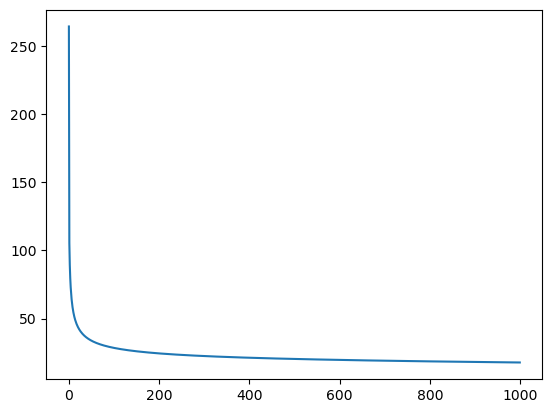

Activated Output [1.         0.99993776 0.00030693 0.00000756 1.         0.00000045
 0.00126236 0.99999987 0.15894896 0.01226725 0.98173735 0.00107486
 0.01482355 0.00000321 1.         0.00000945 0.00014351 0.9999435
 0.00009974 0.00000113 0.00218947 0.0005258  0.00000018 0.00010654
 0.00017938 0.0000075  0.00006398 0.06423896 0.00543699 0.00000031
 0.99939082 1.         0.02714053 0.99999929 0.99999973 0.0000022
 0.00000095 0.99936741 0.00181472 0.01826043 0.99803264 0.03227551
 0.9999794  0.99993682 0.00417048 0.01659885 0.99999994 0.06850983
 0.00000709 0.99862602 0.99937679 0.32290754 0.99995737 0.00042665
 0.04325078 0.00000035 0.9992533  0.00679936 0.00129038 1.
 0.00005428 0.03098155 0.00628582 0.0000853  0.32838609 0.00017191
 1.         0.99090495 0.05486517 0.99999996 0.01367834 0.06200561
 0.00451578 0.99999977 0.84078    0.00052254 0.00002019 0.9999996
 0.99926763 0.99815178 0.02990408 0.15861494 0.00122693 0.99290049
 0.0008153  0.00780493 0.00015202 0.         0.99999972 

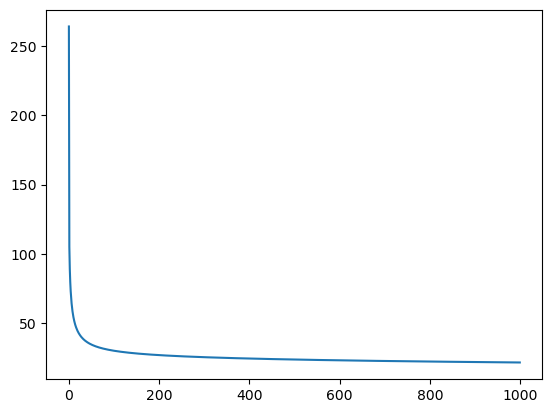

Activated Output [0.06895981 0.99867225 0.99225366 0.00001496 0.00047511 0.14829369
 0.00199496 0.00041421 0.00686839 0.76374978 0.00031605 0.00024146
 0.99460459 0.00012615 0.04840885 0.00312371 0.00002711 0.10814424
 0.00021228 0.10391117 0.03371916 0.00291104 0.00680598 0.0001403
 1.         0.99994698 0.00281532 0.00048827 0.05346676 0.01409598
 1.         1.         0.00019026 1.         0.00112183 0.05078218
 0.00449017 0.00008452 0.99999937 0.73464602 0.00001326 0.00000259
 0.99999993 0.06722546 0.00000082 0.01633456 0.00002448 0.99998803
 0.99999939 0.99998839 0.00004744 0.00000956 0.99959819 0.01482538
 0.32816129 0.00013855 0.65176541 0.01666047 0.00380897 0.97727316
 0.00119132 0.00000986 0.97105866 0.80635047 0.00002475 0.99999021
 0.99999891 1.         0.00003973 0.00000454 0.99999811 0.00073803
 0.0462898  0.37664143 0.21800476 0.03894768 0.09518464 0.99909041
 0.99908482 0.00000561 0.99999902 0.72127364 0.00001174 0.03531896
 0.9995972  0.99800153 0.00027596 0.00023139 0

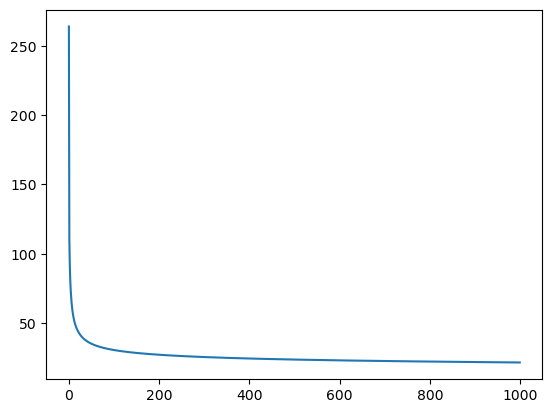

Activated Output [0.99975077 0.00321963 0.00055337 0.99951612 0.01655043 1.
 0.75346607 0.00001667 0.00000182 0.9988364  0.00000778 0.99999965
 0.19405797 0.01084532 0.94084959 0.00384452 0.00031547 0.99999979
 0.97721346 0.00008924 0.00000398 0.00000063 0.87526377 0.0493205
 0.99999192 0.99798809 0.99999985 0.01154665 0.03498925 0.00000008
 1.         0.97084046 1.         0.00157147 0.03038928 0.99976158
 0.03833235 0.99999962 0.99397745 0.99950104 0.00012744 0.00619203
 1.         0.00012809 0.02298149 0.0083313  0.00016505 0.00002525
 0.4213902  0.99999968 0.00809447 0.99948467 0.99922239 0.00191443
 0.00211682 0.76659161 0.99737251 0.99999994 0.0000726  0.00056242
 1.         0.000089   0.15175849 0.00257239 0.00007971 0.97662322
 0.99946024 0.00004629 0.01646753 0.00082125 0.00001472 0.9999924
 0.0518863  0.00012503 0.00059624 0.9968195  0.00179506 0.99999831
 0.99778416 0.00004743 0.99997404 0.00002704 0.00054421 0.99761899
 0.0002369  0.99977531 0.99999958 0.00551774 0.0170515 

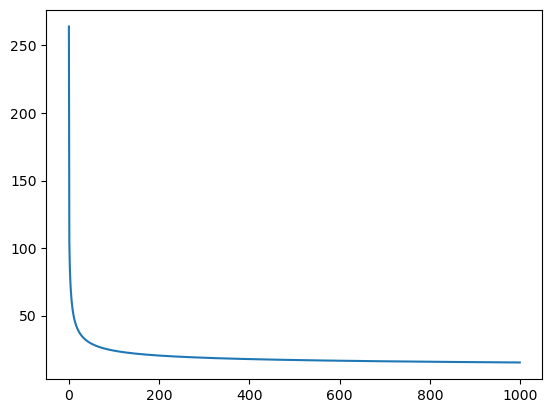

Activated Output [0.000079   0.99703465 0.0000061  0.99953868 0.99866856 0.00945242
 0.00057186 0.02041531 0.00000078 0.99396257 0.99991727 0.00000107
 0.87113225 0.00000171 0.00002147 0.95931365 0.00000095 0.00025391
 0.00000185 0.99999995 0.9939728  0.0001542  0.00000019 0.
 0.00000466 0.0621082  0.00000814 0.99999999 1.         0.00005998
 1.         0.00000028 0.01062279 0.00001707 0.00031562 0.00469028
 0.99999997 0.86485279 0.00007841 0.00002028 0.00000318 0.99999994
 0.00056723 0.00000638 0.00134208 0.10067312 0.99959003 0.0000563
 1.         0.99999998 1.         0.99780727 0.00395527 0.99976001
 1.         0.00102902 0.00020533 0.0000124  0.00041538 0.9997446
 0.00098069 0.00204389 0.00000983 0.49740646 0.00006081 0.00000459
 0.01201282 0.00002163 0.7346631  0.00000001 0.00000014 0.99988888
 1.         0.99999799 0.99988193 0.99999997 0.00003683 0.99999788
 0.00000981 0.00004916 0.99999994 0.00171022 0.00000004 0.0000127
 0.99999944 0.00025422 0.04913341 0.00041161 1.         

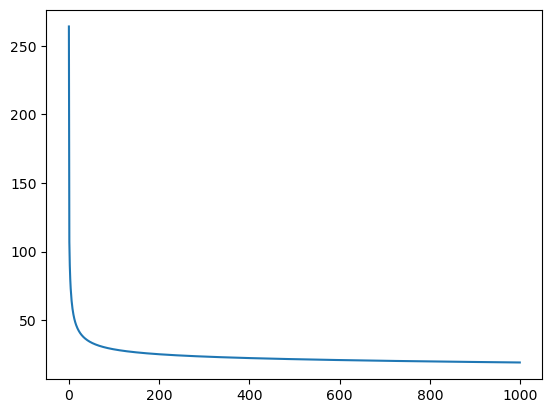

Activated Output [0.00614254 0.00013109 1.         1.         0.0109832  0.99999832
 1.         0.07914767 0.00000226 0.02543171 0.00042495 0.99999546
 0.00035073 1.         0.00338016 0.97830856 0.9999707  0.02884944
 0.99978163 0.99960798 0.0001537  0.99999992 0.00105107 0.99999974
 0.0002705  0.00013406 0.99980604 0.04907367 0.99988382 0.00000003
 0.99999984 0.00031379 0.00071529 0.9999936  1.         0.99999986
 0.00195377 0.99875964 0.00010831 0.99999997 0.9999998  0.99999975
 1.         0.00000438 0.99999998 0.99881398 0.00450435 0.00089849
 0.00140633 0.80428904 0.00024279 0.0335514  0.99999796 0.00000223
 0.07536001 0.00018701 0.00002079 0.00006181 0.00526892 0.00684473
 0.99612601 0.9991474  0.07376475 0.00006355 1.         0.00006385
 0.94470739 1.         0.02824437 0.01271078 0.99999881 0.00387089
 0.00000259 1.         0.99396211 0.00046751 0.99999457 0.00014316
 0.9998697  0.07831845 0.0000004  0.00005167 0.00008383 0.0000192
 0.99999999 0.99280216 0.97704411 0.00002389 0

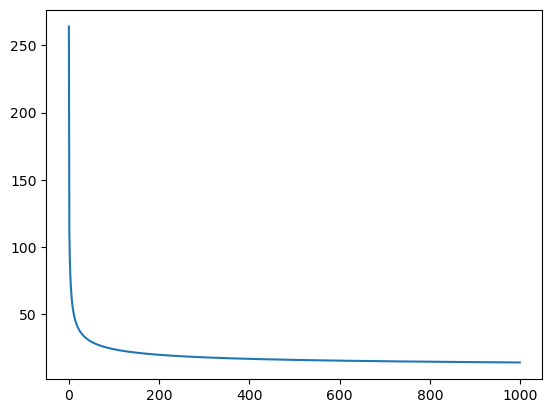

Activated Output [0.00018789 0.00014257 0.00000075 0.01370232 1.         0.00005417
 1.         0.00001554 0.05550423 0.99488302 0.99999723 0.00006902
 0.00459574 0.00001689 0.00648029 0.000386   0.00000355 0.00311494
 1.         0.00282918 0.09142659 1.         0.96356707 0.99943611
 0.00371321 0.98875339 1.         0.29760887 0.99999951 0.51951373
 0.0000034  0.99997477 0.00000003 0.99270985 0.00000008 0.00047578
 0.00006247 0.99999999 0.00002896 1.         0.99999999 0.99923072
 0.00042687 0.00213654 0.00000126 0.99999996 0.0003033  0.
 0.00000597 0.00029846 0.00007013 0.94892759 0.00000012 0.00004049
 0.01098436 0.99999999 0.99962932 0.00276054 0.00000569 0.00004416
 0.08498028 0.00197454 0.00209573 0.00000524 0.42417327 0.00935886
 0.00033325 0.00000217 0.00004154 0.00002116 0.00000166 0.01073378
 0.06880792 0.00004957 0.22623463 0.00000017 0.00001878 0.00004641
 0.99080385 0.00034805 0.00157152 1.         0.00111559 0.00010775
 0.78350827 0.04934963 0.00014725 0.99998535 0.995576

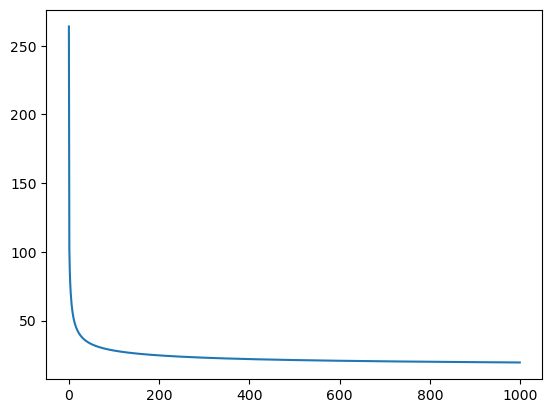

Activated Output [0.00050049 0.99999847 0.00000965 0.00024835 0.00002631 0.94497364
 0.00427988 0.00002869 0.00028666 0.00000004 0.99733689 0.00026743
 0.00000069 0.0000061  0.01022508 0.00020486 0.005639   0.04596089
 0.0000491  0.97566237 0.99989207 0.00007163 0.00055431 0.99927919
 0.00583455 0.81345057 0.07555863 0.00068063 0.08797516 0.00093921
 0.00000004 0.07852447 0.00382181 0.00003144 0.01796561 0.0000038
 0.99084977 0.00372041 0.0001911  0.99992914 1.         0.00008562
 0.00347614 0.14512749 0.14724705 0.0003163  0.04316214 0.37925945
 0.00170948 0.00061315 0.00238023 0.00424229 0.00025238 0.000007
 0.0295976  0.00000705 0.00088857 0.00070974 0.99999517 0.99999917
 0.00002307 0.00000617 0.10538214 0.00000583 0.99899507 0.99993759
 0.08044516 0.00000163 0.00233446 0.00318124 0.00084086 0.0071866
 0.00101492 0.9999996  1.         0.03163231 0.99995974 0.00007249
 0.00000125 0.01470638 0.00411789 0.99977747 0.0000224  1.
 0.04408111 0.00122276 0.00053936 0.01654228 0.00009387 0

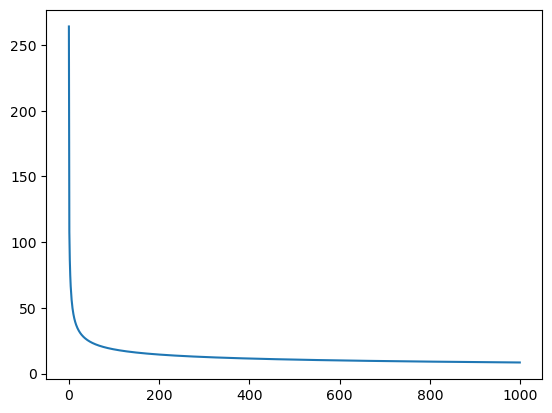

Activated Output [0.00004951 0.00000921 0.00398601 0.0230338  0.00003749 0.0677595
 0.84561862 0.05186279 1.         0.00000009 0.01847159 0.01224702
 0.00495547 0.00000006 0.03937063 0.0000011  1.         0.99597596
 0.98792691 0.00048196 0.0000667  0.00005334 0.00012322 0.9999991
 0.00008037 0.00000003 0.99999997 0.99999005 1.         0.00000005
 0.99999933 0.02058264 0.00000007 1.         0.00024008 0.
 0.99999768 0.00003512 0.00000212 0.00000008 0.00011765 0.00015851
 0.00005207 0.99999777 1.         0.00000576 1.         0.96805428
 0.00028062 0.00038021 0.00797837 0.99999987 0.98888723 0.10022323
 0.00083295 0.000001   0.00000424 0.05441571 0.00015527 0.00000002
 0.00004786 0.99877948 0.00578064 0.00000121 0.00000773 1.
 0.         0.00035981 0.00082944 0.00414066 0.99987566 0.00101555
 0.00017847 0.00043645 0.08364784 0.00022268 0.99999897 0.00000001
 0.00000028 0.00002786 0.00000001 0.00042773 0.00000001 0.00022246
 0.15431896 0.51925352 0.99999995 0.00000621 0.00000166 0.99984

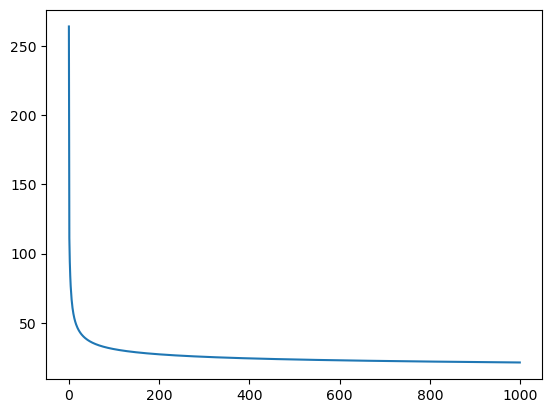

Activated Output [0.11442775 0.11483919 0.99999012 0.00720812 0.00052671 0.12458195
 0.99604031 0.01115591 0.00232979 0.9999986  0.02115451 0.99999963
 0.03745788 0.00241967 0.00002433 0.00001706 0.2938213  0.00000334
 0.99996441 0.99950159 1.         0.99999998 0.00057049 0.05736585
 0.0057203  0.99940151 1.         0.00976913 0.00040249 0.00021291
 1.         0.00001065 0.00000528 0.99961041 0.00042109 0.94129384
 0.4230227  0.00447461 0.00157513 0.03158564 0.0122217  0.00003933
 0.99999997 0.99999021 0.0005923  0.99999995 0.00091806 1.
 0.97380943 0.00001226 0.00077316 0.00787472 0.99734804 1.
 0.00000373 0.00000122 0.00003552 0.97475396 0.99999985 0.0026859
 0.00004169 0.00025001 0.00008246 0.03610377 0.00601757 0.00349181
 0.00000895 0.00001493 0.00093461 0.99999067 0.00419132 0.08460435
 0.94233025 0.00015064 1.         0.9994773  1.         0.03519219
 0.99996018 0.00019589 0.99816537 0.00000784 0.00084388 0.01061091
 0.99999942 0.0145977  0.00237183 0.00163652 0.99944351 1.
 0.

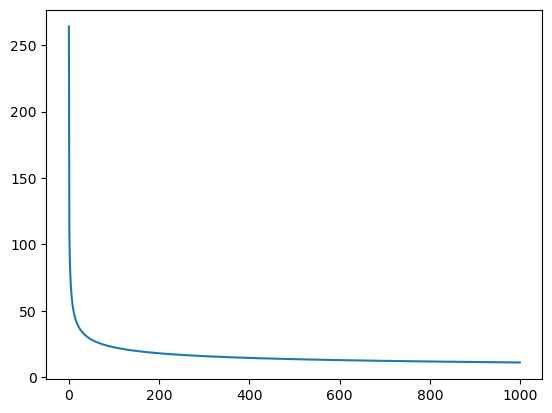

Activated Output [0.00012998 0.00000007 0.00000226 0.         0.00007776 0.99703606
 0.00000109 0.98305556 0.00004495 1.         0.9930789  0.01722949
 0.08982469 1.         1.         0.00001496 0.99999927 0.00001554
 0.03147513 0.00030518 0.9955325  1.         0.00253595 1.
 0.00002571 0.99916117 0.99993728 0.00035409 1.         1.
 1.         0.68626041 0.00023025 0.9999083  0.99994734 1.
 0.01169241 1.         0.00000001 0.0005045  0.         0.00000117
 0.00004583 0.00001313 0.00438801 0.         0.99999999 0.00000726
 0.9999685  0.00000001 0.00026899 0.00000601 0.00001342 0.01736593
 0.00000002 0.99573906 0.00205529 0.99397952 0.03761586 0.00011823
 0.00000057 0.00000005 0.00000084 0.0099142  0.93040174 1.
 0.000575   0.00180067 0.99999991 0.14068885 0.99999425 0.00145578
 0.04275317 0.00004814 0.99998454 0.00000302 0.99999997 0.00000031
 0.00000319 1.         0.00000198 0.99999993 0.00000036 0.00035749
 0.03608032 0.0000005  0.9957669  0.00041007 0.00063067 0.9999999
 0.99826087

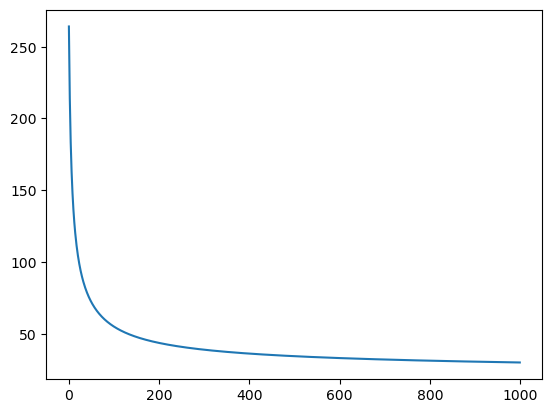

Activated Output [0.01399507 0.00039351 0.85001308 0.99996758 0.99999844 0.00930014
 0.0905764  0.98464367 0.04392075 0.03640485 0.99999979 1.
 0.95155689 0.00093959 1.         0.98889356 0.01302743 0.17166264
 0.80124177 0.99999999 0.99949182 0.99990874 0.01133645 0.24165951
 0.00331779 0.00034526 0.00539884 0.96573626 0.01608095 0.19151481
 0.00446883 0.00082256 0.00020671 0.00097382 0.99994808 0.08266498
 0.93748124 0.81263551 0.20997285 0.15275981 0.97464297 0.05825979
 0.25042495 0.00681973 0.32852049 0.99998317 0.01415572 0.02522179
 0.99993672 0.00017596 0.00153456 0.99998386 0.06561585 0.0001404
 0.00023332 0.97556561 0.00353278 0.00679406 0.99990207 0.02987754
 0.9985635  0.99999996 0.00895135 0.01533354 0.98299409 0.03427397
 0.10024492 0.00126943 0.02486951 0.00035146 0.98174859 0.99995259
 0.85510584 0.99999891 0.00019089 0.99997534 0.57779199 0.93706571
 0.99999606 0.00029524 0.03065781 0.0000939  0.01882901 0.14708287
 0.02548373 0.00009752 0.7399856  0.97537254 0.0006170

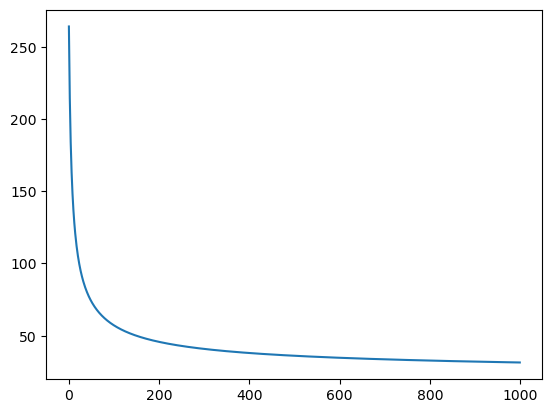

Activated Output [0.27007201 0.13326368 0.00413688 0.38483164 0.99866849 0.99757495
 0.99999245 0.99999998 0.10779229 0.64246619 0.22601068 1.
 0.13656002 0.00103869 0.00427456 0.99980597 0.9992677  0.96726484
 0.00558761 0.00297716 0.99995005 0.01677287 0.00488496 0.99745056
 0.9077849  0.99996993 0.87623835 0.99999185 0.01430164 0.0030377
 0.99999999 0.20042527 0.02026023 0.0297114  0.00297884 0.64890446
 0.99999601 0.00350404 0.99997433 0.04485167 0.08912053 0.99004989
 0.99628713 0.03121714 0.00071966 0.00336407 0.00766023 0.99999999
 0.99995521 0.99992759 0.00647848 0.00048503 0.99974212 0.00969546
 0.00019535 0.00003572 0.00077095 0.02322542 0.00080191 0.00097167
 0.99990643 0.99999986 0.00522617 0.16361252 0.0003476  0.00590313
 0.00034231 0.00212324 0.00395041 0.73118095 0.78203965 0.99997302
 0.0050349  0.00537901 0.92133742 0.00039381 0.27340877 0.79449699
 0.00492888 0.99995097 0.00450626 0.00121248 0.01007736 0.0704733
 0.00564728 0.99995858 0.00026682 0.97856026 0.00450125

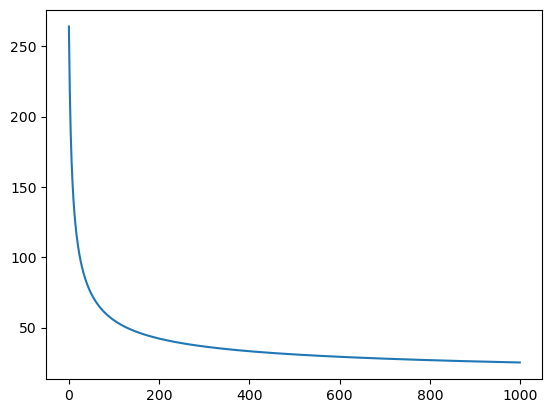

Activated Output [0.05386898 0.07475226 0.99734216 0.95599886 0.82540363 0.63114258
 0.99993454 0.00008172 0.81740442 0.00032674 0.19074627 0.07556638
 0.37701222 0.02104289 0.79394704 0.99999106 0.01047054 0.000132
 0.99997912 0.00963368 0.25504874 0.00009214 0.99973713 0.99011429
 0.0005431  0.99006358 0.99521062 1.         0.05330678 0.29718119
 0.00551043 0.00032988 0.0000968  0.00183671 0.01560901 0.00126552
 0.01291066 0.00282828 0.11413346 0.40751832 0.98457736 0.9199345
 0.01399031 0.99977454 0.01539979 0.00019625 0.89129764 0.99981631
 0.99999999 0.99999936 0.86817341 0.00075744 0.04503207 0.02502033
 0.00065828 0.00222934 0.39212464 0.96102071 0.99999864 0.99917385
 0.00130228 0.00484315 0.01516801 0.03451947 0.99999786 0.0148718
 0.9999575  0.23190305 0.98249715 0.00340719 0.99912471 0.99998898
 0.9982841  0.00294413 0.0007383  0.99997768 0.03695533 0.1879183
 0.12181476 0.53931255 0.00020186 0.99997394 0.00181405 0.37672505
 0.00465962 0.99884722 0.99999992 0.01104377 0.999

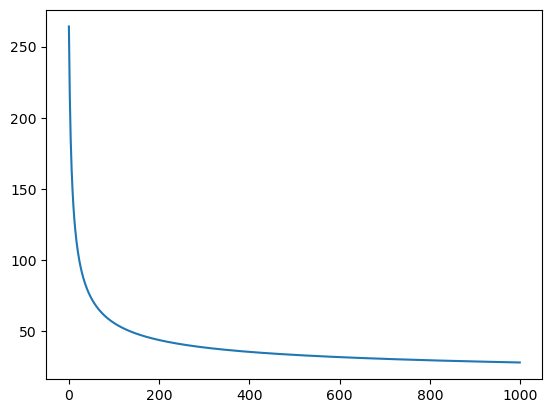

Activated Output [0.03417589 0.00570465 0.00028536 0.11880254 0.00125007 0.99986468
 0.12146819 0.00586966 0.99998911 0.0157782  0.99981376 0.00069838
 0.00139153 0.99992483 0.00013873 0.88295904 0.28581113 0.0007494
 0.00116202 0.98297066 0.02523928 0.00235365 0.00624806 0.00007641
 0.11061542 0.80146521 0.00223666 0.00305179 0.00006557 0.00044209
 0.00017103 0.97319923 0.99992494 0.00630224 0.00805421 0.81525974
 0.00278558 0.2358996  0.9999985  0.17354194 0.03579076 0.05707093
 0.99979684 0.00136278 0.06277667 0.0000444  0.03256017 1.
 0.14836713 0.99991654 0.99999602 0.99963219 0.63059079 0.9978344
 0.00034959 0.00055658 0.00097779 0.0096157  0.9959725  0.00251718
 0.00085243 0.99523757 0.00229805 0.99999967 0.99999987 0.93784119
 0.99927736 0.99873    0.99426549 0.98707856 0.99858484 0.92076863
 0.06333253 0.99845031 0.01070541 0.87089798 0.23610444 0.86756563
 0.05009174 0.00369485 0.99840975 0.2087527  0.99998148 0.0037486
 0.99567263 0.72563298 0.00066824 0.0000192  0.00096531 

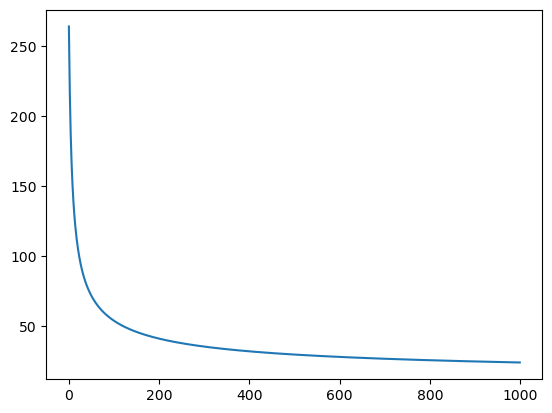

Activated Output [0.06646444 1.         0.00018284 0.00093993 0.00000464 0.99999986
 0.99977394 0.00456062 0.99812755 0.99286169 0.02258995 0.05314983
 0.14549361 0.02427619 0.0037065  0.9999931  0.14836015 0.06074326
 0.99967649 0.01001799 0.00789847 0.9970807  0.19445586 0.01261728
 0.00038374 0.00249451 0.00048594 0.00483934 0.9876834  0.02529983
 0.00344862 0.15448329 0.00075818 0.04804946 0.81631056 0.0000954
 0.00207766 0.83518385 0.00016533 0.0346571  0.52231604 0.00079154
 0.99999182 0.09769305 0.859586   0.99991653 0.02477156 0.00000091
 0.01023248 0.00047344 0.02634633 0.98098174 0.99999998 0.02699183
 0.99686347 0.9832937  0.87762935 0.99554931 0.00180087 0.05674636
 0.00258427 0.98743089 0.00073813 0.00710636 0.00017151 0.99839815
 0.9998896  0.04377865 0.18490938 0.93639991 0.99998094 0.70131578
 0.00836143 0.99996927 0.00021926 0.04222369 0.99997902 0.03893119
 0.03434456 0.00110069 0.00012357 0.02709706 0.05192077 0.00089081
 0.03252102 0.04940878 0.98733739 0.0001495  0

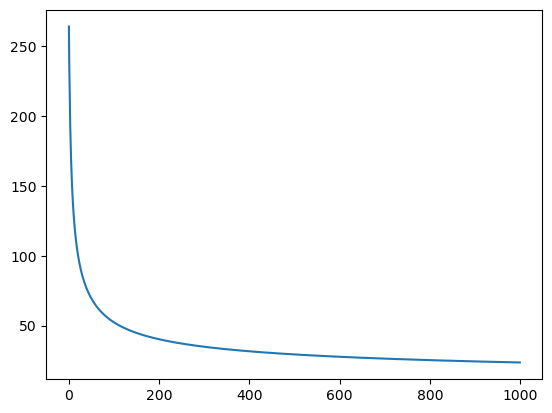

Activated Output [0.9993788  0.01413893 0.00236802 0.00013628 1.         0.09006107
 1.         0.00012975 0.98704433 0.00544133 0.01854398 0.9994541
 0.95842005 0.99999352 0.00384052 1.         0.04186872 0.00706412
 0.03266949 0.99999984 0.99880193 0.00007611 0.25278173 0.99830532
 0.04257918 0.00149814 0.10208302 0.93056553 0.00890935 0.99873758
 0.99925306 0.91031172 0.00401436 0.13987316 0.01140793 0.00077195
 0.99996435 0.88806988 0.15759652 0.99999946 0.02906407 0.01816696
 0.92706029 0.99999205 0.00055498 0.00008056 0.99997055 0.01303577
 0.00267611 0.99999996 0.96471746 0.99991321 0.26287782 0.99714101
 0.00220029 0.99995385 0.00000499 0.05490397 0.00400921 0.00015089
 0.99957512 0.86527977 0.00389731 0.99869239 0.00078754 0.99999999
 0.9858534  0.00314549 0.0013917  0.05474914 0.05311581 0.99999644
 0.99996846 0.99714605 0.98155029 0.00056761 0.00466497 0.00508672
 0.70215814 0.00133554 0.0022196  0.99976793 0.99999915 0.00390418
 0.99999751 0.99997782 0.75306767 0.0001778  0

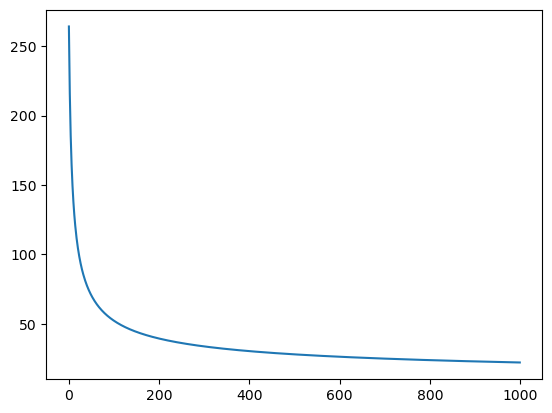

Activated Output [0.00008217 0.98959736 0.0154178  0.28126285 0.99999987 0.1433578
 0.0008095  0.07552635 0.99727137 0.03731178 0.01459271 0.61613233
 0.99996698 0.00015324 0.99995218 0.99973742 0.99999879 0.99881421
 0.0001002  0.98579267 0.00021894 0.00025123 0.0000154  0.26803096
 0.00323676 0.99915919 0.97921445 0.01094826 0.99991594 0.00485631
 0.55645815 0.00816607 0.00005584 0.00019022 0.99999989 0.01615721
 0.96909022 0.0000064  0.00243613 0.99695586 0.07670122 0.00666613
 0.99848971 0.91480641 0.0001687  0.00277121 0.1115759  0.02876968
 0.00172186 0.99997429 0.09459409 0.99999776 0.05205248 0.00292062
 0.87062445 0.00374445 0.99966968 0.02294182 0.02877351 0.12942294
 0.9665295  0.00211365 0.99999981 0.00114458 0.00000393 0.99991574
 0.9486664  0.21195876 0.99999831 0.04073625 0.99999643 0.99923481
 0.99997972 0.02718177 0.00119477 0.97294436 0.00026093 0.00752642
 0.9977703  0.11438723 0.99983503 0.0007066  0.01881018 0.34841914
 0.00014425 0.11523234 0.00198147 0.00013308 0

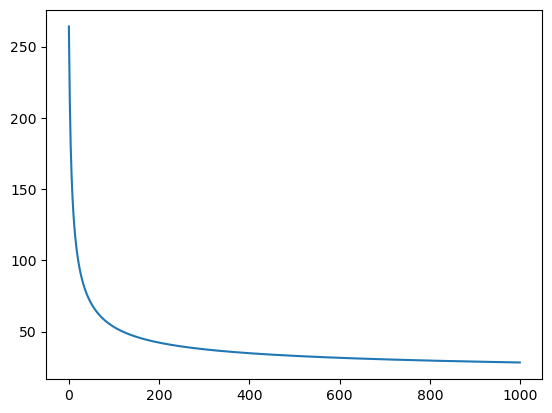

Activated Output [0.00120151 0.99994977 0.95017422 0.10205707 0.00450616 0.99999967
 0.00175767 0.99987359 1.         0.99972023 0.02293264 0.00971714
 0.00506555 0.99200123 0.00535429 0.14344349 0.00096932 0.03651745
 0.00289396 0.01618194 0.00092653 0.05076214 0.99999556 0.99973983
 0.02413612 0.99999999 0.73735161 0.03339626 0.00348324 0.00377791
 0.99999886 0.99999743 0.99911475 0.00408574 1.         0.01253132
 0.00411783 0.99996624 0.0002486  0.98488033 0.00091219 0.00034329
 0.15843121 0.03640494 0.99922715 0.00430255 0.00028867 0.0000112
 1.         0.00589701 0.00001441 0.00024268 0.02954899 0.00008411
 0.01874811 0.00348127 0.00012084 0.00194223 0.01816567 0.84753941
 0.00134734 0.23625176 0.01684598 0.15215244 0.62006028 0.9908513
 0.99995764 0.99999126 0.01190567 0.99997401 0.9999215  0.00032563
 0.0007224  0.42295672 0.81831593 0.98328505 0.04577295 0.00277007
 0.02196171 0.00890993 0.00211568 0.99979355 0.38693554 0.00043937
 1.         1.         0.99999992 0.02328746 0.

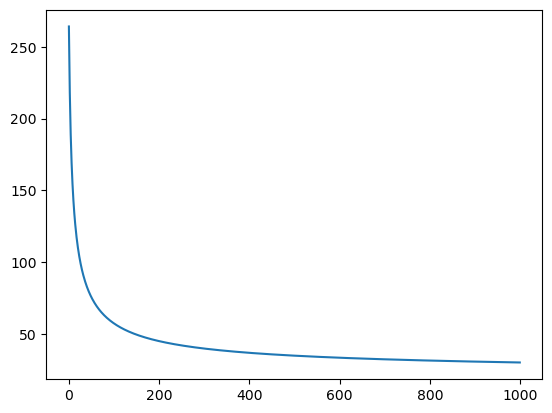

Activated Output [0.01214052 0.00808012 0.03158716 0.03969571 0.99792691 0.12823366
 0.00073146 0.01548831 0.99990436 0.03017452 0.9788332  0.99973414
 0.99911316 0.07541651 0.00065052 0.00111089 0.15610296 0.02438315
 0.00008829 0.00442402 0.99996333 0.66751423 0.08823261 0.0053052
 0.01892138 0.00060551 0.02431081 0.00238788 0.26390024 0.99999656
 0.00034587 0.01616612 0.00184802 0.12147504 0.01138712 0.9670474
 0.95234465 0.79358571 0.3733874  0.99867866 0.98031636 0.037888
 0.00604555 0.99998159 0.00116815 0.07768849 0.64663263 0.84518526
 0.02474303 0.0321821  0.69102522 0.00692344 0.00001472 0.0364683
 0.99700336 0.04883293 0.92120538 0.03602514 0.00610327 0.9883812
 0.99996777 0.9991864  0.14805321 0.02914688 0.01169027 0.00559272
 0.99156111 0.09320116 0.89047617 0.38417509 0.01660582 0.99928519
 0.9999903  0.00096009 0.66287002 0.00103681 0.00133466 0.00369262
 0.02957921 0.89024955 0.86101546 0.00118266 0.03515039 0.99999998
 0.00252663 1.         0.17774763 0.07150943 0.0001

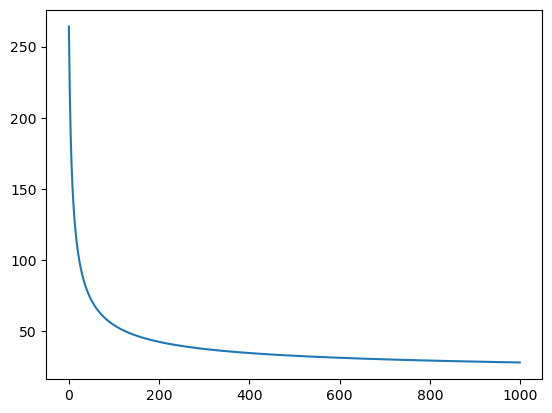

Activated Output [0.00029005 0.213566   0.88789774 0.00033586 0.96600537 0.03217334
 0.00667132 0.14516281 0.82180659 0.94250947 0.00002073 0.00155427
 0.99808381 0.98523696 0.99770209 0.00022271 0.3079339  0.08489135
 0.60233295 0.99999973 0.94070544 0.02957131 0.00501064 0.00582847
 0.18000502 0.99775388 0.00213665 0.99918451 0.00043534 0.7569099
 0.01582226 0.99999032 0.02693786 0.99609526 0.81165041 0.00033878
 0.00139311 0.00081249 0.96528546 0.13529138 0.00025683 0.02903408
 0.0085684  0.00042181 0.00244898 0.00085797 0.99999679 0.99999999
 0.00013958 0.98634372 1.         0.99999796 0.00081119 0.00079937
 0.00395228 0.99999984 0.99990417 0.99930328 0.01502655 0.99608515
 0.08199337 0.99998487 0.00244065 0.99997662 0.06045671 0.02387304
 0.99979704 0.00471599 0.99972819 0.1283323  0.00016945 0.00932972
 0.00159382 0.99886727 0.00902407 0.51619484 0.00935249 0.00034373
 0.29911088 0.00322439 0.01039789 0.9999993  0.01911203 0.55781558
 0.00358308 0.00756737 0.00514466 0.00352402 0

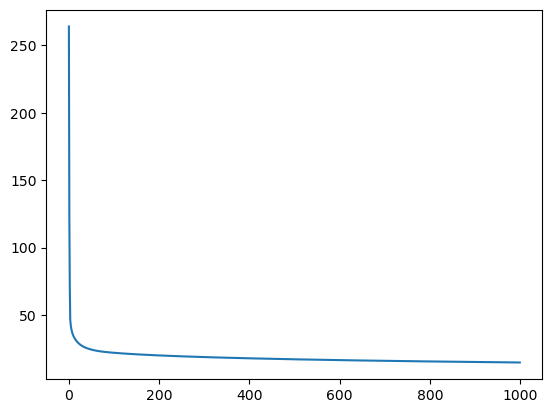

Activated Output [0.00000192 0.99999646 1.         0.00000003 0.00028739 0.02260517
 0.00015074 0.00022753 0.00024646 0.00000099 1.         0.10528969
 0.00000003 0.01484279 0.00345799 0.1170786  1.         0.00000703
 1.         0.         1.         0.17279538 1.         0.92799614
 0.00000022 0.00000084 0.998067   0.00011618 0.01575218 1.
 0.00000001 0.99617652 0.00466964 0.00771487 0.99999966 0.49654457
 1.         0.00001226 0.38503993 1.         0.74648898 0.00028055
 0.00000127 0.00000052 0.94230964 0.00002261 0.00000088 0.00005583
 0.00001225 0.00018151 1.         0.00001113 1.         0.78342442
 1.         0.00000002 0.00000009 1.         0.00382936 0.00000001
 1.         0.00004068 0.         0.00004968 0.00096669 1.
 0.00004781 0.         0.00215847 0.00001944 1.         0.0000001
 0.9997242  0.00169734 0.00000001 0.00000002 0.12824388 1.
 0.00000145 0.00001674 0.00132296 0.00001697 0.00020216 0.15645011
 1.         0.74966139 0.         0.25244256 0.99999995 0.00000004
 0.

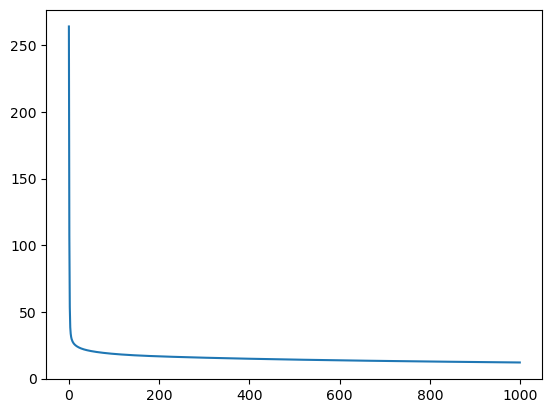

Activated Output [0.13495257 0.00000735 0.99981426 0.00305295 0.13462463 0.00022496
 0.00180049 0.00000666 0.99999999 0.00000025 0.00000998 0.00000218
 0.00000076 1.         0.00000004 0.05068245 1.         0.99999767
 0.00000001 1.         1.         0.00001993 0.00001467 0.99971949
 0.99999418 0.         0.1571644  0.99999752 0.00088472 1.
 0.75854803 0.03605551 0.60731455 0.99999858 0.00676578 1.
 0.0273576  0.00010513 0.00004072 0.00234452 1.         0.0000027
 0.00259247 0.00000048 0.1101038  1.         0.00000001 0.00000009
 0.00000028 0.00000042 0.00191324 0.00000003 0.00008858 0.99979004
 0.99999978 0.0003337  1.         0.00000051 0.00000347 0.00000035
 0.00000016 0.99991205 0.         0.00003656 0.00000015 0.00000327
 0.00124376 1.         0.00000001 1.         0.06231286 0.99817437
 0.00004067 0.00005272 0.9911022  0.05861741 1.         0.00000039
 1.         0.00000016 0.05514935 0.00000057 0.00022826 0.99999825
 0.00014203 0.00000059 0.00004839 1.         0.9999995  0.0009

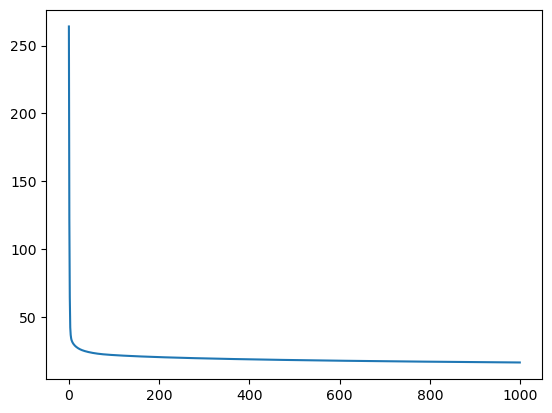

Activated Output [0.00000217 0.00065708 0.00000009 0.34293644 0.00000035 0.00000155
 0.02755194 0.00002207 1.         0.00005554 0.00021925 0.00000129
 0.0250227  0.03460993 1.         1.         0.         0.00032369
 0.00037529 0.00001868 0.00070136 0.00002822 0.00000924 0.08173553
 1.         1.         0.00000263 0.00042134 0.00000348 0.00000002
 0.10128102 0.99997979 0.99999998 0.00008279 0.00003421 1.
 0.99999785 0.00004922 0.00004179 0.99986544 0.99819628 1.
 0.99999991 0.         0.00000011 0.00000659 1.         0.99984899
 0.00000355 0.00000006 0.99998696 0.17469937 0.00221722 0.0000083
 1.         0.99999999 0.00002408 0.99999489 0.36140113 0.02692375
 0.99828756 1.         0.0000002  0.00006105 0.00002494 0.4947205
 0.         0.0040439  0.00015099 1.         0.00003544 0.99998184
 0.00000001 1.         0.00001666 0.         0.00000226 1.
 1.         0.00003847 1.         0.00012481 1.         1.
 0.00008847 0.00190284 0.00000499 0.00000066 1.         0.79839717
 0.99787948 

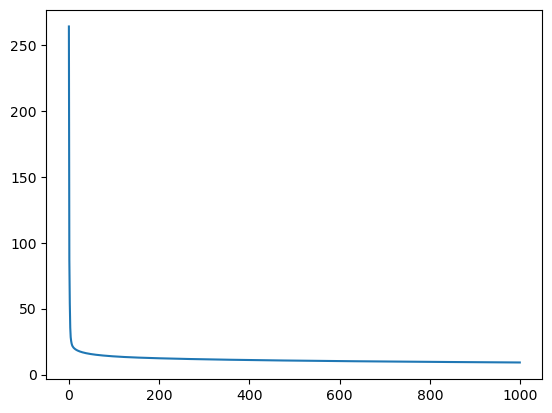

Activated Output [1.         0.99999989 0.         0.00000018 0.99605176 0.31816427
 0.         0.00021715 0.00000028 0.00000105 0.00033756 0.00000023
 0.00000046 1.         0.00000023 0.00001375 0.00005297 0.00524185
 0.25055161 0.0000021  0.         0.         1.         1.
 0.         0.99999926 0.0000001  0.58026803 0.9801908  0.00000004
 1.         0.99720167 0.99999984 0.00016344 0.00000155 0.00072991
 0.00048718 1.         1.         0.         0.02375568 0.00000024
 0.99521493 1.         0.         0.00000008 0.02753834 0.98914704
 0.01213575 0.00000013 1.         0.00000018 0.00000018 1.
 0.         0.00606827 0.00036164 0.00003158 0.00080785 1.
 1.         0.00000001 0.99748679 0.99975349 0.8161011  0.99999153
 0.         0.99999928 0.00002311 0.00001256 1.         0.05201691
 1.         0.00000051 0.         0.00084889 0.05894542 0.
 0.         1.         0.00001011 0.0000158  1.         0.00000023
 0.00002937 0.         0.         0.01107128 0.00004398 1.
 1.         0.9998

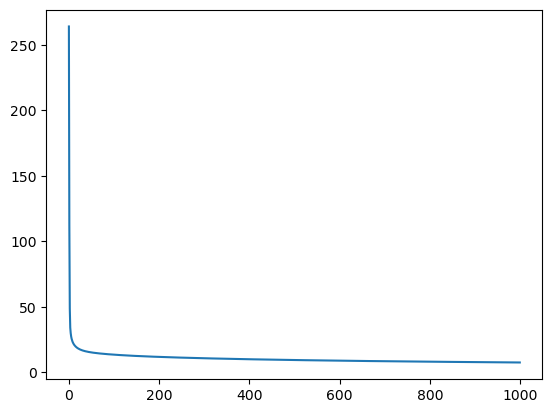

Activated Output [0.00000003 0.00001131 0.10666591 0.00000774 0.         0.12164983
 0.00000016 0.99995295 1.         0.         0.00000384 0.00628238
 0.99998977 0.00000029 0.         1.         0.00000001 0.00000361
 0.00000005 0.         0.99999977 0.99999977 0.97405622 1.
 0.         0.00000353 0.00000503 1.         0.00000219 0.00001102
 0.00010481 1.         1.         1.         0.00042546 0.00000042
 0.9999961  0.00000024 0.         0.00009544 0.00000001 0.04207237
 0.35459161 0.00000097 1.         0.00000013 0.00000005 0.00000015
 0.99988593 0.9999913  0.00000695 0.00006141 0.00000014 0.99999652
 0.00011571 0.00000251 0.         1.         0.00000002 0.
 0.9983424  0.01197057 0.00000002 0.96773978 0.0000001  1.
 0.00000002 1.         0.04241752 0.99987254 0.         0.
 0.00904895 1.         0.99999912 0.         0.00000012 1.
 0.00000005 0.0000053  0.00000001 1.         1.         0.
 1.         1.         0.99999932 0.         1.         0.00001738
 0.00026166 1.         0.1

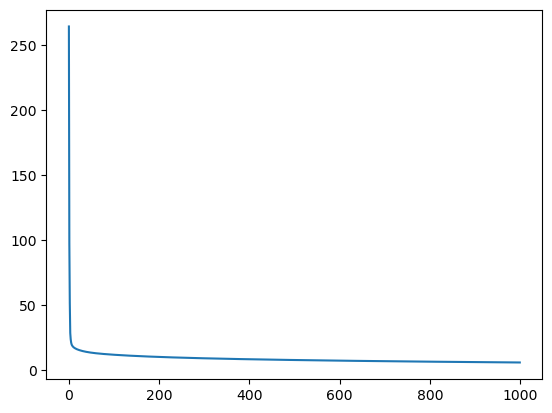

Activated Output [0.00045622 0.00183899 1.         1.         1.         0.00067547
 0.02204416 0.00000047 0.00018017 0.         0.00000014 1.
 0.         0.         0.         1.         0.00000031 0.99999537
 0.99999967 0.99992553 0.99999157 0.00000011 0.00000894 0.00000087
 0.00005206 1.         0.         0.04963899 0.00000003 0.00000327
 0.00048737 1.         0.00000004 0.00000124 0.         0.00000584
 0.02633489 0.00000508 0.00000021 0.99999999 0.00000003 0.
 0.89000732 0.00001463 0.00000873 1.         0.0025533  0.
 0.00001228 1.         0.00017873 0.00000435 0.00001004 0.99987823
 0.         0.00000061 1.         1.         0.         1.
 0.9999784  0.09189049 0.         0.         0.00047138 0.99999328
 0.00006754 0.00038695 0.18533861 0.00000001 1.         0.00099992
 1.         0.         0.99817878 0.99999996 0.04656001 0.00013516
 0.00000009 0.99996879 0.99999997 0.         0.99910542 0.00012327
 0.00000466 0.00000001 0.         0.00371595 0.00020205 0.
 0.00000061 0.9997

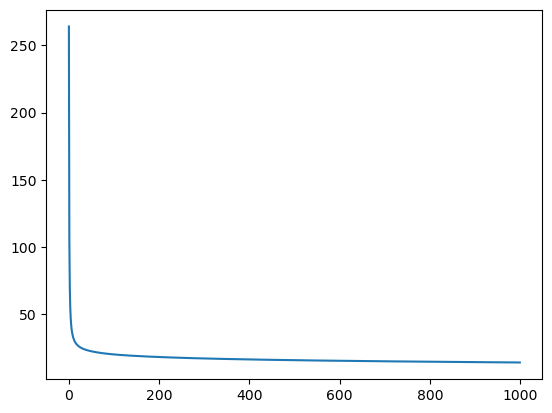

Activated Output [0.00000732 0.0001466  0.05872562 1.         0.00820259 0.99986188
 0.00000021 0.00867447 0.00010092 0.99999985 0.00045533 0.00090205
 0.99397683 0.99995913 0.00000032 0.00131933 0.00004216 0.99997532
 0.9999998  0.99999347 0.00100398 0.00000009 1.         0.00010883
 1.         0.9743589  0.99999998 0.00229567 0.99998333 0.99999376
 1.         0.00001755 0.00000284 0.         0.00003189 0.00238403
 0.00148154 0.00013258 0.00000796 0.99999998 0.00000001 0.0000002
 0.06603498 0.99999985 0.96349023 0.07434173 0.         1.
 0.01214709 0.03976335 0.00000021 0.00001281 0.99999708 1.
 0.         0.99996663 0.00000154 0.99976786 1.         0.00000004
 0.00000004 1.         1.         0.00036049 0.0000171  0.99999393
 0.00013609 0.89383907 0.00005563 0.99979424 0.00031501 0.00004159
 0.97044757 0.00000012 0.00020132 0.14865558 0.00000001 0.00000003
 0.99997984 0.00000017 0.00002487 0.56255427 0.9999997  0.00548062
 0.0000968  1.         0.00004919 0.99853266 1.         0.0000

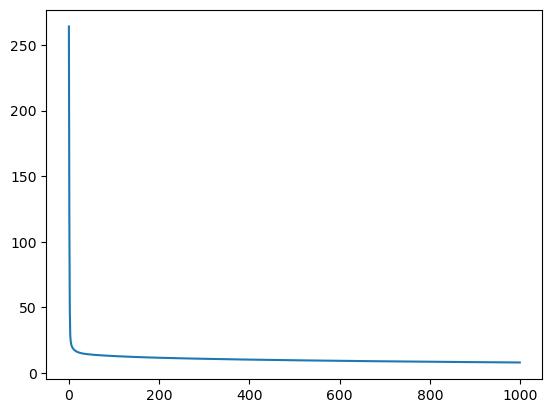

Activated Output [0.00000006 0.00000005 1.         0.00896204 0.0000092  0.99999514
 0.00034765 0.00000002 0.00577292 0.00018182 1.         0.00019948
 1.         1.         0.00000003 0.00008486 0.00001986 0.99856917
 0.9999899  0.         1.         0.         0.99849285 0.99996204
 1.         0.         0.00000031 0.99999998 0.9999772  0.10559025
 1.         0.11590206 0.28414166 0.00000018 0.00688357 1.
 0.00000073 0.99999359 0.00000002 0.         0.00000142 0.
 0.         1.         0.99897914 0.99995541 0.99999994 0.00016246
 0.00000281 0.00000112 1.         0.00164807 0.99999944 0.
 0.00000251 0.37269277 0.00000294 0.00000002 0.00000504 0.00000133
 1.         0.00000011 0.99992702 0.00047756 0.99995322 0.00000147
 0.00000259 1.         0.00000016 0.99999188 0.00000034 0.99999979
 0.         0.01113463 0.00014004 0.00090608 0.00137583 1.
 0.00000267 0.00000003 1.         0.         0.         0.00015579
 0.07140844 0.         0.00001645 0.99991132 0.00001277 0.00016028
 0.0000059

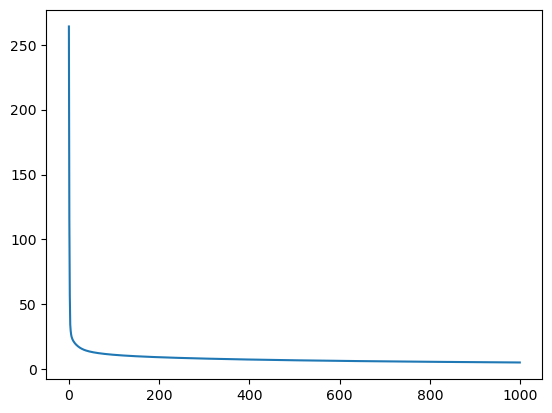

Activated Output [0.         0.         1.         1.         0.         1.
 0.99999447 0.         0.99933663 0.00027412 0.         0.
 0.         0.05693655 0.00000015 0.00033762 1.         1.
 0.00000245 0.00000036 0.         0.02206108 0.00025096 0.
 0.00000575 0.         0.00000001 0.99987508 0.00000009 0.00002011
 0.97666834 0.         0.00000423 0.00000181 1.         0.
 0.00000953 0.99999983 0.         0.01207117 0.00000786 1.
 0.00000003 0.         0.99995168 0.00000383 0.9999986  0.00022042
 0.         1.         0.01105645 0.00026554 0.99999994 0.99999988
 1.         0.02470402 0.00033202 1.         0.96896298 0.99999984
 0.00000001 0.00000001 1.         0.         0.9320757  0.00008355
 0.         0.99999999 0.         1.         0.         0.
 0.00000008 0.00000051 1.         0.00005093 1.         0.
 0.00004027 0.00000033 1.         0.         0.         0.
 0.00000007 1.         0.99999675 0.         0.00000001 0.
 1.         0.99999998 0.         1.         0.00000001 0.

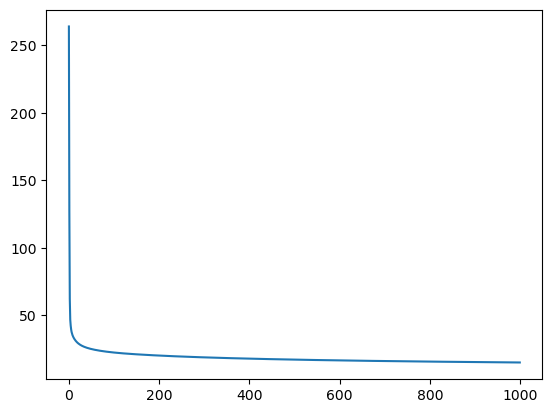

Activated Output [0.00016582 1.         0.00132413 1.         0.00035185 0.02205845
 1.         0.000004   0.00000051 0.99999891 1.         0.98765755
 0.00000394 0.00004533 0.00000001 0.00012598 0.99999887 0.99994807
 0.99999999 0.00102992 0.00022313 0.00111468 1.         0.99999974
 0.05379684 0.01540124 0.77543288 0.00000087 0.99999994 0.00000107
 0.07759196 0.89389444 1.         1.         0.00000308 0.00000051
 0.00000036 0.00000299 0.9999737  0.00000805 0.99960276 0.00002481
 0.00000018 0.0000014  0.10230133 0.         0.99999997 0.00000035
 0.         0.65892462 0.00122964 0.00003555 0.00000032 1.
 1.         0.87414551 0.00001506 0.99998109 0.0000097  0.06648822
 1.         1.         0.05683288 0.00000001 0.00002117 0.56811874
 0.13047557 0.00624857 0.00064131 0.99934553 0.00000011 0.00011457
 0.00000011 0.00001163 0.00001273 0.00000001 1.         0.00015352
 1.         0.00128333 0.99980614 0.00049191 0.00002282 0.99999996
 0.00003961 0.99911223 0.99999992 1.         1.      

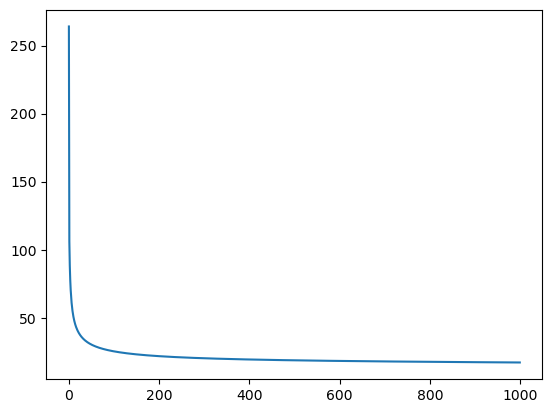

Activated Output [0.9999999  0.07306027 0.02347973 0.00014616 0.00034395 0.0000054
 0.00014969 0.00325679 0.01908376 0.98886176 0.13241066 0.00090939
 0.02345106 0.99999996 0.99996379 0.0053632  0.04894992 1.
 0.00002201 0.99885329 1.         0.00016473 0.02811674 0.99985351
 0.99999957 0.00000416 0.00000097 0.99928416 0.63241505 0.0277753
 0.00229717 0.99794864 0.99999769 0.27156482 0.00250487 0.99999982
 0.00089726 1.         0.86016919 0.02683445 0.00455431 1.
 0.00000259 0.99999506 0.00017024 0.11519177 0.00000979 0.00001618
 0.01959823 0.00000443 0.00000019 0.99998718 0.06804269 0.00000211
 0.00000048 0.00000124 0.00001562 0.97258798 0.00003051 0.16747103
 0.00000057 0.00007606 0.00013595 0.99999958 0.00001993 0.00051038
 0.99999941 0.00022381 0.03958587 0.00013812 0.00466428 0.98476448
 0.01876957 0.99999998 0.00043144 0.99875097 0.03851486 1.
 0.00015033 0.99607093 0.0104253  0.00033113 0.00000015 0.0001695
 0.00002037 0.99996824 0.00038053 0.01132873 0.98832503 0.68170045
 1.  

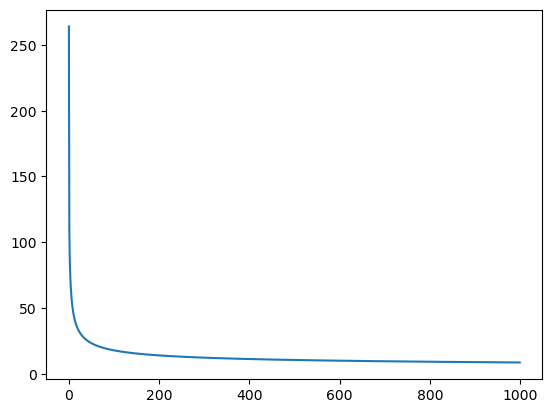

Activated Output [0.99999999 0.00000162 0.01345718 0.00075729 0.00082202 0.00000316
 1.         0.00000037 0.99999997 0.00000084 0.00000001 0.00030129
 0.01677293 0.00000228 0.00000099 1.         0.0000081  0.00002366
 0.9999993  1.         0.03346815 0.01586429 0.99983661 0.00132112
 0.99082396 0.         0.99986096 0.96842032 0.00000595 0.00000024
 0.0002517  0.98733676 0.0000004  0.00002619 0.00001422 0.00879962
 0.00000003 0.00037582 0.00430346 0.00000102 0.00102269 0.00000002
 0.99999874 0.9999997  0.00000227 0.03035092 0.00004624 0.01981562
 0.14926781 0.97798873 0.00001884 0.97188726 0.00022091 0.00067612
 0.00000808 0.00008117 0.00000375 0.00168864 0.99999992 0.00024248
 0.99999901 0.00040353 0.9998839  0.99900233 0.00000436 0.61169697
 1.         0.00004014 0.00000014 0.00845356 0.00562165 0.00085206
 0.00444944 0.00753561 1.         0.00000014 0.02422531 0.00275135
 0.00000341 0.00000046 1.         0.98792179 0.06632804 0.00415053
 1.         0.00000256 0.00488892 0.99996342 

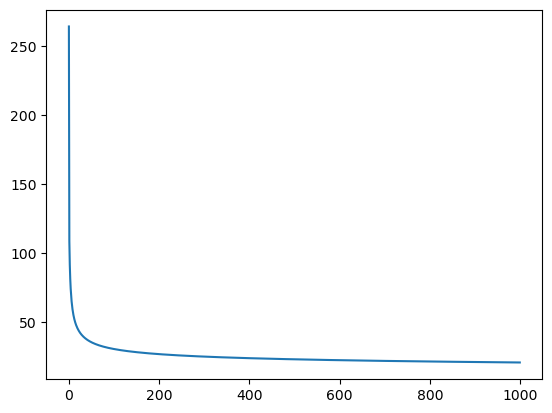

Activated Output [0.00109452 0.99999477 0.00004814 0.15061394 0.0000013  0.86733823
 0.08992842 0.33900409 0.00003821 0.00000495 0.47955508 0.99999996
 0.56346539 0.92306776 0.9999999  0.99995152 0.00358704 0.00000004
 0.00000561 1.         0.47859983 0.99960316 0.00843022 0.00003445
 0.00056022 0.00097974 0.17666053 0.99962714 0.99997894 0.00000226
 0.99999993 0.00885978 0.01264447 0.02838894 0.00456945 0.00018565
 1.         0.00071992 0.00004013 0.00169245 0.00000703 0.99985648
 0.99887475 0.99999946 0.00021687 0.00017788 0.00000214 0.0024649
 1.         0.99986796 0.99208568 0.00001711 0.00000255 0.99999992
 0.00056979 0.00000013 1.         0.99999995 0.01055573 0.01601428
 0.99997784 0.99348719 0.99998112 0.00177532 0.99907199 0.00004372
 0.99885112 0.05054335 0.99970466 0.0000203  0.12537364 0.9837399
 0.0000173  0.00013076 0.98635595 0.00024372 0.00006809 0.00000211
 0.00285332 0.00287078 0.92459056 0.00004683 0.00328563 1.
 0.000024   0.00554045 0.00001601 0.9999999  0.99999998

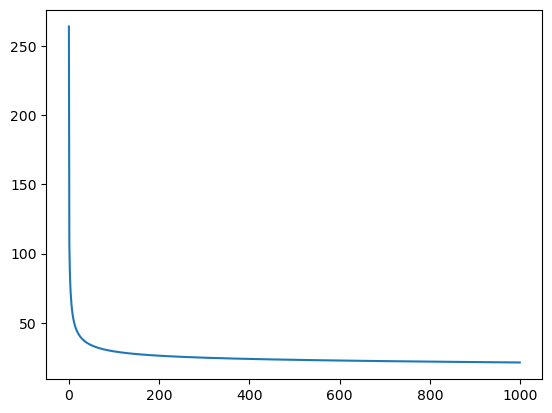

Activated Output [0.03384613 0.01837176 0.0002941  0.00025368 0.00000554 0.0376802
 0.00033755 0.97469684 0.00000417 0.00028956 0.00399049 0.99169185
 0.00034368 0.00546053 0.00043761 0.00033968 0.00037487 0.9999998
 0.00024071 0.00249427 0.00000479 0.99998827 0.0414603  0.99958657
 0.92379001 0.00002799 0.00234288 0.9999916  0.99238821 1.
 0.00005303 0.00243951 0.00000277 0.00063183 1.         0.99930917
 0.004623   0.00047434 0.00008499 0.00000536 0.37521451 0.99999913
 0.0761549  0.03802103 1.         0.01357515 0.99998407 0.00000506
 0.09138252 0.00011729 0.13392002 0.00001795 0.94844761 0.00002125
 0.00167108 1.         0.00947163 0.00278372 0.00464174 0.99904527
 0.99999464 0.00017156 0.00284816 0.99999983 0.00001256 0.00041606
 0.1777759  0.00253647 0.00002979 0.00002945 0.99999999 0.00444332
 0.01364839 0.00003048 1.         0.99933997 0.00000789 0.80123511
 0.00000305 0.00097224 0.00000498 0.99999416 0.03245165 1.
 0.99999922 0.00000021 0.00023802 1.         0.99999999 0.12400

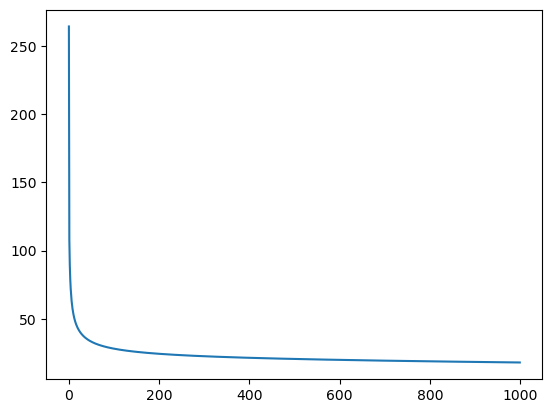

Activated Output [0.99989105 0.99999462 0.99892286 0.15139419 0.03197545 1.
 0.22964959 0.00000373 0.00000086 0.00018349 1.         0.99992069
 0.00008928 0.0006955  0.97669685 0.00590219 0.00084024 0.00000746
 0.00583705 0.00000332 1.         0.12810755 0.00978412 0.06115518
 0.99999987 0.00007594 0.00001859 0.99965051 0.00000996 0.00045218
 0.35892116 0.543276   0.00040138 0.62658403 0.16604136 0.00005149
 0.00071577 0.00217697 0.00005393 0.00014722 0.00034519 0.00000534
 0.01244125 0.93475287 0.00137697 0.00420838 0.00001887 0.00004003
 0.05711458 0.00075368 0.04555138 0.99928648 0.00085526 0.00000107
 0.00006831 0.99939995 0.00001346 1.         0.00083211 0.00000466
 0.0612705  0.00204597 1.         0.0000193  0.00029303 0.00487298
 0.99034625 0.00007679 0.99933441 0.02181897 0.99997809 0.0002641
 0.8416218  0.00000103 0.00888981 0.99989093 0.00004039 0.0015748
 0.99981158 0.00000104 0.00555387 0.00018111 0.99999888 0.00000966
 0.03429429 0.00005806 1.         0.00065776 0.99294319

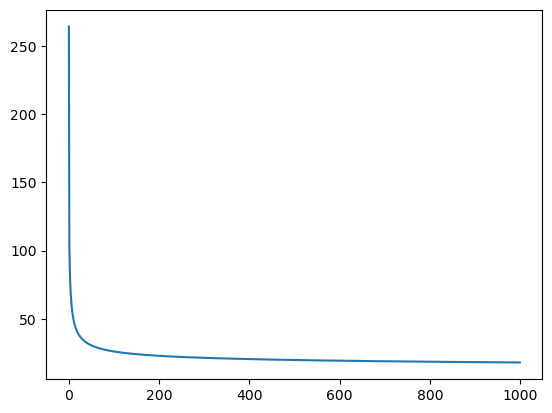

Activated Output [0.00788351 0.00002007 0.00223048 0.00004115 0.34215799 0.00059369
 0.10666364 0.06950289 1.         0.90127248 0.99989523 1.
 0.00085318 0.00571932 0.18629983 0.99864971 0.00000641 0.0033216
 1.         0.01036687 0.99991144 0.34850434 0.00266576 0.0000135
 0.00114031 0.00000143 0.08449769 0.00014962 0.00000902 0.71667779
 0.99999887 0.0028809  1.         0.00000006 0.00000106 0.99999734
 0.0001963  0.99999542 0.99999095 0.99908012 0.99999997 0.0679797
 0.99998624 0.97987848 0.99991496 0.00015762 0.99999925 1.
 1.         0.99999952 0.00000078 0.0000419  0.90467722 0.99903368
 0.99995806 0.96789856 0.99999958 0.99999995 0.99999966 0.99911763
 0.00019087 0.00031999 1.         0.00136217 0.99746568 0.96687415
 0.00000686 0.00049804 0.99998658 1.         0.99994165 0.00010518
 0.23424646 0.00002146 0.9988603  0.0012019  0.00266065 0.00000993
 0.18800374 0.00012922 0.00000287 0.99962764 1.         0.02139277
 0.00002859 0.02971265 1.         0.00039942 0.00043615 0.003679

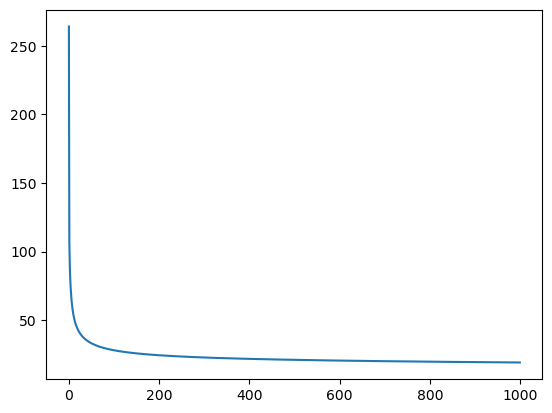

Activated Output [0.99872576 0.00005565 0.99462294 0.0000029  0.00537741 0.99999989
 0.00001959 0.20295896 0.00000021 0.99999997 0.00340854 0.00000855
 0.00000991 1.         0.01189129 0.00032251 0.99999991 0.00006731
 0.99211053 0.00128499 0.08409186 0.99966317 0.00001707 0.88675475
 0.00008371 0.97266284 0.99998531 1.         0.75547505 0.02740202
 0.46533359 0.98738514 0.99957643 0.99999511 0.02930693 0.99999984
 0.00006356 0.01099636 0.09781847 0.9951414  0.99999977 0.00637457
 1.         1.         0.83698429 0.00001589 0.00001317 0.00028721
 0.29115864 0.99999999 0.08330516 0.99994442 0.99946474 0.00443929
 0.00000255 0.97651165 0.0980278  0.01574785 1.         1.
 0.00776257 0.98872722 1.         1.         0.99999095 0.00270027
 0.00002825 0.99346091 0.99996815 0.99956337 0.00001203 0.00051245
 0.00137894 0.06200644 0.0212599  0.3931536  0.24411696 0.00012017
 0.00108215 0.00002479 0.00003437 0.99933221 0.00474647 0.00000002
 0.00021467 0.00009709 0.00548822 1.         0.000001

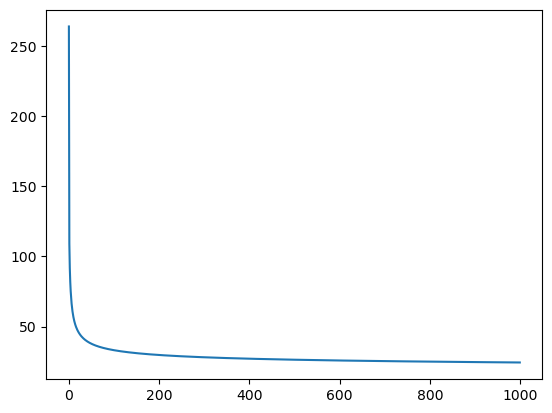

Activated Output [0.99999916 0.9999785  0.9999682  0.99997692 0.99434863 0.01102126
 0.00000723 0.99999999 0.00004628 0.95641492 0.00822599 0.00009991
 0.99989578 0.0173312  0.99999979 0.02049661 0.00467606 0.00000001
 0.0000323  0.00000878 0.00837037 0.00086372 0.99968216 0.00023565
 0.00002287 0.00610543 0.99999999 0.         0.00027671 0.00000071
 0.00000008 0.00043358 0.00012171 0.01350076 0.9999498  0.00010575
 0.00089338 0.99951673 0.00000664 0.00805709 0.00060844 0.99742468
 0.00038717 0.99927951 0.01701743 0.99999993 0.99998464 0.67141343
 0.00156793 0.00371944 0.99986477 0.99999999 0.00108542 0.00821746
 0.00000006 0.05142137 0.00164683 0.03749769 0.15196104 0.22939101
 0.00008418 0.00004965 0.99999965 0.00046558 0.03441356 0.07530906
 0.01458784 0.00018299 0.97559913 0.00049194 0.00239157 0.99970469
 0.76946867 0.00011262 0.15814017 0.99683478 0.00074379 0.00652513
 0.03775219 0.00240163 0.00065497 0.06698845 0.17783197 0.00304974
 0.00000779 0.99999859 0.99999361 0.01413126 

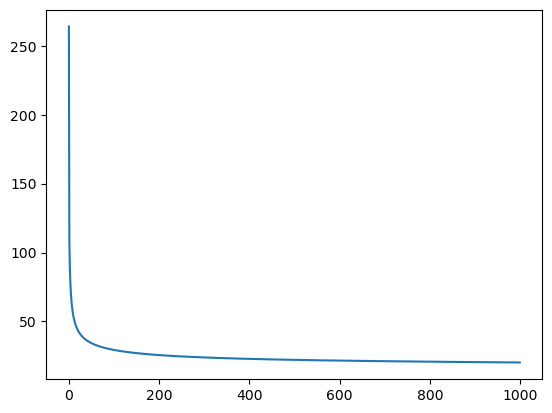

Activated Output [0.00007173 0.99895109 0.02099639 0.99999969 0.00422679 0.98341802
 0.00018269 0.00029482 0.99999993 0.99503833 0.0143943  0.00029747
 0.99999934 0.00002225 1.         0.00007685 0.95471414 0.0173144
 0.00914978 0.02542079 0.00000029 0.00023987 0.00074484 0.00243574
 0.00666417 0.99999909 0.00000642 0.99999999 0.         0.99991076
 0.0102175  0.87392676 0.00592059 0.01230222 0.07677461 0.00158871
 0.98145737 0.99999982 0.00001267 0.00000139 0.99999968 1.
 0.00008553 0.99996613 0.00014606 0.99998803 0.99999805 1.
 0.05115853 0.99999942 0.74339361 0.99929179 0.00187454 0.00053402
 0.01189192 0.32683678 0.00064178 0.26125232 0.0000032  0.007162
 0.02655902 0.00000015 0.99999999 0.99980378 0.00020101 0.00001956
 0.00028833 0.00000574 0.99999992 0.00133891 0.00000204 0.00857942
 0.9999794  0.99999994 0.00146062 0.00001173 0.96067936 0.00001025
 0.00029725 0.00239704 0.63967321 0.99999956 0.00367059 0.00003278
 0.00004144 0.10798338 0.99900333 0.37971392 0.97722114 0.000003

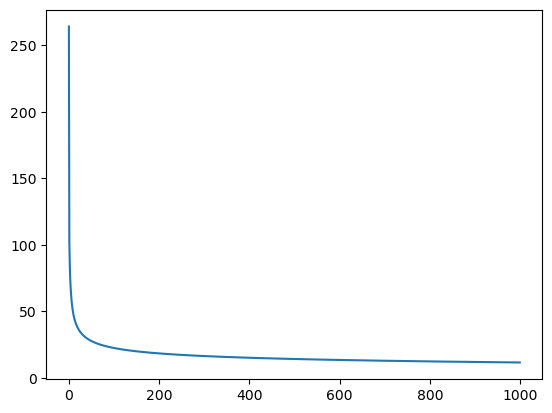

Activated Output [0.00027311 0.00001358 0.00031229 0.00081145 0.00292035 0.97083778
 0.13846783 0.00000628 1.         0.0004364  0.00001628 0.99999956
 0.99917933 0.99798854 0.00556031 0.         0.00000015 0.01353908
 0.00124836 0.0001475  0.16356184 0.98639352 0.99999634 0.89934074
 0.00878076 0.00000006 0.00000001 0.99999996 0.00000072 0.00001234
 0.18789084 0.85961794 0.00000898 0.00000007 0.99990361 0.25302363
 0.00003375 0.00000108 0.00512763 0.99999999 0.00406623 0.00002149
 0.10443148 0.00465896 0.00357158 0.997542   0.00008808 0.00007176
 1.         0.00041885 0.00000424 0.00000033 0.00000022 0.01974482
 0.00000269 0.06052331 0.00014481 1.         0.00967804 1.
 0.00000058 0.96616636 0.01022911 0.00048605 0.00006486 0.00309199
 0.45870291 1.         0.99990975 0.00947806 0.00000451 0.98389855
 1.         0.00002846 0.01352398 0.99999997 0.99999974 0.99752418
 0.00058069 0.00008322 0.99996594 0.00000004 0.01829534 0.00412718
 0.00005502 0.9992397  0.00040312 0.00004551 0.960384

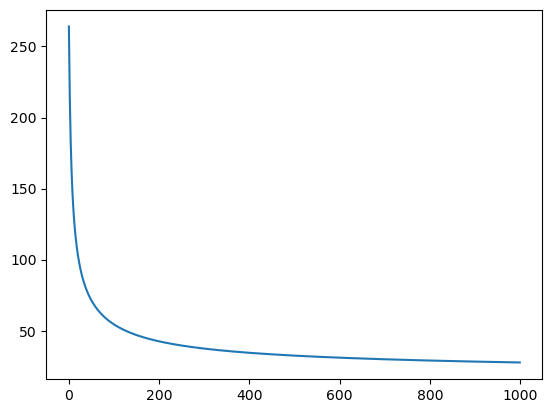

Activated Output [0.99836331 0.99664706 0.99770611 0.99298121 0.03260218 0.0030113
 0.9990678  0.08515605 0.00081441 0.00004327 0.00252163 0.83547183
 0.00986541 0.43332122 0.00720935 0.79641557 0.25505331 0.00906465
 0.99996078 0.9990782  0.00007842 0.87632351 0.00788651 0.06241971
 0.03945428 0.02937999 0.0072939  0.005486   0.00399288 0.15178929
 0.13541492 0.00049691 0.01562914 0.99999737 0.96744043 0.99998428
 0.01164398 0.01506963 0.99484681 0.00145755 0.00022319 0.00025875
 0.00189423 0.02238126 0.99948027 0.00212705 0.0701242  0.99996327
 0.97153204 0.00366889 0.02014874 0.99994232 0.94394899 0.15752303
 0.98007107 0.00442396 0.7325249  0.00582636 0.03123625 0.99999851
 0.97431338 0.01208561 0.99998885 0.00127929 0.57874686 0.99999889
 0.00156181 0.05002204 0.57792256 0.00230779 0.12602846 0.00358803
 0.19449623 0.99999827 0.01671602 0.00860143 0.95067247 0.97927437
 0.15547559 0.999996   0.00086013 0.01106401 0.0007897  0.9998297
 0.00011615 0.00056425 0.9825042  0.99997021 0.

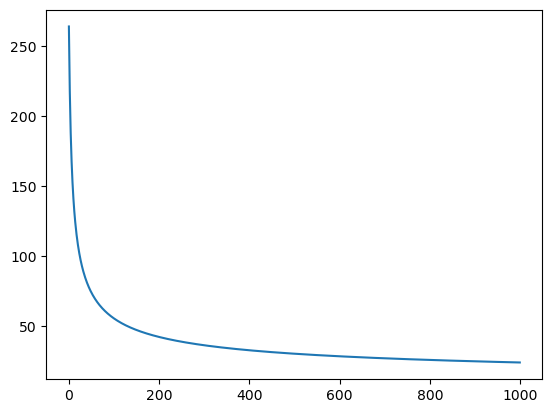

Activated Output [0.29240509 0.99999761 0.99994899 0.15431197 0.99435466 0.00338016
 0.00177473 0.99958283 0.93230182 0.00023726 0.99999903 0.99969042
 0.00017298 0.0034381  0.00131409 0.14404253 0.00005651 0.40823898
 0.02616267 0.00141336 0.05715783 0.86715385 0.99561557 0.88242172
 0.06424009 0.11203247 0.06073329 0.05085371 0.19543483 0.02511378
 0.99031571 0.2088696  0.00062521 0.99999478 0.00038614 0.85174233
 0.01596231 0.01318094 0.00506457 0.00510942 0.89569522 0.00026842
 0.00025009 0.11774121 0.99999981 1.         0.11990955 0.17488104
 0.99995998 0.00503354 0.98350408 0.99999904 0.02797073 0.95623908
 0.00112097 0.00049383 0.00006537 0.00030566 0.00374869 0.0026732
 0.99494993 0.01382134 0.99632328 0.3966874  0.99831465 0.99874255
 0.99981688 0.98666166 1.         0.01424142 0.04243376 0.11994845
 0.00035783 0.00002132 0.99117677 0.33128204 0.00278677 1.
 0.02342529 0.99999953 0.05177656 0.99921509 0.84141394 0.00049167
 0.85359183 0.16679252 0.00052566 0.58870106 0.6991728

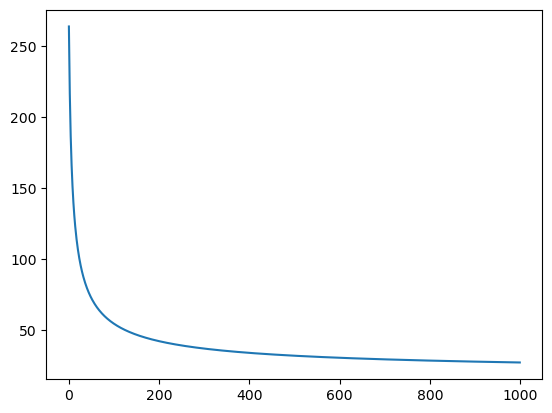

Activated Output [0.05572093 0.97792238 0.00090981 0.99997331 0.99987398 0.01875745
 0.02178873 0.39960309 0.99999784 0.17730701 0.11964615 0.00258577
 0.16763306 0.00115081 0.85677744 0.99723549 0.9972463  0.99918516
 0.02312236 0.98038807 0.99793972 0.99754428 0.99999679 0.1167494
 0.99998861 0.99999758 0.01540723 0.12400414 0.07746141 0.98173709
 0.99892368 0.00254793 0.00226793 0.04703359 0.99992797 0.00118801
 0.00023193 0.00223429 0.99940997 0.17132768 0.99999874 0.00195887
 0.9319434  0.00004542 0.00009449 0.00106741 0.00079415 0.00339096
 0.08008794 1.         0.38289643 0.02862007 0.98867121 0.99995646
 0.01696824 0.99389132 0.00523009 0.98737775 0.98399607 0.99999999
 0.99999869 0.00022513 0.00383784 0.73988626 0.12857494 0.00070255
 0.99996692 0.0000753  0.50259742 0.59254225 0.00715019 1.
 0.993624   0.0005579  0.00026002 0.05807707 0.99999981 0.08483422
 0.97963179 0.00009376 0.00004106 0.9818999  0.99466726 0.00224182
 0.0023363  0.05302358 0.99949998 0.00597527 0.0005617

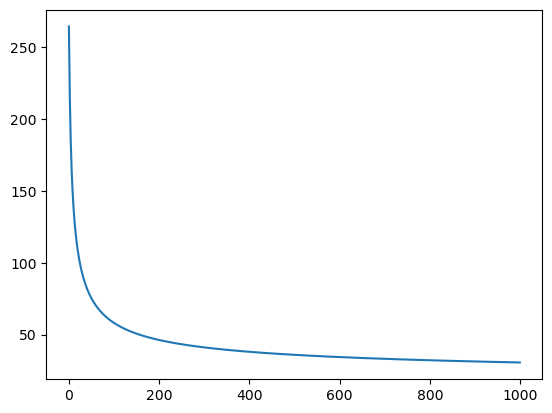

Activated Output [0.00001053 0.1433811  0.00095124 0.01794831 0.00293307 0.00026792
 0.99999346 0.999994   0.00384721 0.00273157 0.00561664 0.0008983
 0.01051341 0.84396894 0.0000056  0.8264848  0.00937498 0.99999986
 0.00250107 0.39628293 0.00048271 0.97186787 0.00610192 0.00316217
 0.99999882 0.12053105 0.99981856 0.51688182 0.03560965 0.05506089
 0.00596675 0.0093315  0.99999942 1.         0.00815334 0.00046809
 0.04142265 0.0009943  0.00383152 0.99887586 0.06293422 0.99993422
 0.00045576 0.9975667  0.99992303 0.00030413 0.00184689 0.00352929
 0.00167357 0.03175806 0.13637278 0.98079496 0.99999975 0.00501516
 0.00240367 0.00044134 0.02199301 0.0064669  0.01330778 0.98599721
 0.06842866 0.00970521 0.00041854 0.99999275 0.99934403 0.00568674
 0.05014188 0.99997918 0.99999845 0.99999983 0.07390301 0.00095987
 0.04100664 0.9999874  0.03235485 0.63511086 0.00007281 0.85705708
 0.99999994 0.99996352 0.84211343 0.95515443 0.25124673 0.00000788
 0.99995681 0.05479062 0.03860147 0.1199685  0

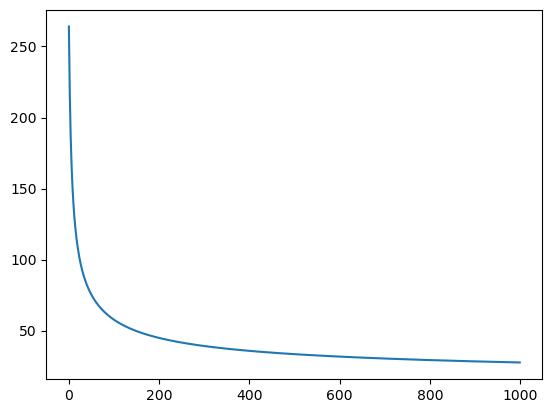

Activated Output [0.99235081 0.00647021 0.99999999 0.01741673 0.22165218 0.00053105
 0.03473516 0.99639785 0.99972735 0.00040371 0.00074475 0.00560965
 0.97752285 0.96389205 0.02103317 0.00009753 1.         0.96668796
 0.11498222 0.99159349 0.0008586  0.99996089 0.99993392 0.01816528
 0.93906546 0.99999893 0.99991246 0.04146499 0.99840299 0.9999933
 0.00117896 0.02034336 0.99836788 0.000004   0.69542323 0.00017193
 0.00006205 0.00628403 0.01670593 0.00302364 0.01302448 0.00344631
 0.50490912 0.00085397 0.00044563 0.00120582 0.56857015 0.04424862
 0.01758323 0.98506386 0.06290871 0.01744957 0.99980299 0.01732789
 0.02183444 0.36523398 0.00585136 0.00025734 0.9999902  0.00235841
 0.00030577 0.02715837 0.03320094 0.99972367 1.         0.00072169
 0.83829097 0.00400613 0.00543005 0.99853574 0.99049817 0.00046405
 0.00495499 0.00002842 0.01699728 0.99662122 0.03251964 0.00516619
 0.60740924 0.99162994 0.02258353 0.00046813 0.99999989 0.93202738
 0.06879097 0.06037648 0.01773932 0.01757495 0

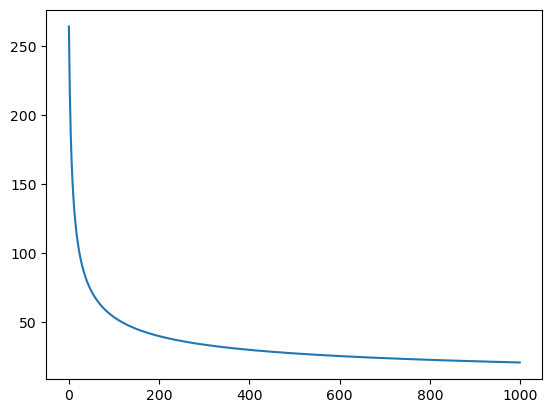

Activated Output [0.04310505 0.00000623 0.00047723 0.00009866 0.99999993 0.96707285
 0.99992137 0.00003944 0.00116554 0.98705511 0.96800489 0.99991031
 0.99999877 1.         0.00005064 0.00185776 0.99998736 0.00269746
 0.99997944 0.00019349 0.0035688  0.99936813 0.99973767 0.01752116
 0.00079872 0.10082684 0.9967351  0.00430029 0.08854458 0.00034711
 0.99770516 1.         0.00048494 0.0003696  0.95134851 0.00088052
 0.00437448 0.02359436 0.00338083 0.99999997 0.99999816 0.961282
 0.99997454 0.95573475 0.99544193 0.3421589  0.00055413 0.00002715
 0.00011615 0.00593925 0.00066778 0.0238385  0.9890855  0.00021819
 0.00375678 0.89403903 0.01618523 0.02545343 0.5256138  0.00000462
 0.03274461 0.00077549 0.01115714 0.00438191 0.00234419 0.00006902
 0.98715461 0.98515162 0.94198674 0.99635041 0.14894902 0.99999997
 1.         0.98933305 0.06313902 0.02467709 0.00003991 0.00050082
 0.00163118 0.99999958 0.13718405 1.         0.00285981 0.06332867
 0.00105262 0.61784035 0.00590529 0.29533177 0.

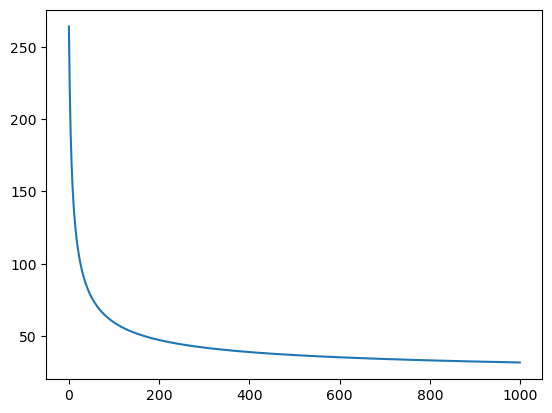

Activated Output [0.00719992 0.97165114 0.00056323 0.06060255 0.99999951 0.08311929
 0.98034006 0.02494573 0.10774281 0.00874798 0.00004671 0.85217749
 0.2170868  0.03877949 0.99095783 0.98615966 0.00101823 0.00272819
 0.44243003 0.01552382 0.24713726 0.99991758 0.01791718 0.00376568
 0.9848031  0.99908492 0.10183294 0.00009306 0.43881716 0.05208421
 0.03296323 0.90594642 0.00054158 0.01242354 0.99999991 0.00102773
 0.00417322 0.99997933 0.9999998  0.02323266 0.28492061 0.03819051
 0.95858449 0.76335354 0.00267622 0.99955161 0.99999993 0.04602518
 0.67293613 0.99589061 0.07319349 0.01237423 0.98517555 0.03997937
 0.99171543 0.04081102 0.99998427 0.99995998 0.99999999 0.01510989
 0.998762   0.02547089 0.99983213 0.00029421 0.00365763 0.00007139
 0.96762175 0.03190278 0.00054061 0.9999981  0.00382684 0.99093362
 0.05624903 0.55349393 0.33063167 0.00142371 0.97618166 0.0158298
 0.99660586 0.00023351 0.99908745 0.00332937 0.00314074 0.99225234
 0.00036594 0.0065475  0.33783605 0.00007314 0

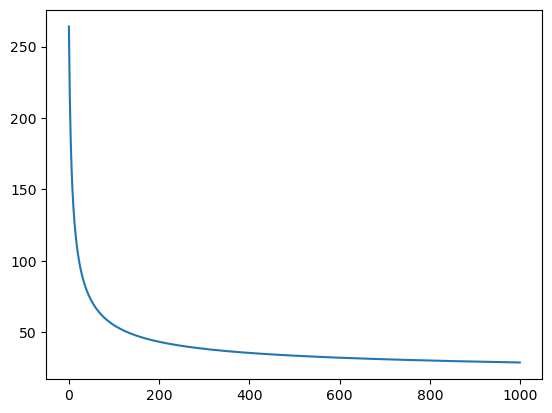

Activated Output [0.00022949 0.00440138 0.01202748 0.00621617 0.70806254 0.39274492
 0.00269313 0.00123942 0.9202905  0.99239177 0.99999988 0.9857229
 0.02750865 0.99994483 0.05204822 0.03432336 0.03976927 0.00632228
 0.00226727 0.66580594 0.02564454 0.0003097  0.00140254 0.02252361
 0.99998191 0.99999999 0.83767445 0.03033267 0.99999551 0.03839645
 0.7717106  0.99999428 0.99952912 0.99883597 0.00068962 0.99971747
 0.0467571  0.00105121 0.00011609 0.002327   0.99999739 0.0049776
 0.99893291 0.0084994  0.9994202  0.99821411 1.         0.03002016
 0.00016136 0.00147235 0.01203648 0.99905961 0.00710929 0.82731369
 0.00078507 0.999997   0.00035852 0.00010571 0.00417371 0.00145566
 0.99999688 0.99843162 0.01710497 0.00220825 0.00136771 0.01395355
 0.98103758 0.23916437 0.08305813 0.00200532 0.01321274 0.08182728
 0.95493705 0.00002693 0.03354725 0.09651169 0.98408272 0.89667107
 0.99999828 0.99927624 0.00230326 0.99819454 0.927782   0.99893922
 0.02385972 0.99999952 0.00508571 0.00087574 0.

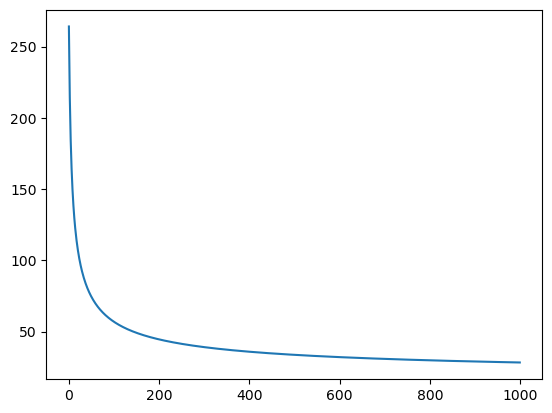

Activated Output [0.01555963 0.30255743 0.24552014 0.12726859 0.00074384 0.99996971
 0.00020896 0.00001912 0.99883972 0.16796548 0.93147657 0.00091175
 0.00134701 0.14684868 0.00291122 0.98128    0.0013594  0.03662868
 0.00072693 0.02894691 0.01524341 0.9999994  0.01542926 0.99802451
 0.99976491 0.04902016 0.04132435 1.         0.99999896 0.54064944
 0.00121981 0.13678407 0.99874048 0.99903805 0.08762145 0.99997868
 0.99893347 0.99900181 0.00184355 0.08468216 0.29246671 0.00038331
 0.99977125 0.00013576 0.00372211 0.11657911 0.00023247 0.99998958
 0.00199673 0.00238613 0.00024638 0.99372448 0.66721147 0.00001424
 0.99999992 0.00190888 0.00014938 0.25574023 0.00550149 0.14919563
 0.80877913 0.98298044 0.99999965 0.00212172 0.9999982  0.00230688
 0.07806616 0.13844765 0.00279818 0.36201602 0.43429557 0.01462324
 0.65197831 0.9999898  0.99066732 0.2142567  0.00147654 0.00585481
 0.00023044 0.99992819 0.04401936 0.00354773 0.99999981 0.0160584
 0.00018311 0.65269479 0.05755102 0.03842443 0

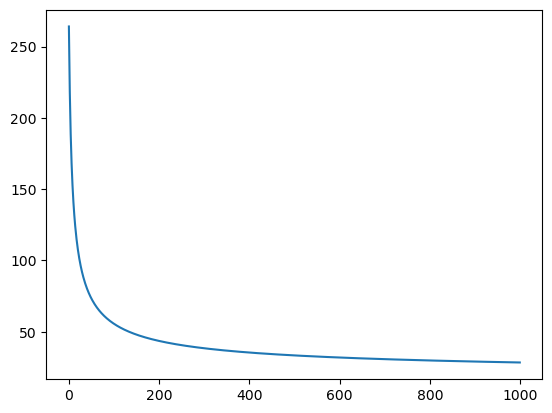

Activated Output [0.9584819  0.85343622 0.88883157 0.00063566 0.89611577 0.99515662
 0.95857321 0.99999996 0.98631853 0.99999266 0.99858028 0.00005752
 0.00022312 0.79750627 0.00574015 0.01122116 0.00084907 0.97856383
 0.51005538 0.00045312 0.8244786  0.670172   0.98662283 0.99762572
 0.00076988 0.0032276  0.77911584 0.00001351 0.13529981 0.99912098
 0.99846478 0.00300934 0.99999754 0.01155489 0.86054078 0.99998401
 0.98841976 0.99999989 0.00068936 0.41596459 0.99994006 0.99991559
 0.00167757 0.99999964 0.01972002 0.01081482 0.07357648 0.99994463
 0.99821293 0.99892669 0.00081954 0.62707327 0.01342517 0.99973063
 0.00016108 0.0025893  0.00293891 0.0505147  0.00022374 0.00076963
 0.01159324 0.99982789 0.12802547 0.00182548 0.99998696 0.97967506
 0.15246434 0.00653323 0.98364837 0.9999964  0.00059147 0.03607621
 0.00012635 0.96018257 0.00023343 0.99976233 0.02650596 0.00216083
 0.84767003 0.91771053 0.01967381 0.12367655 0.00016535 0.99969249
 0.03034751 0.99990854 0.27639403 0.10455109 

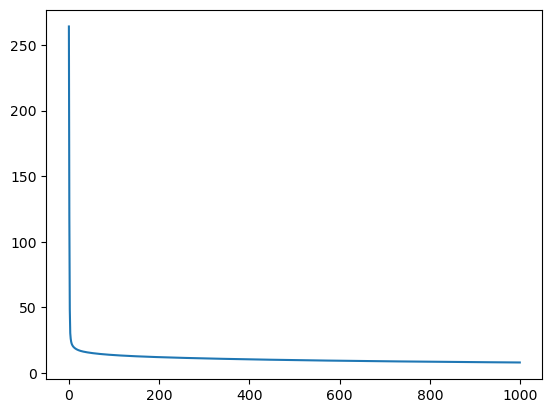

Activated Output [0.         0.         1.         0.         0.00000002 1.
 0.00250553 0.04752788 0.00000007 0.00536787 0.00011533 0.00000194
 0.00473057 0.         0.         0.00008866 0.0000007  1.
 0.         0.         0.00000018 0.00229112 0.24512151 0.00042091
 0.         1.         1.         0.00000018 0.         1.
 0.00000109 1.         0.         0.05923012 0.         0.85899524
 0.         0.999998   0.99999972 0.00035401 0.02248092 0.99999859
 0.00000078 0.0000007  0.00000044 0.         0.99999997 0.00006843
 1.         0.99999997 0.00000001 1.         0.00008492 0.
 1.         1.         0.00000059 0.99998151 0.00000002 0.29036177
 0.00000041 0.         0.00000549 0.         0.00531136 1.
 0.00820988 1.         0.99994806 0.         0.07938122 0.99999999
 0.00000614 0.99839371 1.         1.         0.98377252 1.
 0.08087275 0.99999878 0.00621498 0.02861008 0.99999992 0.
 0.00002205 0.00000001 0.68797011 0.00000009 1.         0.00000039
 0.00000001 0.00000132 0.99995422 

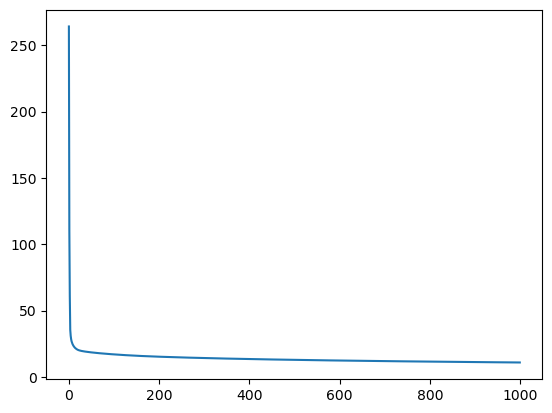

Activated Output [0.01309512 0.90604612 1.         0.99999996 0.00006038 0.00001009
 1.         0.00000234 0.         0.00644315 0.00019263 0.64817154
 0.67090526 0.         0.00179696 0.00000613 0.00504256 0.00001662
 0.99566881 0.00000001 0.00007054 0.00029867 0.00005563 0.00000109
 1.         0.00140603 0.99999952 0.0010442  0.00024276 0.00001812
 1.         0.         0.80424214 0.01431993 0.005304   0.00002203
 0.0003906  0.00000028 0.00000001 0.00000131 0.99943121 0.99663073
 0.00069839 1.         0.00066649 1.         0.0689804  1.
 1.         1.         0.00053472 0.00231427 0.         0.00043619
 0.00000322 0.003182   0.00000869 0.00000626 0.00004243 0.00000239
 0.00000004 0.00058864 0.00000021 0.00002095 0.99999331 1.
 0.00182509 0.00000378 0.         0.99986585 0.9997221  0.00485889
 0.00382512 0.00001275 0.01611047 0.00000007 1.         0.00003313
 1.         0.00042814 0.00000139 0.0704046  0.00000001 0.
 0.00000071 0.00004042 0.99999932 0.         0.00105489 0.00000983
 0

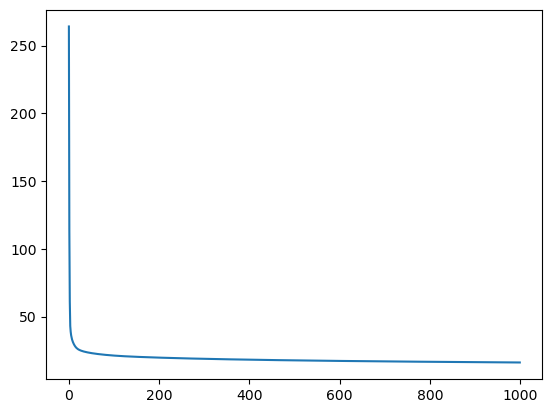

Activated Output [0.11173241 0.00247324 0.00004386 1.         0.03618959 0.00000016
 1.         1.         0.06586573 0.35026408 0.17051996 0.00000135
 0.00082509 0.0006571  0.         0.99999597 0.0000116  0.01211445
 0.1336419  0.0098097  0.9968184  0.99999886 0.01153262 1.
 0.00001529 0.00513377 1.         0.00000004 1.         0.00000304
 0.01088902 0.00039884 0.9999768  0.00037728 0.00001894 0.00000006
 0.00000256 1.         0.09416516 0.00000002 0.00008672 0.90842155
 1.         0.00002309 0.01250525 0.9936045  0.00130261 1.
 1.         0.0002321  0.0000181  0.01188217 0.00000004 0.0051514
 1.         1.         0.00000011 0.11304044 0.0000002  0.00002634
 1.         0.00000625 1.         0.00000005 0.99997151 0.99999974
 0.85455557 1.         0.00044957 0.99999926 0.00267691 0.99998981
 0.00311936 0.0003533  0.         0.00000298 0.00164129 0.00352604
 0.00000001 0.         0.         0.99972516 0.00000007 0.00000764
 0.89160411 0.00000162 1.         1.         0.00035805 0.0000

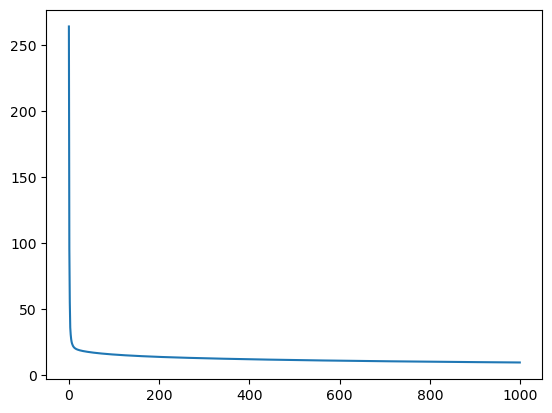

Activated Output [0.00000001 0.00000002 0.00195196 0.99999772 0.0000004  0.99927161
 0.0000016  0.0000038  0.99580572 0.00000707 0.00011995 0.00000001
 0.01062071 1.         1.         0.0000218  0.00000001 0.00353132
 0.99718614 0.         1.         0.         1.         0.18806247
 0.00001398 0.00007681 0.         0.         0.00000004 0.
 0.09165911 0.00000008 0.00054214 0.00000833 0.00574    0.00232766
 1.         0.         0.00009551 0.00000003 0.99999973 1.
 0.9999999  0.         1.         0.         1.         0.00000001
 0.00000097 0.99986789 0.00464916 0.         0.0000001  0.00067346
 0.68259351 0.14449981 1.         1.         0.00000002 0.00003204
 0.00000169 0.99999994 1.         0.99999916 0.00000121 0.
 0.         0.00000038 0.00008747 0.         0.97848192 0.99945597
 0.0001232  0.0000001  0.79056413 0.21125251 0.00046929 0.99998743
 1.         0.00000002 0.00000508 0.11819573 0.0000328  1.
 0.13330049 0.00000091 0.         0.00211254 0.00000029 0.00001192
 0.9967008

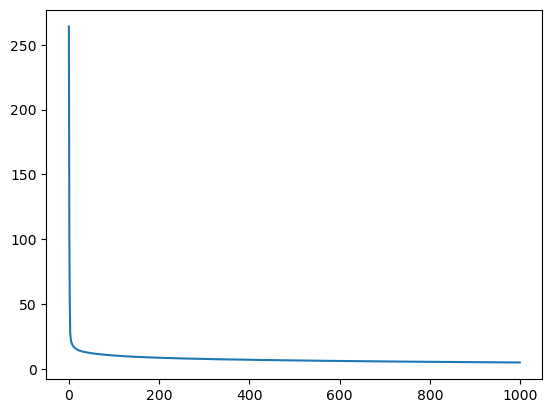

Activated Output [0.         0.         1.         0.02273398 0.96784437 1.
 0.7961232  0.         0.         0.99208504 1.         0.99290436
 0.00000015 0.00000022 0.00001764 0.         0.00000001 1.
 0.         0.00000279 0.00000004 0.         1.         1.
 0.15256923 0.99993994 1.         1.         0.27585876 0.00007835
 0.         0.00000015 0.00001787 0.00057901 0.         1.
 1.         0.00012354 0.         1.         1.         0.
 0.9988238  0.00000002 0.00000914 0.         1.         0.03039426
 0.00000966 0.00055463 0.00000007 0.00000002 0.0000002  0.
 0.08288189 0.         0.00000342 0.99989491 0.         0.48625757
 0.         0.00000008 0.00002456 0.         0.99999997 0.00300077
 0.00242489 0.         0.         0.         1.         0.00000001
 0.         0.00150147 1.         0.9999988  0.00007914 0.00000001
 0.00010545 0.00000463 1.         0.         0.         1.
 0.00000109 1.         0.00000005 0.00013093 1.         0.00000024
 1.         0.00000027 0.99999916 

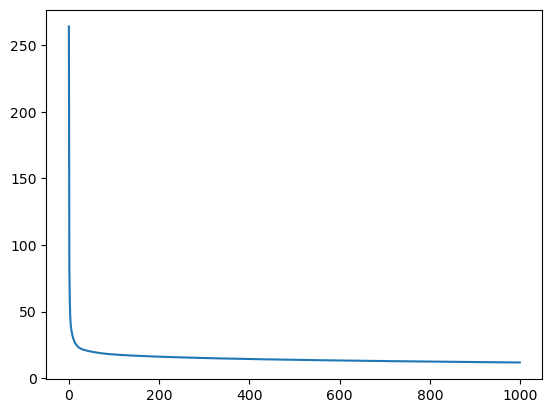

Activated Output [1.         0.00089678 0.96009758 0.00003616 0.84891809 1.
 0.99946018 0.9995628  0.00000996 1.         0.99999983 0.00008219
 0.99999993 0.00013027 0.99999747 0.00059458 0.68745461 1.
 0.0005455  0.99287634 0.01770257 0.00000027 0.00000021 0.00025395
 0.00229219 0.00000001 0.0000014  0.00316046 0.00033899 1.
 0.00458494 0.00000001 0.84116555 0.99999999 1.         0.99999997
 0.99999999 1.         0.99999999 0.00001738 0.00014177 0.99999995
 0.00000777 0.00000651 0.00297844 0.14339019 0.         0.00000329
 0.00239504 0.0000005  0.0000505  0.99999927 0.00010905 0.00000001
 0.99982243 0.02267013 0.0000086  0.00000888 0.00028644 0.05563443
 0.00001324 0.0041269  1.         0.00148671 0.99998097 0.00003636
 0.00000067 0.99999997 0.29157436 0.00000075 0.99999942 0.02822832
 0.00000001 0.00004446 0.00001495 0.94874219 0.13300303 0.00000124
 0.73872765 0.9955403  1.         0.         1.         1.
 0.30612499 0.00006577 0.00004752 0.00000028 0.00092914 0.818223
 0.00805781 

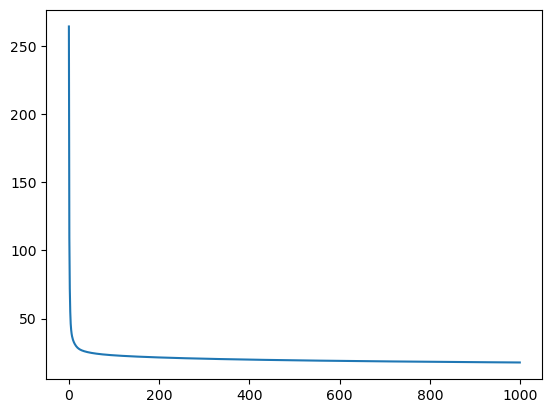

Activated Output [0.33929849 0.0000359  0.00039313 1.         1.         0.00209114
 0.00197484 0.00000002 0.00001092 1.         1.         0.18559716
 0.00000586 0.00371919 0.01064334 1.         0.00004424 0.00003328
 1.         0.99998736 0.00000006 0.00019562 0.00070164 1.
 0.99999999 0.00401311 0.00018408 0.05787898 0.00101997 0.00012192
 0.02623994 1.         0.87574313 0.14087664 1.         0.99994819
 1.         0.07573975 0.00000644 0.021271   0.99999992 0.00000347
 0.000006   0.00000015 0.99999041 0.00029889 0.99999983 0.00000204
 0.         0.10918244 0.99975121 1.         0.00007556 0.04910086
 0.00002043 0.00000253 0.00000152 0.00005133 0.62888127 0.00634753
 0.00203403 0.00002263 0.01124969 0.99999997 0.99999944 0.00000056
 0.00001173 0.00046914 1.         0.00000683 1.         0.00378862
 1.         0.45903246 0.00029177 0.00029922 0.1106332  0.00001226
 1.         0.00068783 0.00000012 0.00046397 0.01101726 0.00059992
 0.22341044 0.00000051 0.00053876 0.93001367 0.000000

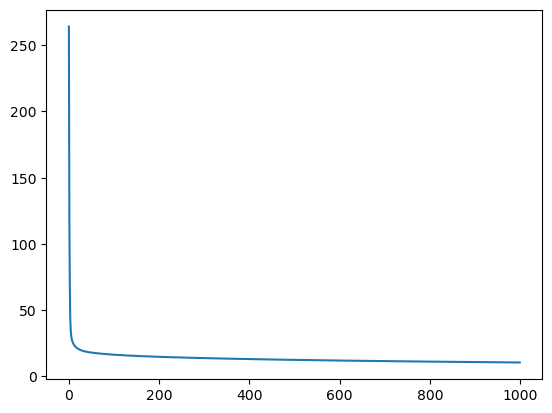

Activated Output [0.00000012 0.01023686 0.         0.00000196 0.00234011 0.77882046
 1.         1.         0.99995147 1.         0.23746808 0.00002533
 0.99958473 0.         0.00956458 0.99999925 1.         0.00006173
 0.00000086 1.         0.0575879  0.00513579 0.17948272 0.93768428
 0.00181485 1.         0.00000235 0.99999999 0.99988369 0.00000976
 0.00000003 0.00000067 0.99999216 0.00036809 0.00003109 1.
 0.00000084 1.         0.00000001 0.00000001 1.         0.00000041
 0.99999992 0.99999987 1.         0.99998059 0.00000761 1.
 0.00000003 0.00000998 0.99999892 0.99992107 0.00049664 0.22457644
 0.00009036 0.00108514 0.00000084 1.         0.00000711 0.00374114
 0.00004848 0.99999997 0.99282484 0.0000051  0.00020739 1.
 1.         1.         0.00001308 0.00000008 0.00760181 0.
 0.00000001 0.06086578 0.00000002 0.00001696 0.00053565 0.00697848
 0.00001278 1.         0.09567561 0.00000015 0.00000044 0.00000027
 0.0212039  1.         0.99999946 0.         1.         0.17303439
 0.0000002

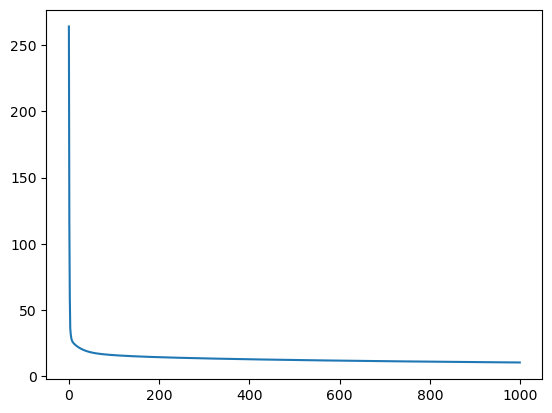

Activated Output [0.00004539 0.0000006  0.99999999 0.00059252 0.00000091 0.00001151
 0.99999895 0.         0.99999938 0.06336854 1.         0.00002508
 0.0050432  0.0002254  0.0001358  0.00055746 0.00000005 0.00000002
 0.00000002 0.00003941 0.17487103 1.         0.99999044 1.
 1.         1.         0.00023622 0.00011759 0.00040906 0.00000093
 0.00011552 0.         0.00000011 0.99999286 0.00000001 0.00000086
 0.93493583 0.00014009 0.00004866 0.99999991 1.         0.00077578
 0.78321557 0.00000046 1.         0.00001218 0.00000001 0.00001698
 0.         0.00006133 0.00000314 0.99999999 0.0367052  0.00000005
 0.00000004 0.00000009 0.         0.00000022 1.         0.
 0.99998783 0.99999997 0.34339704 0.0017084  0.         0.00000698
 0.         0.00007478 0.00320048 0.00017971 0.9998211  0.00036508
 0.00000009 0.00000001 1.         0.         0.99999702 1.
 1.         0.00879781 0.99998898 0.14327627 1.         0.00009432
 1.         0.         1.         0.00000076 0.99881807 0.99999996
 0

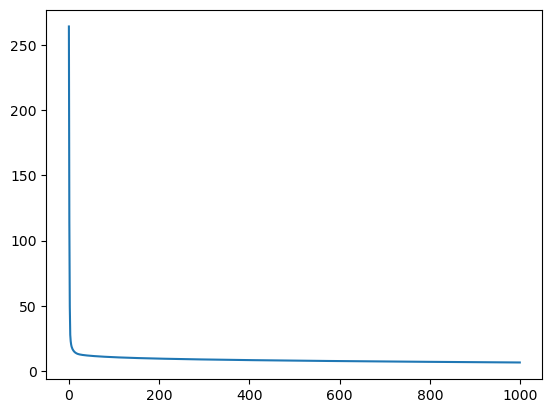

Activated Output [0.         0.         0.         0.00037101 1.         0.91834793
 0.99999754 0.         1.         1.         0.00000096 1.
 0.         0.00000174 0.36683391 0.99999996 0.99871189 0.
 0.00000007 0.23365865 1.         1.         1.         0.
 1.         0.00000001 0.0000006  0.         0.99999999 1.
 0.99999926 0.         0.00000013 0.99999999 0.0004848  0.00000002
 1.         1.         1.         0.00006273 0.15928818 0.
 0.00032367 1.         0.00127589 0.         0.00000187 0.00013569
 0.00109845 0.         0.00001597 1.         0.99998482 0.00004054
 1.         0.00000425 0.         0.00000027 0.00000051 0.99997973
 0.         0.99999965 0.0010441  0.99999998 0.         0.99940516
 1.         0.37903743 0.00000044 0.03283259 0.00000017 0.02517051
 0.         0.00000014 0.         1.         0.00000778 0.96835241
 1.         0.00036012 0.99999983 0.99999654 0.         0.00009298
 0.00011834 0.99999964 1.         0.99999945 0.         0.99307175
 0.00243201 0.0173

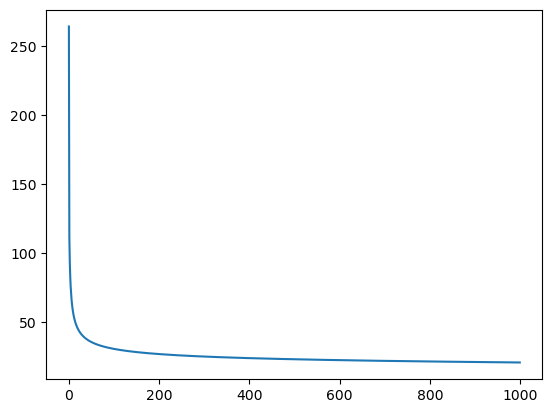

Activated Output [0.00052595 0.00037899 0.00318294 0.00055012 0.99999664 0.98160656
 0.00018004 0.10191212 1.         1.         0.00019621 0.99781062
 0.99457985 0.99109745 0.00003988 0.00012712 0.00388419 0.99997724
 0.99998639 0.99999937 0.08216216 0.01882712 0.00020347 0.00089351
 0.99999721 0.99999995 0.01852692 0.00000114 1.         0.00000566
 0.97685949 0.97161098 0.97168911 0.00411377 0.06711343 0.00000034
 0.00920641 0.99999804 0.00005899 0.00179157 0.99985574 0.02443088
 0.00211462 0.11131159 1.         0.00012693 0.00197357 0.99999908
 1.         0.00000071 0.04617714 0.00002935 0.9993715  0.66516085
 0.99990423 0.00006247 0.99999958 0.00000657 0.00168734 1.
 0.89983814 0.0388     0.00004465 0.00000497 0.00104213 0.00003333
 0.85273024 0.99993828 0.00000593 0.16526356 0.0952717  0.00000064
 0.00027992 1.         0.00044905 0.08433644 0.00013977 0.00000006
 0.00004472 0.00163145 0.0180783  0.00000731 0.00301322 0.98056279
 0.99986153 0.00740288 0.07509289 0.02757785 0.000010

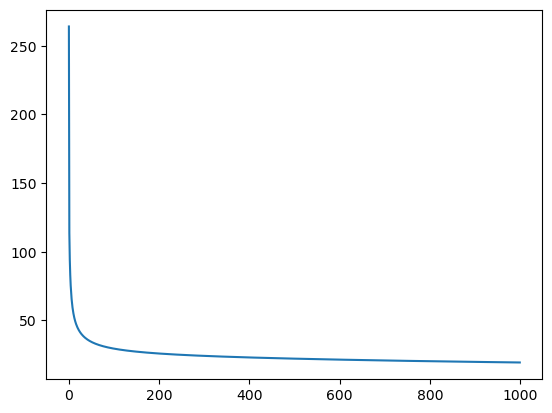

Activated Output [0.99998437 0.99018348 0.00000091 0.00482907 0.01746372 0.00000532
 0.96752137 0.00000218 0.99387747 0.99999998 0.99999318 0.00014603
 0.00167801 0.00275018 1.         0.07054411 0.00027437 0.98686657
 0.65920467 0.99994555 0.00000002 0.00406925 0.00027664 0.17216491
 0.00376792 1.         0.99999998 0.00006962 0.00000182 0.00000262
 0.99999868 0.0002857  0.21189543 0.00455859 0.00153159 0.00004168
 0.00002659 0.99998838 0.99999993 0.99999996 0.00000584 0.00003302
 0.01040565 0.00011438 0.05944071 0.01811445 0.00004246 1.
 0.98434374 0.99999999 0.00263432 0.1224091  0.01920909 0.00091863
 0.0000446  0.00145425 0.89227559 0.00895614 0.00002344 0.99999996
 0.99999999 0.00011545 0.00043201 0.9794876  0.02860744 0.99999962
 0.00002888 0.01619121 0.00040606 0.00021519 0.00920267 0.00000033
 0.00018741 1.         0.00308812 0.00010485 1.         0.99999994
 0.99823014 0.99524394 0.34049993 1.         1.         0.00139901
 1.         0.00000416 0.00001418 1.         0.000030

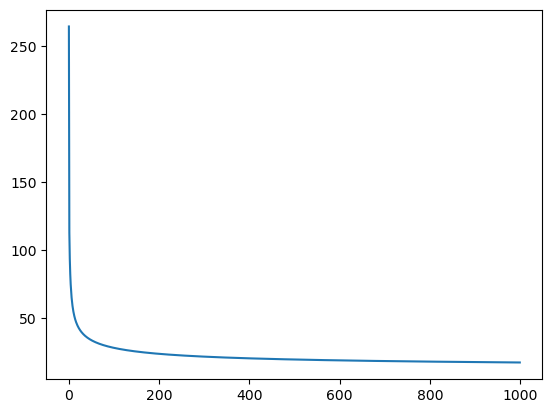

Activated Output [0.01657335 0.99999999 0.00034298 0.19319969 0.00000004 0.99999998
 0.06611082 1.         0.00052112 0.00000084 0.00361727 0.00060837
 0.15045961 0.0007845  0.99999999 0.99999964 0.00040284 0.0000098
 0.00004344 1.         0.00264929 0.00002987 0.99964518 0.00003276
 1.         1.         0.99999983 0.99999897 0.00000408 0.1991849
 0.00000171 0.00000692 0.00061417 0.00001084 0.00347652 0.08732951
 0.00000152 0.00035    0.0000321  0.89287105 0.00279141 0.02501504
 0.00319273 0.01139054 0.0067605  1.         1.         0.00000173
 1.         0.00137198 0.00105821 0.00551094 0.00003109 1.
 0.02329268 0.00487788 0.00000048 0.999903   0.97631635 0.99962644
 0.00000071 0.00019566 0.99999999 0.10722553 0.14555263 0.00006436
 0.00011958 0.00000012 0.00000028 0.00000487 0.00338029 0.06783061
 0.71940196 0.0051763  1.         0.99999898 0.00020358 1.
 0.33284099 0.0000869  0.06160511 0.0000478  0.43360333 0.00000619
 0.99996622 0.00012832 0.00107942 1.         0.00086368 0.99996

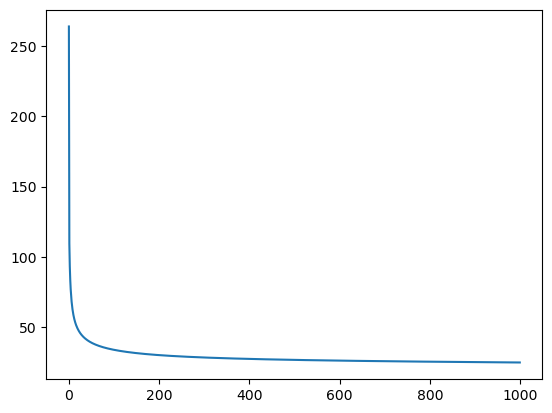

Activated Output [0.02812532 0.00010629 0.00000407 0.00097255 0.0002603  0.01290541
 0.00002317 0.01879414 0.00251511 1.         0.09866455 0.00177785
 0.89922784 0.00035137 0.00000183 0.01632233 0.0001086  0.00000105
 0.00000374 0.00005187 0.00010236 0.01358737 0.01489799 0.00004855
 0.00000282 0.00025178 0.00000416 0.00019748 0.25872417 0.99999677
 0.0037343  0.00086005 0.9999694  0.99725566 0.00064725 0.02151505
 0.00000038 1.         0.33976341 0.01354719 0.00021682 0.99999918
 0.99999976 0.99898981 0.99998004 0.97348016 0.00002912 1.
 0.01303356 0.99999978 0.33591582 0.07121935 0.00010199 0.82006639
 0.00084915 0.99999999 0.00065141 0.70910073 1.         0.00058834
 0.00057095 0.99984805 0.0951428  0.18431104 1.         0.00557685
 0.07744322 0.99554874 0.9992129  0.99958508 0.00016507 0.00025506
 0.93270113 0.00000156 0.52985248 0.00000011 0.97614553 0.00453212
 0.691665   0.09327962 0.00000085 0.00001818 0.00292405 0.00040672
 1.         0.9994526  0.08208673 0.00000583 0.006532

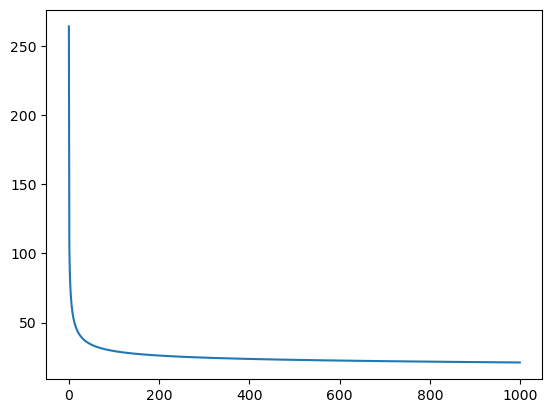

Activated Output [0.99999209 0.00020731 0.99995303 0.99978219 0.00869207 0.00990028
 0.00061629 0.01996166 0.0028676  0.98655922 0.98629078 0.00173484
 0.00002162 0.99979126 0.9999999  0.00000894 0.00569888 0.00009268
 0.23764089 0.0003034  0.01489625 0.34727551 1.         0.00004339
 0.99998671 0.00000934 0.99999999 0.00000349 0.99999846 0.99999962
 0.00000003 0.00000007 0.00040776 0.00727895 0.00051831 0.00009878
 0.00051686 1.         0.00003138 0.00000573 0.99954943 0.00050969
 0.99998595 0.00080464 0.02220812 0.00001377 0.00579888 1.
 0.00022024 0.00107631 0.96640102 0.58574223 0.00004296 0.0008712
 0.00000006 0.00244653 0.06904811 0.00000338 0.42490713 0.99999999
 0.01391494 0.99999994 0.0012697  0.99999968 0.00000887 0.99880777
 0.00008469 0.99999999 0.00351024 0.14756308 0.01712612 0.03875106
 0.81664146 0.00000816 1.         0.00005381 0.00118885 1.
 0.00015387 1.         0.98263365 0.98878313 0.99996117 0.00010291
 0.99919487 0.39588897 0.00000372 0.00033408 0.99998937 0.0002

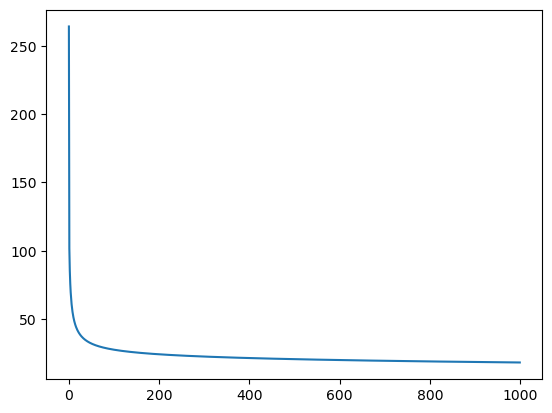

Activated Output [0.00046835 1.         0.00263687 0.99992925 0.00000001 0.00098422
 0.0013541  0.15619467 0.02494548 0.00065083 0.99566037 0.99999775
 0.00000536 0.99938537 0.00913313 0.00004458 1.         0.00037509
 0.99983766 0.00003962 0.06106598 0.98450289 0.00257331 0.99966272
 0.06732456 0.7770853  0.99996066 0.9818802  0.00592222 0.00631773
 0.00000141 0.09187241 0.99971785 0.00112081 0.         0.00019246
 0.00377893 0.00000121 1.         0.00007801 0.99908488 0.99999889
 0.00002274 0.99931253 0.00001144 0.0000366  0.00000007 1.
 0.00108557 0.04768357 0.00000845 0.00144626 0.00033262 0.99149175
 0.25696753 0.00003345 0.75061939 0.99836723 0.0000004  0.00822215
 0.99958265 0.9999952  1.         0.99261957 0.00009495 0.03752911
 0.00002965 0.15277184 0.99962929 0.00056489 0.99992899 0.03494229
 0.99500584 0.00011309 0.00264071 0.00029959 0.00000346 0.99999872
 0.01304195 0.03572668 0.99836927 0.0000298  0.00031626 0.00000028
 0.86927127 0.00012769 0.99987546 0.00013125 0.000001

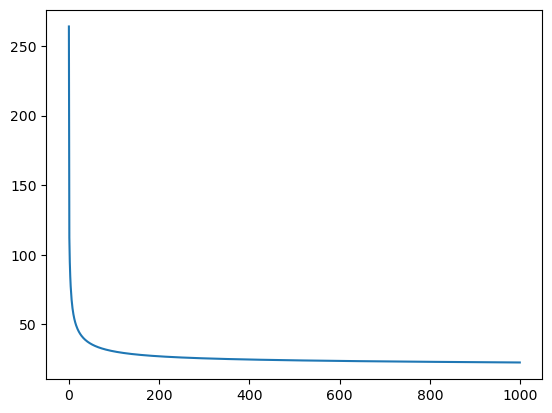

Activated Output [0.00005277 0.00113923 0.95122764 0.44312543 0.99999118 0.00000928
 0.00000582 0.95417509 0.10661638 1.         0.99703287 0.00048649
 0.50039354 0.00762933 0.00014338 0.99802541 0.83817632 0.99993942
 0.00052727 0.0001453  0.03685865 0.25811593 0.00000254 0.00014469
 0.00008324 0.00795831 1.         0.00223974 0.00205266 0.9983354
 0.00012641 0.98716543 0.00060173 0.00002648 0.0690843  0.75558981
 0.99999985 0.99980308 0.00080897 0.13783177 0.99999273 0.00173347
 0.00000965 0.00145325 0.03526201 0.99483284 0.00000384 0.00288587
 0.99938264 0.02487407 0.99043435 1.         0.0134963  1.
 0.0062502  0.00001383 0.00045511 0.00016305 0.00000005 0.9998661
 0.99987325 0.72411121 0.00175307 0.03568311 0.0128812  0.0272066
 0.01665002 0.00102654 0.9547217  0.99745532 0.00008124 0.99999952
 0.99997765 0.00004021 1.         0.00020299 0.97157379 1.
 0.99999939 0.99999632 0.00002566 0.9679215  0.00009437 0.00000251
 0.99999991 0.00270061 0.00001303 0.99999667 0.00000305 0.999993

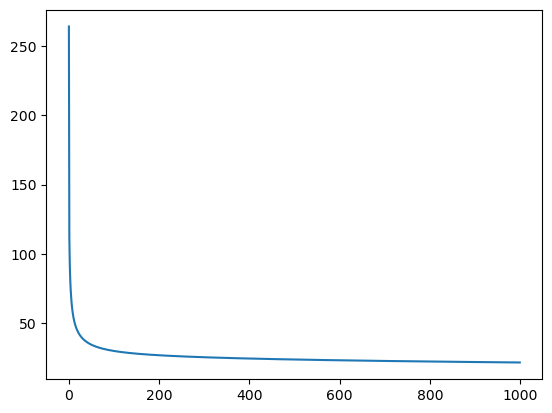

Activated Output [0.0007712  0.00001813 0.01239976 0.00001119 0.0000885  0.00079135
 1.         0.99986883 0.91275984 0.00065341 0.28277617 0.20172366
 0.9860956  0.99999993 0.00404027 0.00062059 0.99999998 0.00000765
 0.01577308 0.01327352 0.99999999 0.00939344 0.00493717 0.0006122
 0.00023824 0.00002228 0.97005723 0.02003673 0.00001519 0.99849938
 0.00000177 0.00076866 0.00004654 0.0805965  0.12921711 0.00210456
 0.         0.99999998 0.00187489 0.00050818 0.06512078 1.
 0.01839343 0.00929263 0.00021882 0.000307   0.00007452 0.00011771
 0.00082411 0.00004418 0.0000197  1.         0.99999786 0.00000505
 0.99981549 1.         0.00071996 0.00001958 0.00437215 0.00001044
 1.         0.00340405 0.99822364 0.00002879 0.999833   0.998937
 1.         0.84178119 0.00011653 0.06794834 0.00449788 0.00003493
 0.01611938 0.98615695 0.00002919 0.00960495 0.00000113 0.00000221
 0.00064212 0.00003775 0.99999922 0.00089208 0.00032647 0.79784327
 0.99991608 0.99999995 0.00161731 0.00899037 0.97352159 

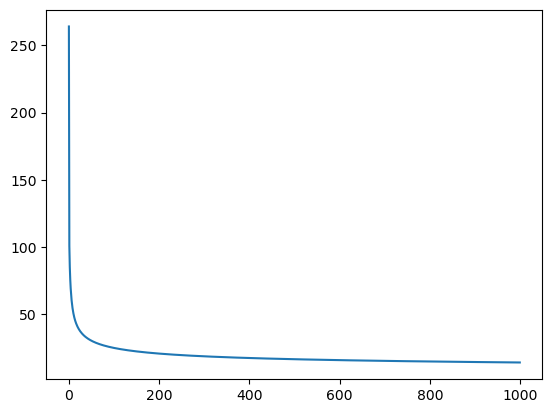

Activated Output [0.00177726 0.00411765 0.9997321  0.08280281 0.00007642 0.00002157
 0.00280479 0.00005548 0.00009076 0.01408952 0.00000364 0.99999619
 0.00000699 0.99999956 0.00000179 0.02470463 0.00003594 0.77430874
 0.99999994 0.02997206 0.9995552  0.01231885 0.99999697 0.99967583
 0.99999794 0.00002015 0.00194043 0.00087343 0.22265271 0.00000752
 0.00000024 0.00000111 0.58926625 0.00001223 1.         0.00145791
 0.00000092 0.56102488 0.99999964 0.00167474 0.00011706 0.00000386
 0.9990484  0.00001059 0.36388624 0.99999886 0.00074055 0.99993924
 0.99497261 0.99999974 0.99284356 0.99963565 0.00169139 0.99999999
 0.01088007 0.09837375 0.99999954 1.         0.99986598 0.00002978
 1.         0.01923157 0.00192385 0.00000963 0.02425045 0.00137907
 0.99974179 1.         0.00000105 0.98090247 0.00001343 0.99999528
 0.07344647 0.00006185 0.96389325 0.00236161 0.74408524 0.00013314
 1.         0.56852579 0.99999721 0.00010131 0.00000999 0.05798104
 0.99999941 0.03379982 0.16840204 0.00120205 

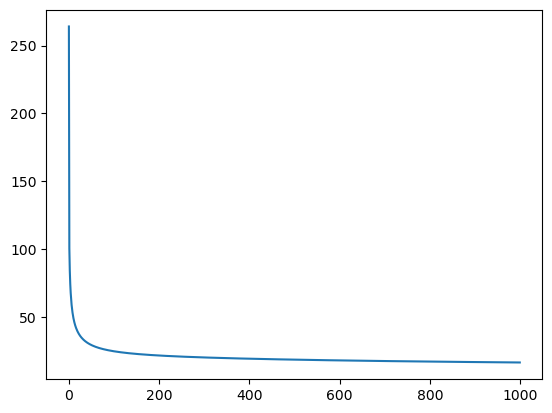

Activated Output [0.98264013 0.99999955 0.00675629 0.99959928 0.00261161 0.92921047
 0.0000768  0.99998739 0.00001045 0.98629948 0.99999999 0.99986101
 0.00962295 0.99864466 0.99945697 0.00000883 0.00033977 0.99998063
 0.00001644 1.         0.00000388 0.99674699 0.99898559 0.93940021
 0.01394418 1.         0.99988635 0.1411611  0.01606118 0.00096104
 0.00038877 0.01636416 0.0000023  0.14655784 0.03772594 1.
 0.99999834 0.028198   0.99867509 0.00000331 0.99999952 0.87502437
 0.00012901 0.99989441 0.99996547 0.00003573 0.00026674 0.99999412
 0.99999917 0.00210103 0.99615572 0.0002115  0.00000135 0.00093781
 1.         0.00010019 0.00011495 0.01091398 0.01465167 0.0000021
 0.02431298 1.         0.80219948 0.0004128  0.00239869 0.00000733
 0.00504897 1.         0.99999318 0.0262501  0.00002578 0.1651799
 0.00655038 0.00003797 0.1005445  0.06040441 0.00280975 0.00001276
 0.99999969 0.00002593 0.00005006 0.00000125 0.00019023 0.99999966
 0.99999894 0.00253772 1.         0.00145166 0.04501828

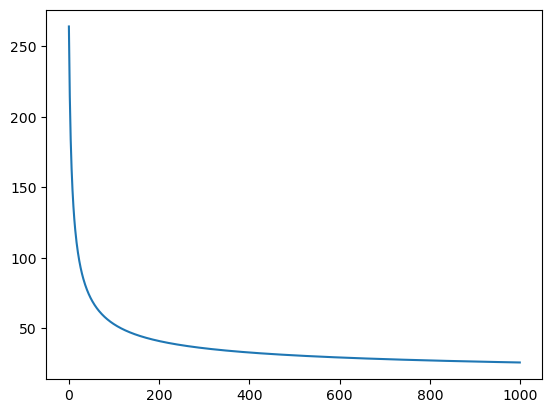

Activated Output [0.9999992  0.00034023 0.50864295 0.55830391 0.98551349 0.02532544
 0.99985555 0.01410035 0.06715356 0.00036866 0.02830072 0.00044582
 0.05117883 0.48221424 0.99079151 0.01051721 0.02845709 0.99849095
 0.00069219 0.00414876 0.05904827 0.00220039 0.00653623 0.12176765
 0.9999885  0.00023937 0.0003087  0.98396298 0.92044932 0.00553034
 0.00182653 0.99429226 0.99999991 0.99960184 0.99836538 0.99999618
 0.16912005 0.06978995 0.12248515 0.00130135 0.00281354 0.00015229
 0.0179013  0.00831925 0.8335977  0.67252604 0.01402614 0.99999985
 0.99995931 0.00000901 0.01635895 0.99999886 0.02552774 0.00031022
 0.06770137 0.71817264 0.81462818 0.99585942 0.00031173 0.01506377
 0.98750438 0.99999987 0.94405903 0.00171725 0.9960751  0.00538264
 0.00530414 0.0001628  0.36921288 0.0013907  0.98882753 0.0017497
 0.00199596 0.99853337 0.61203403 0.99999229 0.00030617 0.00162227
 0.00621092 0.0000265  0.00054612 0.02989411 0.10421027 0.0010083
 0.00004281 0.98822586 0.99880775 0.00334936 0.

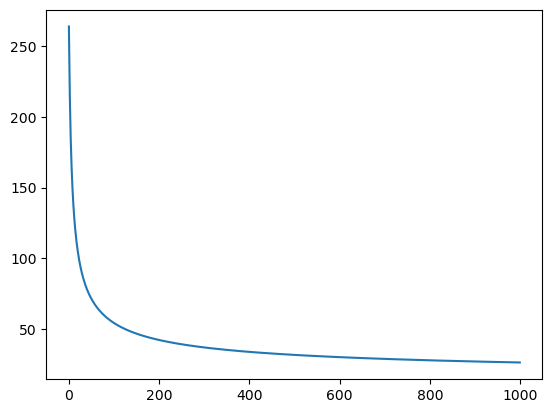

Activated Output [0.90206978 0.01130796 0.0230342  0.99999135 0.99998089 0.16521049
 0.99980008 0.00046031 0.27398451 0.5226949  0.00508113 0.00273811
 0.99989182 0.61064897 0.00504836 0.00000505 0.0021382  0.00200011
 0.00754531 0.00787914 0.12156586 0.00034663 0.00364601 0.04845002
 0.00149092 0.27767719 0.99999773 0.02180073 0.00054782 0.00039055
 0.00286566 0.79938371 0.9318964  0.02758166 0.99999722 0.99999807
 0.01135609 0.01298543 1.         0.99999997 0.99416299 0.02841307
 0.06940642 0.99998649 0.99989903 0.00128043 0.00036077 0.11894875
 0.96676471 0.00220766 0.01469575 0.99999743 0.02101182 0.00752487
 0.04001426 0.00222296 0.11121667 0.00015183 0.0250648  0.08394918
 0.00001817 0.00005753 0.99896068 0.0000517  0.08327402 0.00036598
 0.99999221 0.00622081 0.14262289 0.99989025 0.00035038 0.99841381
 0.05537178 0.93297823 0.96739935 0.00030656 0.9999997  0.00013939
 0.00452038 0.98172997 0.00102793 0.99987655 1.         0.0043165
 0.02884027 0.19103549 1.         0.98265966 0

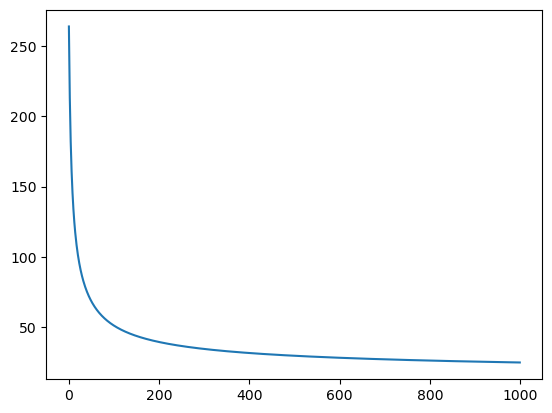

Activated Output [0.03203239 0.00196953 0.00653412 0.98676549 1.         0.00322536
 0.00044229 0.00127648 0.71835992 0.15287349 0.02048446 0.21949866
 0.00978531 0.8632178  0.99996348 0.02330667 0.99999538 0.00200863
 0.99999734 0.98895702 0.08957894 0.02317359 0.00928892 0.02968668
 0.07134707 0.00037889 0.00311593 0.05323235 0.99999038 0.14093236
 0.99999888 0.00012983 0.00916415 0.28743217 0.0019773  0.99876933
 0.99999978 0.01278335 0.37637232 0.00357055 0.98906201 0.00022447
 0.01985291 0.999984   0.15493652 0.98585704 0.01172368 0.05945857
 0.06648041 0.00096501 0.04702516 0.00001247 0.02011002 0.99998646
 0.06404524 0.99999888 0.1386568  0.99788194 0.84110306 1.
 0.04909159 0.00791221 0.99996031 0.03472836 0.00022659 0.01788204
 0.9999533  0.06337367 0.98104768 0.0111867  0.99868779 0.99712045
 0.97372984 0.00430291 0.9999955  0.00004756 0.0460007  0.99998734
 0.99998169 0.00165271 0.53775766 0.94663435 0.00034069 0.00004443
 0.4882631  0.99893221 0.00012398 0.00141751 0.998381

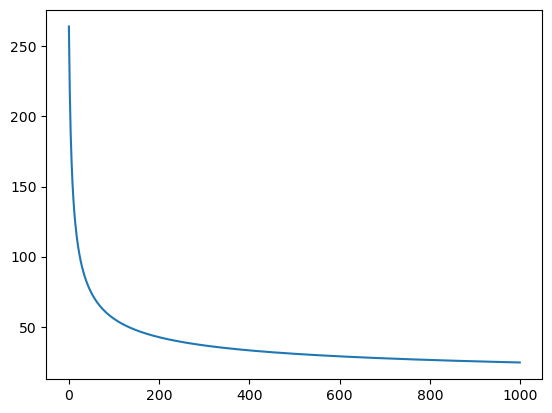

Activated Output [0.14405196 0.00923435 0.00275063 0.96266354 0.91688944 0.99987302
 0.00411218 0.00387365 0.01137231 0.9749467  0.01123498 0.02197239
 0.99998362 0.94172311 0.0943081  0.10428379 0.00039144 0.00147557
 0.01990707 0.0002255  0.00148984 0.08964838 0.00241987 0.01568529
 0.99999998 0.02682918 0.05274599 0.00013565 0.99711431 0.00007044
 0.17314839 0.99999917 0.00032086 0.19643283 1.         0.00286992
 0.95975072 0.07746753 0.99998805 0.02827152 0.02731256 0.32694812
 0.99718595 0.00012815 0.98355342 0.00023681 0.00049192 0.00076253
 0.99604834 0.00435006 0.00358078 0.00351875 0.00015284 0.46881925
 0.99900801 0.00078631 0.9999976  0.00595766 0.9999887  0.13614869
 0.00294134 0.00192754 0.99999817 0.00070124 0.68463148 0.00092693
 0.68947603 0.00101797 0.00359085 0.99994561 0.03034437 0.25880191
 0.9993441  0.99931603 0.00703592 0.99870211 0.99999529 0.00983354
 0.00017221 0.99971079 0.15009492 0.02793736 0.99999242 0.00045839
 0.00175629 0.93877998 0.12787147 0.96382776 

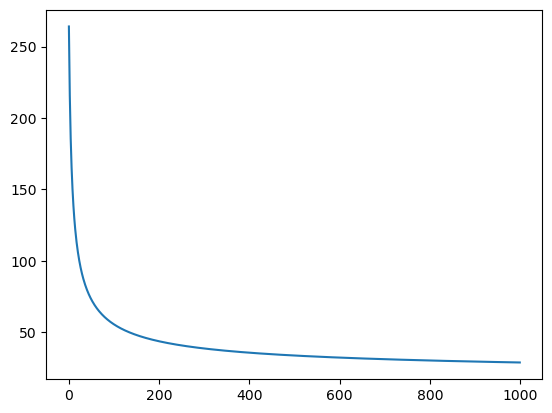

Activated Output [0.99960897 0.05323146 0.99416821 0.00398388 0.00356169 0.99991825
 0.08269759 0.003831   0.00077968 0.00760993 0.00008865 0.00006734
 0.95966784 0.00210166 0.02960569 0.9989267  0.00034488 0.34253971
 0.00102949 0.02802329 0.00021547 0.78682857 1.         0.07584296
 0.17072508 0.00096727 0.15004187 0.01637099 0.82231407 1.
 0.00945997 0.00257051 0.00182547 1.         0.00232603 0.00017712
 0.03343454 0.99996665 0.00797882 0.99907236 0.00027859 0.01631066
 0.00009744 0.00024518 0.03122144 0.758314   0.00037723 0.99977532
 0.99985805 0.99602785 0.08367528 0.00000938 0.04524179 0.99999969
 0.00554114 0.99818005 0.20611921 0.00001134 0.15699329 0.00486912
 0.99968871 0.04486407 0.00325047 0.0569864  0.98311275 0.0002887
 0.02655108 0.00031422 0.99123013 0.00501375 0.00221863 0.01528205
 0.15263723 0.04576851 0.99999735 0.99973298 0.49285    0.06359827
 0.00623855 0.01732757 0.02099044 0.99752405 0.6767991  0.04409557
 0.00083467 0.26098667 0.02569335 0.0127637  0.0244537

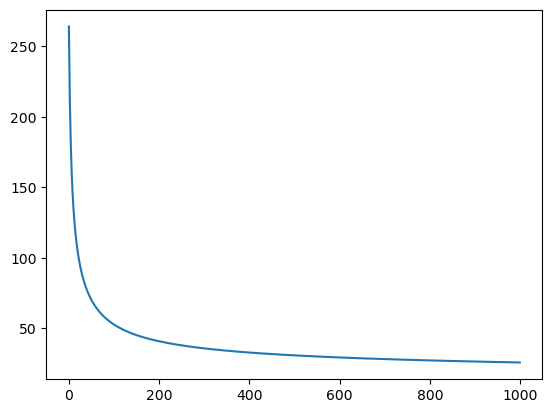

Activated Output [0.00092627 0.00014478 0.00789541 0.06077209 0.0498876  0.83587077
 0.00359104 0.00070568 0.00099282 0.80844566 0.00278001 0.0074612
 0.75038274 0.63606449 0.99999343 0.000247   1.         0.99999929
 0.99999993 0.99228877 0.99995914 0.99947651 0.9978594  0.99362109
 0.00003332 0.00001519 0.00756966 0.00063668 0.97694067 0.90948767
 0.01401834 0.00842616 0.02120439 0.00057786 0.99855882 0.00543256
 0.22587378 0.99971839 0.0112183  0.00063646 0.11674599 0.00320073
 0.87468365 0.00598926 0.03096993 0.99137796 0.0056859  0.26578756
 0.93918467 0.00316672 0.99936781 0.98883114 0.00061752 0.0180513
 0.89571994 0.99903219 0.071508   0.00202647 0.00397763 0.78785309
 0.01819374 0.11208883 0.99999866 0.09515335 0.00741983 0.99150745
 0.00261839 0.99999889 0.00033419 0.00014396 0.99999997 0.00214164
 0.00294779 0.00252497 0.00113702 0.0060027  0.01154942 0.00022782
 0.00027049 0.96767433 0.00459537 0.96889231 0.32088154 0.99931734
 0.2970317  0.58343782 0.99968535 0.87572061 0.

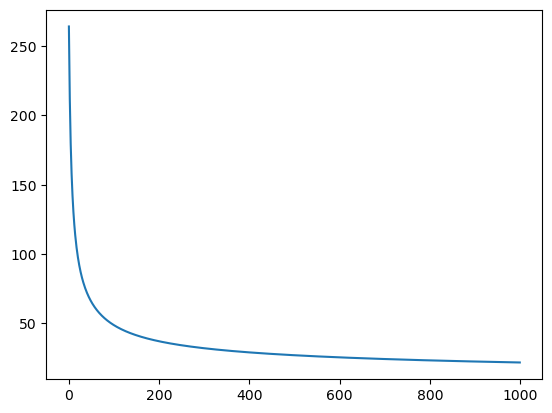

Activated Output [0.00175088 0.99999906 0.14835609 0.00679736 0.02292251 0.99961748
 0.00186031 0.99898001 0.22513617 0.38487191 0.00308075 1.
 0.02013785 0.02337268 0.00016851 0.99978275 0.9999738  0.11253714
 0.97036042 0.00539564 0.6104513  0.00515844 0.00045918 0.01587322
 0.00028457 1.         0.00327671 0.00294772 0.00020347 0.00001229
 0.00927273 0.008412   0.0001039  0.0000451  0.0347219  0.0138465
 0.24449728 0.99993382 0.82123409 0.01270744 0.00000926 0.0055228
 0.99995777 0.99198381 0.00038458 0.99997231 0.97421026 0.00053571
 0.00500674 0.01266084 0.90757551 0.99398778 0.03757377 0.00159311
 0.00000649 0.00596592 0.00555599 0.99999352 0.99999994 0.97909143
 0.99766676 0.00057605 0.00232053 0.07983274 0.99917027 0.00000234
 0.99941382 0.0032585  0.99897116 0.06664096 0.44472805 0.81977973
 0.02484651 0.94467407 0.99959504 0.00848112 0.02815494 0.99966222
 0.00051951 0.99999136 0.00095133 0.98310304 0.99999946 0.99953798
 0.1012076  0.35718002 0.99935485 0.65451064 0.99975284

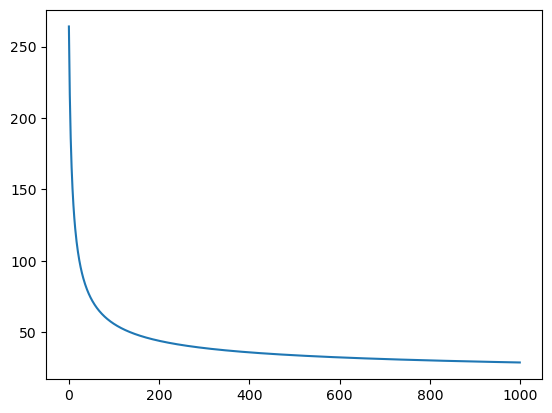

Activated Output [0.00272698 0.9951638  0.05927583 0.99949464 0.9999569  0.48110219
 0.00310644 0.04391938 0.97469526 0.00255157 0.00586538 0.99838929
 0.99999797 0.99999273 0.30282332 0.00491946 0.00096514 0.02014022
 0.08254215 0.05203504 0.00340473 0.06617594 0.99892945 0.00324364
 0.99709143 0.98547283 0.00038699 0.00089798 0.1600038  0.99999955
 0.00049456 0.04522141 0.00015736 0.08717776 0.00325484 0.99998261
 0.99916173 0.99912641 0.01324554 0.99996452 0.00027647 0.01826169
 0.00071706 0.00272119 0.99788939 0.04818121 0.03060659 0.01541409
 0.65763209 0.00091965 0.00539259 0.99910629 0.00043993 0.89094206
 0.00001235 0.99994519 0.0221065  0.99159066 0.99973091 0.64369919
 0.99123136 0.9999714  0.0033736  0.16615127 0.03216445 0.00389664
 0.18189118 0.00602789 0.05718866 0.95265329 0.99999749 0.99999922
 0.00699506 0.00694309 0.99998721 0.99996961 0.99198614 0.92759663
 0.06657356 0.55081364 0.00181676 0.2066466  0.99995072 0.0068125
 0.98653597 0.00124392 0.99980271 0.72555393 0

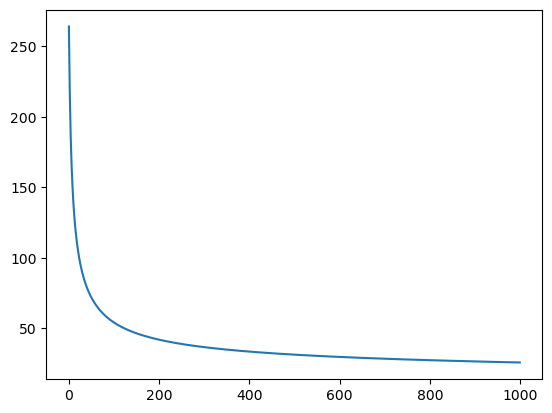

Activated Output [0.99999396 0.99999998 0.9845427  0.06689312 0.99999744 0.99836504
 0.9881757  0.01530772 0.01494557 0.05816587 0.99961822 0.00031245
 0.21116566 0.00069616 0.00776569 0.11369187 0.0001225  0.19008616
 0.98598271 0.11134228 0.00237962 0.13351744 0.02479094 0.00045804
 0.99996049 0.0056541  0.00507117 0.12470102 0.02672205 0.00398671
 0.00180763 0.99974427 0.00597999 0.20427177 0.00259699 0.99997084
 0.61759011 0.01046785 0.00007704 0.19829583 0.00322876 0.00254908
 0.70294982 0.16177497 0.16369617 0.01958118 0.00164914 0.01944487
 0.00036989 0.99999825 0.00001742 0.98886294 0.00838468 0.00164068
 0.0000963  0.99993282 0.99987183 0.00545385 0.00530376 0.01963018
 0.88644067 0.02077884 0.68333688 0.00334702 0.99999991 0.00155774
 0.03273438 0.13229197 0.00030555 0.01300641 0.00030808 0.99995791
 0.00056849 0.00005426 0.00003414 1.         0.00802309 0.00063674
 0.00291443 0.00042664 0.12661146 0.00065346 0.00679752 0.00216059
 0.0158033  0.00049343 0.0036507  0.0036232  

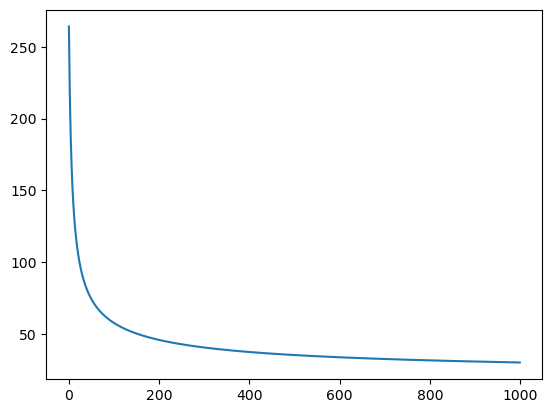

Activated Output [0.02440719 1.         0.00017821 0.0148297  0.00181775 0.97581273
 0.00810176 0.00023323 0.00200428 0.00077342 0.99427161 0.00204125
 0.00158972 1.         0.048336   0.16550593 0.02652255 0.00457217
 0.00104154 0.05755481 0.00576993 0.00087925 0.19585918 0.09717316
 0.47954789 0.01220003 0.89066409 0.01035676 0.11987115 0.99993789
 0.00646994 0.99999999 0.00079732 0.41268672 0.00261379 0.00308037
 0.00382188 0.0001206  0.99992256 0.99957475 0.02440128 0.99997549
 0.99996708 0.99997758 0.01305414 0.0450476  0.99999797 0.00323242
 0.05128906 0.00009337 0.99969687 0.99995207 0.99999993 0.9944057
 0.00004236 0.00776521 0.86795737 0.0048437  0.12804646 0.83679251
 0.00031096 0.18515505 0.00007049 0.04183249 0.00055587 0.2071448
 0.00078606 0.90299045 0.99895519 0.99744998 0.00068135 0.06497132
 0.03532565 0.99999607 0.00507815 0.00648778 0.13426498 0.99521399
 0.00306695 0.00044328 0.04243834 0.12488301 0.00019927 0.77657007
 0.01612093 0.00026402 0.01492015 0.00556549 0.

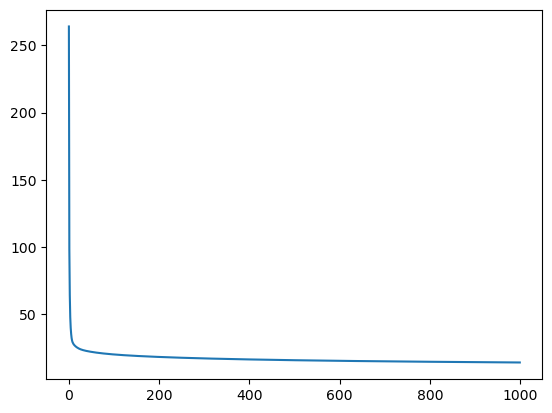

Activated Output [0.00014666 0.00000008 0.00040707 1.         0.00006184 0.04980006
 0.00035663 0.00017518 0.00000011 0.00010703 0.00000133 0.99999914
 0.99999929 0.99999731 0.00006855 0.00000058 1.         0.02878858
 0.99990103 0.00004341 0.09298224 0.00169414 0.09253054 0.99838887
 1.         0.00001095 0.99201745 0.99999394 0.00100153 0.99889566
 1.         1.         0.01921304 0.00000007 0.96583805 0.00000442
 0.00000019 0.99999997 1.         0.00001918 0.00028263 1.
 1.         0.01310233 0.00201759 0.00009368 0.99875646 1.
 0.01421436 1.         0.00000142 0.00174108 0.00000645 0.99999495
 0.00010546 0.         0.99998867 0.00447539 0.0000038  0.00377253
 1.         0.99691747 1.         0.18371082 0.85180917 0.00000154
 0.01757763 0.99988076 0.00019074 0.00002122 0.00002827 0.00003034
 0.00000818 0.49813444 0.00000962 0.9999997  0.99999981 0.00073543
 0.0000022  0.0000001  0.00005134 0.00000002 0.00240079 0.99998041
 0.0431904  0.0003971  0.00000062 0.00001957 0.99999031 0.000

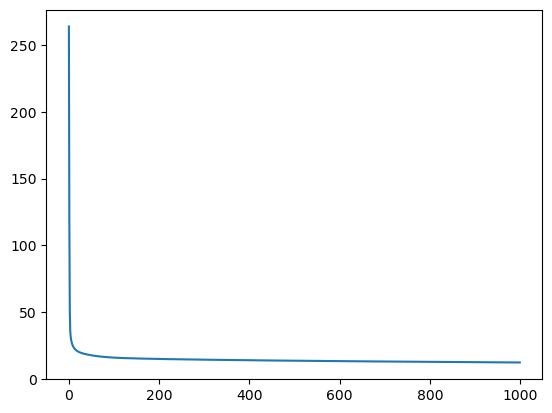

Activated Output [0.00001101 0.00000005 0.00000135 0.99998787 0.00000005 1.
 0.00026116 0.03296204 0.0321112  0.         0.001076   0.14856648
 0.99999994 0.0001632  0.00101145 0.0000001  0.00000177 0.00000024
 0.00000379 0.08264883 1.         0.99999999 0.00035035 0.00040537
 0.08265787 0.00000007 0.57624399 0.00076923 0.99118219 0.00046368
 0.00000143 0.00000241 1.         0.99999803 0.99994546 0.99909695
 0.89917902 0.99999566 0.99802017 0.26395404 0.         0.0000001
 0.00000003 1.         0.99997569 0.00000009 0.00001053 1.
 0.00132674 0.9974225  0.00000002 0.00000006 0.00001081 0.04757521
 1.         0.00000016 0.99999866 0.99999284 0.00000122 0.99999101
 0.00000003 1.         0.00000017 0.0000048  0.00291458 0.99999991
 0.03882095 0.00336367 0.98455064 0.00719946 1.         0.00000488
 0.00000059 0.         0.00000255 0.00011707 0.0000089  0.00000518
 0.99999636 1.         1.         0.99992964 0.99999949 0.0000011
 1.         0.00012198 0.08751621 0.9999772  0.00277746 1.
 0.0

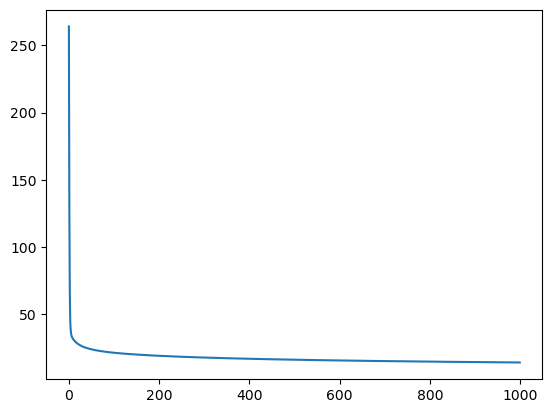

Activated Output [1.         0.99999999 0.0000672  0.00004329 1.         0.00000002
 0.00008698 0.0014664  0.00000162 1.         0.00001137 0.00000388
 0.07032959 0.99999995 0.00003111 0.83655654 0.00000012 1.
 0.00000866 0.00244989 1.         0.00003926 0.         0.00024136
 0.00490065 0.00017881 1.         0.06343726 0.00060312 0.00000433
 0.         0.00523151 1.         1.         0.99531273 0.00000496
 0.00017246 1.         1.         0.00000764 0.04809208 0.04651709
 0.00000903 0.         0.00000148 0.1564763  0.00000003 0.99999992
 0.99996815 0.0000001  0.99916675 1.         0.00000015 0.0000045
 0.80145502 0.         0.97918658 0.99980236 1.         0.00000004
 0.00000009 0.00000057 0.01301399 0.00047159 1.         0.00278279
 0.99999985 0.00209274 0.0000104  0.00013616 0.99999672 0.99999817
 0.13585541 0.         0.00010778 0.99998914 0.00606797 0.12206719
 1.         0.70650429 0.00018202 0.00001453 0.9999992  0.01584516
 1.         1.         0.99968735 0.99969299 1.       

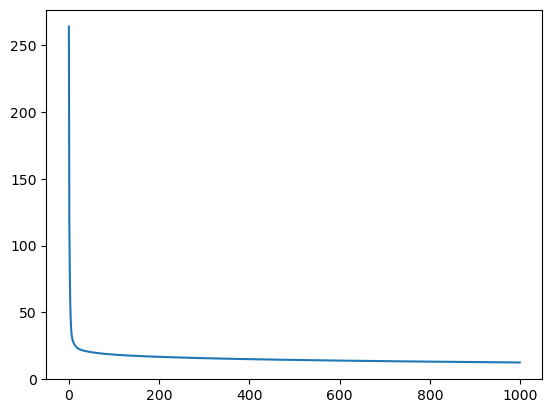

Activated Output [0.9977439  0.12423791 0.00001211 0.99999619 0.0003934  0.00002124
 0.00002994 0.99999923 1.         1.         0.22698775 0.00000006
 0.00003374 0.00199372 1.         0.99988664 0.00008389 0.00001684
 0.99758767 0.0000185  0.00001485 0.00000002 0.00000006 1.
 0.00000014 1.         0.05848829 0.99997323 0.0000043  0.00000448
 0.00001031 0.98917961 0.00000003 0.         0.000003   0.99999032
 0.99999995 0.00000007 1.         0.00463848 1.         0.99945739
 0.         0.00040228 0.99999982 0.76141199 1.         0.00000062
 1.         1.         1.         0.99999953 0.00000018 0.00003379
 0.99999478 0.99986324 1.         1.         0.99989195 0.00000003
 1.         0.99999719 0.         0.         1.         0.00000001
 1.         0.00000003 0.00000017 0.15817251 0.00000299 0.00001554
 0.0001587  0.97528419 1.         0.97069764 0.         1.
 0.9998243  0.00764401 0.20102119 0.00000639 0.00007379 0.02267619
 0.00017134 0.00000529 1.         0.00004836 0.03423759 0.000

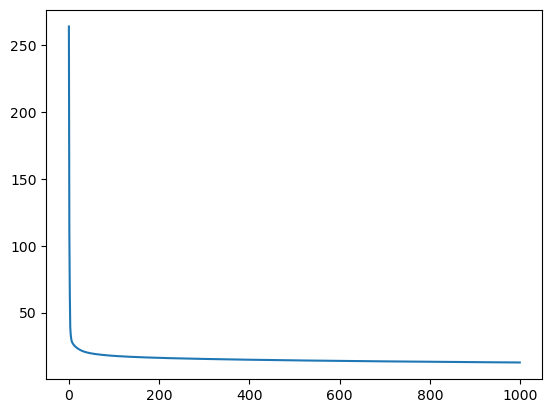

Activated Output [1.         1.         0.00127874 0.00355083 0.01394562 0.9999999
 0.99998789 0.99899169 0.99999917 0.02233275 0.00093659 0.99894599
 0.00023826 0.99999809 0.84015668 1.         0.28563107 0.0000005
 1.         0.12446942 0.99995152 0.00409416 0.00004432 0.99999996
 0.00000725 0.99951398 1.         1.         0.00001192 1.
 0.00001377 1.         0.00000077 0.99999369 0.00000754 0.00001569
 0.01459831 1.         0.99998992 1.         0.99999983 0.00000039
 0.00028595 0.00577403 0.03572125 0.07468536 0.00000019 0.00000023
 0.99997933 0.00000373 0.09509765 0.00032722 0.99999825 0.0076862
 1.         0.00007801 0.00000957 0.00001435 0.00009581 0.99987028
 0.00003857 0.00004892 0.98712261 0.00000126 0.00013529 0.9900923
 1.         0.50205834 0.89652844 0.00022513 1.         1.
 0.97620038 1.         0.00000004 0.99999983 1.         0.99999998
 0.00001644 0.00000026 0.02228292 1.         0.99999998 1.
 0.00028881 0.9999636  0.14183895 0.00029766 0.99994236 0.00003473
 0.000

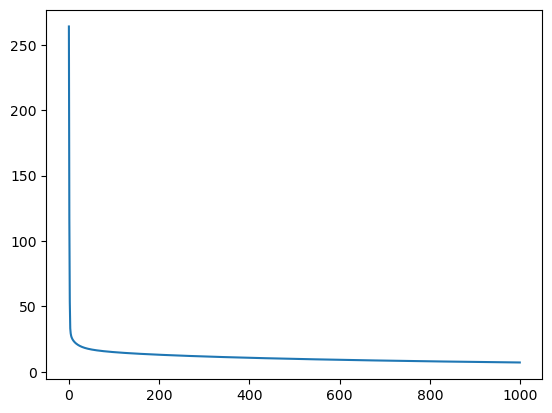

Activated Output [0.00212472 0.00697665 0.56365948 0.00000169 0.         0.00239233
 0.         0.00000165 0.99999933 0.00032811 0.01863461 0.
 0.         1.         0.9999886  0.00000856 0.         0.99984292
 0.00516105 0.99999979 0.00156599 0.00000878 0.00000001 0.00000009
 0.         0.0006062  0.00000497 0.09765721 0.00239139 0.00010537
 0.         1.         0.00000076 1.         0.00000094 0.00000748
 0.00002082 0.0004269  0.00002287 0.00027232 0.00037571 0.00002038
 1.         0.00009364 0.0006585  0.9999999  1.         0.0000001
 0.         0.00000014 0.89813835 0.00000002 0.99999997 0.18558821
 0.00000434 0.         0.00000035 0.00000029 0.         1.
 0.99993608 0.99999989 1.         0.81149274 0.         0.00003328
 0.00000045 0.99961943 0.         0.         0.         1.
 1.         0.0044928  0.00000009 0.99999995 0.99999953 0.
 0.00002224 0.94864627 1.         0.         0.00000774 0.00000057
 1.         1.         0.00000047 0.01477187 1.         0.00000007
 0.        

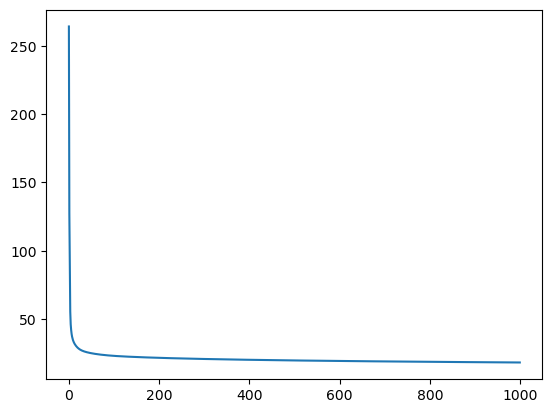

Activated Output [1.         0.01452715 0.00001057 0.00209119 0.03106864 0.00020724
 1.         0.99991604 0.00000185 1.         0.00011496 0.00005569
 0.03689068 0.15871317 0.00005197 0.00002506 0.01354278 1.
 0.00000011 0.99929068 1.         0.00000038 0.00000199 0.00000003
 1.         0.0000527  0.16796203 0.00018632 1.         0.99976147
 0.00011918 1.         0.00000432 0.00000228 0.00003017 1.
 0.99999975 0.09539684 0.99992809 0.01540198 0.0000117  0.99972773
 0.00004321 0.07335211 0.99999986 0.00000002 0.0000058  0.9997675
 0.44232386 0.         0.8830815  0.99999019 1.         1.
 0.00047485 0.00000286 0.00022768 1.         0.0043887  0.00000047
 0.00000077 0.99999999 0.99999995 0.00086108 0.00000001 0.00004498
 0.99999999 1.         0.99970727 1.         1.         0.81551358
 0.99530089 1.         0.99999221 1.         0.00000137 0.99997858
 0.00505502 0.0000024  0.000002   1.         0.99973674 0.99999906
 1.         0.09018572 0.00000096 0.01444191 0.0000092  0.00017586
 0.

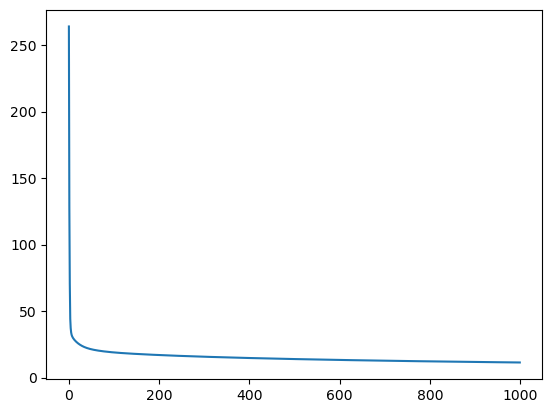

Activated Output [0.06019697 0.27854749 0.99998628 0.91624936 0.         0.9991557
 0.0001394  0.00050037 1.         0.00000173 0.00005578 0.00000001
 0.0007372  1.         1.         0.00000004 0.00000042 0.00099869
 0.99997233 0.0000138  0.00567991 0.07498024 1.         0.00000018
 0.01281663 1.         1.         1.         1.         0.00000315
 0.00000605 0.00058514 0.99999607 0.02185236 0.99921267 0.98468718
 0.99910931 0.         0.00000114 0.00066244 0.00000294 0.00000084
 0.         0.94893651 0.00000391 1.         0.0000175  0.0000102
 0.0000008  0.00005925 1.         0.00327539 0.00000608 0.99999974
 0.00001651 0.00000001 0.00014535 0.00059561 0.00967495 0.00000406
 0.00015223 0.06780465 0.00001194 0.00004633 0.19289699 1.
 0.18800372 0.05330792 1.         0.0000001  0.00002886 0.00031388
 0.00050584 1.         0.01803738 0.0000008  1.         1.
 0.00000031 0.00001165 0.04639514 0.91954944 0.02327635 0.00020236
 1.         0.00000015 0.00002172 1.         0.01821398 0.99980

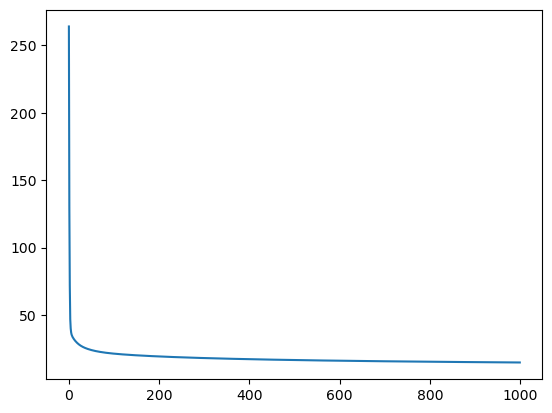

Activated Output [0.00156869 0.99999798 0.00000017 1.         0.00000014 1.
 0.00000922 0.00000106 1.         0.00008942 0.         0.99999995
 1.         0.00006436 0.00000326 0.0008874  0.05615402 0.99996367
 0.00002006 1.         0.00172323 0.15908451 0.00398363 0.00005178
 0.06217454 0.97821033 0.99833495 1.         0.00294583 1.
 0.00004409 1.         0.00002646 0.99999787 0.98485432 0.99913991
 0.99981808 1.         0.00025771 1.         0.00065052 1.
 1.         0.99998119 0.0006143  0.05049777 0.00000046 0.00002541
 0.00003743 0.00000035 0.00001612 0.00000003 0.00182407 0.99999999
 0.99999992 0.         0.         1.         1.         0.00016527
 0.0000003  0.05939578 0.00487661 0.99999817 0.00136427 0.99999995
 0.36912041 0.07229924 0.99830011 0.00013494 0.99998021 0.27121317
 0.00000013 1.         1.         0.99999998 0.01277041 1.
 1.         0.         0.99995965 0.00000003 0.00027832 0.00003108
 0.00001026 0.0000002  0.99981092 0.00000053 0.00000002 0.00007273
 0.0000000

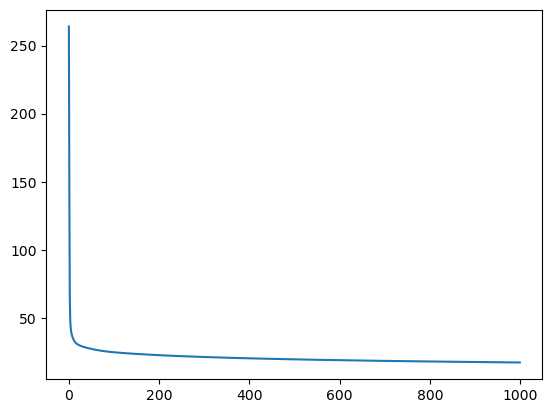

Activated Output [0.46154761 1.         1.         0.00000177 0.99999929 0.00006044
 1.         0.9424015  0.0000193  0.99913837 1.         0.9999994
 0.93857644 0.00000028 1.         0.00001176 0.97924521 0.00008226
 0.00000068 1.         1.         0.00006444 0.99762467 0.00011214
 0.01060485 0.99999524 0.00021065 0.00002029 0.02509464 1.
 1.         0.96087846 1.         1.         0.00001984 0.0000002
 0.0000028  0.00000826 0.99320542 0.99999998 0.99999152 0.99819631
 0.00004241 0.01112699 0.99839017 0.01426851 1.         0.03577814
 0.84793398 0.0000368  0.03185899 0.00058739 1.         1.
 1.         0.         0.99998085 0.99999993 0.0000256  1.
 0.99745088 0.00008931 0.00002258 0.99997392 1.         0.00022397
 0.0000002  1.         0.1200011  0.00000254 0.00128375 0.99942217
 0.00019511 0.00078305 0.00015421 0.00000212 0.00000015 0.04040697
 0.99999958 0.00011442 0.9961372  0.00002428 0.0000025  0.00002357
 1.         0.01848918 0.         0.00004104 0.00000056 0.00014096
 0.0

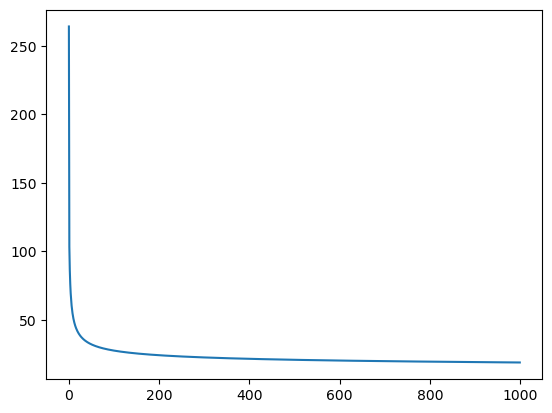

Activated Output [0.15598143 0.00020387 0.00968204 0.9999988  0.00008006 0.00003744
 0.00021377 0.29860525 0.00089108 0.00003154 0.0000024  0.00012702
 0.20431295 0.99047646 0.99920584 0.0000202  0.00000008 0.00000013
 0.0143064  0.00014438 0.00030597 0.99999986 0.99768382 0.00000382
 0.00008228 0.00000167 0.00106627 0.0541421  0.52643299 0.00003914
 0.99999999 0.00000785 0.92818464 0.00001089 0.00136597 0.99948911
 0.04987925 1.         0.00083066 0.00006305 1.         0.99998456
 0.99816676 0.00000143 0.00000499 0.9856851  0.00000005 0.00026615
 0.99999961 0.19084939 0.12799855 0.00000147 1.         0.09732089
 0.05940693 1.         0.07008463 0.00247316 0.96939978 0.00005271
 0.000053   1.         0.99999974 0.99996718 0.94764144 0.99973079
 0.00339986 0.00000074 0.00002724 0.00000367 0.03328475 0.30907378
 0.99999973 0.99982558 0.00478843 0.00037168 0.87103368 0.00247965
 1.         0.99999983 0.9999984  0.00000714 0.29994299 0.00004303
 0.00002666 0.00041883 0.00001367 0.00236024 

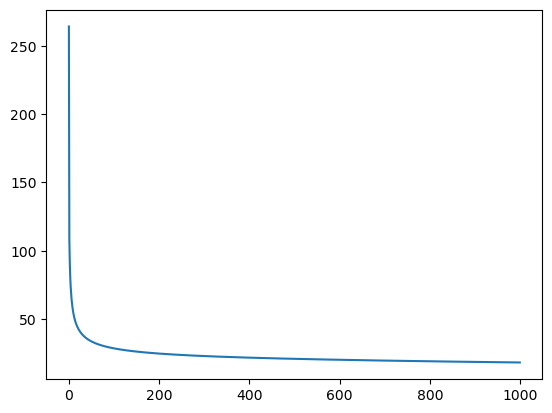

Activated Output [0.99999994 0.99999773 0.96407842 0.36011028 0.153646   0.20954501
 0.03206094 0.00020086 0.99052492 0.00013256 0.99994304 0.00313436
 0.00040575 0.12776207 0.00067986 0.92239338 0.00027906 0.0000254
 0.00141998 0.00000342 0.00000009 0.00124133 0.96236031 0.00738278
 0.99999221 0.00962758 0.00062854 0.99999004 0.0002575  0.00020875
 0.00000178 1.         0.00005867 1.         0.00008344 0.99965824
 0.99999991 0.02618207 0.00082154 0.00000875 0.0004829  0.01223992
 0.00003884 0.00398117 0.12614609 0.13033758 0.00002579 0.00289816
 0.88556507 0.99937584 1.         1.         0.97876724 0.0039207
 0.99999989 0.00003062 0.000015   0.99845019 0.00091119 0.97026293
 0.00651813 0.00017647 0.00000129 0.99999987 0.99994359 0.08259483
 0.00452106 0.9996456  0.00009995 0.00006325 0.00048664 0.99784583
 0.9992601  0.01310297 0.00027823 0.03699671 0.00108608 1.
 0.04813344 0.00066028 0.00315869 0.00273131 0.99999997 0.00739566
 0.02015274 0.99999742 1.         0.00002071 0.00006777

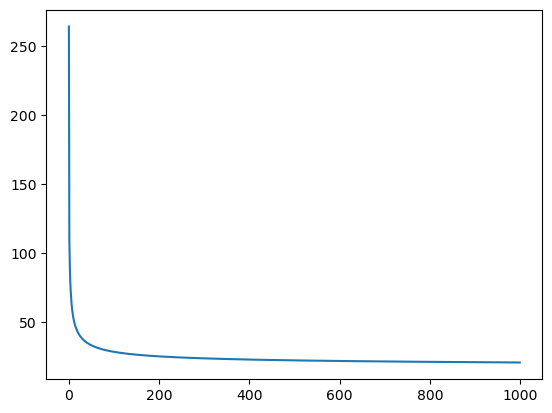

Activated Output [0.05181791 0.00047533 0.00005197 1.         0.01088385 0.03972002
 0.00042277 0.00396753 0.00032688 0.87680164 0.00310943 0.98708607
 0.00357827 0.75245751 0.99999992 0.98283521 0.99999992 0.99999328
 0.00023721 0.99999962 0.74840207 0.00088076 0.0016714  0.00012368
 0.99999971 0.00128905 0.01532867 0.00065462 0.04836444 0.26362268
 0.99999999 0.00139749 1.         0.00000138 0.99996937 0.00135383
 0.00774662 0.00005875 0.01343487 0.0001954  1.         0.0005717
 0.99943091 0.99999914 0.01866314 0.93522081 0.00031996 0.00003124
 0.00000758 0.99999829 0.00008106 0.01619186 0.00002439 0.99937616
 0.09173329 0.95314145 0.0025786  0.99999503 0.00004953 0.00001307
 0.00002018 0.00029337 0.0001358  1.         0.00239852 1.
 0.00089364 0.00632102 0.00000121 0.99999328 0.01410796 0.00620998
 0.60540466 0.01760862 0.99946347 0.87380944 0.99747881 0.00000104
 0.00600989 0.00000023 0.00010273 0.99999375 0.00063605 0.21490106
 0.00000355 0.0740956  0.00035492 0.99873275 0.0002113

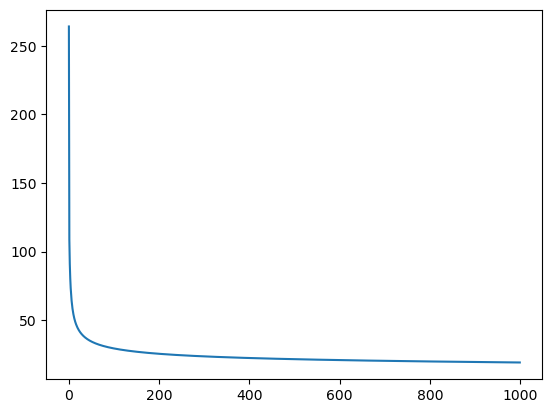

Activated Output [0.00014367 0.00000048 0.98356786 0.99999993 0.99188392 0.01001654
 0.99120245 0.00017886 0.00167319 0.99999715 0.00004139 0.00003108
 0.02679725 0.0013846  0.99959506 1.         0.99970952 0.00006023
 0.76081305 0.00003693 0.99999991 0.00017749 0.02863289 0.98578558
 0.99999998 0.00021576 0.05323751 0.0020384  1.         0.99517969
 1.         0.00021849 0.00234124 0.99999826 0.00001638 0.00000198
 0.99999999 0.7998128  0.0011756  0.9999996  0.99999891 0.99819979
 0.00014742 0.0000034  0.00081866 0.11810395 0.00013061 0.84706852
 0.00015454 0.9999475  0.99998701 0.00164009 0.00005183 0.68239322
 0.83153601 0.98416505 0.00754754 0.00000881 1.         0.99831292
 0.00000021 0.92587427 0.00076375 0.10953545 0.99999999 0.00000697
 0.9980516  0.00000003 1.         0.9999186  0.99865773 0.00000523
 0.14771737 0.04905435 0.00000081 0.99999663 1.         1.
 0.00065816 1.         0.99999977 0.9230524  0.96225606 1.
 0.00000324 0.00000333 0.0097916  0.00000462 0.03946328 0.000

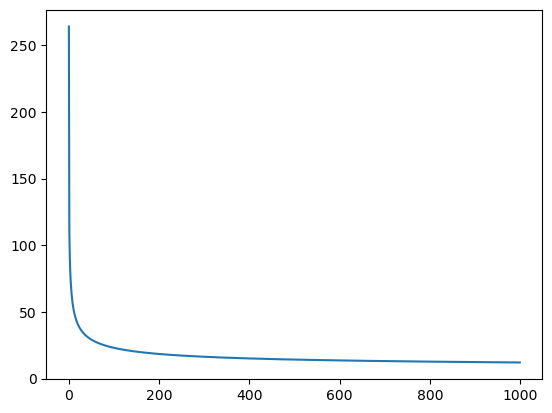

Activated Output [0.99988969 0.00000002 0.00026176 0.00038662 0.00493766 1.
 0.00000658 0.00002484 0.20579329 0.99940812 0.00000031 1.
 0.00035318 0.99999168 0.00001221 0.01766871 0.00234049 0.2441211
 0.00000003 0.00017924 0.03466238 0.00006489 0.9999178  0.00000053
 0.00000876 0.84967563 0.00000093 0.         0.00040046 0.00000695
 0.99830013 0.00004543 0.00009947 0.         0.99848085 0.00001733
 0.00010072 0.0000023  0.00008044 0.76272821 0.89206143 0.00043647
 0.04631871 0.0104468  0.0002323  0.9999535  0.00000029 0.
 0.99999998 0.00116147 0.00000107 1.         0.00832863 0.99905384
 0.00000009 0.0004984  0.00004595 0.00031322 0.99999971 0.99969805
 0.99998476 0.88498921 0.98530453 0.00583058 0.01969828 0.00406388
 0.0000038  0.00114742 0.08378714 0.00008505 0.00009846 1.
 0.00002417 0.00007779 0.99664417 0.99981641 0.9999974  0.99999023
 0.0000001  0.03449262 0.4942311  0.9999997  0.00000002 0.03302264
 0.00000022 0.81760087 0.00418241 0.00000001 0.         0.99999603
 0.00024268

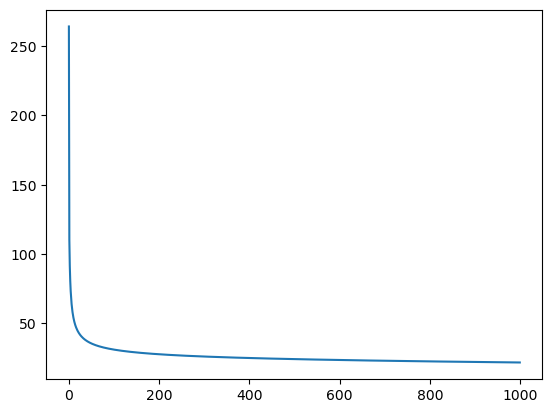

Activated Output [0.06160942 0.00530503 0.00000018 1.         0.19482206 0.00007298
 0.00001569 0.00431158 0.01748942 0.9999232  0.00010258 1.
 0.99999704 0.00003439 0.99713629 0.00582001 0.00000262 0.0005083
 0.9999999  0.00000758 0.00021779 0.99994908 0.9999892  0.93877222
 1.         0.55036653 0.00018392 0.9999992  1.         0.22461443
 1.         0.00064424 0.02811984 0.00007814 0.00005802 0.00006738
 0.75906417 0.28601981 0.00031689 0.00000208 0.00133153 0.00132009
 0.1043095  0.99999987 0.3488936  0.00000002 0.02742399 0.01212203
 0.00006879 0.99986594 0.00055582 0.99999985 0.00003026 0.00164483
 0.97620335 0.00000988 0.00003093 0.00000734 0.00007857 1.
 1.         0.0000003  0.00126566 1.         0.00294249 0.99954272
 0.00002357 0.01867988 0.00000514 0.0813874  0.00000827 0.00667897
 0.1257874  0.05419975 0.00002412 1.         0.12757749 0.35841735
 0.01079965 0.02151691 0.00003434 1.         0.00001667 0.00008496
 0.9976136  0.00001993 0.9999996  0.26153006 0.79939956 0.0014

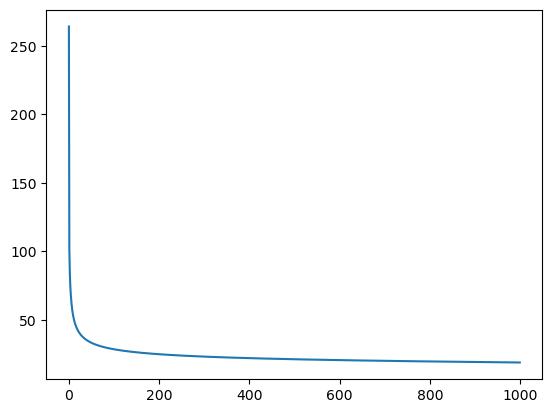

Activated Output [0.00422664 0.00206661 0.00024484 0.00298804 0.01512299 0.99911632
 0.00219057 0.0174283  0.9999988  0.99999687 0.00000039 1.
 0.00000764 1.         0.43819589 0.9999552  0.00000087 0.00003654
 0.00008894 0.96360577 0.00004069 0.00123629 0.00000006 0.99999972
 0.64440446 0.00983772 0.00010222 0.13131217 0.06182836 0.00004942
 0.99712579 0.03518233 0.00001957 0.00005489 0.00031926 0.00057745
 0.99999969 0.98156008 0.00000004 0.99957078 0.03797071 0.99999784
 0.99746559 0.0171765  0.99999992 0.09460391 0.00044338 0.00000261
 0.01161849 0.0000014  0.23538353 0.0028389  0.01622418 0.00019405
 0.00163539 0.00000023 0.00058862 0.00016502 0.00000584 1.
 0.67815215 0.00081781 0.00024811 0.00000126 0.00000007 0.99999979
 0.99975917 0.98267797 0.0000044  0.00001212 0.99956692 0.00013266
 0.99998168 0.05698788 0.95734471 0.001325   1.         0.99999647
 0.98596463 0.99983739 0.00178658 0.1041279  0.00000209 0.2912195
 0.9999982  0.00076613 0.00076607 0.00001888 0.99999996 0.0024

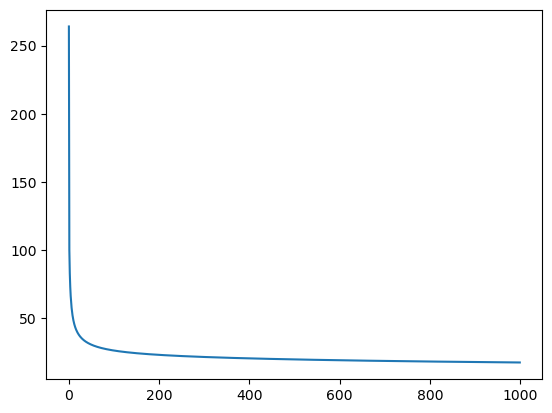

Activated Output [0.99999957 0.99948429 0.99894732 1.         0.99999985 0.00095822
 0.99211146 0.00001322 0.06105654 0.9856282  0.7544379  0.0001423
 1.         1.         0.00392081 0.00039307 0.05595153 0.90890429
 0.00029145 0.99998987 0.99999898 0.89914879 0.01129937 0.57832979
 0.00100521 0.00022626 0.00007979 0.0006043  0.83993661 0.00000053
 0.0004013  0.11262935 0.00203839 0.0003169  0.99999609 0.00043169
 0.9968807  0.17021908 0.00000927 0.00007743 0.00045478 0.00009184
 0.01877648 0.00000674 0.00035739 0.01885131 1.         0.99997742
 0.00057221 0.0001694  0.9999995  0.00002511 0.97653724 0.99993588
 0.0039574  0.00398121 0.00001181 1.         0.00063512 0.4009802
 0.00005825 1.         0.99999958 0.00004083 0.00137184 0.00002323
 0.98658957 0.99986872 0.01804806 0.03639963 0.00212253 0.00006542
 0.94849432 0.05923744 0.00013782 0.99998288 0.00201739 1.
 0.99991881 0.97576942 0.00039491 0.00000021 0.00031137 0.99999921
 0.00017817 0.00662568 0.00002072 0.99999893 0.00001509

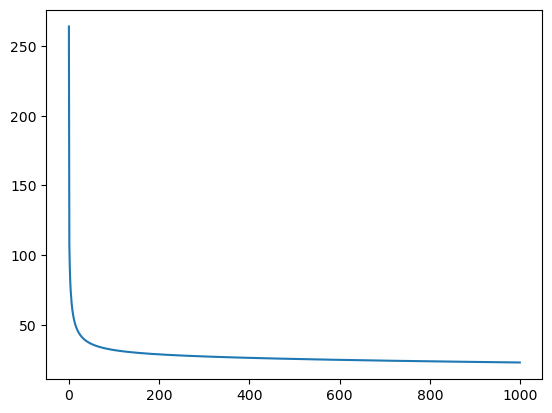

Activated Output [0.0000313  0.00003157 1.         0.99999999 0.00007336 0.99997652
 0.88925216 0.00017767 1.         0.00045046 0.99988413 0.00011499
 0.00501084 0.03615322 0.12113878 1.         0.18476089 0.00032728
 1.         0.02218156 0.00395509 0.99941163 0.0003331  0.99999953
 0.00000192 0.14953154 0.10971381 0.99835504 1.         0.00015609
 0.83760375 1.         0.00260573 0.5545188  0.10898158 0.9999478
 0.48125999 0.00000223 0.00001548 0.00001406 0.00003366 0.00025768
 0.00000211 0.03055697 0.12056401 0.00139751 0.00021522 0.41816698
 0.66502725 0.00016788 0.99999865 0.00785556 0.03673728 0.00247314
 0.99999965 1.         0.00004435 0.00042165 0.00041355 0.99932789
 0.99999986 0.99999989 0.00076197 0.00195643 0.98043615 0.00000988
 0.99998556 0.00406036 0.81595594 0.99999706 0.39899702 0.31431785
 0.00004831 0.00000018 0.00007823 0.0108357  0.00001859 0.19231982
 0.99998907 0.04010178 0.99995468 0.00000404 0.18727575 0.00012555
 0.00035504 0.00000019 0.00070435 0.00269507 0

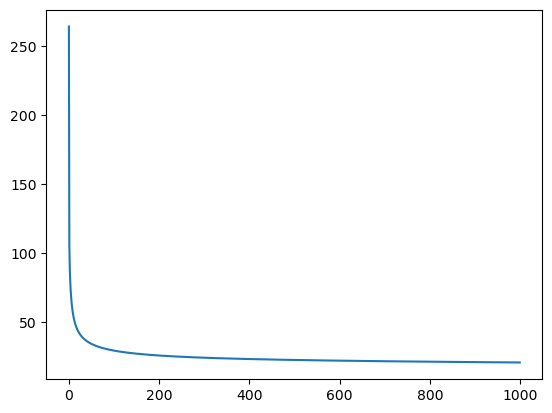

Activated Output [0.99999974 0.32664379 0.99961199 0.00007178 0.00279895 0.99999499
 0.10782268 0.00136313 0.01460024 0.07774471 0.00026283 0.00036639
 0.29260857 0.00062154 0.00206682 0.00156398 0.99980486 0.995147
 0.0159031  0.00055695 0.         0.00125723 0.04904824 0.0000019
 1.         0.00049531 0.94242088 0.00003234 0.00552544 0.00001035
 0.9994538  0.72871267 0.00039216 0.00234962 0.99939335 0.00004538
 0.23529029 0.00009951 0.99996384 0.00134215 0.00000018 0.99999205
 0.00058154 0.99999998 0.99972475 0.00229446 0.99648719 1.
 0.00000582 0.13816058 0.01109722 0.00001792 0.25186848 1.
 0.99986619 0.9999991  0.99961326 0.96677218 1.         0.99875678
 0.00008034 1.         0.00116684 1.         0.00000786 0.00006494
 0.0000052  0.20044281 0.03331542 0.00469936 0.00910329 0.99995826
 0.99946394 0.00134669 0.00414814 0.99999815 1.         0.00004709
 0.85116589 0.00000008 0.99999701 0.00026448 0.99999968 0.00010229
 0.00009838 0.00000594 0.00062191 0.00122074 0.02456185 0.001734

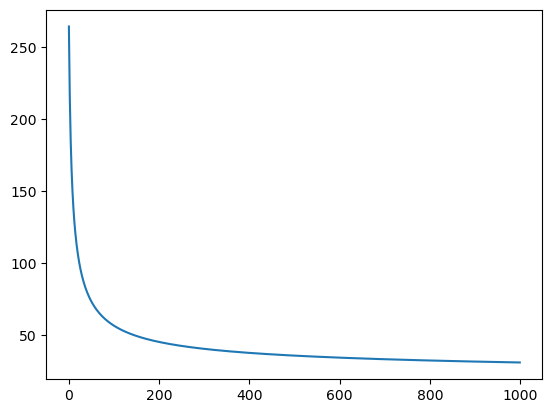

Activated Output [0.99306418 0.17130698 0.9987026  0.01211965 0.01236431 0.18350292
 0.9424455  0.13707411 0.99996927 0.08783644 0.9883168  0.12468344
 0.00306987 0.00196344 0.99922062 0.00314444 0.09476776 0.00003467
 0.31977398 0.99998943 0.99999867 0.00067569 0.97770186 0.60119226
 0.13388901 0.99998107 0.00117541 0.99999821 0.99899047 0.99548822
 0.99629195 0.9999956  0.0019846  0.000144   0.99440446 0.01404354
 0.95174822 0.00049014 0.00572598 0.00285131 0.00103452 0.88861364
 0.99885846 0.99998194 0.0063318  0.04791016 0.99528789 0.00323887
 0.99979493 0.87009146 0.99806077 0.79662569 0.00081276 0.00247363
 0.001552   0.99950107 0.18459255 0.99995483 0.04076878 0.9863383
 0.02946496 0.99999746 0.00089548 0.89258593 0.00386746 0.00671835
 0.82905819 0.0019872  0.04077855 0.01887436 0.00674483 0.05260237
 0.9981681  0.00075719 0.9996516  0.99626183 0.9997632  0.00792634
 0.99999974 0.99999994 0.66367525 0.9999727  1.         0.01306218
 0.02081438 0.00502248 0.28377839 0.5589758  0

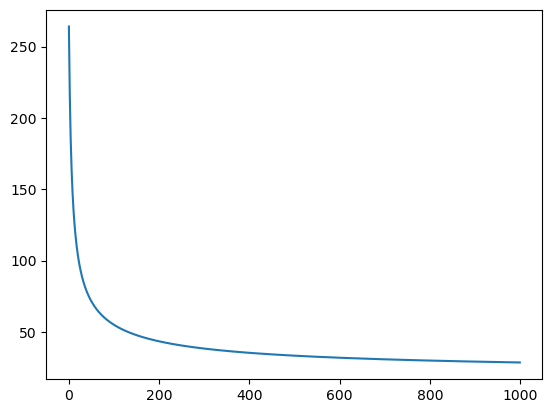

Activated Output [0.99537157 0.99996288 0.71106199 0.01013956 0.99901686 0.0213002
 0.97728948 0.01230484 0.95239615 0.94077169 0.00662394 0.99934286
 0.25057706 0.66694512 0.00466866 0.04326325 0.98855581 0.00262957
 0.00327314 0.63702259 0.00017829 0.00000694 0.99924022 0.00107315
 0.91686331 0.83082211 0.99995046 0.00024607 0.07314753 0.25823276
 0.00081577 0.00469917 0.98298974 0.06338822 0.064576   0.42760989
 0.01330253 0.02515418 0.00002347 0.00015198 0.99998559 0.21361468
 0.00112165 0.04504265 0.00365753 0.03483927 0.00266096 0.99999047
 0.10346835 0.92900436 0.02771056 0.00314894 0.99898227 0.00004199
 0.00040522 0.98737147 0.01896256 0.01563002 0.99993349 0.0001621
 0.00125937 0.84568213 0.11401414 0.02887864 0.00375188 0.20380428
 0.0060286  1.         0.94562167 0.00006669 0.99999998 0.99965077
 0.04113967 0.00062162 0.35180401 0.0251501  0.01375952 0.00224547
 0.00880221 0.60290545 0.04877052 0.00463964 0.00887602 0.99997483
 0.00009015 0.00373453 0.02022259 0.00080095 0.

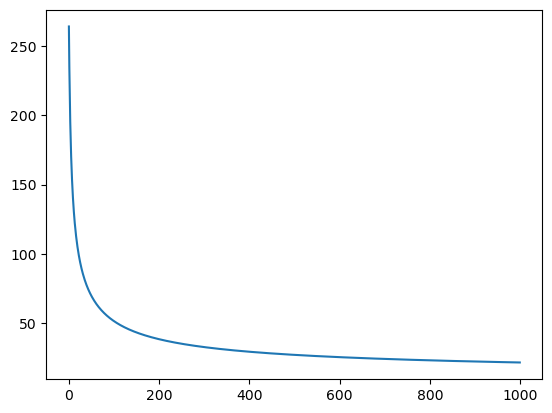

Activated Output [0.0001198  0.00085109 0.98404342 0.03302284 0.72575589 0.5055096
 0.99999586 0.1063485  1.         0.99785445 0.00131711 0.9996392
 0.03524213 0.0003846  0.9998398  0.00012691 0.11119912 0.98811584
 0.00054514 0.00012126 0.59952196 0.05225731 0.00157102 0.00394558
 0.99999571 0.00035132 0.99987729 0.99846286 0.01527181 0.0006064
 0.000568   0.99113299 0.99268621 0.0096392  0.00013127 0.0079591
 0.99998231 0.89706878 0.03255293 0.00802525 0.0437878  0.04325251
 0.00414933 0.85284451 0.00485762 0.36543005 0.00007221 0.01272239
 0.1067672  0.0004697  0.98639645 0.00012408 0.00475533 0.9583901
 0.00101413 0.98985517 0.95197216 0.00952477 0.00648938 0.61760217
 0.99231469 0.98932235 0.99998999 0.00433636 0.99993767 0.00288477
 0.95383498 0.99866721 0.00002682 0.00078143 0.99999989 0.99707123
 0.99679311 0.99991699 0.06484345 0.07047306 0.00390332 0.02969978
 0.9999991  0.2031251  0.01342702 0.95622552 0.99710952 0.14032048
 0.00855924 0.99549545 0.97843382 0.00287263 0.999

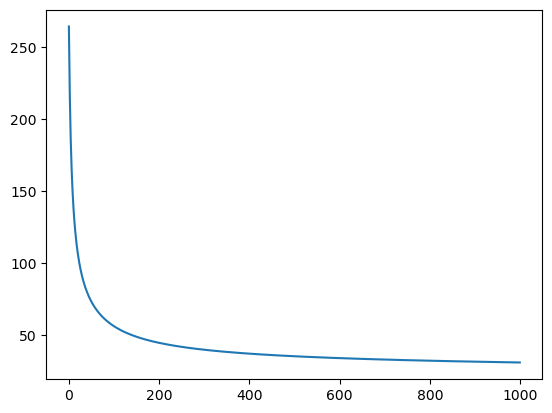

Activated Output [0.99971125 0.99695538 0.0009125  0.28170985 1.         0.00026699
 0.97274654 0.00850773 0.22624936 0.00557596 0.07567479 0.00087877
 0.99939038 0.97087529 0.00467214 0.99379966 0.64709091 0.77343934
 0.02396449 0.01340737 0.00011402 0.27606029 0.00216267 0.02824069
 0.00194371 0.00013293 0.00380723 0.00340226 0.98223174 0.99990189
 0.99957    0.00422    0.63759584 0.00012776 0.00043045 0.00117081
 0.04705383 0.00614894 0.19954092 0.02491334 0.99625065 0.9999945
 0.15731841 0.99999998 0.99996093 0.09281261 0.99999535 0.99943615
 0.00474688 0.00086555 0.00069961 0.01983802 0.00031895 0.02636291
 0.99999116 0.00711933 0.00377811 0.999971   0.59610118 0.98336448
 0.13041387 0.99970721 0.44127485 1.         0.00211164 0.00328288
 0.00140438 0.00028762 0.12554602 0.04853179 0.98363293 0.02241476
 0.99985737 0.00379455 0.01161162 0.9998206  0.94351269 0.00563368
 0.9942396  0.02725687 0.99999199 0.00731493 0.99999943 0.10720377
 0.00076471 0.00125583 0.9985156  0.99935355 0

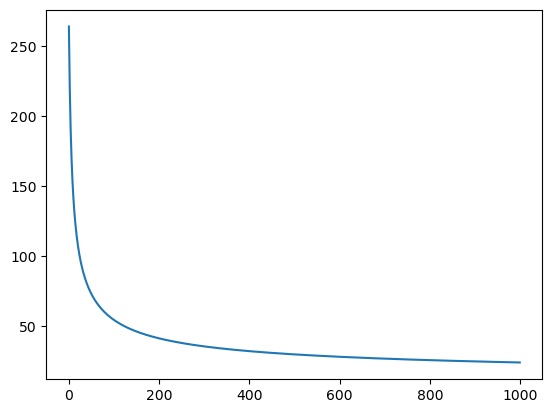

Activated Output [0.19943664 0.99941087 0.15057703 0.33685938 0.00809604 0.95080256
 0.55997854 0.47436198 0.99999996 0.0001598  0.99999427 0.15245561
 0.02814457 0.10289656 0.01935087 0.66746357 0.00016272 0.00132122
 0.0030101  0.92291219 0.97839113 0.1462517  0.00010845 0.97338034
 0.00061635 0.13758641 0.0024905  0.98829774 0.00032293 0.00730935
 0.01286405 0.99999979 0.99996863 0.19970568 0.00027271 0.00032873
 0.47884238 0.01964981 0.74585724 0.0000309  0.01068937 0.03827807
 0.00048054 0.00108482 0.00673153 0.09416632 0.00005277 0.00228043
 0.00117252 0.18695534 0.05570316 0.00338339 0.02123118 0.00216851
 0.02097824 0.99999998 0.00285994 0.96678711 0.99988992 0.99999518
 0.99999864 0.99906006 0.99971425 0.06288932 0.00902525 0.99999921
 0.0967465  0.00166171 0.11701025 0.9543938  0.00693749 0.99931853
 0.0086568  0.04114407 0.84431597 0.04348789 0.61250111 0.99995331
 1.         0.99999864 0.99983507 0.00005283 0.09580554 0.00000486
 0.99868252 0.00387004 0.00054292 0.99999993 

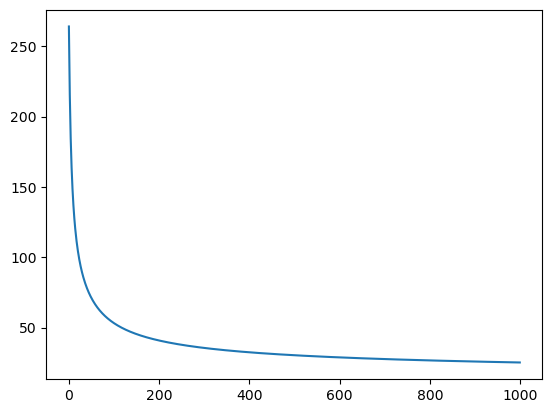

Activated Output [0.99999921 0.99956208 0.00047755 0.0021142  0.04686953 0.99989595
 0.99807746 0.00055628 0.99999982 0.99993622 0.24933221 0.99997396
 0.03406006 0.55099898 0.12020362 0.99999998 0.19844787 0.83693177
 0.00120851 0.00570964 0.9597323  0.03583791 0.99999939 0.98701941
 0.00177966 0.00012472 0.99822534 0.99990797 0.28057167 0.00204721
 0.128218   0.01205014 0.00220212 0.74561478 0.00568861 0.05249718
 0.13191811 0.00189973 0.00024197 0.01606673 0.00158975 0.00002701
 0.99073742 0.00042916 0.84201198 0.00067204 0.00369682 0.99938966
 0.24554452 0.02308779 0.99999937 0.79410252 0.08988672 0.00485594
 0.00665829 0.00174025 0.00082282 0.97695698 0.99993633 0.96677038
 0.52990388 0.0009883  0.00096756 0.97333211 0.00025248 0.98483912
 0.00032236 0.60891414 0.00014194 0.00081363 0.03361535 0.01453036
 0.99998889 0.96140923 0.99999584 0.01144208 0.00273773 0.99983854
 0.99322479 0.00110843 0.27650699 0.05084321 0.00110128 0.06067309
 0.00014619 0.71866752 0.99989577 0.99996535 

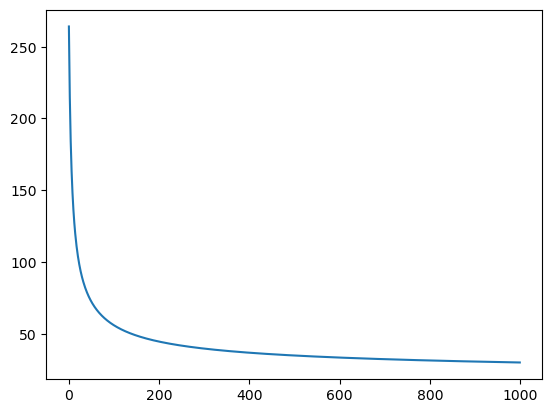

Activated Output [0.00981659 0.96635911 0.99526131 0.99992273 0.98700171 0.00702955
 0.19132143 0.03291718 0.3382731  0.11070128 0.99976347 0.99999992
 0.00062427 0.00474908 0.99971089 0.05072897 0.00053481 0.25327657
 0.16178967 0.51348333 0.99999989 1.         0.00515549 0.99999926
 0.99871167 0.99945301 0.18929987 0.99988399 0.99993967 0.9929598
 0.00813027 0.14507643 0.01388767 0.9998785  0.00043923 0.97448732
 0.02075779 0.0044905  0.05405051 0.00239886 0.95199355 0.99635062
 0.66775135 0.99999998 0.99996562 0.10663409 0.99999715 1.
 0.9999943  0.99999349 0.00210336 0.00118966 0.99802381 0.10393533
 0.00285229 0.00012714 0.0009122  0.00085922 0.09753508 0.00445818
 0.00127034 0.00708348 0.00519885 0.00111764 1.         0.00152721
 0.99952385 0.99954797 0.00052786 0.99971572 0.00082151 0.00229767
 0.00015726 0.9999492  0.00001504 0.0002044  0.99906172 0.02666082
 0.00706947 0.99998543 0.99987148 0.69245358 0.46039182 0.00065326
 0.96307266 1.         0.99979347 0.00174382 0.9533367

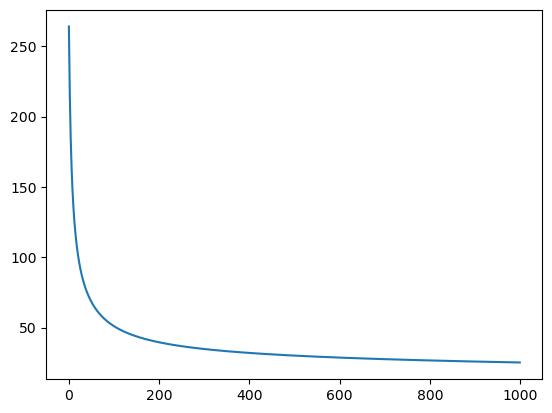

Activated Output [0.99498357 0.00042588 0.00538193 0.03712862 0.99934442 0.89136098
 0.00049864 0.18021632 0.000716   0.94946074 0.99950729 0.00549427
 0.94943412 0.99996304 0.02274922 0.01572379 0.98270163 0.04560648
 0.00060225 0.00929264 0.99999544 0.0029939  0.4472379  0.06425707
 0.00149214 0.00011521 0.00260679 0.01179754 0.00031487 0.007914
 0.99219274 0.1305691  0.99909405 0.00013829 0.99981596 0.05615242
 0.00032953 0.99913304 0.02913966 0.00806489 0.00055848 0.00409075
 0.00117112 0.97724173 0.06801351 0.99999602 0.00754118 0.0034437
 0.0022365  0.29723846 0.99959688 0.01210568 0.01904791 0.01971932
 0.03446367 0.00138577 0.99833786 0.05019053 0.00015693 0.97605377
 0.00055434 0.00022787 0.99925577 0.00028876 0.14077302 0.00909184
 0.02146673 1.         0.99991812 0.98491837 0.00145123 0.66688188
 0.00052751 0.02219737 0.04510336 0.00657532 0.99930289 0.00159204
 0.00129449 0.00226144 0.24610392 0.999995   0.00012962 0.00487481
 0.00619577 0.51247119 0.99999988 0.99985274 0.0

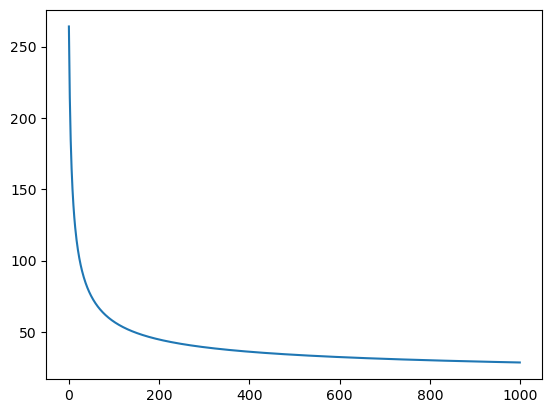

Activated Output [0.04965449 0.00360469 0.00022566 0.08047523 0.0103793  0.99593403
 0.00799114 0.08451187 0.00023242 1.         1.         0.99730482
 0.00015943 0.00047086 0.88809983 0.99990863 0.99999999 0.0000837
 0.00297274 0.00020303 0.99993894 0.99998686 0.99999588 0.9959127
 0.01797389 0.01071363 0.07610896 0.97297679 0.9998563  0.01743103
 0.00976805 0.99986549 0.00805389 0.00283467 0.01756856 0.00010145
 0.99896393 0.04408506 0.1508279  0.06371784 0.25454282 0.95588047
 0.00021504 0.99994048 0.99996143 0.9818564  0.13207577 0.99999975
 0.99981503 0.00376472 0.98972085 0.99617686 0.04287806 0.99954926
 0.96498216 0.05111619 0.97752396 0.01921612 0.02515352 0.98288852
 0.00010424 0.00653434 0.24427944 0.00090504 0.04974035 0.00009198
 0.00006881 0.00144044 0.00424777 0.0062705  0.01343002 0.99999978
 0.04529944 1.         0.00039774 0.99914684 0.01257193 0.00401554
 0.00056772 0.00912972 0.01115728 0.99999139 0.20051409 0.9591991
 0.99888913 0.82114353 0.02581011 0.99999999 0.0

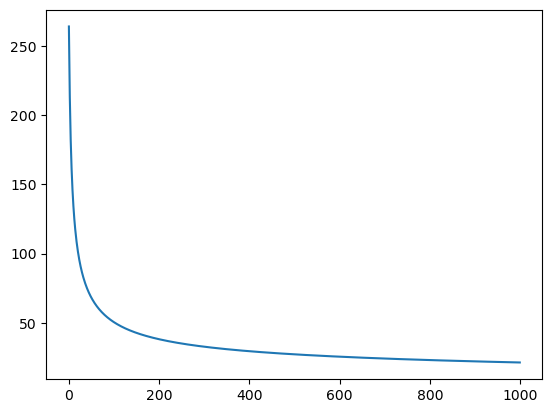

Activated Output [0.04663732 0.01201041 0.00008644 0.99999659 0.99731433 0.17470276
 0.1537315  0.9866198  0.0027908  0.00004535 0.00160731 0.03043803
 0.00274973 0.99972598 0.99893248 0.05936708 0.00016653 0.22748215
 0.00050506 0.00043648 0.78722886 0.00522358 0.29879498 0.17563653
 0.01642352 0.79439456 0.99999567 0.00022993 0.98026753 0.15220276
 0.00030585 0.96917057 0.00083964 0.01328112 0.99996774 0.00120948
 0.00013914 0.00165201 0.89257635 0.00053254 0.01196311 0.00265496
 0.99999999 0.99943773 0.01440428 0.00050845 0.0089433  0.00271405
 0.02494254 0.98719724 0.04525558 0.71679087 0.00500682 0.99999731
 0.00331909 0.00015513 0.00041622 0.00631671 0.00137758 0.00003295
 0.00310685 0.00326745 0.81208569 0.00010065 0.15141987 0.09615587
 0.02183073 0.99989984 0.00186894 0.00183689 0.58977199 0.99998471
 0.00254416 0.00010455 0.32673512 0.01129786 0.99998521 0.0037083
 0.04349431 0.00086488 0.01848479 0.00687544 0.00008199 0.99051462
 0.00267938 0.01875956 0.21364935 0.01704105 0

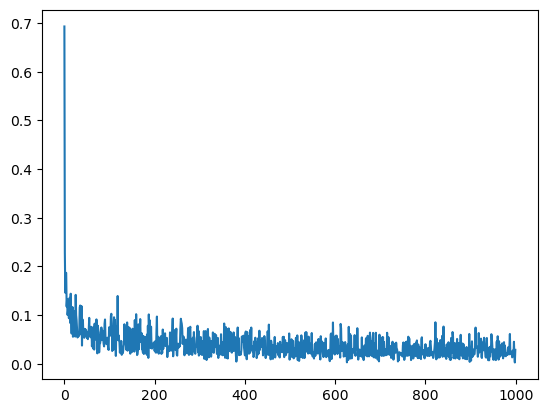

Activated Output [1.         0.98329279 0.00000103 0.99990676 0.02472646 0.00109743
 0.00003124 0.00922085 0.72983798 0.00081132 0.01187805 1.
 0.99914515 0.00000015 0.00000036 0.33645515 1.         0.
 0.00003067 0.99985058 0.87144328 0.00000233 0.99999999 1.
 0.00093336 0.33766548 0.00000001 0.00023186 0.99999188 1.
 0.8282135  1.         0.00000057 0.99994508 0.00000137 0.00007409
 0.99510862 1.         0.00282505 0.05425302 1.         0.88113055
 1.         0.00078779 0.99632672 0.00194477 0.00000106 0.00009214
 0.00000023 0.05027858 0.00002519 0.99999991 0.00122639 1.
 0.00000011 0.00000022 0.00013    0.04866186 0.00000001 0.99868221
 0.99767992 0.00141614 0.99999932 0.00001735]
Max accuracy: 1.00000
Accuracy: 1.00000


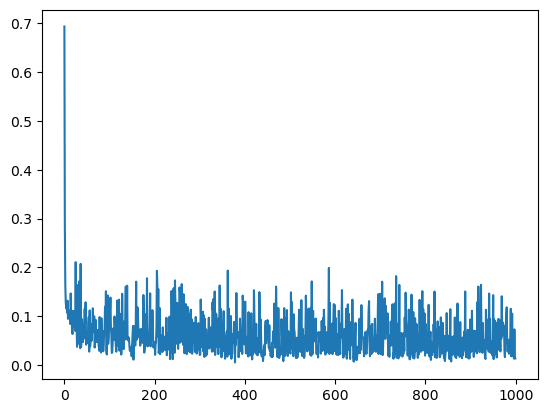

Activated Output [0.02095474 0.05841224 0.02522396 0.00040208 0.00001401 0.99999166
 0.98599429 0.00057901 0.00018417 0.00000124 0.99997247 0.99999964
 0.99995552 0.00049867 0.02555646 0.02074414 0.99999998 0.0003498
 0.99999888 0.0003864  0.00017364 0.00006439 0.00000291 0.00000395
 0.0000906  0.0108187  0.00050391 0.99999988 0.00055229 0.00122387
 0.00006059 0.00017366 0.99999997 0.00711435 0.00000007 0.00098657
 0.00000496 0.01051083 0.17120244 0.00028168 0.0007303  0.00822726
 0.99979645 0.01023263 0.00008052 1.         0.00081993 0.99892535
 0.0036853  0.06836084 1.         0.00001005 0.99998675 0.00299654
 0.00006998 0.00344507 0.12613138 0.00000369 0.00025582 0.20937899
 0.0003503  0.00647898 0.00287105 0.00034941]
Max accuracy: 1.00000
Accuracy: 1.00000


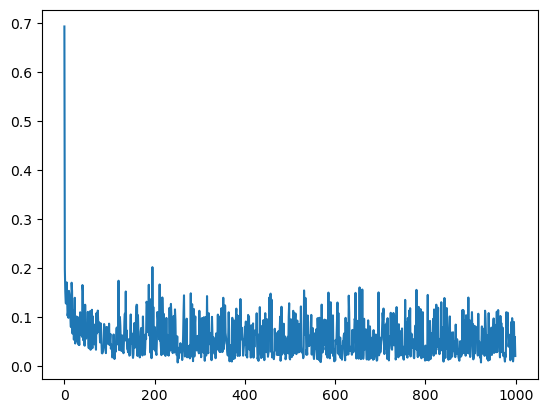

Activated Output [0.00004611 0.00072288 1.         0.02371866 0.9999508  0.00058082
 0.03945711 0.00094933 0.83373506 0.9999999  0.00000354 0.00047468
 0.00016311 0.00210598 0.99994963 0.10006871 0.12719584 0.99999181
 0.98216625 0.00008314 0.00026886 0.99999998 0.99999895 0.00000109
 0.0008172  0.00063767 0.00007604 0.03708472 0.9999684  0.99997357
 1.         0.00350765 0.00062255 0.99975524 0.0000664  0.99999588
 0.00461721 0.28212495 0.99999993 0.99998295 0.00284504 0.02174231
 0.00042901 0.01599779 0.9995459  0.00003487 0.00043832 0.01360048
 0.03415936 0.00707139 0.00484682 0.00023452 0.00637111 0.00014602
 0.97662978 0.00046414 0.00127954 0.99998723 0.00005993 0.25793416
 0.99999992 0.00003242 0.99999999 0.01079584]
Max accuracy: 1.00000
Accuracy: 0.96875


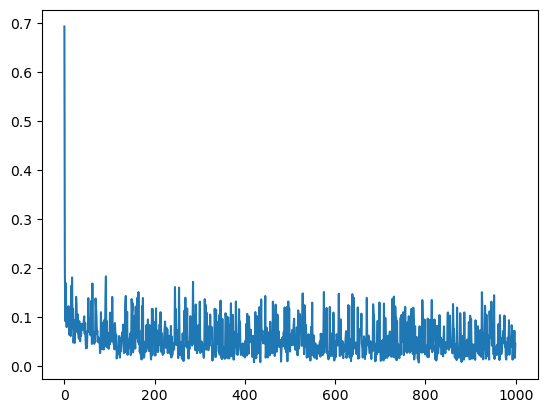

Activated Output [0.00005347 0.10710038 0.00000146 0.99680558 0.99999999 0.02840926
 0.00013269 0.00000003 0.99988499 1.         0.00000181 0.99998328
 0.92349896 0.00212956 0.99502819 0.00006472 0.00000083 0.99516548
 0.19157827 0.06827264 0.99999865 0.00585378 0.48696544 0.0000005
 0.00014652 0.00419672 0.00000623 0.0504152  0.00044944 0.99999998
 0.00124314 0.99999942 0.00083796 0.00034709 0.99736287 0.04227914
 0.9999612  0.9995956  0.99926734 0.0158078  0.01453327 0.99999837
 1.         0.00000002 0.00002673 0.00618668 0.00000373 0.99999885
 0.00032758 0.00000929 0.00010758 0.00053462 0.99954019 0.00095204
 0.00002401 1.         0.02364987 0.00071485 0.9999604  0.00005249
 0.99999992 0.0000005  0.00053363 0.90429262]
Max accuracy: 1.00000
Accuracy: 0.98438


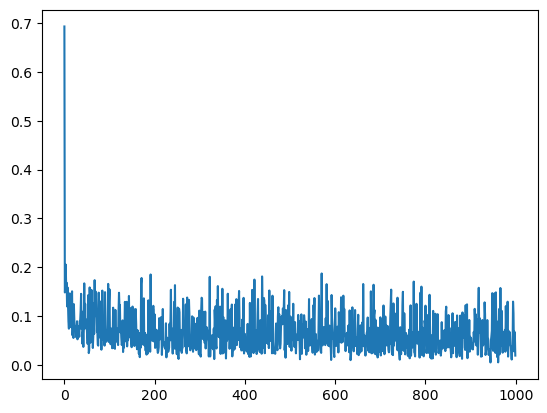

Activated Output [0.000004   1.         0.00718568 0.00021624 1.         0.99765646
 1.         1.         0.01641756 0.99999994 0.00000525 0.99999996
 1.         0.00001543 0.00001863 0.99999897 0.01762061 0.99999987
 1.         0.99971645 0.0053647  0.00341506 0.000041   0.9997502
 1.         0.00002661 1.         0.07544449 0.00003429 0.00017375
 0.00001046 1.         1.         0.96861757 0.00020405 0.99999999
 0.00017068 0.00123744 0.00000008 0.00000011 1.         0.04526604
 1.         0.00205918 0.14816853 0.00001071 0.99999999 0.00000067
 0.00033764 1.         0.99999999 0.00036614 1.         0.01079619
 0.88182124 0.49536221 1.         0.99998733 0.00010299 0.00004225
 1.         0.99932835 0.99929372 1.        ]
Max accuracy: 1.00000
Accuracy: 0.96875


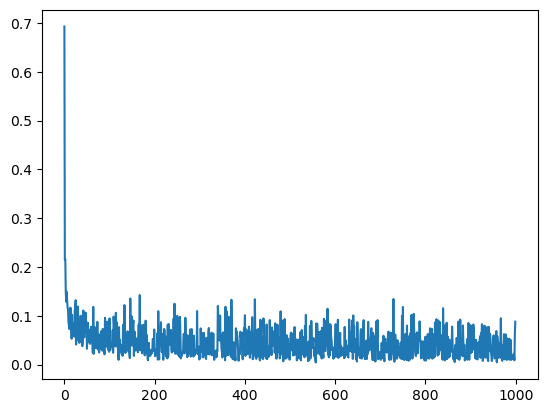

Activated Output [0.00000179 0.9550235  0.00064935 0.00004454 0.00000027 0.00017977
 0.00000098 0.00001379 0.00013724 0.00282947 0.00003344 0.99557437
 1.         0.00008199 0.00059408 0.00002332 0.99999924 0.04102834
 0.00000001 0.00002437 0.00001469 0.24777644 0.00000419 0.02685169
 0.00417737 0.11967896 0.999999   0.10231583 0.20776944 0.00006635
 0.99997413 1.         0.99999999 0.99885232 0.99972415 0.9993273
 0.99999998 0.00000001 0.09751696 0.99941544 0.00000084 0.00221221
 0.06747105 0.00056862 0.91650165 0.00000079 0.99931101 0.00076385
 0.99997011 0.07130705 0.00000054 0.99246698 0.00164446 0.00000138
 0.00000629 0.99999409 0.99999948 0.00014352 0.0005443  0.99999808
 0.99990911 0.00003337 0.99988667 1.        ]
Max accuracy: 1.00000
Accuracy: 0.96875


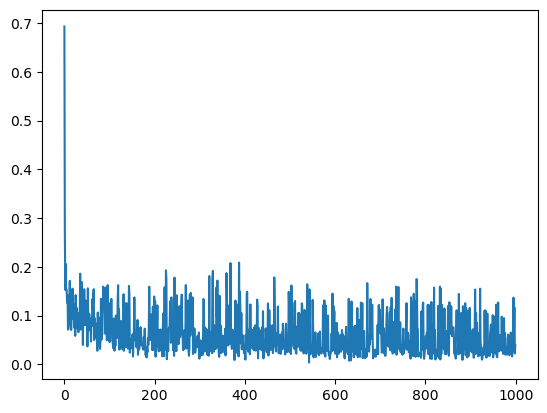

Activated Output [0.00010367 1.         0.00000088 0.00011376 0.00195784 0.00004308
 0.00000039 0.00094002 0.00002959 0.00000006 0.99999999 0.00009547
 0.99236667 0.00000227 0.97534019 0.99999997 0.00700816 0.00014663
 0.00018476 0.00428229 0.99945757 0.99999752 0.99927932 0.99993697
 0.13643564 1.         0.01483678 0.4911952  0.02282969 0.15524385
 0.00000361 0.00000002 0.00020822 0.00032448 0.99946564 0.00027234
 0.16538147 0.3956545  0.00000012 0.99999896 0.99966276 0.00000178
 0.83517272 1.         0.00005354 0.9955964  0.00011493 0.99995449
 1.         0.96769447 0.00000229 0.00054151 0.99999989 0.99999999
 0.68824595 0.00000111 0.99999972 0.00473952 0.12227605 0.00002352
 1.         0.99925917 0.00000661 1.        ]
Max accuracy: 1.00000
Accuracy: 0.95312


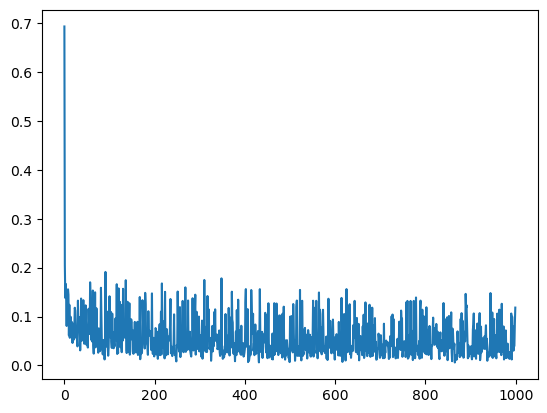

Activated Output [0.17639756 0.00000158 0.99999995 0.00000768 0.99971456 0.99999097
 0.00000374 0.00079376 0.00012165 1.         0.01629286 0.04219841
 0.0199587  0.00001562 0.99985997 0.0000002  1.         0.99999564
 0.99997097 0.00000008 0.0001759  0.00597731 0.00631588 0.00003461
 1.         0.99999998 0.23624858 0.00000018 0.00003555 0.01023858
 0.0048829  0.00000112 0.00011666 0.99274137 0.18285009 0.99965475
 0.00512493 0.99454517 0.00384228 0.00740513 0.99999992 0.99999992
 0.99999211 0.000355   0.999995   0.0002668  0.99959665 0.08899798
 0.00025273 0.99935092 0.99999996 0.01880172 0.0000014  0.00022337
 0.0086607  0.00075685 0.00000103 0.08000544 0.99999613 0.00007082
 0.00013654 0.00000375 0.00002444 0.99999584]
Max accuracy: 1.00000
Accuracy: 0.95312


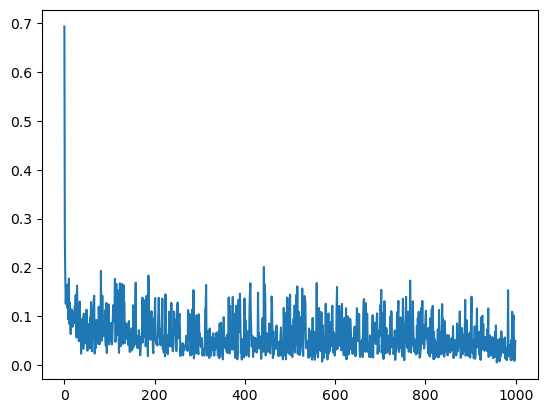

Activated Output [0.99999988 0.00000001 0.00000008 1.         1.         0.11417301
 0.00000244 0.00061463 0.86778612 0.00003341 0.00002342 0.34471715
 0.00000653 0.016505   1.         0.10629096 0.00000141 0.99999999
 0.10645599 0.00006198 0.00034053 0.00003491 1.         1.
 0.00067269 0.000002   0.00001139 0.00036012 0.94073476 0.00462957
 0.00018569 0.00023238 0.99626335 0.99999946 0.13089531 0.99998209
 0.00011974 0.00000005 0.99881478 0.20150435 0.99336824 0.01031668
 0.00000424 0.00000759 0.0000143  0.99991191 1.         0.00011879
 0.08402997 0.00006382 0.99987496 0.99999972 1.         0.00124979
 0.99791987 0.30135621 0.00004416 0.99999993 0.00019324 0.00000916
 0.00072287 0.00062472 0.00287005 1.        ]
Max accuracy: 1.00000
Accuracy: 1.00000


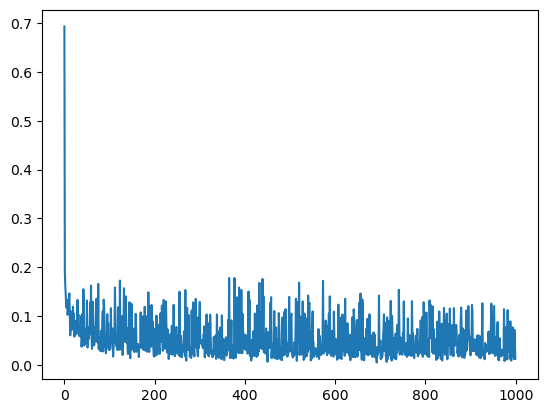

Activated Output [1.         0.00738164 0.00103703 0.00126561 0.00116635 0.00051195
 0.00371469 0.00008478 0.00081737 0.00001515 1.         1.
 0.00021778 0.00050536 0.98651697 0.00287225 0.00015224 0.00000214
 1.         0.80807532 0.99596064 0.00154479 0.997846   0.00009229
 0.00076937 0.00031276 0.99999983 1.         1.         0.00647548
 0.00085743 0.00001843 0.9990387  0.1765984  0.9848536  0.00719807
 0.00696687 0.02344409 0.00047151 0.00000007 0.98268582 0.98571316
 0.04088881 0.00024754 0.00000074 0.00525479 0.99992479 0.9999702
 0.00205233 0.01098882 0.00002555 0.01417121 0.99999983 0.99999764
 0.00000629 0.00049398 0.01096144 0.95648406 1.         0.04991074
 0.00001288 0.00012936 0.00004421 0.95589974]
Max accuracy: 1.00000
Accuracy: 1.00000


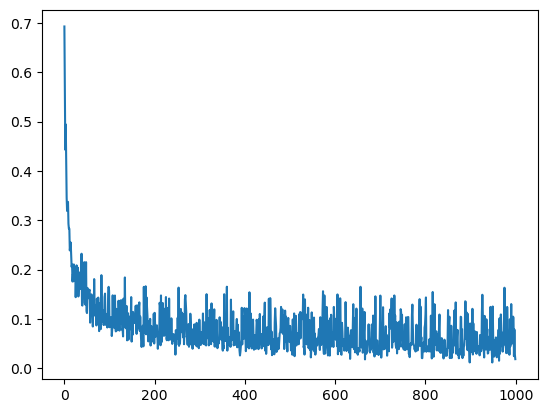

Activated Output [0.99999753 1.         0.07070765 0.9679921  0.02557334 0.03186121
 0.99997521 0.99999119 0.0268389  0.00002127 0.00309852 0.00559201
 0.99602326 0.00349638 0.00848153 0.99524072 0.13499199 0.0197311
 0.00015707 0.99995368 0.99984462 0.00604479 0.99671263 0.87887424
 0.01276714 0.01721315 0.99154613 0.00087322 0.0207694  0.00036805
 0.99998441 0.99999975 0.88666531 0.05817374 0.07109316 0.00010929
 0.9999624  0.99995486 0.02636694 0.00071296 0.00297862 0.00480355
 0.99479296 0.00002258 0.01154627 0.01274945 0.99999857 0.00112317
 0.01405008 0.00051582 0.00207685 0.03165938 0.99993878 0.93146261
 0.99999571 0.00149423 0.00002058 0.00349648 0.99989865 0.00012313
 0.87825269 0.00053879 0.99999991 1.        ]
Max accuracy: 1.00000
Accuracy: 0.96875


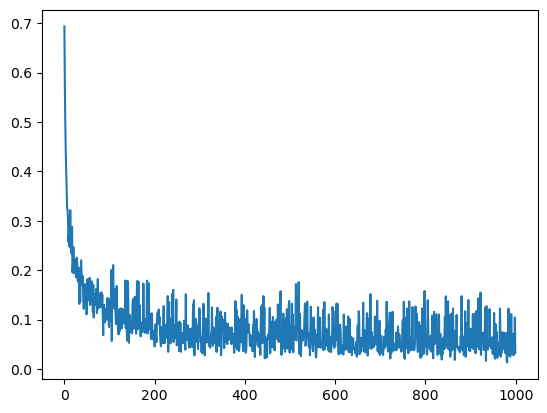

Activated Output [0.0000268  0.9998774  0.02136012 0.0074252  0.00104155 0.99999985
 1.         0.00076138 0.17544404 0.00433317 0.99209781 0.0422244
 0.00256684 0.00017236 0.01469296 0.99999943 0.00023898 0.98821596
 0.03347752 0.01450354 0.99885117 0.01294253 0.99065526 0.00077968
 0.02534658 0.03577067 0.40199358 0.99947943 0.06629907 0.0013944
 0.18870007 0.96318928 0.00168125 0.00108127 0.87808056 0.00035978
 0.94410865 0.00021916 0.04059638 0.99805426 0.99998646 0.00031096
 0.0695895  0.9999999  0.00029799 0.05640444 0.00072072 0.00180522
 0.97303825 0.99999075 0.00619976 0.95928843 0.00819321 0.01748896
 0.99949558 0.00523917 0.00036962 0.00025373 0.0002855  0.99991791
 0.00001164 0.33390396 0.01196923 0.00112253]
Max accuracy: 1.00000
Accuracy: 0.96875


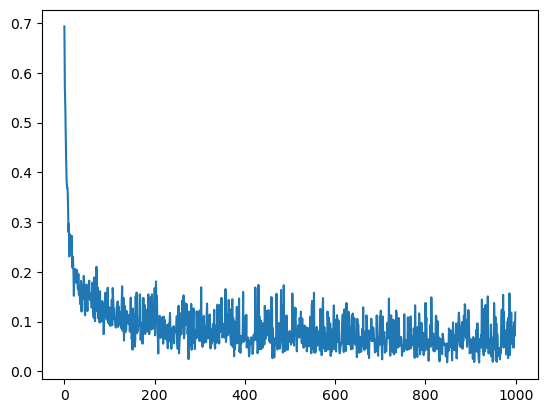

Activated Output [0.02734943 0.00370026 0.01043909 0.99961321 0.0030254  0.00005664
 0.01245281 0.00517342 1.         0.00285898 0.21556402 0.99999503
 0.00358276 0.76736311 0.93149926 0.00083431 0.01911418 0.99529515
 0.07720132 0.99733179 0.2908433  0.99876317 0.0013255  0.02638776
 0.00017262 1.         0.98714528 0.99999987 0.99999912 0.025956
 0.01388216 0.00066457 0.07343111 0.00229809 0.98223687 0.00513927
 0.02531293 0.01814853 0.05765313 0.00135815 0.04359229 0.0000505
 0.00111949 0.15239463 0.99587024 0.97972706 0.99133167 0.01204323
 0.9896213  0.99980923 0.00106899 0.00095618 0.00002572 0.94374284
 0.00022105 0.99837854 0.00084618 0.99959382 0.00237645 0.00094406
 1.         0.9999999  0.0006955  1.        ]
Max accuracy: 1.00000
Accuracy: 0.98438


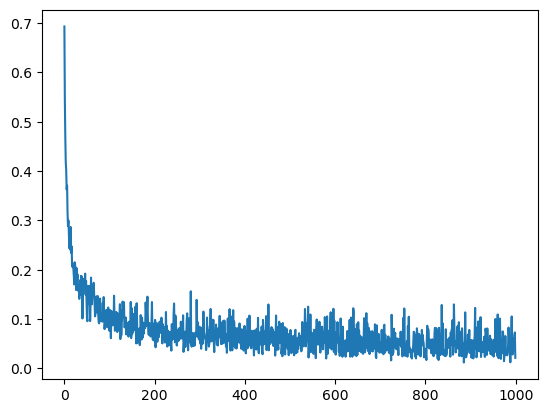

Activated Output [0.00033367 0.99999999 0.99283232 0.00030256 0.00097728 0.99943414
 0.99965677 0.9913657  0.99837742 0.00292039 0.00116081 0.00283502
 0.91025468 0.05316229 0.00995565 0.00031737 0.00176047 0.00103957
 0.99999932 0.99822203 0.0001962  1.         0.00001992 0.29027703
 0.00246084 0.99990905 0.00115893 0.00003248 0.99685002 1.
 1.         0.00004801 0.99999985 0.00050869 0.07848612 0.00000142
 0.99987133 0.95601318 0.00849365 0.00043888 0.0108754  0.35850759
 0.01015898 0.00208708 0.99997845 0.00274491 0.99999999 0.00470476
 0.99999862 0.12692779 0.99955124 0.00288195 0.00012192 0.00674138
 0.0026828  0.99997644 0.00426281 0.01523978 0.00000175 0.99476949
 0.01368785 0.99999995 0.99964022 0.97058207]
Max accuracy: 1.00000
Accuracy: 0.96875


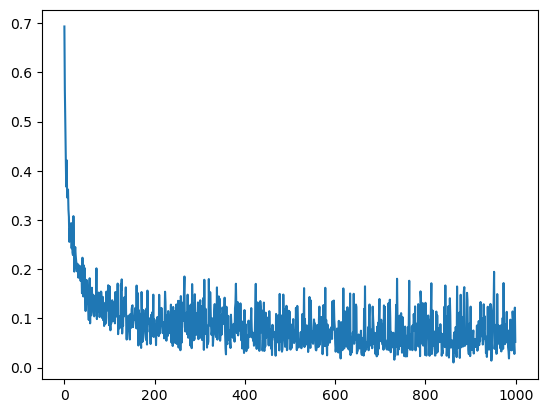

Activated Output [0.25254669 0.02583689 0.99999962 0.00231014 0.08795322 0.99982623
 0.00246831 0.99980854 0.00483534 0.98526625 0.99612609 0.56854785
 0.00990575 1.         0.00015956 0.06428785 0.00130578 0.99720863
 0.98118618 0.00102524 0.00342357 0.0029827  0.99666077 0.99999988
 0.00090716 0.00240041 0.22303291 0.00142862 0.00004097 0.99997304
 0.00117354 0.00112541 1.         0.01966823 0.99995976 0.62907997
 0.00026197 0.05678904 0.01570341 0.00267847 0.95601417 0.00297852
 0.99895824 0.00114535 0.99999996 0.05462403 0.00081613 0.1069299
 0.96785649 0.11180175 0.03163154 0.98739727 0.01117711 0.0000311
 0.35933719 0.96331844 0.00093404 0.07904387 0.09510397 1.
 0.00001778 0.95843478 0.00264742 0.00008626]
Max accuracy: 1.00000
Accuracy: 0.98438


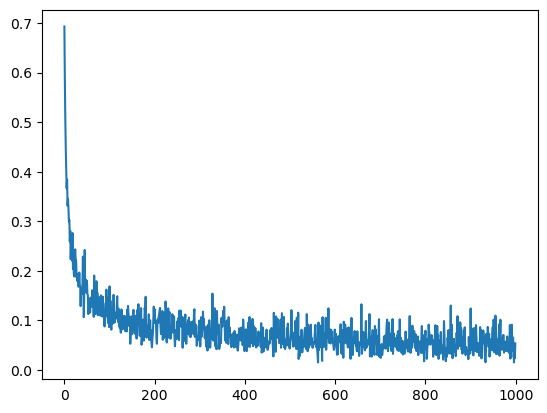

Activated Output [0.00142123 0.0151549  0.00103119 0.00007373 0.9836701  0.00052646
 0.99999854 0.9673722  0.00190773 0.99992756 0.00025298 0.9999968
 0.99908022 0.10815922 0.00043892 0.00731161 0.00294186 0.07918149
 0.24324067 0.00000212 0.00596549 0.0000055  0.23064511 0.00009973
 0.00000083 0.00423454 0.26768571 0.99999207 0.9112834  0.00194966
 0.97254911 0.18183084 0.99541999 0.00885866 0.06476842 0.00000135
 0.00011858 0.98913539 0.98487716 0.00012974 0.12378049 0.000418
 0.99995245 0.00554094 0.01817468 0.00005269 0.00220067 0.02556512
 0.00133759 0.00640399 0.999186   0.00615387 0.9999984  0.05638951
 0.00020496 0.00001493 0.99841006 0.00008517 0.0000043  0.00007493
 0.00001026 0.00022526 0.00264439 0.91286966]
Max accuracy: 1.00000
Accuracy: 0.96875


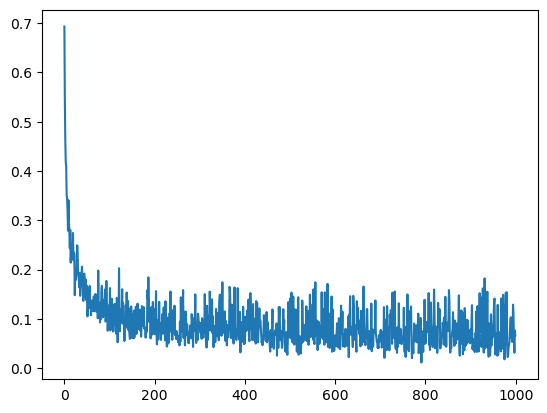

Activated Output [0.00215487 0.99998435 0.40936604 0.23986986 0.00047636 0.00315291
 0.00042165 0.99940547 0.99998763 0.99913373 0.9998012  0.00176202
 0.00488398 0.00116749 0.00827824 0.00000322 0.00010727 0.99989901
 0.0000121  0.00012219 0.00218978 0.00059667 0.0531525  0.0009052
 0.18593163 0.99557421 0.74243229 0.00007203 0.62637667 0.00095917
 0.00598857 0.95949768 0.00015188 0.00002606 0.00201784 0.97535654
 0.00005573 0.00114205 0.99994576 0.01159584 0.00013194 0.85470883
 0.90064528 0.00040174 0.052807   0.01021188 0.00343001 0.14445498
 0.00055296 0.00022325 0.86990683 0.99892714 1.         0.00186867
 0.03039538 0.003494   0.97386671 0.99971098 0.00011886 0.02596284
 0.00198691 0.03375159 0.91961076 0.99999852]
Max accuracy: 1.00000
Accuracy: 0.98438


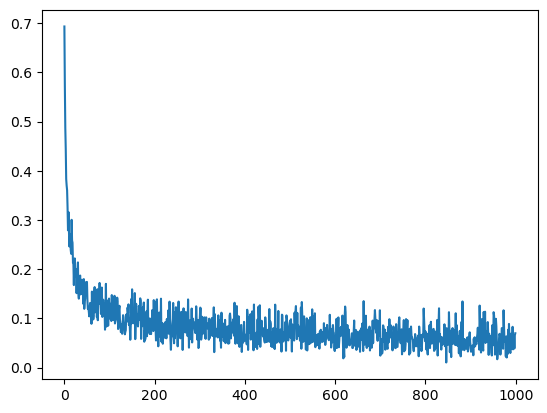

Activated Output [0.0231493  0.9537409  0.66825885 0.00006369 0.99977388 0.88887125
 0.99814137 0.01747051 0.03628242 0.99149321 0.12493048 0.99999866
 0.50029135 0.99332929 0.98980467 0.08808038 0.96911097 0.99927465
 0.00011854 1.         0.12732595 0.99998007 0.99999992 0.00327022
 0.99999822 0.00000297 0.00214432 0.00701093 0.06175582 0.00209036
 0.00012765 0.14719311 0.0008577  0.99966397 0.99999995 0.00001757
 0.00011357 0.01700965 0.00131502 0.99985127 0.00012087 0.99338567
 0.93551139 0.07452778 0.03340356 0.00294415 0.1260532  0.00001007
 0.01289491 0.00466225 0.97995636 0.000521   0.99706675 0.0005221
 0.00956837 0.99999073 0.97434286 0.00296569 0.01911523 0.99999026
 0.96690436 0.03196768 0.14005215 0.05590388]
Max accuracy: 1.00000
Accuracy: 0.98438


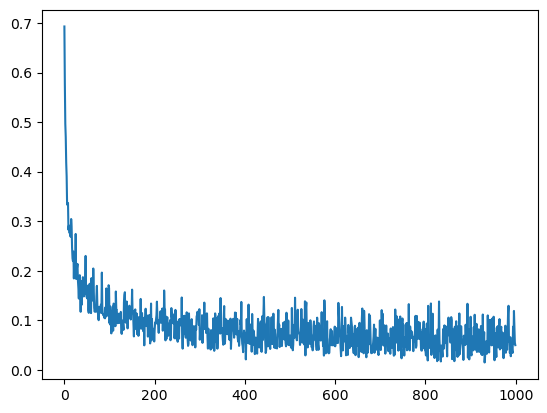

Activated Output [0.01132135 0.82838269 0.99999993 0.99281314 0.23222996 0.00010067
 0.9690226  0.00002292 0.97833515 0.00099829 0.68549598 0.07907945
 0.00008066 0.99944592 0.06019577 0.14201097 0.99455015 0.99758584
 0.98447165 0.01911459 0.00027976 0.87527789 0.99999071 0.99999943
 0.00557921 0.00069173 0.00066301 0.9995078  0.00183417 0.51912162
 0.99999653 0.00229271 0.04197541 0.00022024 0.00008263 0.06418006
 0.01261803 0.99999649 0.9999924  0.00019312 0.01675511 0.00198471
 0.01862002 0.99996563 0.00150568 0.00007438 0.00004592 0.99999976
 0.99999974 0.0009563  0.00063678 0.01959111 0.01889095 0.81710016
 0.00006032 1.         0.99995014 0.00003428 0.96436082 0.9999972
 0.00004057 0.00116795 0.56609409 0.95018237]
Max accuracy: 1.00000
Accuracy: 0.93750


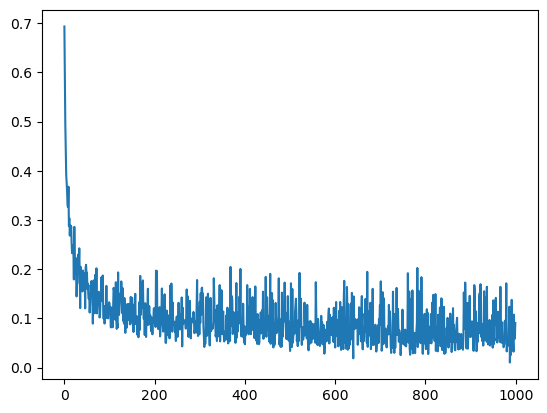

Activated Output [0.99999163 0.99977747 0.996372   0.99707864 0.00152059 0.00379137
 0.99997801 0.02404888 0.04202959 0.00219582 0.035709   0.00112679
 0.91443361 0.99998426 0.97121287 0.04798382 0.00059497 0.00226328
 0.00011004 0.00004269 0.01411041 0.00233957 0.00306084 0.99999995
 0.01610746 0.99895929 0.2705976  0.97519444 0.99698312 0.41474449
 0.04428514 0.99987178 0.00227181 0.40883371 0.00466168 0.99792287
 0.99999989 0.85715461 0.00718728 0.99999998 0.99999848 0.99991777
 0.10617692 0.99998952 0.20042041 0.01573009 0.99999984 0.16025965
 0.1737594  0.01386526 0.00004288 0.00502176 0.99999948 0.98239665
 0.00137582 0.99403361 0.00002116 0.9993308  0.97187069 0.99391012
 0.0005907  0.99753362 0.00180906 0.99999926]
Max accuracy: 1.00000
Accuracy: 0.96875


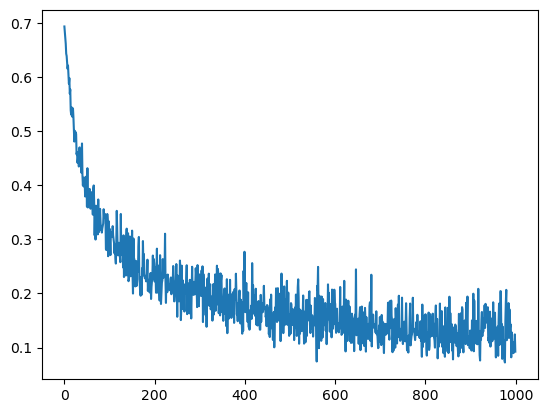

Activated Output [0.02816927 0.13732282 0.08159014 0.03289574 0.60651269 0.03549368
 0.02008235 0.89693398 0.98103088 0.01381353 0.02826864 0.99908559
 0.14102434 0.98059238 0.04614822 0.0906271  0.93025818 0.9999742
 0.05811084 0.99026181 0.08560805 0.00844358 0.19193999 0.98340521
 0.07965749 0.95486716 0.12161795 0.07112733 0.15734908 0.99761555
 0.98934878 0.03324079 0.98363154 0.03799532 0.14899403 0.96052527
 0.0036361  0.09082839 0.02847143 0.00427761 0.99530922 0.99647197
 0.00639307 0.04487192 0.99027474 0.85814636 0.09746715 0.52782632
 0.29240847 0.99732099 0.41314261 0.01591695 0.18508477 0.99572588
 0.293649   0.09308893 0.98291354 0.05506115 0.03758035 0.27404239
 0.99954084 0.0898458  0.01848867 0.00435052]
Max accuracy: 1.00000
Accuracy: 0.93750


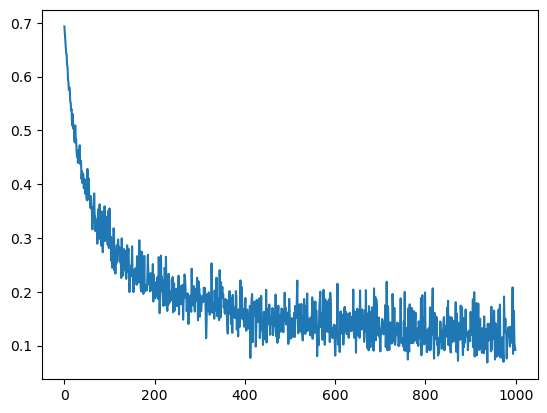

Activated Output [0.01755413 0.00243711 0.00709084 0.30885285 0.10828328 0.00414247
 0.1478093  0.00521502 0.07833266 0.07034326 0.03426158 0.05623536
 0.99788102 0.73613985 0.33979306 0.04300786 0.00148242 0.08659987
 0.03011245 0.14527271 0.99956559 0.9798606  0.91663201 0.00623959
 0.99790356 0.98759701 0.01024306 0.02636362 0.96089616 0.00176515
 0.61093912 0.97601358 0.00969049 0.04492944 0.06205417 0.01490909
 0.93773392 0.04487441 0.87970601 0.00303026 0.02487818 0.01990949
 0.99999537 0.02553097 0.83559025 0.35224677 0.97143929 0.23852332
 0.07402808 0.50138162 0.03653888 0.17580753 0.01559387 0.01961126
 0.06351302 0.99083325 0.58610165 0.99933871 0.89132408 0.99733867
 0.00772026 0.0285559  0.01658856 0.999575  ]
Max accuracy: 1.00000
Accuracy: 0.93750


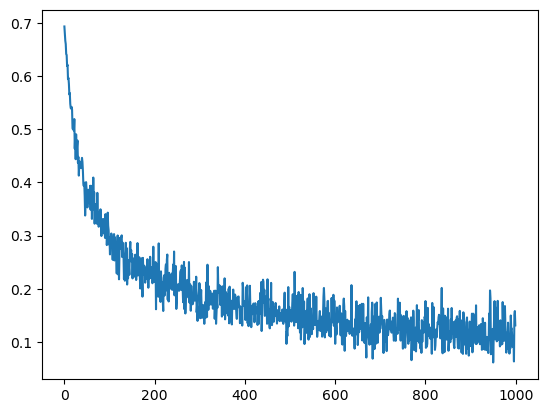

Activated Output [0.20231346 0.00762479 0.05667189 0.01780427 0.00852334 0.02564557
 0.98521237 0.14516525 0.02135157 0.04003326 0.57615932 0.91372659
 0.99350669 0.02460947 0.02487212 0.03885154 0.00391827 0.00633693
 0.99988542 0.07532457 0.14112126 0.00605411 0.054167   0.25251564
 0.00878664 0.99997439 0.99995339 0.09732053 0.99973142 0.03995259
 0.01528956 0.03547054 0.59622535 0.14701439 0.00823061 0.05847928
 0.95692055 0.99982882 0.98453216 0.99776957 0.21794123 0.96701866
 0.56290317 0.99999315 0.99164005 0.1527604  0.32018699 0.92675863
 0.99999854 0.97875381 0.61776995 0.84208748 0.03173882 0.27204747
 0.12720126 0.09137539 0.99911686 0.95641546 0.01546022 0.05902919
 0.99913417 0.41927222 0.01201622 0.95534263]
Max accuracy: 1.00000
Accuracy: 0.93750


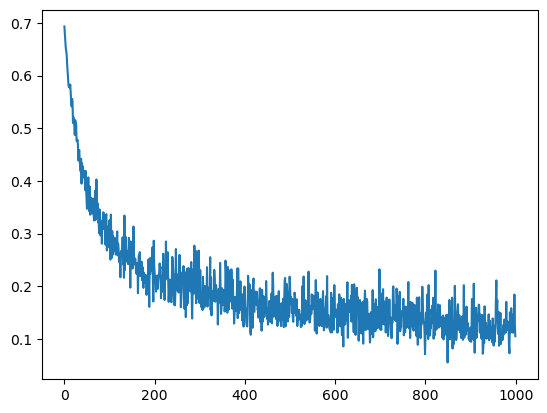

Activated Output [0.07951006 0.06459332 0.98673352 0.98573773 0.89830698 0.02566103
 0.02823223 0.032753   0.98306725 0.98068652 0.15691374 0.9466397
 0.0049668  0.99825852 0.99988916 0.97563548 0.00213011 0.03963348
 0.18980932 0.99909049 0.41089341 0.04369869 0.06207533 0.9780167
 0.00738735 0.99461288 0.49821779 0.03815182 0.99989391 0.14962824
 0.1020831  0.96347448 0.99812527 0.67592521 0.28750268 0.99662454
 0.65134132 0.99858389 0.98368354 0.99992215 0.0163368  0.01344121
 0.00150792 0.99767727 0.00383204 0.51206053 0.14248688 0.93361952
 0.28894289 0.83206142 0.93151705 0.80296917 0.91386515 0.04292901
 0.00663252 0.01217685 0.97347217 0.12467126 0.08775104 0.00464808
 0.99955489 0.46619915 0.99961563 0.90962529]
Max accuracy: 1.00000
Accuracy: 0.92188


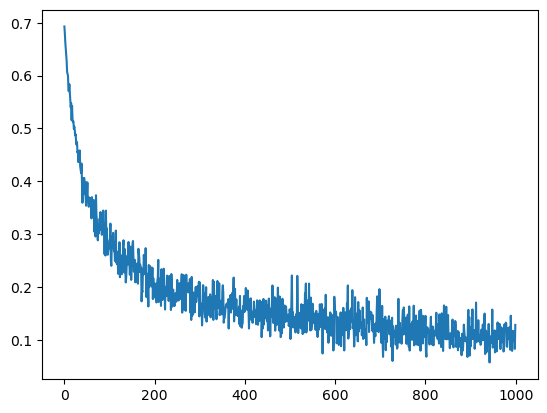

Activated Output [0.00389006 0.91665944 0.01696494 0.98295544 0.99997961 0.24244159
 0.0405282  0.99817089 0.97796538 0.07113859 0.12462511 0.08297717
 0.15003526 0.03457132 0.99381932 0.99999961 0.98436147 0.53020199
 0.07078261 0.01184577 0.20917493 0.00096911 0.51681198 0.0668242
 0.14324145 0.85029919 0.99751242 0.94065367 0.68043691 0.01524139
 0.0133705  0.99943507 0.00074181 0.98400265 0.00860028 0.01349484
 0.05559038 0.91297321 0.00479418 0.00465746 0.94441541 0.95938349
 0.01902583 0.97640835 0.02392293 0.99159569 0.30375276 0.00419866
 0.00152308 0.89024512 0.08144257 0.10341734 0.85919318 0.01841334
 0.00366915 0.08583991 0.04331533 0.00412144 0.88484167 0.09610698
 0.1891904  0.07170234 0.90436946 0.09157299]
Max accuracy: 1.00000
Accuracy: 0.93750


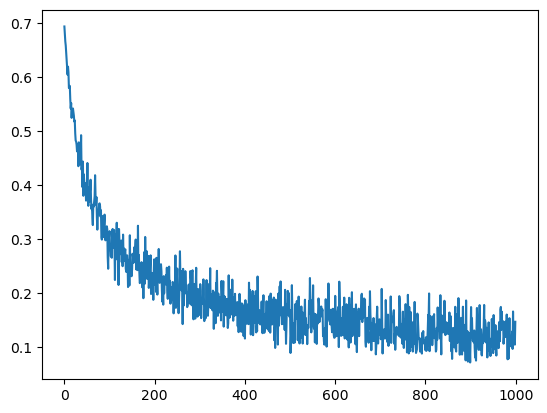

Activated Output [0.00524406 0.03659299 0.29047961 0.71527341 0.99807424 0.98069567
 0.00170489 0.40454421 0.97575727 0.0910971  0.55705618 0.07426987
 0.09790457 0.84857992 0.01087745 0.97541544 0.9888558  0.05776299
 0.99935539 0.99788224 0.00132917 0.98403155 0.99719008 0.03868768
 0.11859339 0.26197222 0.99988703 0.06554096 0.0053281  0.02011873
 0.04144085 0.19257598 0.01013497 0.98251991 0.85932044 0.01422046
 0.46656622 0.29149105 0.01545893 0.03615228 0.77005621 0.37185823
 0.90263017 0.97609505 0.08405038 0.99012046 0.90870462 0.99670666
 0.07771384 0.56980704 0.03667496 0.06527319 0.04931426 0.03331242
 0.47584983 0.00135568 0.0484353  0.04774559 0.99987913 0.18578567
 0.06419332 0.01907254 0.02456725 0.05240675]
Max accuracy: 1.00000
Accuracy: 0.95312


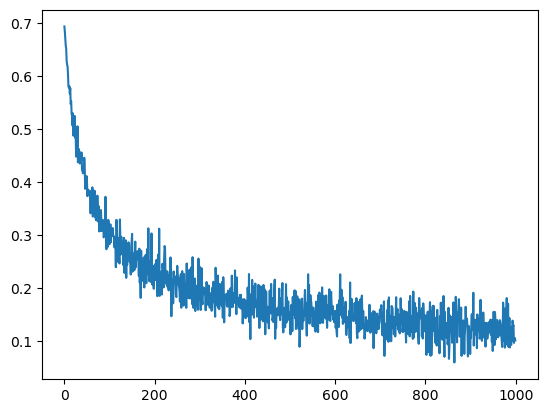

Activated Output [0.04167135 0.00386047 0.97382808 0.90298614 0.68205191 0.53974142
 0.00251871 0.55961386 0.00765136 0.10092211 0.02724755 0.22329143
 0.07736717 0.88742209 0.26102721 0.05993539 0.00657782 0.37344092
 0.03029649 0.9999147  0.00075197 0.00466119 0.98388908 0.98398075
 0.06148967 0.07362708 0.98004126 0.99109453 0.17461542 0.00085267
 0.99442186 0.03142241 0.08889801 0.02069038 0.78462934 0.12399799
 0.0830537  0.99873873 0.92154414 0.97809989 0.10115795 0.0527944
 0.32149903 0.99994613 0.99998298 0.07404489 0.99947039 0.00478398
 0.18638645 0.03206228 0.05045789 0.98711451 0.13159924 0.03183878
 0.0060001  0.12453589 0.12388514 0.00338203 0.99135929 0.02102757
 0.17525064 0.23914531 0.98986682 0.01037771]
Max accuracy: 1.00000
Accuracy: 0.90625


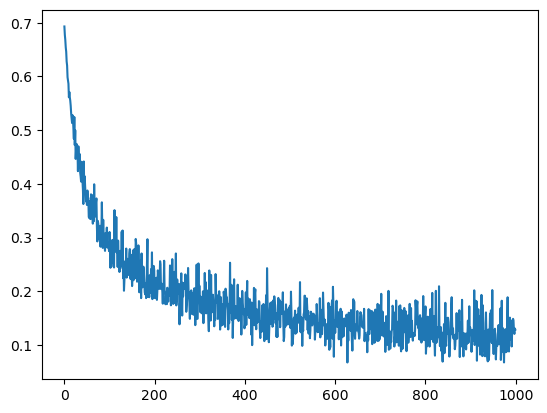

Activated Output [0.05205239 0.1384085  0.07624713 0.99775871 0.00464824 0.01113717
 0.29089254 0.08498445 0.03714136 0.99898817 0.2603726  0.32917704
 0.90144121 0.99962275 0.99998331 0.84693029 0.98389283 0.98969878
 0.90186543 0.04460075 0.02000069 0.13568646 0.015884   0.51974654
 0.02537971 0.97823297 0.23073898 0.00416192 0.18470361 0.98149067
 0.25327514 0.00123998 0.96505843 0.01414424 0.0262041  0.01987352
 0.06820283 0.9963736  0.99572074 0.86712357 0.00660629 0.48326987
 0.99575744 0.92673626 0.0528388  0.09147038 0.44067468 0.37095382
 0.98892842 0.01098543 0.00270905 0.9651027  0.99998118 0.98955007
 0.92048385 0.15160579 0.59962261 0.72949485 0.99989698 0.1261281
 0.99961307 0.07325791 0.04040108 0.00624314]
Max accuracy: 1.00000
Accuracy: 0.93750


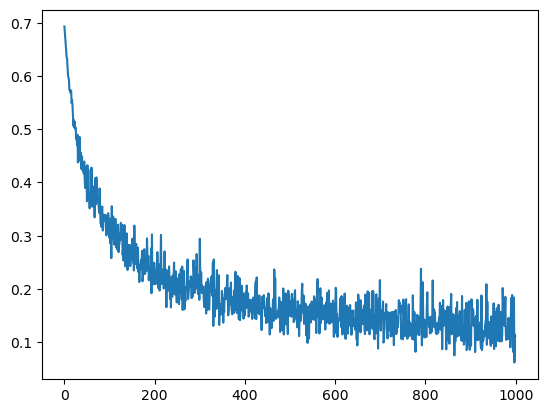

Activated Output [0.98406526 0.99147144 0.0296054  0.00335083 0.00105914 0.07796272
 0.04216948 0.12305393 0.02339797 0.14262638 0.04160367 0.00799755
 0.83563138 0.3369915  0.97786565 0.07353847 0.08216429 0.00778038
 0.06282173 0.01920385 0.99961345 0.79576018 0.9996568  0.02241677
 0.00546334 0.96252067 0.00234317 0.01940818 0.16977635 0.23848681
 0.1252676  0.99999218 0.03057833 0.98896595 1.         0.01527833
 0.09036193 0.97609573 0.03991004 0.93789453 0.19660884 0.01336709
 0.75133889 0.01855055 0.11823906 0.85965729 0.40537705 0.00525572
 0.99992145 0.98184378 0.97829169 0.19382458 0.97532389 0.53501798
 0.44825392 0.93445411 0.61222231 0.04015239 0.45616963 0.91572932
 0.24529952 0.08813007 0.03777467 0.99765679]
Max accuracy: 1.00000
Accuracy: 1.00000


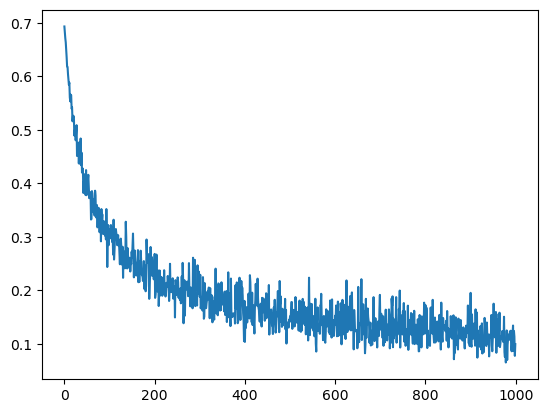

Activated Output [0.07667903 0.99087782 0.03179916 0.03707332 0.0357212  0.9974373
 0.04383612 0.0231789  0.02600861 0.82353417 0.0843421  0.00517784
 0.03064206 0.16669391 0.23242754 0.26257232 0.96297741 0.99999295
 0.00079706 0.99834352 0.99998582 0.88135179 0.98518758 0.54746441
 0.02665291 0.0138431  0.05342516 0.99992394 0.99930093 0.25221229
 0.32371276 0.65166642 0.94205865 0.06687901 0.08319413 0.01314356
 0.00452659 0.89007346 0.96050974 0.05683323 0.01041386 0.9184474
 0.06244629 0.05844708 0.29081004 0.07815956 0.03638449 0.12282617
 0.01068303 0.99996181 0.98329506 0.6459445  0.96557198 0.01202363
 0.01531776 0.96603138 0.1886494  0.98532644 0.00101808 0.00563413
 0.99973669 0.99957723 0.160881   0.03611049]
Max accuracy: 1.00000
Accuracy: 0.95312


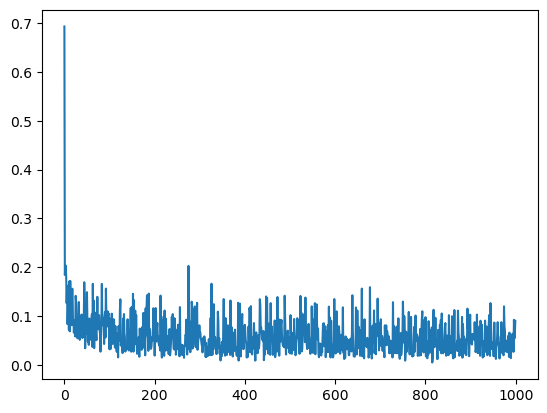

Activated Output [0.00000954 0.00960921 0.99319539 0.08205953 0.99972246 0.99988387
 0.0002658  0.00916332 0.0027101  0.01038981 0.99999969 0.00034341
 0.00000463 0.00031561 0.09858093 0.00332166 0.99999774 0.99999998
 0.00070925 0.9994841  0.97523787 0.97470284 1.         1.
 0.00002531 0.05631267 0.00004542 0.05933224 1.         0.00004694
 0.00001752 0.00040395 0.96282676 0.00030347 0.00002029 0.99948555
 0.01400351 0.00680723 0.99999994 0.30515305 1.         0.0000238
 0.00020713 0.00258423 1.         0.03931193 0.01616797 0.00000486
 0.99997711 0.0000638  0.00143879 1.         0.53350159 0.00000007
 0.99897391 0.00003995 0.00141433 0.01630043 0.0000102  0.54897207
 0.61372135 0.00008444 0.00248226 0.0006476 ]
Max accuracy: 1.00000
Accuracy: 1.00000


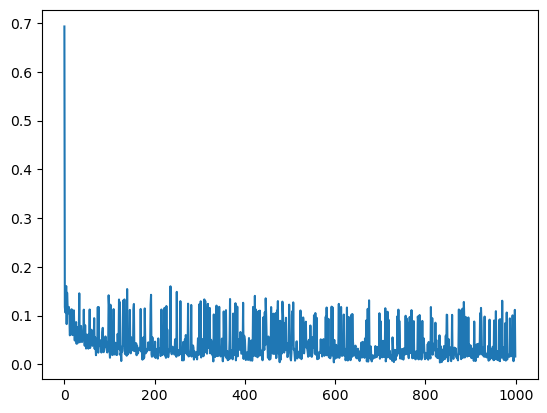

Activated Output [0.00002815 0.00002699 0.99999999 0.13678677 0.00023577 0.
 0.00000006 0.99999998 0.64615273 0.0131787  0.99999999 1.
 0.00008502 0.99949774 0.00578674 0.00008091 0.00002473 0.99999364
 0.00000001 1.         0.00001999 0.00031111 0.00510168 0.99821326
 0.00005702 0.00000859 1.         1.         0.00005963 0.00106145
 0.00008308 0.00000017 0.00001073 0.00001046 0.00003144 0.00007038
 0.0002495  0.93525753 0.00016439 0.0000004  0.00749871 0.99999999
 0.00025296 0.0010133  0.99999993 1.         0.00005671 0.07005645
 0.05282598 0.00000076 0.00000027 0.8454904  0.00002575 0.99999938
 0.99843826 0.00000026 0.99963338 0.95391448 1.         0.00018014
 0.99999496 0.00159363 0.00078799 0.00000332]
Max accuracy: 1.00000
Accuracy: 0.98438


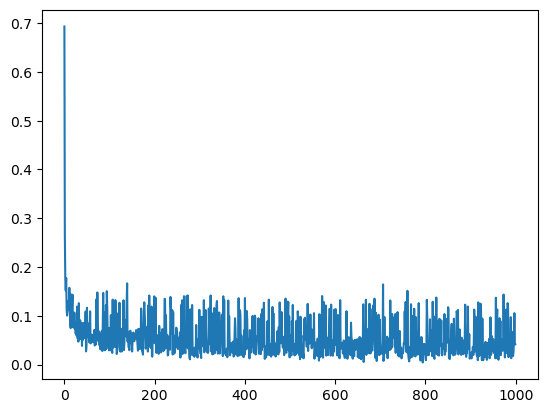

Activated Output [1.         0.9998315  0.00457931 0.00036956 0.09772936 0.99999999
 0.00000203 0.99922017 0.0000158  1.         0.00013209 0.99532582
 0.97272615 0.00318553 0.99999988 0.00243123 0.8735624  0.89139822
 0.00003519 0.00009873 0.77173565 0.00001431 0.00002185 0.01464246
 0.06978955 0.99999961 0.00107465 1.         0.13888248 0.99886653
 0.00087129 0.001373   0.00049597 0.00131802 0.00040937 1.
 0.99301043 0.99961769 0.99999611 0.99999962 0.00066312 0.00000178
 0.99998896 0.05449096 0.00013353 0.9885347  0.9597118  0.00073486
 0.99901871 0.0000387  0.00002561 0.00083675 1.         0.93693482
 0.03612871 0.00324637 0.99985969 0.00007693 0.00025031 0.00000001
 0.00000065 1.         0.21349903 0.00022843]
Max accuracy: 1.00000
Accuracy: 1.00000


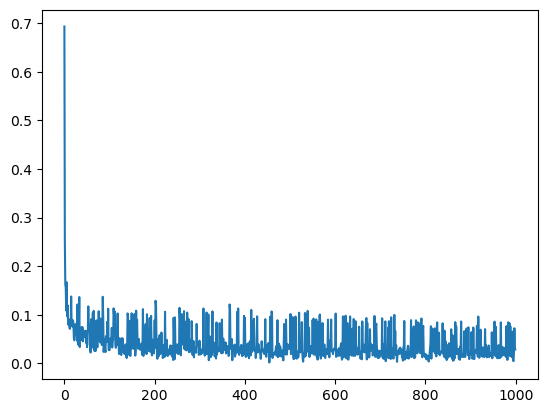

Activated Output [0.00002726 0.00013716 0.00000006 0.0074519  0.99403442 0.
 0.99999964 0.00071224 0.00000008 0.99999996 0.99999999 0.01738703
 1.         1.         0.99932724 0.00153157 0.96099823 0.00161512
 0.99999999 1.         0.00070493 0.00000003 0.00105596 0.82331459
 0.00001392 0.00000014 0.99983666 0.00018724 0.00000095 0.00002053
 0.0000006  0.3156777  0.95428709 0.00187838 1.         0.00053379
 1.         0.00075573 0.00004443 0.99995736 0.99999198 0.00000173
 0.83880628 0.99964343 0.24262158 0.9773556  0.00023038 0.99999999
 0.00000083 0.00628049 0.00000576 1.         0.99201487 0.00004066
 0.00019506 0.82922504 0.64792985 0.00000013 0.99999998 0.00333937
 0.99999996 0.99999801 0.00001854 0.00000084]
Max accuracy: 1.00000
Accuracy: 0.98438


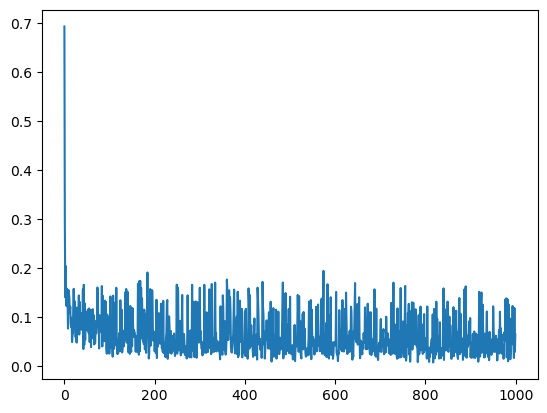

Activated Output [0.00000032 0.00045666 0.99999994 0.00468599 1.         0.08367348
 0.99771222 0.00011712 0.96719476 0.84248895 0.00032711 0.00004451
 0.9999943  0.00000102 0.00000787 0.99946167 0.00001159 0.99987068
 0.21162423 0.99999976 0.9999573  0.00018711 0.00000082 0.00154636
 0.07956314 0.99088672 0.03916933 0.99999973 0.99999911 0.61955915
 1.         0.00000299 0.99999552 0.00200448 0.9999145  0.10960086
 0.99999977 0.99991055 0.9987693  0.99999997 0.00880383 0.96214933
 0.99999986 0.00000684 0.00125347 1.         0.00083643 0.08613805
 0.04196172 0.23206067 0.00000679 0.00073907 0.0157518  0.0000042
 0.99972877 0.00003507 0.97712263 0.00002685 0.01769146 0.00035086
 0.99988731 0.00007438 0.00084176 1.        ]
Max accuracy: 1.00000
Accuracy: 1.00000


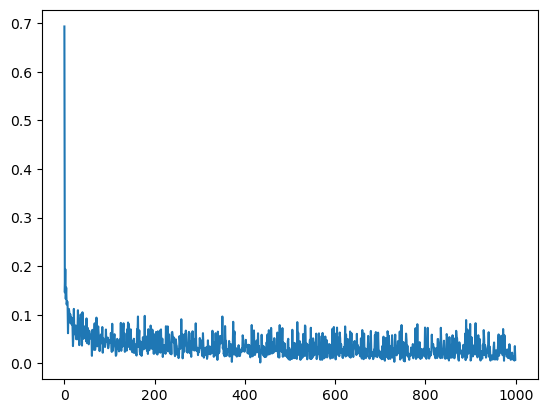

Activated Output [0.00000514 0.00000589 0.00001462 0.00002222 0.99999995 0.00000002
 0.00000247 0.00000007 0.99988756 0.00000331 0.0195635  0.00012204
 0.99999998 0.00000001 0.00256911 0.00000291 0.01902776 1.
 0.00000005 0.99299193 0.00000001 0.00023848 0.88379193 0.00020601
 0.00026503 0.99346947 0.00018368 1.         0.00000442 0.0000021
 0.00025106 0.94970998 0.00022423 0.00000045 0.0000002  0.14984903
 1.         0.00000737 1.         0.00001864 0.99999999 0.99999988
 0.01597605 0.00008684 0.00000062 1.         0.00000008 0.01244672
 0.         0.99743106 0.00000001 0.99926236 0.         1.
 0.00002075 0.00503615 1.         0.99999998 0.         0.99896926
 0.0001682  0.05295511 0.99988697 0.00987321]
Max accuracy: 1.00000
Accuracy: 0.96875


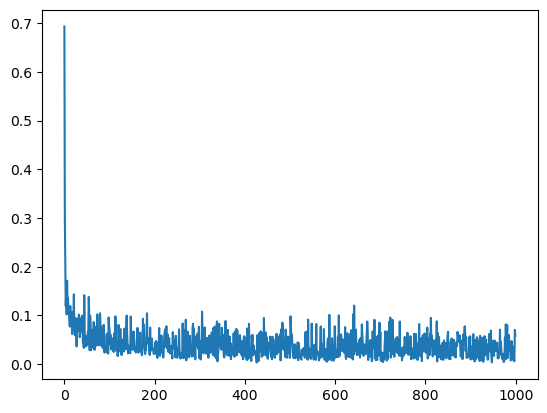

Activated Output [0.99999923 0.99938156 0.00000211 0.00004814 0.99894402 0.60156469
 0.00000059 0.22912999 0.00000016 0.01407331 0.00000154 0.00000026
 1.         1.         0.02289742 0.99992345 1.         0.00000062
 0.00000003 0.00425872 0.00000023 0.00000732 0.1855175  0.00000064
 0.00130206 0.0000559  0.00005415 0.00000619 0.0000247  0.00417105
 0.99994499 0.00026874 0.99967324 0.00013498 0.00000077 0.06077665
 0.00001884 0.13105015 1.         0.99999849 0.98723966 0.99879318
 0.00000014 0.00001173 0.00027517 0.00000044 0.00042053 0.00002488
 0.00013067 0.00019314 0.04872888 0.85248059 0.99999531 0.00000099
 0.0162934  0.00009105 0.00037815 1.         0.00006281 0.99999795
 0.00000698 0.00225938 0.99999538 1.        ]
Max accuracy: 1.00000
Accuracy: 1.00000


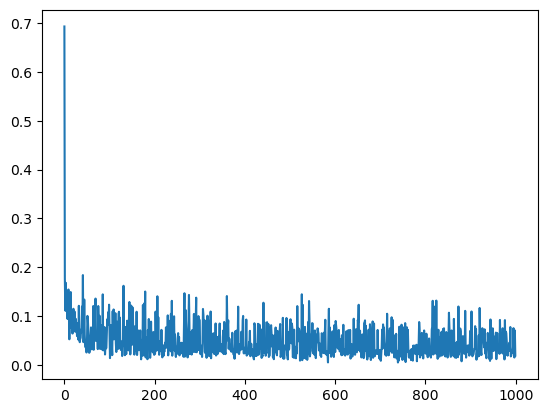

Activated Output [1.         0.00005213 0.20542327 0.96833013 0.0001794  0.00002743
 0.00013184 0.99999986 1.         0.24990849 0.99999999 0.00053091
 0.0000199  0.80876608 0.00072743 0.00124272 0.99991763 0.00000472
 1.         0.99814677 0.00002045 0.00746091 0.0002656  0.0015712
 0.00005104 0.00019922 0.0003203  0.94395299 0.00003464 0.00001073
 0.0002159  1.         0.08928813 0.00000954 0.9999778  0.0016767
 0.00019212 0.00001424 0.11386313 0.94421028 0.00927941 0.00010042
 0.99921995 0.9999999  0.00003752 0.99999862 0.99999088 0.0000038
 0.00000036 0.00414261 0.99900648 0.00603346 0.0058142  0.00790896
 0.00000129 0.9998896  0.00000983 0.00473469 0.00007237 0.0624388
 1.         0.00344393 0.9999999  0.        ]
Max accuracy: 1.00000
Accuracy: 0.98438


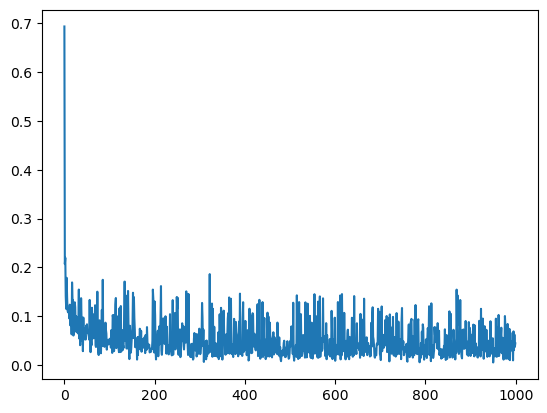

Activated Output [0.00000152 0.10970405 0.00615201 0.00024455 0.99999993 0.83914822
 0.01241021 0.99999517 0.00000674 0.99976206 1.         0.99997617
 0.86297001 0.91225123 0.00004813 0.02212056 0.0005343  0.00000607
 0.55951053 0.00028253 0.26600593 0.99999924 0.99999999 0.0000127
 0.00000045 1.         0.06100312 0.00012096 0.0011903  0.00086832
 0.00054164 0.01565285 0.00064745 0.0001846  0.00202956 0.99999972
 0.00003487 0.0002371  0.99999886 0.99999982 0.99999927 0.0000017
 0.00072305 0.99809024 0.00073319 0.09761602 0.99990757 0.98931054
 0.00006831 0.99944064 0.84577148 1.         1.         0.00000769
 0.00238536 0.00013208 0.00122368 1.         0.00208195 0.99999998
 0.0004312  1.         0.99999989 0.00984936]
Max accuracy: 1.00000
Accuracy: 1.00000


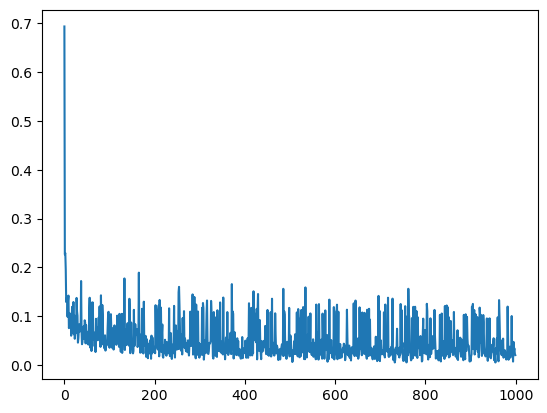

Activated Output [0.00003384 0.00004405 0.00003043 0.00028717 0.66014319 0.0076413
 0.00003046 0.00293107 0.00012203 0.99938659 0.99999991 0.0000011
 0.00032894 0.00203768 1.         1.         0.00000065 0.00004703
 0.00018175 1.         0.99995716 0.94765453 0.00001036 0.00000513
 0.00001696 0.99991948 0.00059593 0.99999964 0.00001197 0.99999998
 0.01246461 0.23282825 0.00046254 0.99999999 0.99887497 0.21050371
 0.99558433 0.00000006 0.00210488 0.00011147 0.99999656 0.00026345
 0.00007272 0.00000011 0.99999984 1.         0.99998759 0.00000017
 0.96914137 0.98746541 1.         0.04976048 0.9998715  1.
 1.         0.99997883 0.08005101 0.00001882 0.12906855 0.00000001
 0.99999978 0.00002593 0.00091066 0.00000142]
Max accuracy: 1.00000
Accuracy: 0.98438


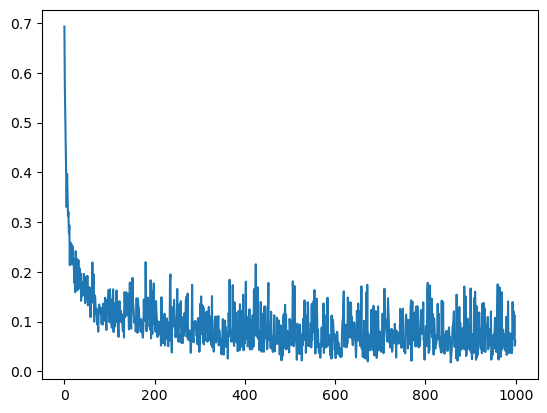

Activated Output [0.99136432 0.00135292 0.9999726  0.00194616 0.08403403 0.72732218
 0.00004714 0.00000232 1.         0.00031224 0.01076439 0.99874866
 1.         0.00163284 0.03529963 0.00041663 0.00442311 0.00500454
 0.97270512 0.00011323 0.00343255 0.00254536 0.03920936 0.99978817
 0.98900466 0.00003547 0.69257539 0.00009759 0.01016932 0.00127744
 0.01406515 0.99999995 0.99754005 0.00088609 0.00016964 0.99685374
 0.00007945 0.00041849 0.35139377 0.00092419 0.00386749 0.99998171
 0.99927734 0.99700413 0.40233278 0.0002673  0.00012208 0.00116641
 1.         0.00006039 0.99936459 0.19851973 0.13856309 0.27989923
 0.99987862 0.22100944 0.13317217 0.99999879 0.00005098 0.02012173
 0.28286011 0.91463058 0.62922809 0.99999943]
Max accuracy: 1.00000
Accuracy: 1.00000


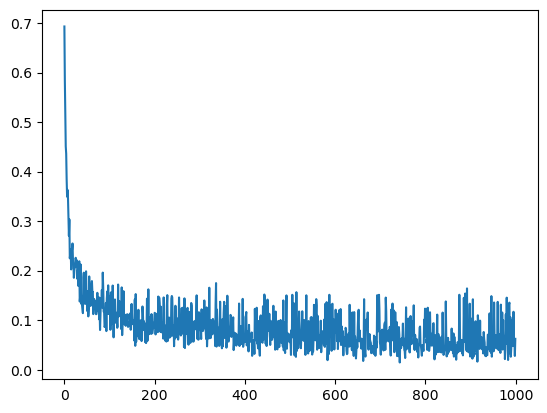

Activated Output [0.99998363 0.00094621 0.58048549 0.99999085 0.00060679 0.00062932
 0.00006548 0.00060988 0.00564085 0.99999927 0.96337599 0.00273961
 0.78211616 0.01308508 0.30112969 0.01458293 0.00640084 0.00147006
 1.         0.00026305 0.2771722  0.81891625 0.00025834 0.00004138
 0.74423007 0.00000395 0.00311178 0.88911114 0.00027435 0.00273556
 0.78806204 0.04294498 0.99814838 0.00000137 0.03897116 0.99991829
 0.00120517 0.00069923 0.55745503 0.00241277 0.9654525  0.00088318
 0.00006094 0.01600302 0.99965835 0.001301   0.00110866 0.00134229
 0.10944583 0.09281999 0.99992161 0.17788311 0.99289141 0.0022176
 0.00136205 0.00056764 0.00532747 0.99999982 0.99396178 0.09787275
 0.00132207 0.17243601 0.11206924 0.00012037]
Max accuracy: 1.00000
Accuracy: 0.98438


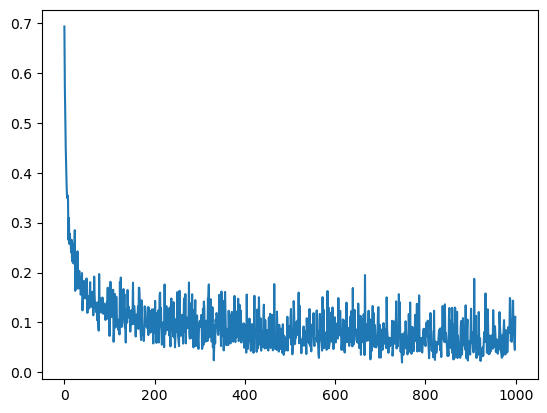

Activated Output [0.99999999 0.00684711 0.00108062 0.03694649 0.25091416 0.19328654
 0.00001193 0.99996096 0.97125858 0.0008509  0.0123806  0.93623457
 0.99974253 0.03203899 0.65320627 0.78298621 0.99754008 0.9779144
 1.         0.99989724 0.01228909 0.00169372 0.99063848 0.99884037
 0.0132929  0.00000548 0.00322799 0.01115444 0.99668059 0.83455016
 0.0001307  0.15509996 0.99994467 0.00207996 0.98429867 0.0011621
 0.00029475 1.         0.00030077 0.00082347 0.86782589 0.15045588
 0.99999844 0.15626755 0.9995048  0.7527126  0.00036254 0.99349804
 0.99574976 0.99999992 0.0001964  0.99777628 0.99516383 0.00078822
 0.00635644 0.02029121 0.00084506 0.00842252 0.99999142 0.99974049
 0.00018115 0.01636764 0.08842408 0.00003825]
Max accuracy: 1.00000
Accuracy: 0.98438


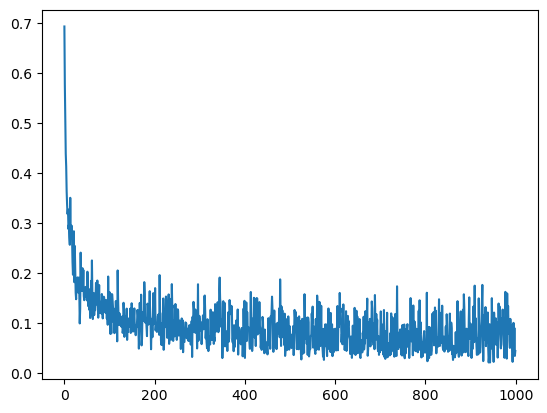

Activated Output [0.84613287 0.99990357 0.09581765 0.00005252 0.12472869 0.99999141
 0.028171   0.00784019 0.99932272 0.99993637 0.0006068  0.99999973
 0.00000765 0.89654894 0.99853573 0.04989668 0.04459682 0.00054981
 0.00048595 0.99381548 0.99982533 0.99995439 0.00011777 0.99999266
 0.99958519 0.99982022 1.         0.00678875 0.00695484 0.04563821
 0.9999806  0.99998476 0.99961709 0.00468431 0.00076173 0.81495902
 0.00002939 0.999993   0.99988049 0.97286917 0.00007201 0.02146215
 0.05090229 0.00037206 0.95250723 0.00276028 0.99775004 0.00003927
 0.00025208 0.00000462 0.12112111 0.99999672 0.0007992  0.03061101
 0.00407189 0.99154984 0.01291184 0.50845403 0.04311544 0.99325291
 0.00086776 0.18781373 0.0935227  0.40724959]
Max accuracy: 1.00000
Accuracy: 0.98438


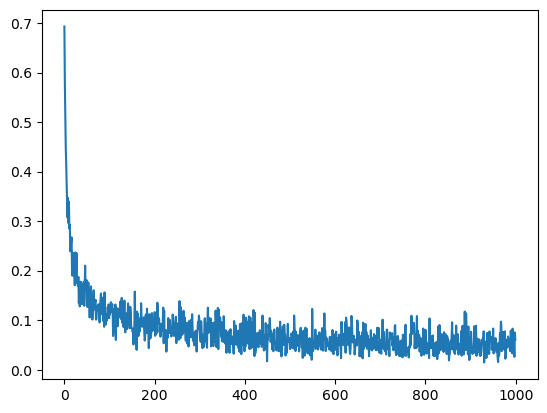

Activated Output [0.00041619 0.04264733 0.00200331 0.19910945 0.00393726 0.00482751
 0.00153011 0.99771242 0.00196779 0.0054492  0.000522   0.00002092
 0.15527164 0.9925376  0.99996685 0.03475048 0.00191282 0.03851424
 0.99990429 0.00465504 0.16088201 0.95589523 0.00241161 0.00129197
 0.99999967 0.01118385 0.99520214 0.00904983 0.0251     0.00057794
 0.00491433 0.00080309 0.00015479 0.99991899 0.99998319 0.00307689
 0.15925119 0.54459422 0.00705582 0.99977218 0.81786608 0.98896532
 0.0000111  0.0058701  0.00097052 0.00032306 0.08057906 0.00052106
 0.9999894  0.00680344 0.00001887 0.00003631 0.00743224 0.99999983
 0.99931513 0.99995476 0.17538239 0.00022922 0.98884107 0.99968346
 0.04124185 0.00014235 0.02488881 0.99893563]
Max accuracy: 1.00000
Accuracy: 0.98438


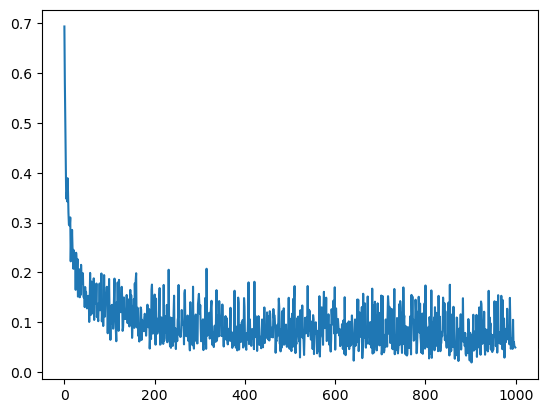

Activated Output [0.00334133 0.01968879 0.02784856 0.99905327 0.99999998 0.00036273
 0.95024519 0.99998601 0.02291937 0.00187117 0.99981539 0.70600266
 0.03732811 0.00054725 0.99830799 0.29421331 0.99999348 0.10520363
 0.00520584 0.00008824 0.9999422  0.9999922  0.00127864 0.06555009
 0.99998706 0.00104921 0.00214275 0.99946524 0.0005398  0.00411407
 0.99975474 0.93333642 0.9999023  0.81058239 0.89464943 0.26833165
 0.0001156  0.00210366 0.9999688  0.00013342 0.19768026 0.9999476
 0.99958617 0.01723745 0.12750486 0.0081037  0.00006159 0.95788105
 0.00591285 0.04175059 0.99987625 0.00170128 0.4197555  0.15990443
 0.99999996 0.1358511  0.00188239 0.00146771 0.96040589 0.00000335
 0.00377221 0.99997536 0.01695672 0.00007008]
Max accuracy: 1.00000
Accuracy: 0.98438


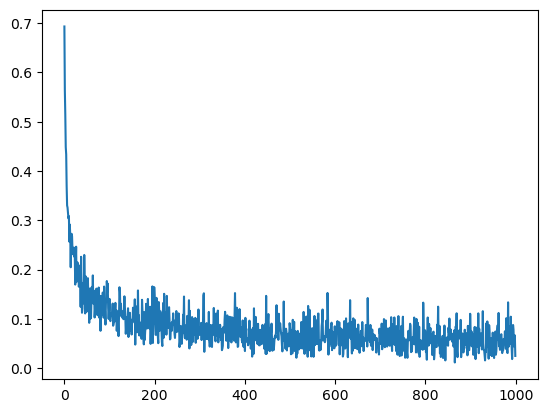

Activated Output [0.99856873 0.00102244 0.02376442 0.03000037 0.00293733 0.99999494
 0.99999999 0.1194572  0.00060094 0.00954925 0.99999984 0.00002083
 0.98128017 0.00128532 0.0007422  0.00656711 0.06988217 0.9988751
 0.00015202 0.0004065  0.00003147 0.00047566 0.02073099 0.0005705
 0.99582903 0.00025772 0.00082839 0.00000254 0.00841955 0.01962468
 0.99998976 0.00185816 0.81339671 0.00178716 0.00006628 0.99719635
 0.00236155 0.00035052 0.90795573 0.99999985 0.99897457 0.00190404
 0.99999984 0.92416198 0.00252244 0.99999978 0.99980717 0.9998563
 0.01012261 0.00144893 0.9423873  0.00805566 0.00028988 0.0000352
 0.99999827 0.94130998 0.00304306 0.00007511 0.01202322 0.99991665
 0.46142922 0.00112599 0.99999134 0.94239217]
Max accuracy: 1.00000
Accuracy: 1.00000


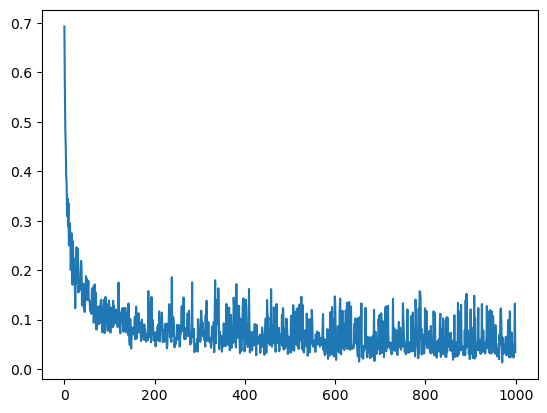

Activated Output [0.0165158  0.85706093 0.03788724 0.00032207 0.0011922  0.02418117
 0.00005379 0.01073202 0.00023762 0.00075603 0.00518777 0.05667535
 0.02017331 0.99999983 0.99978788 0.97694964 0.00003882 0.00072618
 0.36307126 0.99999905 0.99999914 0.00007086 0.01165583 0.0000457
 0.84019799 0.99999705 0.0102725  0.99984678 0.95648957 0.18435569
 0.99955394 0.00240703 0.94797947 0.00004587 0.80376143 0.99999532
 0.00046716 0.00029404 0.00177126 0.99916297 0.99764464 0.00590626
 0.97778996 0.00003269 0.9984279  0.00163063 0.02567964 0.92247468
 0.00121509 0.00005676 0.00005789 0.00451379 0.06086332 0.99993713
 0.00020155 0.02748913 0.01243293 0.99585127 0.6868722  0.01529763
 0.00000048 0.00030647 0.99999954 0.0125786 ]
Max accuracy: 1.00000
Accuracy: 0.98438


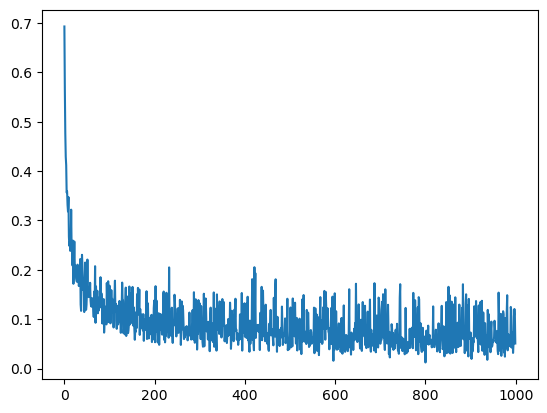

Activated Output [0.99999992 0.00028747 0.99994113 0.80095795 0.99998932 0.01277414
 0.99975493 0.00434241 0.00000368 0.00186608 0.00002698 0.99996164
 0.00127864 0.0027947  0.88076278 0.99999999 0.00211567 0.99999105
 0.0011354  0.98541247 0.99639647 0.00277027 0.4342606  0.99999998
 0.06485875 0.99999898 0.00090498 0.99052883 0.59121281 0.29518198
 0.00336593 0.01011392 0.00108303 0.99999492 0.99692576 0.00016594
 0.0209248  0.00090717 0.99973862 0.981359   0.01328929 0.99999988
 0.00094431 0.00123479 0.00030795 0.69699449 0.99904815 0.00338354
 0.85299762 0.99999968 0.02570811 0.02743256 0.99036285 0.03699933
 0.19735594 0.00027582 0.01863717 0.00555816 0.99973736 0.91527574
 0.00277973 0.0004169  0.2515103  0.9988466 ]
Max accuracy: 1.00000
Accuracy: 1.00000


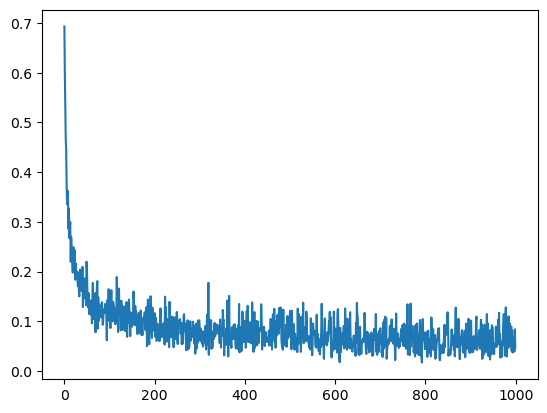

Activated Output [0.74776101 0.11777084 0.00045227 0.06325184 0.00001269 0.01869425
 0.00280564 0.00209356 0.68224022 0.01561487 0.00005126 0.99998725
 0.00029765 0.01126059 0.00256621 0.00006582 0.99110534 0.99999838
 0.01070857 0.0005672  0.01845645 0.97774046 0.01074532 0.20247549
 0.01975107 0.00018616 0.97874719 0.99959491 0.21276459 0.99999525
 0.00135249 0.99900025 0.00021547 0.95174051 0.00006046 0.00129328
 0.56825873 0.2751107  0.00222842 0.00137522 0.99991773 0.05902362
 0.99999981 0.00131145 0.99973027 0.00000161 0.00000021 0.01135471
 0.99469209 0.00882778 0.000236   0.00669417 0.99992701 0.02056514
 0.00151558 0.99910947 0.99999967 0.01328658 0.0008926  0.00123176
 0.9913409  0.29860837 0.99459972 0.06731728]
Max accuracy: 1.00000
Accuracy: 0.92188


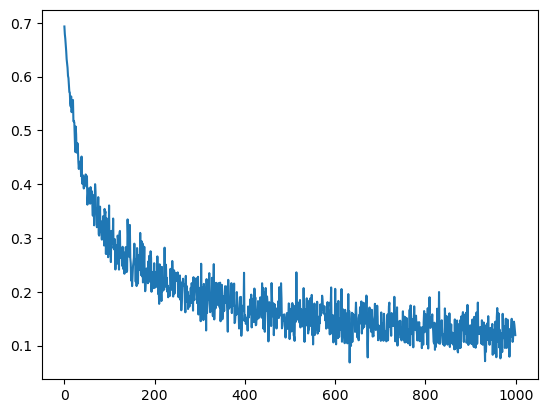

Activated Output [0.02631685 0.30424873 0.04704121 0.98498268 0.02465021 0.04319026
 0.02224586 0.68855789 0.0029804  0.16870161 0.99867063 0.06697286
 0.00076929 0.02952573 0.03269068 0.9190916  0.95866742 0.47540616
 0.33360926 0.03972989 0.04375025 0.99991013 0.90611154 0.02228082
 0.93669115 0.00633198 0.01679303 0.04557284 0.02295825 0.74451043
 0.05607034 0.05106717 0.436757   0.76871633 0.03075136 0.00586934
 0.04117017 0.00866019 0.0026786  0.98509128 0.07689719 0.01873189
 0.04924705 0.99998161 0.90411728 0.99873909 0.00068299 0.01066749
 0.01187285 0.42004543 0.01405351 0.00086451 0.17986651 0.32239834
 0.62803871 0.91364156 0.97528612 0.15669935 0.10993853 0.09150029
 0.01128955 0.00399542 0.44208735 0.990379  ]
Max accuracy: 1.00000
Accuracy: 0.92188


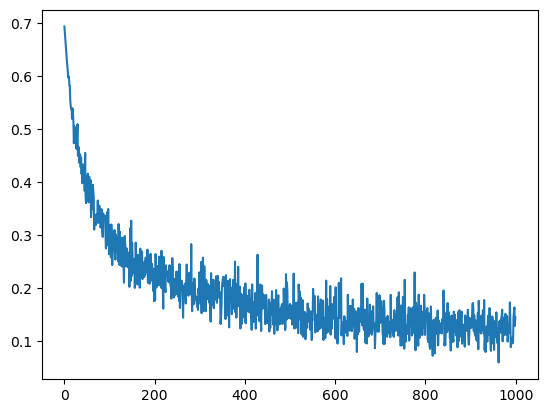

Activated Output [0.99515989 0.01105498 0.0016903  0.19095727 0.99277285 0.00920092
 0.99850792 0.98663628 0.91455824 0.00232878 0.03761648 0.13311619
 0.17875515 0.99619815 0.99993899 0.79796148 0.99972228 0.00503223
 0.00251724 0.42900286 0.98266142 0.01452052 0.49346284 0.94687439
 0.02904993 0.03682323 0.05241603 0.60769151 0.0411418  0.22744607
 0.00640099 0.00445232 0.95265707 0.98192182 0.19751806 0.0297342
 0.17613228 0.98529835 0.99996182 0.9996538  0.00789391 0.03237987
 0.99939039 0.08524616 0.05841438 0.52173607 0.98956324 0.01489859
 0.99048548 0.65924335 0.50902791 0.00590998 0.00096609 0.6366347
 0.90826525 0.97523681 0.97345205 0.00612955 0.99989491 0.1045599
 0.07294079 0.15109659 0.05794862 0.02776022]
Max accuracy: 1.00000
Accuracy: 1.00000


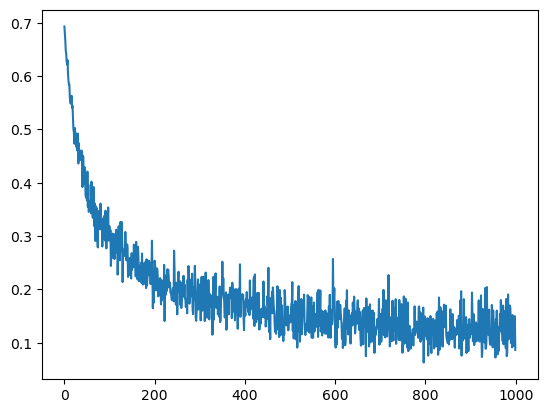

Activated Output [0.029162   0.00352437 0.025353   0.59603401 0.97763383 0.02149951
 0.06375991 0.22170348 0.01476242 0.99192609 0.00695419 0.25866735
 0.0089992  0.99997001 0.22150933 0.06637409 0.99006514 0.01590016
 0.09834289 0.07734397 0.04579949 0.02206168 0.08247769 0.10022536
 0.09886795 0.91851095 0.11463948 0.01945336 0.08904062 0.59197789
 0.14858931 0.00453625 0.20392854 0.99998342 0.88596312 0.01487652
 0.03676179 0.12234487 0.06380103 0.66880253 0.00456405 0.10339391
 0.99871763 0.03874655 0.02235502 0.99638079 0.00538927 0.06261117
 0.99972655 0.9939543  0.04390357 0.999991   0.57567521 0.11640978
 0.04676309 0.9986736  0.91500031 0.99759563 0.14002772 0.0150675
 0.03721782 0.98291253 0.00746769 0.97769401]
Max accuracy: 1.00000
Accuracy: 0.96875


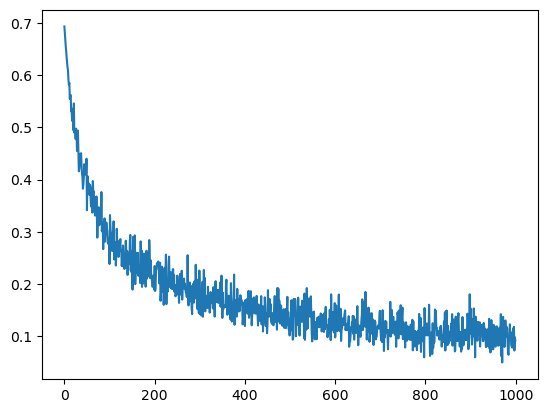

Activated Output [0.99901416 0.23929522 0.02236013 0.00494059 0.00254228 0.00681895
 0.41518921 0.99726176 0.31365646 0.00716625 0.01084538 0.99999259
 0.18124195 0.77467905 0.98651564 0.01829876 0.03072826 0.25079572
 0.82334331 0.0212064  0.93898446 0.03210552 0.03079042 0.85535384
 0.00638775 0.02997636 0.36020298 0.14985575 0.92265952 0.00079002
 0.01078044 0.13789753 0.99997799 0.69577492 0.89591468 0.01736644
 0.01188864 0.99998792 0.92801709 0.03220479 0.00526607 0.9948901
 0.98867449 0.00547228 0.75964362 0.44214488 0.99893339 0.04035686
 0.98722457 0.97239239 0.28444291 0.99702559 0.00470997 0.99715445
 0.0888019  0.97510638 0.97383015 0.0172656  0.00446083 0.0663896
 0.16101943 0.0166014  0.99091746 0.90966368]
Max accuracy: 1.00000
Accuracy: 0.98438


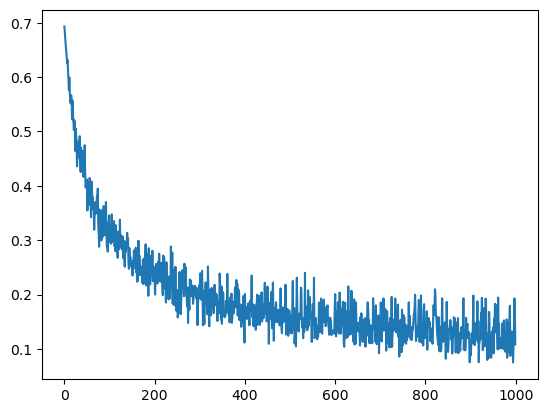

Activated Output [0.02424426 0.04444815 0.06685401 0.05517367 0.99068903 0.99951962
 0.02590432 0.99987341 0.59746203 0.99635151 0.03385824 0.01029164
 0.99861488 0.31888103 0.34335264 0.46508719 0.05290494 0.10028271
 0.00341105 0.13722253 0.99961532 0.99999869 0.09705218 0.99996741
 0.59736022 0.33981152 0.3581081  0.00490617 0.02334297 0.7765526
 0.06524732 0.99926299 0.99935973 0.99962161 0.08456996 0.03698836
 0.01520685 0.00673211 0.44075748 0.97173413 0.02108324 0.09240442
 0.99875854 0.99999895 0.01446503 0.99991364 0.12198292 0.01140766
 0.98042341 0.1316605  0.65607855 0.03251923 0.95566234 0.80424169
 0.08123957 0.01380104 0.08398003 0.00242313 0.00562342 0.01813989
 0.02739291 0.12182908 0.99178572 0.04377293]
Max accuracy: 1.00000
Accuracy: 0.96875


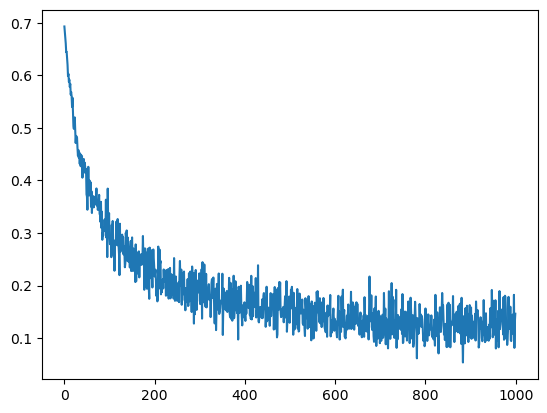

Activated Output [0.01480858 0.46404523 0.99870983 0.99985214 0.05522329 0.98849004
 0.35400769 0.02551851 0.28755587 0.07561554 0.99991915 0.58078924
 0.04562096 0.93188695 0.99581695 0.06975628 0.1171324  0.17432119
 0.03812596 0.01591831 0.13314287 0.00161705 0.60390254 0.97993694
 0.02046426 0.12219847 0.97228501 0.24230914 0.95320741 0.13996172
 0.0173078  0.03019157 0.97832614 0.02376167 0.98374806 0.9834237
 0.45654424 0.69405011 0.99942239 0.02871623 0.04798454 0.01600501
 0.0040934  0.00628404 0.04430983 0.01189683 0.00525553 0.07910696
 0.00089987 0.99846553 0.07080987 0.99863473 0.99984803 0.00228301
 0.91990311 0.19791946 0.97626373 0.08857263 0.12324518 0.14659563
 0.99764006 0.13762025 0.05822285 0.00916484]
Max accuracy: 1.00000
Accuracy: 0.96875


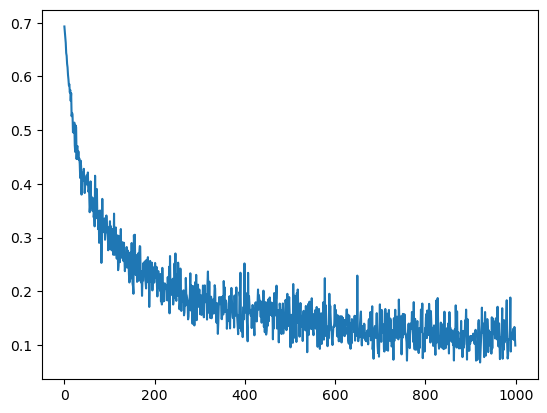

Activated Output [0.01024745 0.41930761 0.96398675 0.50162799 0.56939936 0.98605784
 0.08462119 0.93804838 0.02845112 0.99765507 0.02052098 0.04436965
 0.17026419 0.06031667 0.14757283 0.10000671 0.00125078 0.03132316
 0.01945153 0.02815902 0.00975778 0.02288169 0.07544695 0.04555762
 0.02414099 0.03055091 0.87360881 0.05442974 0.15198851 0.00350222
 0.65971393 0.00838536 0.97346911 0.78286208 0.90943621 0.07497705
 0.98446837 0.30685071 0.13004121 0.99999256 0.03231808 0.95066898
 0.99040725 0.97986629 0.05755558 0.99209774 0.98562911 0.02533139
 0.00711986 0.0053803  0.99951816 0.99999814 0.03665792 0.4162755
 0.03314863 1.         0.08294149 0.0062335  0.00622622 0.9997993
 0.93795286 0.76194863 0.03498545 0.01637268]
Max accuracy: 1.00000
Accuracy: 0.96875


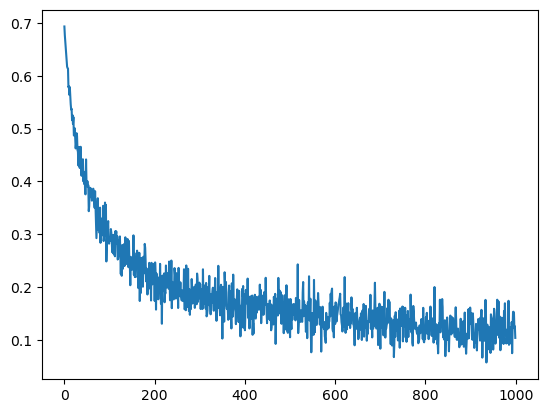

Activated Output [0.99999828 0.02294559 0.03472269 0.01481823 0.01082713 0.09365717
 0.99652966 0.99748606 0.5388454  0.08241628 0.99859972 0.11058342
 0.99675216 0.01542307 0.25835449 0.34299325 0.0800728  0.99999329
 0.03082549 0.99999714 0.98899354 0.98851064 0.01370389 0.18582747
 0.89106039 0.9959254  0.62375371 0.66286378 0.01028819 0.02863083
 0.99594351 0.00515815 0.90428859 0.05124075 0.0142505  0.99690794
 0.08219909 0.03779445 0.08430328 0.99842836 0.25765467 0.0881698
 0.46837915 0.06099508 0.8867015  0.110149   0.00301159 0.93750494
 0.0584735  0.00516333 0.96491338 0.06009398 0.99932735 0.04005984
 0.99996484 0.04564907 0.31774614 0.13236952 0.18499043 0.00990196
 0.00355034 0.01809049 0.00879883 0.98298069]
Max accuracy: 1.00000
Accuracy: 0.98438


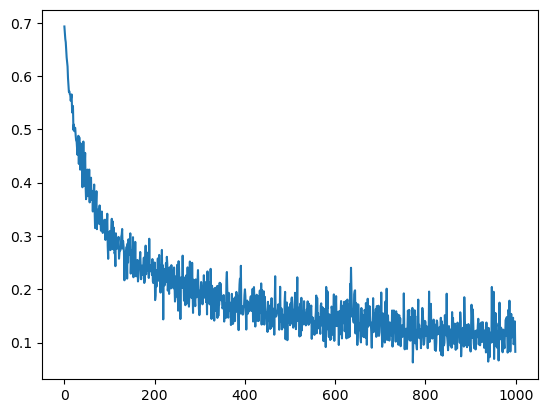

Activated Output [0.00979166 0.02423175 0.20113184 0.99744528 0.00378699 0.04163577
 0.10640853 0.99999362 0.26403841 0.04546947 0.47478315 0.18799659
 0.0043573  0.99992929 0.07875802 0.04007293 0.39009465 0.97716209
 0.01172697 0.00913271 0.06043177 0.05694295 0.37239857 0.01561645
 0.99973124 0.94767617 0.11982748 0.00579475 0.03621043 0.01698371
 0.01546129 0.99505002 0.03974064 0.11948039 0.03865652 0.14850304
 0.17690861 0.99820738 0.03677604 0.00134254 0.02562713 0.98077933
 0.00383573 0.02456122 0.7247976  0.99843644 0.02357296 0.05729228
 0.89097482 0.10122656 0.01210664 0.03646102 0.08091205 0.98403208
 0.0291682  0.06424643 0.00786635 0.0475709  0.03191772 0.09539676
 0.25323415 0.04369366 0.04374254 0.00407719]
Max accuracy: 1.00000
Accuracy: 0.93750


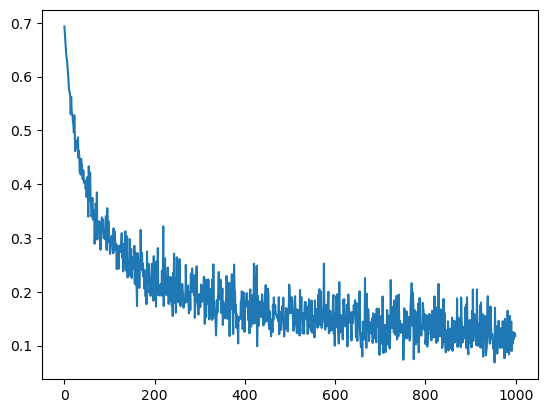

Activated Output [0.97877797 0.54066757 0.99301085 0.02537345 0.06640774 0.04320246
 0.05832867 0.01763576 0.09464915 0.05835767 0.03807719 0.43207532
 0.02162912 0.03257659 0.99948242 0.02182848 0.036942   0.97985447
 0.0058689  0.99597248 0.01164698 0.01385556 0.05962773 0.03695277
 0.04144466 0.99964785 0.01413748 0.16047295 0.15074618 0.00416262
 0.06094891 0.01309751 0.14163661 0.16078818 0.01121026 0.00580571
 0.68033756 0.999912   0.00558891 0.97357398 0.91399055 0.03343832
 0.99998919 0.02464005 0.44588605 0.22351638 0.26010324 0.4403578
 0.06868621 0.01095855 0.0024386  0.1353801  0.9997773  0.85119395
 0.09830989 0.11910486 0.11826116 0.00411476 0.99979258 0.01010362
 0.00138732 0.06804338 0.0046677  0.05707934]
Max accuracy: 1.00000
Accuracy: 0.96875


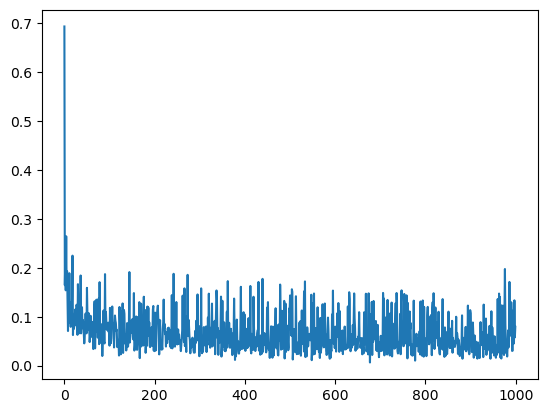

Activated Output [1.         0.00001065 0.00098083 0.00006602 0.60665498 0.0000035
 0.01252424 1.         0.00000082 0.00002058 0.99931842 0.00563225
 0.99945573 0.00063993 0.99917601 0.99994065 0.21592651 0.00001106
 0.00143026 0.00039192 0.00000215 1.         0.15298411 0.74105288
 0.00000339 0.00247208 0.96198502 1.         0.02455793 0.46085541
 0.00904614 0.00007628 0.00036314 0.00535145 0.25214374 0.99999998
 0.00000078 0.00098368 0.00009602 0.00000159 0.999944   0.99271443
 0.00002577 0.99829371 0.00000552 1.         0.99999735 0.00142331
 0.00000001 0.34379239 0.99999999 0.99999963 0.00186221 0.99965044
 0.00000026 0.00001695 0.99998724 0.0004526  0.00013543 0.99842445
 0.00000367 0.99999862 0.04091785 0.00272776]
Max accuracy: 1.00000
Accuracy: 1.00000


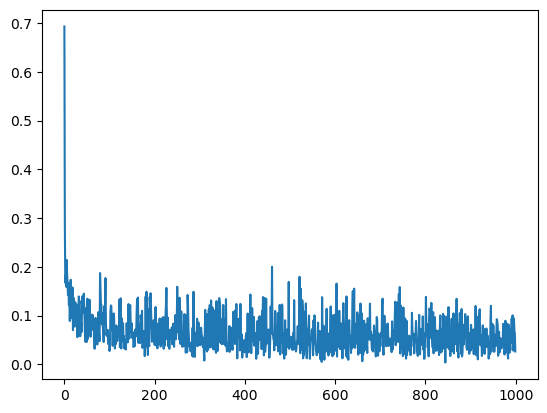

Activated Output [0.99999265 1.         0.99999583 0.00672025 0.99998796 1.
 0.99724701 0.00181121 1.         0.99999999 0.99999993 0.01651939
 0.99999753 0.04878864 0.00000112 0.00000383 0.00015211 0.99913131
 0.00023444 0.37306179 0.12018048 0.00438942 0.00000109 0.0003374
 0.11625342 0.00001197 0.99998146 0.00000344 0.99997902 0.02865931
 0.01353729 0.99995398 0.00000625 0.00591207 0.0033824  0.00008613
 0.00005412 0.99999994 1.         0.00000867 0.00356087 0.00000004
 0.00009303 1.         0.00004056 0.99999756 0.00028414 0.00536187
 0.00190155 1.         0.00000908 0.20983788 0.99999993 1.
 0.87186941 0.00136002 0.36428583 0.99998397 0.99981784 0.00000006
 0.00000035 0.0000187  0.00031554 0.00716351]
Max accuracy: 1.00000
Accuracy: 1.00000


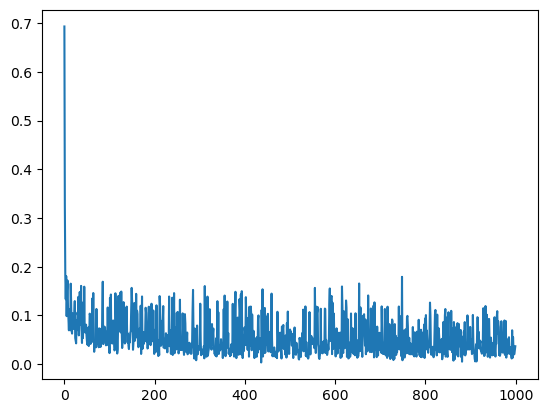

Activated Output [0.04148343 0.00000228 1.         0.99999998 0.99999805 0.99962571
 0.08877796 0.30213244 0.99999908 0.00360235 1.         0.00187644
 0.00692639 0.         0.01321118 0.0004714  0.02222327 0.00001323
 0.00032578 0.00019917 0.00302635 0.00008519 0.36942647 0.0005475
 0.99990908 0.00000037 0.00000657 0.00001034 0.16651339 0.00000938
 0.04598018 0.85145223 0.99999997 0.99977019 0.92323793 0.99999999
 0.00001843 0.0000004  0.00000322 0.00644335 0.98652926 0.00126432
 0.99953618 0.0000012  0.00861646 0.73512182 0.00001007 0.01989672
 0.99999999 0.99992311 0.00041669 0.29681341 0.00003367 0.00809035
 1.         1.         0.00822791 0.00320381 0.00011749 0.99944919
 0.99220201 0.99999916 0.00531948 0.12048746]
Max accuracy: 1.00000
Accuracy: 0.98438


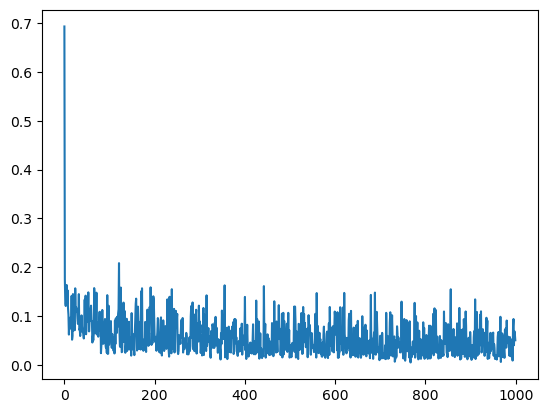

Activated Output [0.99999999 0.00069011 0.00001099 0.99999999 0.08989577 0.82829495
 0.92091748 0.00009494 0.00004302 0.99999989 0.00000893 0.00094153
 1.         0.0312704  0.99486478 1.         0.00216082 1.
 0.00000394 0.99999878 0.00000145 0.00282516 0.00037622 1.
 0.99931141 0.00093589 0.00009798 0.0005137  0.98756069 0.00024027
 0.01478419 0.00587102 0.00655585 1.         0.99744846 0.99999828
 0.00031091 0.15156745 1.         0.06051679 0.10974109 1.
 0.00044935 1.         0.0326234  0.9912487  1.         0.00068896
 0.01366315 0.88782578 0.00217563 0.07994668 0.99588349 0.99998745
 0.02053192 0.0006289  0.99999994 1.         0.97501296 0.00027157
 0.99999966 0.00976552 0.00002018 0.00028191]
Max accuracy: 1.00000
Accuracy: 1.00000


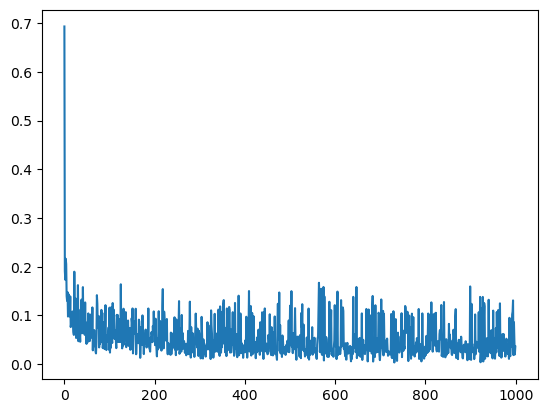

Activated Output [0.00005713 0.09939386 0.91591252 0.99999999 0.00000653 0.00027753
 0.84738095 1.         0.00096701 0.1381246  0.99996285 0.00000072
 0.93000955 0.00000147 0.999982   0.9999997  0.00009537 0.00000329
 0.08363124 0.00389037 0.00000067 0.00038496 0.00024608 0.84127142
 0.99919106 0.00000115 0.99994215 0.96521565 0.00000427 0.0761485
 0.99792775 0.00030579 0.0005775  0.03796539 0.99999984 0.00015962
 0.0000193  0.0001449  0.00146393 0.00070478 0.00022711 1.
 0.0000667  0.0002954  0.00515867 0.99999999 1.         0.0000006
 0.98925486 0.99999335 0.99999947 0.00006265 0.00027444 1.
 0.99999998 0.00333085 0.00188542 0.0000896  0.48482957 0.45891284
 0.00015693 0.00000113 0.99999994 0.00043391]
Max accuracy: 1.00000
Accuracy: 1.00000


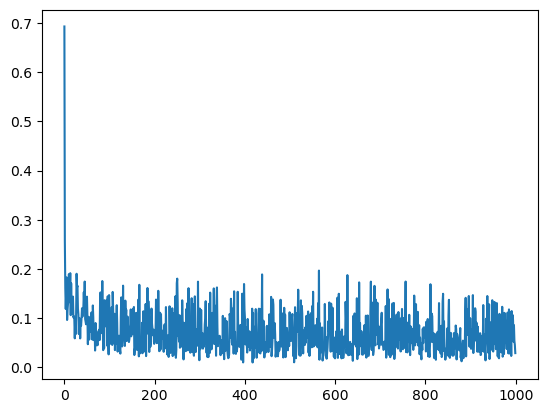

Activated Output [0.8218482  0.00077628 1.         0.00000212 1.         0.99993214
 0.16020865 0.00339834 0.99999963 0.99388872 0.0007281  0.99999985
 0.9901938  0.82869821 0.00509308 0.83452076 0.90752674 0.99999997
 0.00061938 0.99999605 1.         1.         0.00025076 0.11495466
 0.00015241 0.00026726 0.00047729 0.89840063 0.99543884 0.00001558
 0.06653008 0.99999923 0.99896656 0.0000001  0.00084854 0.00007003
 0.99995308 0.00001229 1.         0.00000752 0.00000517 0.00041503
 0.11813732 0.10680922 0.00002406 0.00017562 0.00067211 0.00105162
 0.00062064 0.01259375 0.3409739  0.00000371 0.00060728 0.00319479
 0.99999999 0.00000949 0.00000612 0.00374803 0.00034109 0.00479742
 0.99930354 0.00007051 0.00000214 0.99999998]
Max accuracy: 1.00000
Accuracy: 1.00000


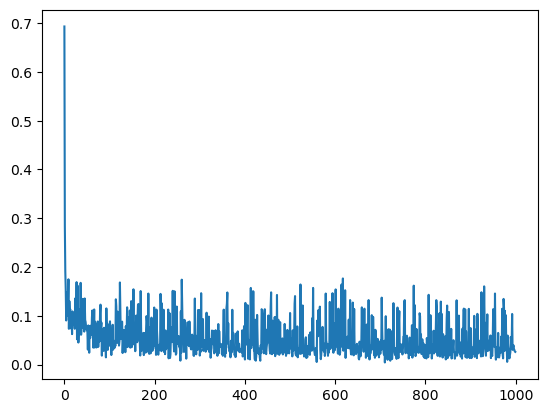

Activated Output [1.         0.99999483 0.0494954  0.20893819 0.00006035 0.99824571
 0.00626381 0.0000009  0.00001803 1.         0.00025217 0.00010754
 0.0000006  0.86938817 0.00009673 0.0019861  0.99999563 0.00002729
 0.99893003 0.19521539 0.00000063 0.99964556 0.0035828  0.00514145
 0.00039306 0.00175594 0.9875434  0.00000377 1.         0.00000015
 0.00000005 0.99966997 0.02433213 0.01569162 0.34773855 0.99997119
 0.00000184 0.94930289 0.99998907 0.00005119 0.12876187 0.9999983
 0.99999879 0.00638115 0.00000263 0.00000045 0.9976643  0.01107684
 0.01872664 1.         0.9999577  0.00493205 1.         0.00000091
 1.         0.0000721  0.00035501 0.00017008 0.96947719 0.99982303
 0.00035166 0.98631399 0.20673245 0.01170154]
Max accuracy: 1.00000
Accuracy: 0.98438


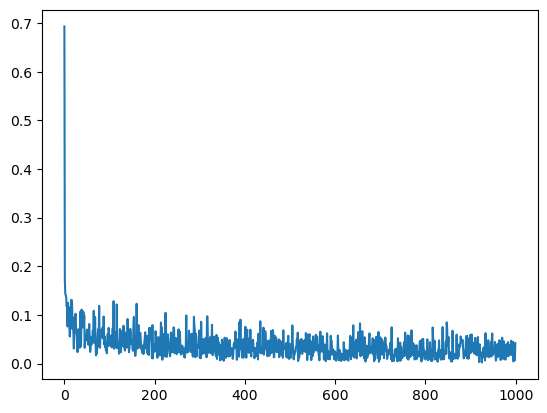

Activated Output [1.         0.00939543 0.00002891 0.00213201 0.99792874 0.00003391
 1.         0.99985855 0.21872376 0.00000666 0.99985768 0.03552358
 0.00000014 1.         0.99999816 0.99790711 0.00001272 0.0000009
 0.         1.         0.99856151 0.00002428 0.00253711 0.00000031
 0.00205976 0.30888464 1.         0.99999806 1.         0.99999375
 1.         0.00140853 0.00003056 0.00178934 0.99970039 0.00000879
 0.00611504 0.00001048 0.00391886 0.00415306 1.         0.19322776
 0.00000558 0.00000513 0.00110834 1.         0.99998735 0.99999971
 0.2814569  0.99999131 0.99999997 0.99988198 0.00004512 0.00084671
 0.89485126 0.00646811 0.00000237 0.00002404 0.00093579 0.99997755
 1.         0.04011449 0.99998155 0.01390941]
Max accuracy: 1.00000
Accuracy: 1.00000


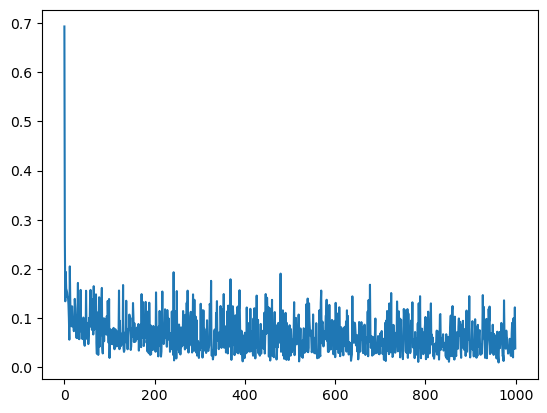

Activated Output [0.99975233 0.00000534 1.         0.00002675 0.00058529 0.00003771
 0.0003426  0.12461308 0.27745183 0.09771523 0.99988646 0.93557556
 0.01776484 0.13041065 0.999274   0.0001568  0.99934584 0.05923872
 0.00097165 0.00022184 0.99819441 0.87332703 0.69668567 0.00000037
 0.00000399 0.00217428 0.99536789 0.00005962 0.00000092 0.00655874
 1.         0.9973614  0.99999919 1.         0.00000258 0.99992702
 1.         0.00007919 0.04419359 0.54749393 0.00001243 0.12015731
 0.01050278 0.99820469 1.         0.00000147 0.76641211 0.00000156
 0.00022203 0.99999979 0.00020165 0.0047623  0.00015932 0.01404186
 0.00695822 0.0000736  0.00002931 0.00347538 0.99999789 0.00000616
 0.00000474 0.00005272 0.00102787 0.00035414]
Max accuracy: 1.00000
Accuracy: 1.00000


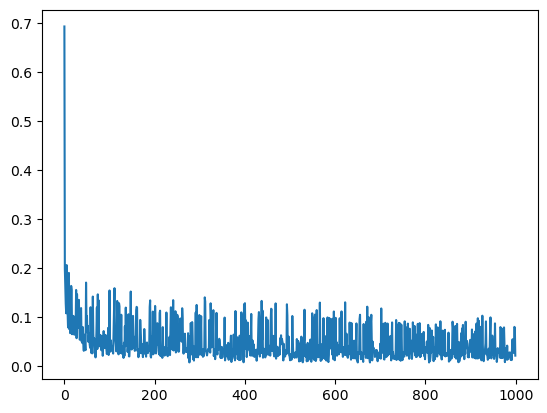

Activated Output [0.00076252 0.00775976 0.02284001 0.00180181 0.99952224 0.00947058
 0.2112825  0.00030991 0.00000212 0.0031961  0.0000762  0.08217375
 0.0008202  0.05687443 1.         1.         1.         0.0170578
 0.0022336  0.99999623 0.01631901 0.         0.99335945 0.00811608
 0.00002737 0.0000466  1.         0.00266258 0.02125393 0.0000022
 0.03691946 1.         0.00001321 0.64656615 0.00000302 0.99999988
 0.00001966 0.00097041 0.99999391 0.00765121 0.05676606 0.99999588
 0.00000385 0.00001378 0.04429187 0.00004564 0.99972701 0.00486069
 1.         0.99999872 0.99999241 0.00002181 0.99999994 0.00003132
 0.00086856 0.00766041 0.0002609  0.00000721 0.00000271 0.16694855
 0.00003965 0.03812082 0.00000477 0.99999999]
Max accuracy: 1.00000
Accuracy: 1.00000


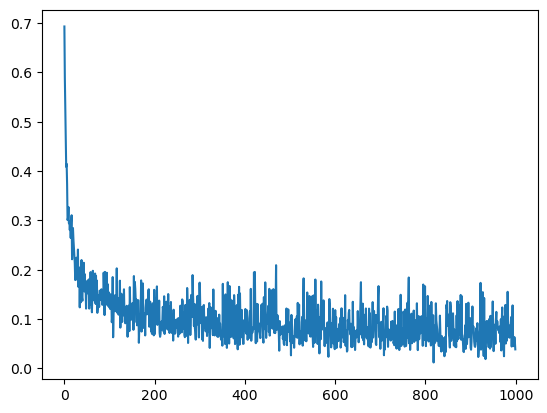

Activated Output [1.         0.00246492 0.93777973 0.4476762  0.00362114 0.99834384
 0.91207813 0.00015609 0.99999967 0.00002657 0.99998051 0.99999289
 0.9999971  0.0092414  0.00021269 0.02554063 0.99999966 0.04581588
 1.         0.00193189 0.0036368  0.04983108 0.99966208 0.03811965
 0.00027804 0.00011067 0.00006055 0.9932692  0.98544597 0.00097471
 0.91893532 0.00320752 0.99997473 0.05220765 0.99371541 0.99075299
 0.96251513 0.00175655 0.0139727  0.00360815 0.0111485  0.00584171
 0.97893328 0.99881729 0.00297995 0.00129462 0.99066904 0.70576591
 0.00034314 0.46395452 0.01389602 0.0003953  0.01596594 0.00223358
 0.00050373 0.1065061  0.99999986 0.00011467 0.99999378 0.99999979
 0.00019946 0.92978653 0.00238551 0.05511111]
Max accuracy: 1.00000
Accuracy: 0.96875


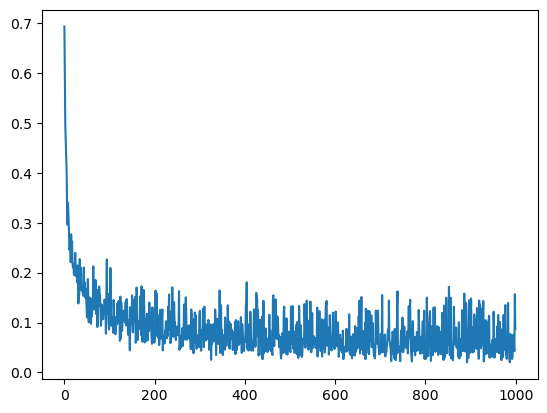

Activated Output [0.00095185 0.99996138 0.61557356 0.00108953 0.98223695 0.07009719
 0.01616597 0.94871939 0.999998   0.1920523  0.00615168 0.00325542
 0.05556328 0.99999994 0.0015298  0.99110116 0.76041882 0.0529303
 0.97421457 0.00088903 0.0321826  1.         0.02442923 0.75402032
 0.99999701 0.03998677 0.00090406 0.13649536 0.01140767 0.01866725
 0.00333997 0.99999942 0.99995994 0.14428038 0.00033536 0.07366982
 0.99995913 1.         0.00003308 0.99973612 0.99985659 0.04552092
 0.01870998 0.00078206 0.00158843 0.99201595 0.00263802 0.00006357
 0.00003033 0.26969303 0.00297856 0.00549275 0.07513828 0.07044003
 0.99899451 0.00186672 0.98866764 0.99813022 0.9982681  0.08886218
 0.07945204 0.58169516 0.00453252 0.00279996]
Max accuracy: 1.00000
Accuracy: 0.98438


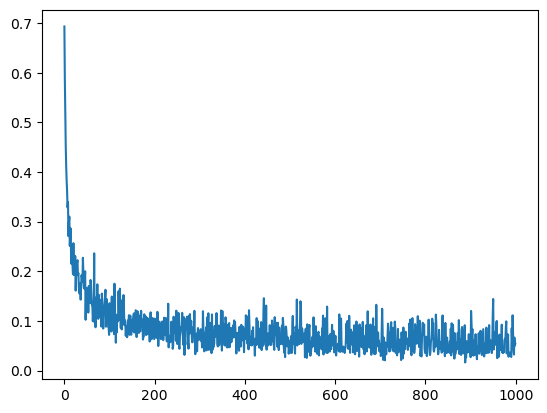

Activated Output [0.99883445 0.00001249 0.00008355 0.97176245 0.00534677 0.00100878
 1.         0.00021267 0.00480111 0.00662793 0.02984239 0.42357756
 0.99999999 0.00225483 0.0002443  0.03870114 0.99989635 0.99210075
 0.95743762 0.02371518 0.27266977 0.99999997 0.00187305 0.4927678
 0.00015274 0.97420909 0.02475615 0.00000035 0.99999985 0.20444489
 0.01375681 0.00538415 0.00017764 0.00438466 0.01531543 0.04973728
 0.01858911 0.01451973 0.01377307 0.00263369 0.05749462 0.00313186
 0.13266474 0.67491297 0.00072382 0.00005481 0.00226109 0.97212887
 0.0002145  0.00220774 0.99969172 0.05138382 0.99754991 0.81681048
 0.00102585 0.99998112 0.00197781 0.06663427 0.99989642 0.00018817
 0.04928466 0.00165856 0.0008741  0.99999558]
Max accuracy: 1.00000
Accuracy: 0.98438


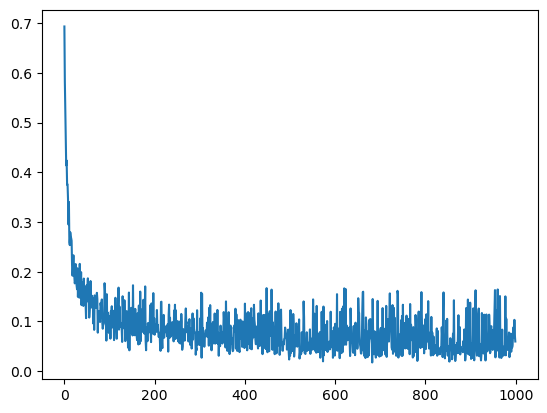

Activated Output [0.00093864 0.99727773 0.04534413 0.00848025 0.05406197 0.99999774
 0.99999529 0.99999404 0.99937643 0.75423881 0.0018442  0.00242682
 0.0031574  0.04021519 0.99998714 0.00025267 0.00103517 0.07188285
 0.02547968 0.99414632 0.0630894  0.99985165 0.00116864 0.99790095
 0.00796154 0.06184998 0.00429801 0.99998816 0.6979357  0.00156245
 0.99995711 0.00264687 0.01448315 0.00299966 0.02305264 0.00057983
 0.00461988 0.08060255 0.00005606 0.00002623 0.00055    0.99897898
 0.00627419 0.0003661  0.99898377 0.00143589 0.99343676 0.99964372
 0.99999999 0.99984679 0.14064513 0.00106881 0.99999995 0.9995201
 0.08033636 0.00008124 0.99999767 0.99977168 0.00590521 0.1695013
 0.0001497  0.2712751  0.04849087 0.00323885]
Max accuracy: 1.00000
Accuracy: 0.96875


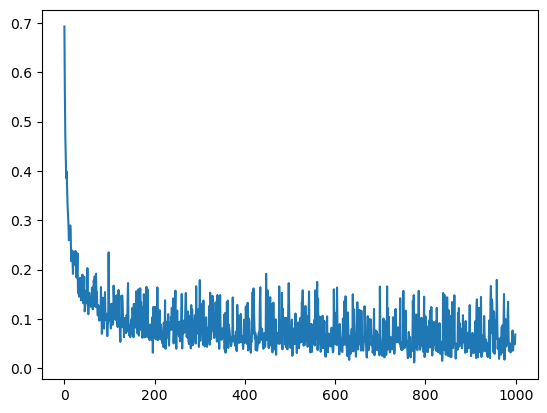

Activated Output [0.00075211 0.98778306 0.01805722 0.00023406 0.99488745 0.99986337
 0.03954064 0.00239841 0.01400031 0.00217437 0.13136978 0.1075206
 0.99999964 0.01236977 0.03449147 0.06935488 0.96802105 0.99996725
 0.99984052 1.         0.01121356 0.00378968 0.02168966 0.99984419
 0.0008743  0.99995295 0.05657191 0.00426732 1.         0.62048791
 0.00037569 0.99999998 1.         0.9999992  0.00106579 0.00237352
 0.00019746 0.00011847 0.99899723 0.03344763 0.02871558 0.00709295
 0.00396862 0.06165525 0.99951008 0.57107516 0.9635026  0.00021352
 0.0000885  0.00051742 0.00006225 0.0000718  0.06924065 0.03262415
 0.00210555 0.99895827 0.99999996 0.00010901 0.99999144 0.00000914
 0.00891511 0.95707312 0.00293024 0.99997647]
Max accuracy: 1.00000
Accuracy: 1.00000


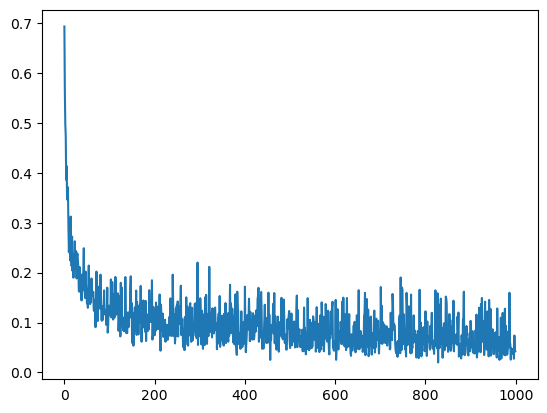

Activated Output [0.51535791 0.32765166 0.00006298 0.99999986 0.04032815 0.00286449
 0.00011993 0.99066428 0.87552171 0.99999922 0.00002204 0.002118
 0.86058936 0.99998907 0.99912382 0.00009187 0.0211896  0.99998636
 0.00736941 0.01584045 0.27610014 0.99869793 0.00132556 0.00091494
 0.99999974 0.11500318 0.99877873 0.00445852 0.00005025 0.99999922
 0.0353178  0.00113504 0.00023543 0.99993645 0.99730567 0.99999494
 1.         0.00000328 0.075439   0.99999441 0.94796308 0.0011777
 0.99995916 0.00083339 0.00007351 0.99938231 0.21835434 0.0015174
 0.99999799 0.00411711 0.99999986 0.00010876 0.0153683  0.00358869
 0.02951816 0.07991214 0.0003623  0.00809603 0.06682288 0.00092829
 0.09146147 0.99999999 0.99999176 0.07450834]
Max accuracy: 1.00000
Accuracy: 0.95312


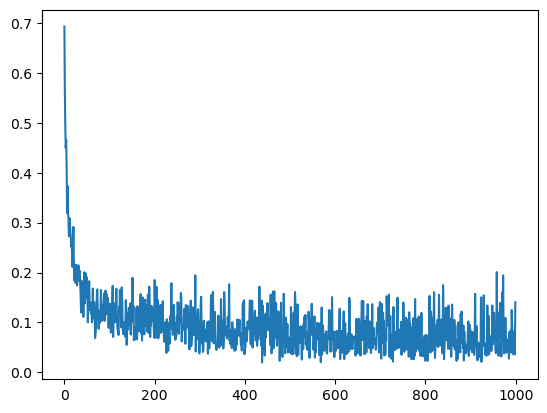

Activated Output [0.15682089 0.99938972 0.99510815 0.14271738 0.03015371 0.00010155
 0.99355962 0.01909607 0.52313716 0.00006459 0.85234035 0.02711674
 0.99999637 0.98841937 0.00039833 0.00397125 0.00265422 0.00006568
 0.12754541 0.01630407 0.0022965  0.021674   0.99653018 0.00417587
 0.00025073 0.0143317  0.00156604 0.99995986 0.01460633 0.99824882
 0.03741707 0.01220367 0.00064538 0.9993646  0.99954495 0.99972523
 0.96794679 0.99999598 0.99952381 0.00004871 0.00135878 0.99565519
 0.00025707 0.07936888 0.99999998 0.01049479 0.00306873 0.99726725
 0.99994014 0.0029492  0.00000857 0.03440212 0.10840262 0.04972123
 0.99999983 0.00051013 0.94811218 0.03089357 0.1990267  0.00052953
 0.99308998 0.99908189 0.00114868 0.39075297]
Max accuracy: 1.00000
Accuracy: 1.00000


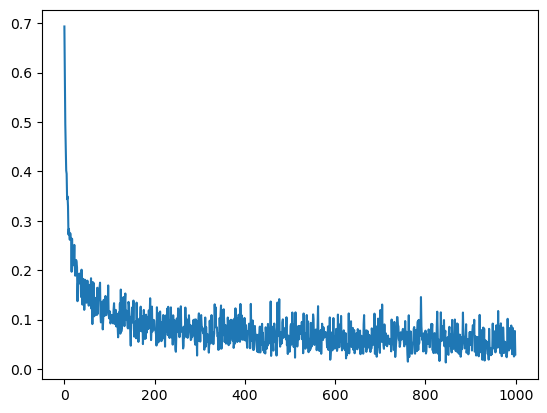

Activated Output [0.004021   0.99967955 1.         0.99999938 0.99999999 0.00123291
 0.00840141 0.69477627 0.01018803 0.00506043 0.00258988 0.91344876
 0.00018453 0.99999778 0.97518554 0.999521   0.99999581 0.99956574
 0.02694017 0.09134632 0.00063312 0.01983472 0.00080336 0.00020115
 0.19761585 0.00253876 0.00045451 0.00018724 0.72321528 1.
 0.0000819  0.03774156 0.13063719 1.         0.99507238 0.99999999
 0.00032516 0.99915082 0.99999986 0.99998298 0.09942066 0.02545509
 0.09090406 0.98210941 0.99999991 0.99998359 0.05779621 0.0604428
 0.00120779 0.95395229 0.0316274  0.99998101 0.00004239 0.98545847
 0.01158837 0.00995068 0.99690625 0.02514771 0.00687682 0.99999886
 0.00089166 0.99999714 0.00072042 0.99960638]
Max accuracy: 1.00000
Accuracy: 1.00000


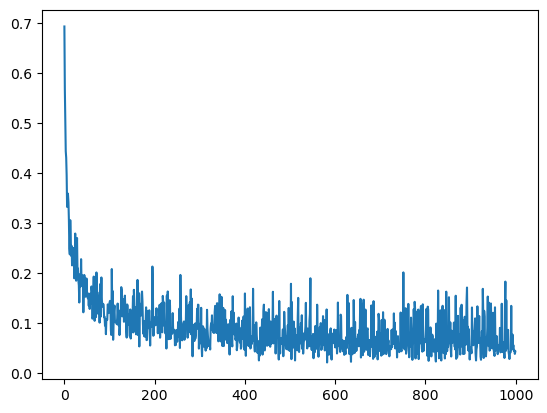

Activated Output [0.25027127 0.07835337 0.00567467 0.99942057 0.0000018  0.00033403
 0.00031236 0.00039426 0.00017319 0.00333341 0.87049026 0.00476309
 0.05955763 0.9991825  0.6251854  0.01347915 0.99752586 0.00000505
 0.85015228 0.0120646  0.03868865 0.00007358 0.00002206 0.99592021
 0.99595437 0.00293449 0.00038709 0.00000064 0.00882993 0.97799483
 0.00003088 0.0021247  0.10839669 0.00011421 0.99981701 0.74249421
 0.00838054 0.99999999 0.00013958 0.00103997 0.0001329  0.99897434
 0.99996645 0.99999963 0.00190539 0.96278343 0.01661304 0.00060021
 0.00133939 0.68605158 0.98431562 0.96185922 0.99923109 0.00076226
 0.00185606 0.99999996 0.00168415 0.99909802 0.99979672 0.00006709
 0.00086401 0.64481171 0.0004778  0.03343373]
Max accuracy: 1.00000
Accuracy: 1.00000


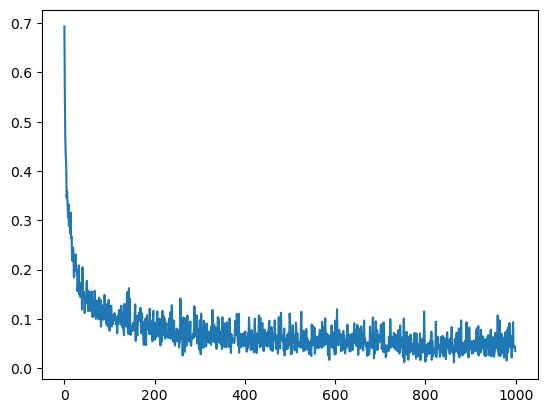

Activated Output [0.0008932  0.99998964 0.00024043 0.00068673 0.02314566 1.
 0.00942332 0.57498084 0.00001185 0.00228947 0.00124833 0.99954814
 0.06642996 0.99583794 0.99992905 0.00813411 0.00000658 0.99976975
 0.99999366 0.00392803 0.00073218 0.00808512 0.99999807 1.
 0.01037788 0.00594487 0.03497235 0.00016734 0.0123636  0.00163441
 0.03623629 0.97345591 0.00040929 0.99999663 0.00176315 0.99324821
 0.00101256 0.00110985 0.9642789  0.00098745 0.16956903 0.00609215
 0.08147346 0.7089878  0.99794689 0.9991634  0.00181372 0.99955128
 0.04614993 0.93208351 0.99994727 0.99963745 0.00477577 0.07170934
 0.0051693  0.0000127  0.14503074 0.00012998 0.00860318 0.00053798
 0.00026233 0.00122574 0.00457853 0.2938913 ]
Max accuracy: 1.00000
Accuracy: 0.95312


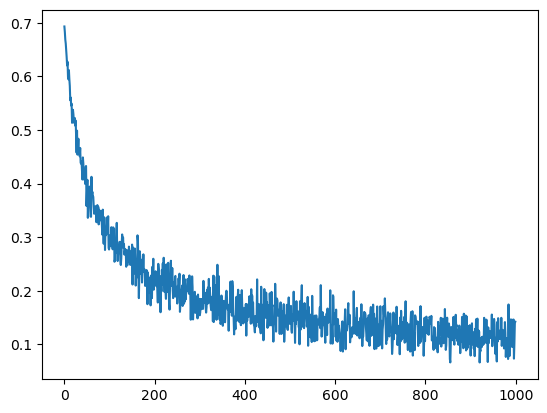

Activated Output [0.48345219 0.0064749  0.99860137 0.99998996 0.06096037 0.99883575
 0.22100053 0.97576544 0.99908528 0.01177328 0.00351384 0.9982952
 0.82160343 0.29280783 0.98589559 0.02960021 0.05315994 0.05470005
 0.03709584 0.01937608 0.9392775  0.00782958 0.99999925 0.89320211
 0.13482062 0.89826407 0.12597613 0.97510673 0.0224012  0.14732611
 0.00901761 0.00897015 0.44301502 0.99868101 0.04201403 0.10210725
 0.83581125 0.9959577  0.99993547 0.16346961 0.03085351 0.9999885
 0.04416241 0.60842795 0.20986837 0.01665147 0.00494472 0.01794883
 0.97746036 0.13945295 0.01651918 0.15499066 0.08763798 0.63006379
 0.00423404 0.35316176 0.02225229 0.09305644 0.509293   0.00281629
 0.01031858 0.99131467 0.99999981 0.93376101]
Max accuracy: 1.00000
Accuracy: 1.00000


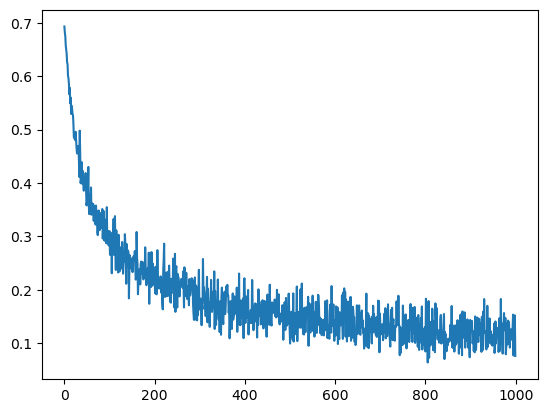

Activated Output [0.04369161 0.00831015 0.24446157 0.99005308 0.68275226 0.07228025
 0.23042482 0.96656646 0.00283453 0.96822004 0.0188675  0.03943252
 0.999146   0.03584814 0.00408375 0.04252005 0.99940254 0.9985673
 0.13477846 0.02616653 0.01821838 0.99486703 0.05971877 0.99969204
 0.99742599 0.21570663 0.01336986 0.98907034 0.99962247 0.03521056
 0.00749654 0.15623824 0.22449046 0.82385491 0.01543745 0.00590646
 0.24391827 0.01142035 0.01323273 0.11917369 0.12911488 0.08877135
 0.16315224 0.01117736 0.89608376 0.11315049 0.09358953 0.08235076
 0.30766786 0.05202085 0.00942332 0.04352163 0.00639091 0.00864518
 0.04452943 0.07796007 0.10575197 0.13409038 0.99591662 0.97260435
 0.9941739  0.96326971 0.01157248 0.13412608]
Max accuracy: 1.00000
Accuracy: 0.96875


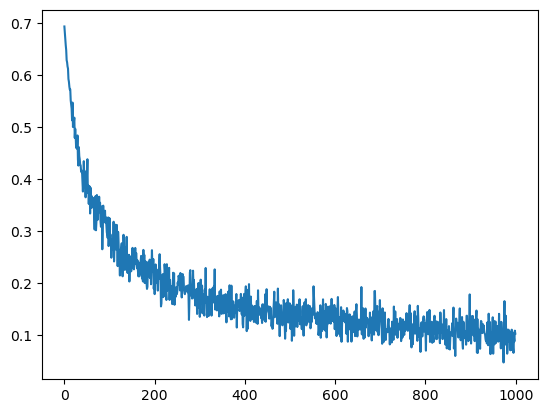

Activated Output [0.06628222 0.05377886 0.08905709 0.99995289 0.03868219 0.63187251
 0.00470253 0.00404681 0.1209504  0.92753298 0.81779362 0.04246295
 0.99876375 0.62775725 0.01528151 0.04880195 0.13686515 0.99963434
 0.10032575 0.00335332 0.15526173 0.00943968 0.02705009 0.40998163
 0.03482277 0.99899845 0.9987283  0.87978724 0.01075415 0.05430121
 0.00488666 0.99042371 0.04009539 0.99211341 0.06894514 0.99970861
 0.99999986 0.06991619 0.81839069 0.04009994 0.33623433 0.02662131
 0.07934296 0.01133622 0.02231657 0.00483652 0.30935278 0.5479905
 0.99968666 0.99137292 0.11043017 0.01075074 0.02519684 0.33267822
 0.00981812 0.95064886 0.05026536 0.00663166 0.10077387 0.96781975
 0.9932387  0.01252171 0.02623866 0.01793844]
Max accuracy: 1.00000
Accuracy: 0.96875


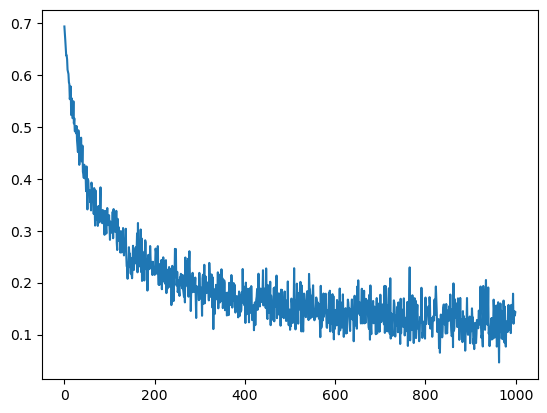

Activated Output [0.99986963 0.13774064 0.89319471 0.86560204 0.99996885 0.08273258
 0.22551566 0.99419977 0.01844516 0.0021245  0.99448325 0.01927657
 0.0219344  0.99868157 0.62714493 0.99829301 0.33889746 0.68272859
 0.99882205 0.60789564 0.99997946 0.25497825 0.991362   0.29448868
 0.16413101 0.00101669 0.12872923 0.00373588 0.87831446 0.61410172
 0.9999316  0.93884548 0.88375099 0.01964723 0.32547796 0.45967848
 0.00848566 0.99999231 0.00262198 0.99167509 0.93661908 0.00842074
 0.02041991 0.25576895 0.17905446 0.88057764 0.01762461 0.04280543
 0.07942822 0.97378781 0.01631405 0.03314563 0.12037229 0.0345441
 0.21106056 0.92165933 0.45391387 0.58787413 0.14238439 0.749762
 0.98964542 0.02248098 0.0027665  0.99866475]
Max accuracy: 1.00000
Accuracy: 0.98438


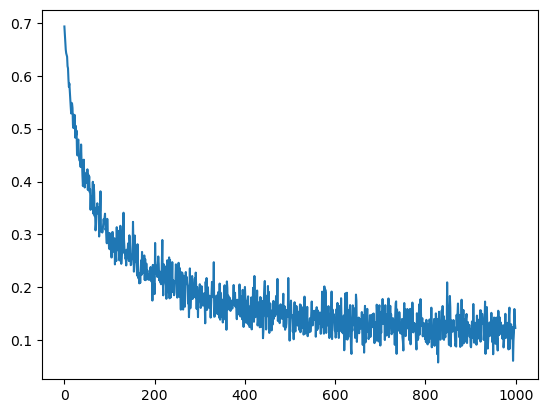

Activated Output [0.97148323 0.94068805 0.94793294 0.0188478  0.01943898 0.99818561
 0.01130242 0.23460291 0.13169052 0.00421399 0.22938304 0.00464177
 0.01214723 0.13727411 0.05466174 0.01060419 0.0468594  0.17227764
 0.9999985  0.90536428 0.01016601 0.03490296 0.01486677 0.03378668
 0.03278077 0.07293607 0.39612453 0.63604592 0.09428174 0.00715899
 0.17009606 0.01159757 0.09461964 0.10055098 0.1385439  0.12530383
 0.92067259 0.03104426 0.78207319 0.00355909 0.99068561 0.00937485
 0.41491613 0.27815591 0.93687824 0.03080225 0.01471306 0.07628845
 0.03132776 0.01706867 0.02732375 0.06365229 0.99990206 0.10466112
 0.38956139 0.16953308 0.70933639 0.0075568  0.95281078 0.99721561
 0.020842   0.00755653 0.09606654 0.03169919]
Max accuracy: 1.00000
Accuracy: 0.96875


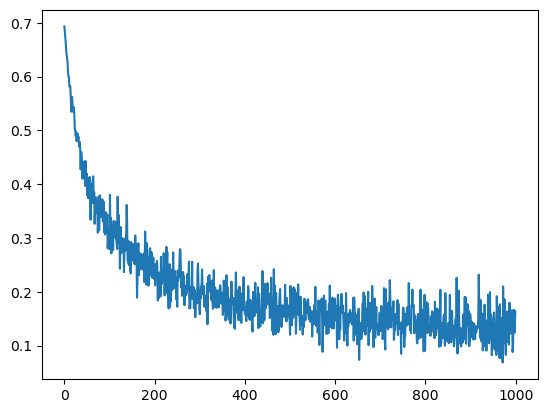

Activated Output [0.62266166 0.90798944 0.13167782 0.86613762 0.07210767 0.98567827
 0.99997238 0.02620907 0.0093257  0.07562002 0.09026799 0.12560766
 0.04289182 0.99999891 0.05488524 0.83730278 0.894819   0.97766816
 0.71739928 0.21938582 0.78100446 0.9982104  0.19971828 0.80161252
 0.17986191 0.07934349 0.79722962 0.15481129 0.99855093 0.07391493
 0.0268448  0.04349083 0.00676542 0.31244466 0.99789332 0.9836533
 0.07803946 0.10568894 0.01869644 0.02275148 0.08500665 0.08491511
 0.20146368 0.17655358 0.0445811  0.98221048 0.15903533 0.05636173
 0.94009086 0.98378098 0.07367327 0.05788774 0.00338287 0.12206353
 0.9793656  0.97648043 0.00475168 0.03536239 0.99689415 0.00607057
 0.03891556 0.8596293  0.99121993 0.03212313]
Max accuracy: 1.00000
Accuracy: 0.95312


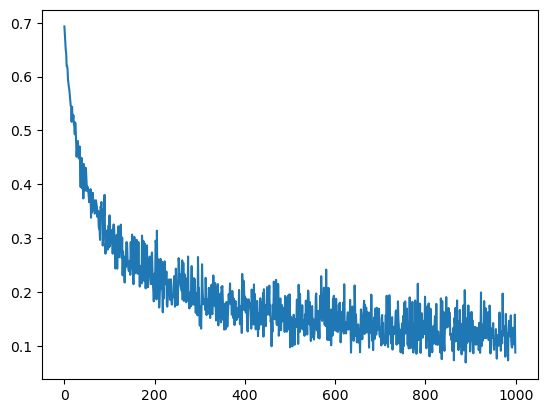

Activated Output [0.85809485 0.95120128 0.01392756 0.99951069 0.00544443 0.00555254
 0.96519308 0.98666106 0.00710332 0.97613827 0.04530687 0.99074036
 0.9852153  0.99541398 0.05424507 0.00766739 0.51079745 0.06783243
 0.99984242 0.01070985 0.99999868 0.19001458 0.02994987 0.99999917
 0.99997205 0.36232444 0.02614532 0.99196048 0.96889483 0.02505842
 0.01624594 0.0937465  0.49868923 0.04744327 0.03990611 0.04050297
 0.05644447 0.05197085 0.99207899 0.01813033 0.91592567 0.622269
 0.91686337 0.00843706 0.99750754 0.51306205 0.98487105 0.99999899
 0.0187975  0.008136   0.01153946 0.92052468 0.97819616 0.00056523
 0.00382676 0.99332083 0.02977103 0.01009833 0.03033472 0.03190448
 0.04522359 0.99815196 0.00333941 0.75682389]
Max accuracy: 1.00000
Accuracy: 0.95312


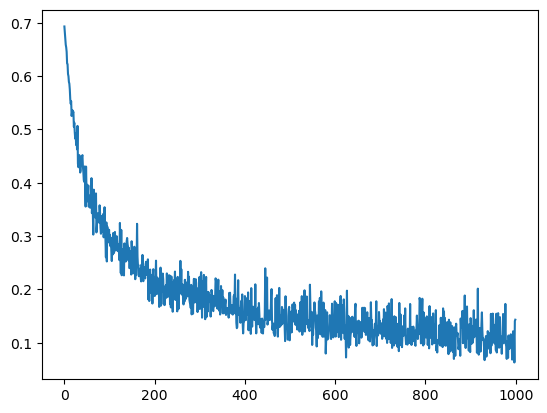

Activated Output [0.99289323 0.03258138 0.00355867 0.28527661 0.17815279 0.98002358
 0.14148916 0.82333455 0.02957358 0.10885092 0.01793413 0.99201715
 0.98499993 0.08351457 0.04254116 0.98131521 0.01759225 0.90057968
 0.97981719 0.19455341 0.99991619 0.43685996 0.99963453 0.12918619
 0.992364   0.99317    0.9321952  0.33622289 0.02509424 0.09904193
 0.18840231 0.01448699 0.06010475 0.05570836 0.99999922 0.88333506
 0.01786298 0.95967594 0.050196   0.97557639 0.99887328 0.99079597
 0.77796594 0.00708962 0.85952    0.15474954 0.01298655 0.96631632
 0.99896539 0.18159924 0.11182497 0.99964962 0.04961532 0.90955031
 0.09224393 0.98511305 0.49757829 0.01140495 0.99506317 0.73932246
 0.07991943 0.94112896 0.00682216 0.99999358]
Max accuracy: 1.00000
Accuracy: 0.98438


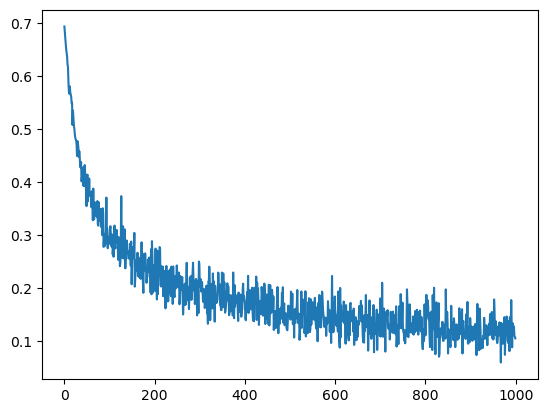

Activated Output [0.65644691 0.01432573 0.00458186 0.03655125 0.02920548 0.28022453
 0.98004896 0.98195468 0.99979744 0.97353096 0.06247073 0.01238829
 0.0348072  0.98180484 0.95198984 0.97870624 0.99999333 0.91819628
 0.07064861 0.29451775 0.03190609 0.59538958 0.13187447 1.
 0.02258968 0.31717923 0.99982862 0.01983634 0.99411726 0.85634824
 0.01381098 0.90952655 0.01678788 0.13881057 0.99203209 0.05214922
 0.09854778 0.99249421 0.99883975 0.99705608 0.04819144 0.03960673
 0.09214051 0.00399439 0.99878633 0.08186596 0.00590435 0.09578194
 0.96819674 0.99964585 0.03731294 0.99847557 0.09142396 0.37901517
 0.05246026 0.97543043 0.98395544 0.01097957 0.20887035 0.00421504
 0.46219346 0.00406349 0.40300319 0.00800208]
Max accuracy: 1.00000
Accuracy: 0.98438


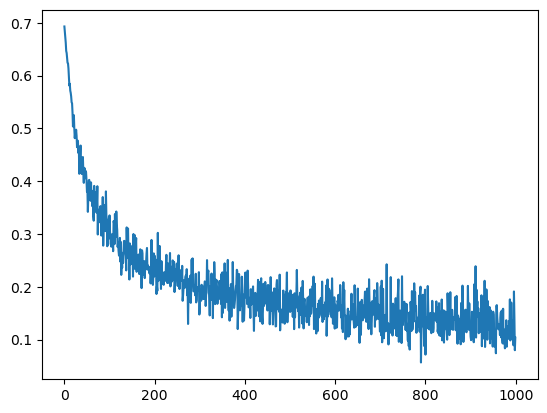

Activated Output [0.02179709 0.02968034 0.07855274 0.01821589 0.07837926 0.00850793
 0.09885411 0.11188246 0.50936501 0.89330239 0.57266652 0.04332743
 0.97590169 0.10120704 0.03944619 0.03025148 0.08277559 0.01183883
 0.99613285 0.01598156 0.79112059 0.92335323 0.02362465 0.28176438
 0.88899742 0.03893603 0.00740409 0.00799484 0.99945734 0.97098411
 0.0551784  0.00859375 0.00197666 0.99584519 0.98764455 0.00390539
 0.20401774 0.99971852 0.04042957 0.042447   0.07810799 0.01125071
 0.99998232 0.07363312 0.8756466  0.64242218 0.9999986  0.25910963
 0.55127766 0.16747831 0.99728915 0.0837362  0.99894783 0.39859042
 0.01169285 0.29263425 0.01956162 0.00222331 0.0236805  0.99091442
 0.99565782 0.99983312 0.04373885 0.23116984]
Max accuracy: 1.00000
Accuracy: 0.96875


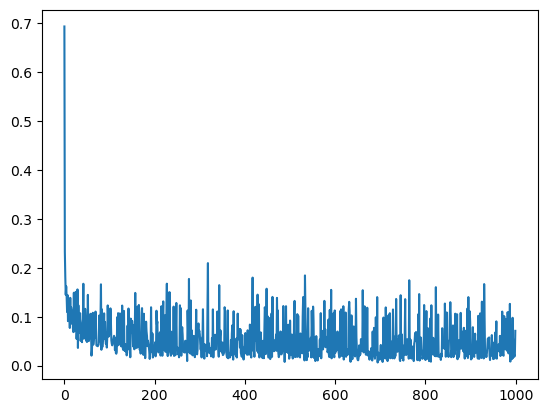

Activated Output [1.         0.13231231 0.99967753 1.         0.00004729 0.00008491
 1.         0.00054338 0.79458935 0.03169459 0.00097849 0.12473267
 0.10268996 0.00000006 0.99597024 0.70517015 0.0000266  1.
 0.0000494  0.00007454 1.         0.9999998  0.01117917 1.
 0.00000156 0.57087964 0.0001013  0.00323715 0.16486533 0.00000048
 0.99524768 0.00127188 0.00165913 0.00187746 0.99996869 0.99960801
 0.99999979 0.10914342 0.00000219 0.99414428 0.02031654 1.
 0.00035428 0.04333729 0.11591502 0.02849982 0.00554849 0.99999736
 0.00002464 0.00066658 0.00001024 0.00000016 0.0000001  0.00116833
 0.99956571 0.99999998 0.15820025 0.99992556 0.00617877 0.99999845
 0.00028557 0.97294431 0.03337054 0.08909541]
Max accuracy: 1.00000
Accuracy: 0.96875


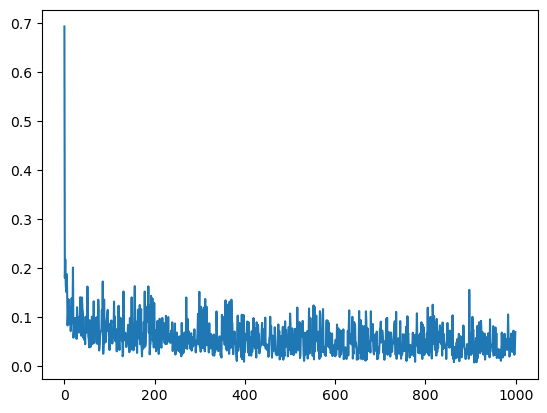

Activated Output [0.00000124 0.0001263  0.98028045 0.00016073 0.0000034  0.01106133
 0.00301801 0.065555   0.00000003 0.99999602 0.00000001 0.00001347
 0.00188345 0.00030484 0.00000005 0.00739299 0.96215029 0.16815881
 0.00282531 0.99998645 1.         0.00000176 0.00001835 0.99955418
 0.0007293  0.00110074 0.00000505 0.98670106 0.04334023 0.20922996
 0.00000066 0.00088872 0.9975509  0.00020756 0.99970223 0.0000227
 0.00287616 0.99997889 0.00000009 0.12937199 0.59683746 0.00002378
 0.08468027 0.0008417  0.0494817  0.28183209 0.99998849 1.
 0.00771941 0.00000279 0.0069774  0.1027353  1.         1.
 0.00696466 1.         1.         1.         1.         0.99999942
 0.99988794 0.82958623 0.00047731 0.0231527 ]
Max accuracy: 1.00000
Accuracy: 1.00000


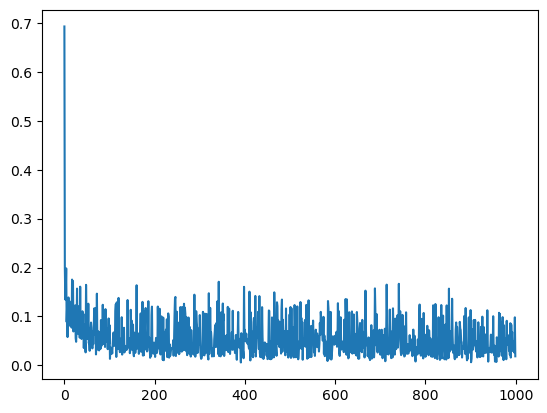

Activated Output [0.99986999 0.00000804 0.00011181 0.00255839 0.00141848 0.99999905
 0.41572499 0.00103747 0.99016136 0.00367302 0.00019796 1.
 0.01386635 0.00109099 1.         0.99932937 0.00002436 0.99205508
 0.03804951 0.         0.00000986 0.00403706 0.00004446 0.99995357
 0.00033828 1.         0.0000039  0.01566385 0.03077772 0.00004115
 0.86985639 0.02945612 0.0001498  0.00000066 1.         0.00032646
 0.00002425 1.         0.01656589 0.00000004 0.99996414 1.
 0.00019347 0.00000557 0.00008406 0.01065272 0.99999101 0.99999104
 0.00617937 0.00001568 0.00550972 0.9999999  0.00527315 1.
 0.00000041 0.00024586 0.00055212 0.01446371 0.00000309 0.24051739
 0.00171683 0.00001131 1.         0.99999631]
Max accuracy: 1.00000
Accuracy: 1.00000


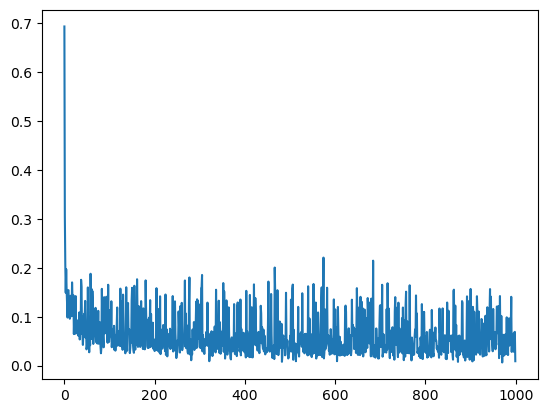

Activated Output [0.81569169 0.99999988 0.99998402 0.00041181 0.99999998 0.01432475
 0.99999698 0.99999999 0.00009648 0.00762704 0.00000034 0.99999066
 0.01863329 0.00000323 0.01120296 0.00074296 1.         0.01495253
 0.99916991 0.01165774 0.99983141 0.00002143 0.0244558  0.00000005
 0.00000214 0.99998551 0.07541715 0.00029599 0.00852503 0.01230244
 0.90390555 0.99994837 0.00431361 0.99428282 1.         0.00014418
 0.99999949 0.99999929 0.99999977 0.99944211 0.00000083 0.0001403
 0.99999999 0.00065793 0.00000486 0.00000368 0.00831839 0.00000362
 0.00021734 0.00117728 0.00000854 0.00000847 0.96370972 0.00181144
 0.         0.00008515 0.99999959 0.99999959 0.00000826 0.00014835
 0.99999775 0.00013574 0.00506473 0.00001002]
Max accuracy: 1.00000
Accuracy: 0.98438


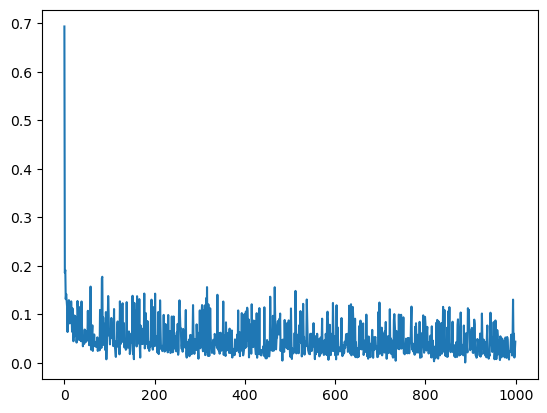

Activated Output [1.         0.85315703 0.00000829 0.16251894 0.99999794 0.91413031
 0.99999743 0.99999922 0.99999938 0.01430188 0.83215505 0.00000193
 0.99999958 0.99999909 0.00007818 1.         1.         0.9821538
 0.99961989 0.00271926 0.00000002 0.00000781 0.16813099 0.0000121
 0.99999997 0.96975214 0.03366497 1.         0.00015624 0.84277915
 0.99999987 0.00000087 0.00038709 0.00152347 0.99999998 0.00405771
 0.00018795 1.         0.00000368 0.0000292  0.00000031 1.
 0.0025075  1.         0.03297331 0.99996814 0.00000057 0.00023613
 0.99993214 0.00010882 0.99975159 0.00000996 0.0588384  0.00102821
 0.99999999 1.         0.99999998 0.00007735 0.00000002 0.99985119
 0.00027797 0.0000002  0.04258118 0.00002537]
Max accuracy: 1.00000
Accuracy: 0.98438


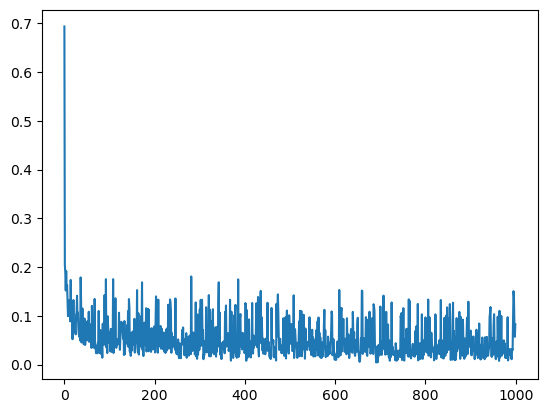

Activated Output [0.39031685 0.00037968 0.00178513 0.99961158 0.99986496 0.00389941
 0.02000839 1.         0.00069344 0.00118732 0.00006065 0.9999999
 0.99585037 0.87069763 0.04355897 1.         0.238162   1.
 0.9955004  0.0002208  0.01770618 0.02187108 0.0000112  0.00082881
 0.99949811 0.04977729 0.99999942 0.00001766 0.10400639 0.00034092
 0.00004366 0.9984241  1.         0.99999886 0.00041982 1.
 0.00128582 0.00006205 0.01484741 0.99999866 0.00117834 0.00028702
 0.99999999 0.00001025 0.00012185 0.00056487 0.99992124 0.99145695
 0.99914153 0.99999441 0.00042761 0.99996283 0.00671765 1.
 1.         0.03243629 0.00007159 0.99762182 0.99999999 0.
 0.00001081 0.99979024 0.99999886 0.00001267]
Max accuracy: 1.00000
Accuracy: 1.00000


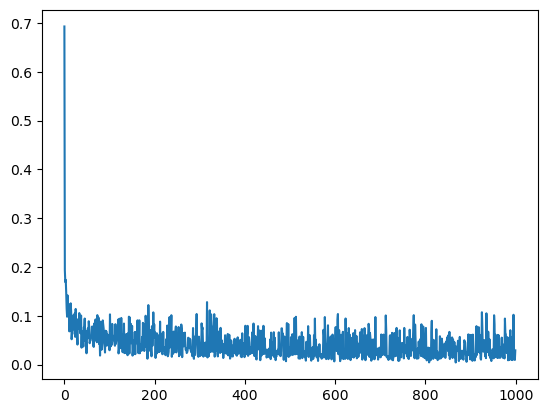

Activated Output [0.00239867 0.00192155 0.00002872 0.00343315 1.         0.99999943
 0.00000054 0.00366158 1.         0.00199646 0.00260528 0.99993686
 0.058631   0.00071467 0.99834829 1.         0.00000123 0.99999991
 0.00001463 0.         0.90028609 0.00000021 0.99999966 0.00017271
 0.94319851 0.00118939 0.99998012 0.         0.00007468 0.0003211
 0.00017066 1.         1.         0.         0.51444899 1.
 0.01250375 0.91366356 0.99989119 0.3369859  0.99999819 1.
 0.79967744 0.00000174 0.93367943 0.00544809 0.00004285 1.
 1.         0.00177025 0.04349052 0.9999423  0.99999979 0.00006804
 0.99257201 1.         0.02161413 0.00009995 0.99938211 0.99986718
 1.         0.99999997 0.99990016 0.00048581]
Max accuracy: 1.00000
Accuracy: 1.00000


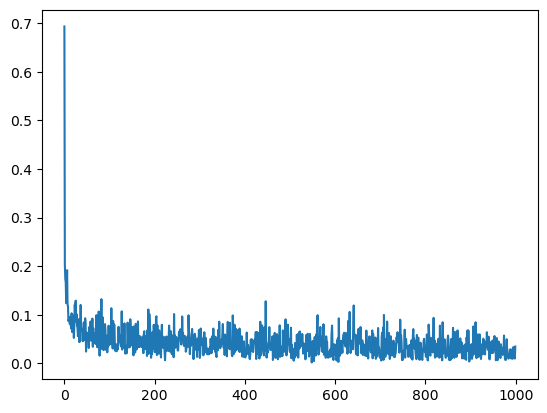

Activated Output [1.         0.09612568 0.00051384 1.         0.00597684 0.10641378
 0.04237059 0.00000027 1.         0.99999991 0.00000111 1.
 1.         0.99999968 1.         0.00000574 0.00000324 0.00000009
 0.44195616 0.0000013  0.86697798 0.99866278 1.         0.00000267
 0.99999997 0.00066338 1.         0.00000199 0.99993404 0.4695904
 1.         0.03402934 0.00087646 0.00000001 1.         0.0801799
 0.00078207 0.00005698 0.77322612 0.00201623 0.99999999 0.9993668
 0.97662088 0.99999973 0.99992757 0.00555479 1.         0.01007703
 0.00000034 0.00547408 1.         0.00085148 0.00104976 0.00000427
 0.99999519 0.00004171 0.0000021  0.00012916 0.00002519 0.00004954
 0.1481822  0.99997601 0.00012735 0.00002937]
Max accuracy: 1.00000
Accuracy: 1.00000


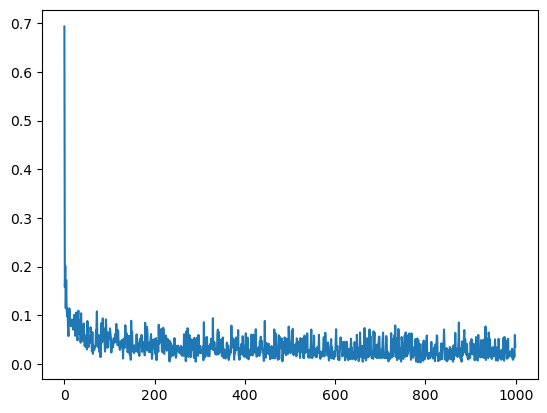

Activated Output [0.94279891 1.         0.00000092 0.00000711 0.99935088 0.00665527
 1.         1.         0.00024254 0.99996261 1.         0.
 0.0000269  1.         0.00000014 0.00000051 0.78242101 0.
 0.00000001 0.75309437 0.0000039  0.99926084 0.00000002 0.
 0.00508191 1.         0.00009521 0.99999719 0.00000306 0.99999913
 0.99999936 1.         0.0000128  0.00028328 1.         0.99999913
 0.55456952 0.00096166 0.90092508 0.00000646 0.17372595 0.00642412
 0.99999792 0.00000033 1.         0.97018242 0.00203293 0.00003263
 0.00000225 1.         0.0000123  1.         0.00029692 0.00828843
 0.00000004 0.00000308 0.00000001 0.         0.84635394 0.02224389
 0.00000001 0.00000026 0.81660995 0.16208309]
Max accuracy: 1.00000
Accuracy: 0.98438


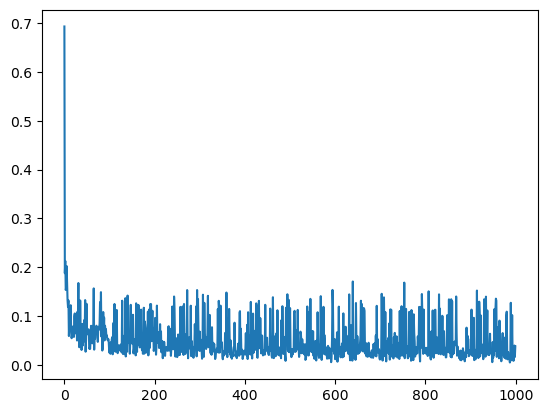

Activated Output [0.01046774 0.88731649 0.51096832 0.00001548 0.00001153 1.
 0.99999809 0.99999713 0.00025552 0.99999999 0.00000194 0.00094438
 0.00006228 0.99985796 0.0000023  0.64366823 0.00000084 1.
 0.1963707  0.00000009 0.00019607 0.06020882 0.00002365 0.00119829
 0.00000127 0.14153193 1.         0.99966887 0.99999614 0.00301166
 0.00000024 0.99999351 0.00120453 0.03177627 0.99986429 0.01579488
 0.0029414  0.99999012 0.25165836 0.99999793 1.         0.00004015
 0.00000004 0.99991097 0.98789685 0.         0.00008308 0.0000011
 0.00008507 1.         0.04669683 0.99999501 0.937225   0.99999998
 0.00000019 0.99999981 0.00003919 0.03018678 0.9998246  0.97436428
 0.16206735 0.03240865 1.         0.        ]
Max accuracy: 1.00000
Accuracy: 0.95312


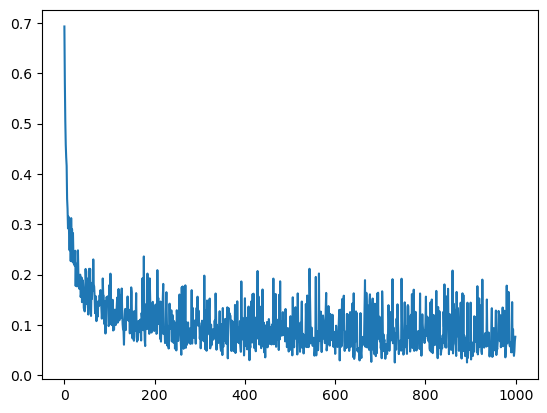

Activated Output [0.9887991  0.99415292 0.99694165 0.00742051 0.99999707 0.00016658
 0.00000466 0.11393037 0.99998616 0.00881568 0.00087165 0.99998307
 0.08442544 0.24548211 0.99999983 0.00004388 0.86576955 0.00171994
 0.00217254 1.         0.99254644 0.93867416 0.99989663 0.99992551
 0.03836703 1.         0.99999293 0.98171338 0.99989608 0.00016055
 0.45715479 0.99987103 0.04583843 0.99999548 0.00031135 0.00759668
 0.00038527 0.00092804 0.24568886 0.1817182  0.00311147 0.00094178
 0.00068489 0.98793765 0.26299104 0.00006664 0.53268722 0.00175411
 0.99994739 0.99997263 0.00822687 0.00006939 0.99435472 0.24614649
 0.99999886 0.0001574  0.99994861 0.00099625 0.00686142 0.00027067
 0.00015001 0.01315398 0.00002515 0.00107603]
Max accuracy: 1.00000
Accuracy: 0.96875


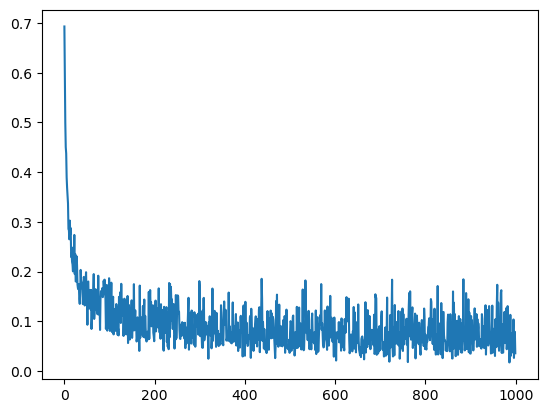

Activated Output [0.00318968 0.91002693 0.00012119 0.99992651 0.00052844 0.99992381
 0.00559629 0.99487171 0.97654445 0.00978319 0.95323625 0.00057024
 0.00297815 0.99999996 0.98860175 0.00075366 0.99999813 0.00043085
 0.00013997 0.98184002 0.00767612 0.99999931 0.01826157 0.00006288
 0.00025187 0.00547966 0.0342405  0.99999887 0.14440805 0.00209754
 0.00387882 0.00122321 0.57908488 0.00901566 1.         0.99980482
 0.0030868  0.00011151 0.0194716  0.01592517 0.96359931 0.02243128
 0.99794713 0.99981676 0.08443989 0.00878753 0.00000277 0.54661365
 0.99779956 0.99958314 0.02827362 0.94550551 1.         0.00005979
 0.76989409 0.00097906 0.9831697  0.08940616 0.00178221 0.99346315
 0.00375145 0.00009058 0.00732863 0.0053789 ]
Max accuracy: 1.00000
Accuracy: 0.98438


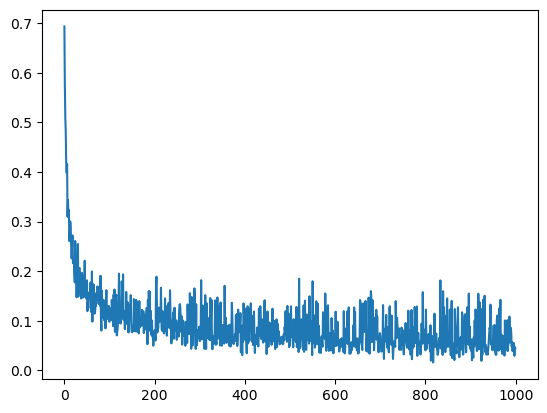

Activated Output [0.99994148 0.00003583 0.00186806 0.00091039 0.1591253  0.82800309
 0.05905565 0.00027349 0.99999996 0.2849731  0.83818496 0.00242884
 0.00000456 0.00029499 0.0020092  0.99963242 0.20560035 0.99754659
 0.77692659 0.99962424 0.00084549 0.0297359  0.00168656 0.99998933
 0.99999914 0.00010501 0.09608116 0.99983246 0.99739254 0.002056
 0.04147531 0.9935074  0.03030034 0.99999009 0.07610948 0.00125317
 0.00244272 0.00075168 0.00160454 0.00009683 1.         0.9656119
 0.00644881 0.00003706 0.26575264 0.99859249 0.00030573 0.99999989
 0.00030248 1.         0.01094636 0.00101862 0.00004171 0.03163849
 0.00036499 0.04346684 0.00000688 0.9829715  0.00453233 0.00190651
 0.53075948 0.0099909  0.00054387 0.02997603]
Max accuracy: 1.00000
Accuracy: 0.98438


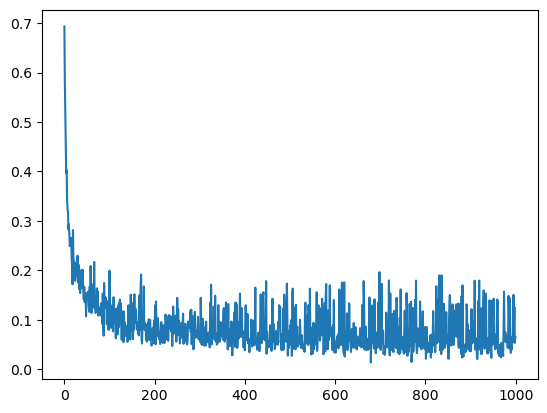

Activated Output [0.00006812 0.99999958 0.00304868 0.97803369 0.0026072  0.01784301
 0.00120082 0.01026385 0.00020432 0.02488149 0.99925358 0.42724207
 0.99997785 0.32177008 0.63886247 0.00003306 0.00004005 0.96023077
 0.01443398 0.00010873 0.00011695 0.02910158 0.04932998 0.00151626
 0.00082411 0.00044789 0.0000528  0.99990034 0.08078077 0.99940701
 0.99991788 0.01994517 0.99999795 0.00691885 0.0001786  0.01674361
 0.78040445 0.05210411 0.99999293 0.07151698 0.00253696 0.04978038
 0.00000224 0.99998201 0.1015033  0.00012574 0.003179   0.07526315
 0.0269222  0.00009209 0.74863024 0.02138214 0.99961284 0.01030799
 0.99860747 0.94656064 0.99199751 0.00054126 0.06762595 0.99483089
 0.83839352 0.00907039 0.95606731 0.6936564 ]
Max accuracy: 1.00000
Accuracy: 0.93750


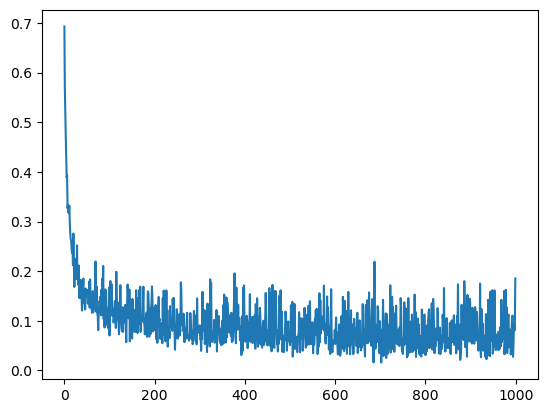

Activated Output [0.99997303 0.94513328 0.00005944 0.00214632 0.00040643 0.91949436
 0.09433144 0.00038889 0.44213148 0.00276671 0.99962493 0.99970354
 0.00111155 0.0090872  0.99999117 0.09228812 0.99999999 0.00011442
 0.00074713 0.0017903  0.98972094 0.0007867  0.00295072 0.00038751
 0.00036041 0.01748231 0.99999715 0.00215001 0.99999999 0.66288889
 0.00008658 0.99136789 0.00835883 1.         0.29814144 0.00113615
 0.00790747 0.99996315 0.00033171 0.00014347 0.15501991 0.99999878
 0.12311786 0.78418301 0.00105337 0.02239912 0.02148394 0.00097699
 0.99887213 0.00057585 0.00324844 0.99998898 0.03953431 0.99993296
 0.00016814 0.91103511 0.59784072 0.97771849 0.00009864 0.00318589
 0.00208041 0.99999979 0.00047122 0.00334686]
Max accuracy: 1.00000
Accuracy: 0.98438


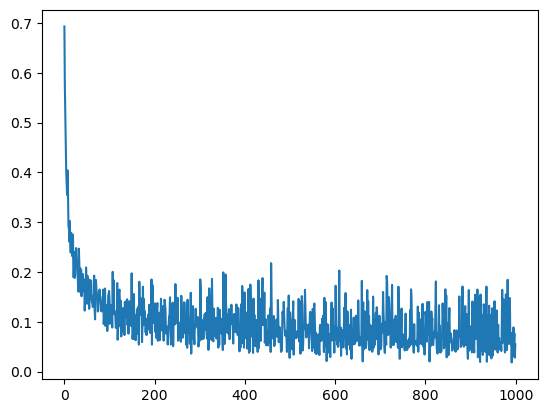

Activated Output [0.00480865 0.00004966 0.00049446 0.0154839  0.0278875  0.10810505
 0.64815922 0.10304228 0.01697414 0.99999637 1.         0.99893099
 0.00003854 0.99999942 0.18874536 0.99997885 0.00559602 0.00046432
 0.9659461  0.00455706 0.05057032 0.99958212 0.05191624 0.00017253
 0.04007903 0.00129526 0.99999999 0.99536013 0.00000426 0.99999945
 0.99074837 0.99997222 0.09628224 0.00380343 0.04483266 0.00756482
 0.99989535 1.         0.00050337 0.00136922 0.02483093 0.99999987
 0.01037487 0.0227693  0.99998979 0.03984552 0.00002886 0.99898225
 0.99482696 0.00082145 0.98937263 0.02745581 0.40425906 0.65505514
 0.00214299 0.09397579 0.0002801  0.00044792 0.0004193  0.05725597
 0.24578475 0.0020754  1.         0.05355095]
Max accuracy: 1.00000
Accuracy: 0.93750


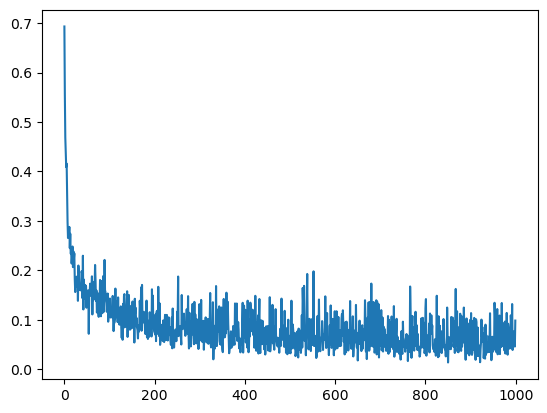

Activated Output [0.99996269 0.97841238 0.00793071 0.99995966 0.99977557 0.98520392
 0.00011272 0.99986772 0.00250892 0.10631791 0.00007162 0.95966531
 0.00144085 0.00034255 0.02018658 0.00197388 0.00001735 0.0023157
 0.76681428 0.11101987 0.00538609 0.98739802 0.0039158  0.00288446
 0.00128152 0.99999993 0.99999289 0.01187311 0.98981064 0.91777859
 0.00241208 0.9659368  0.00000013 0.01353818 0.99844234 0.63007206
 0.00269001 0.99994291 0.99910894 0.0024405  0.00051792 0.00003349
 0.19008943 0.99996267 0.0226212  0.092518   0.00070053 0.00005809
 0.0176783  0.10655141 0.00017166 0.00024907 0.05717134 0.99977063
 0.99984625 0.59629578 0.0518082  0.99999999 0.64656073 0.54649481
 0.99999805 0.00005057 0.90737922 0.99992076]
Max accuracy: 1.00000
Accuracy: 1.00000


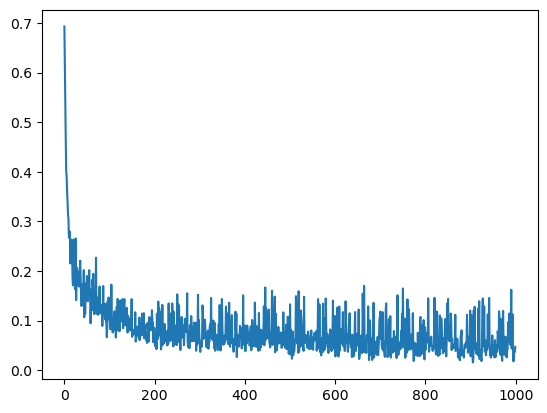

Activated Output [0.81223574 0.99479906 0.99999913 0.99331475 0.4944481  0.06017595
 0.00576215 0.99992644 0.61756482 0.00007079 0.99979105 0.00248707
 0.02748877 0.98955427 0.00003805 0.01117084 0.0139176  0.00000782
 0.11640538 0.99682784 0.99971638 0.09836569 0.00214463 0.07901631
 1.         0.00001859 0.01861213 0.00209116 0.00002913 0.02543394
 0.00210899 0.9999987  0.00092504 0.00163356 0.92314606 0.16197826
 0.00003958 0.60289799 0.99577396 0.0000543  0.00083026 0.00114969
 0.98463356 0.00007514 0.00010015 0.00282929 0.99997969 0.99999999
 0.00000401 0.00021363 0.92138846 0.00024426 0.13126533 0.92827536
 0.99997817 0.02032367 0.99995796 0.00001747 0.99983718 0.00462758
 0.00007519 0.00035137 0.01037062 0.99967499]
Max accuracy: 1.00000
Accuracy: 0.95312


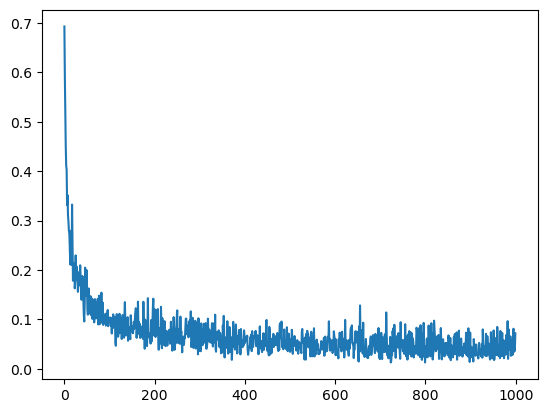

Activated Output [0.60783199 0.99147422 0.99998656 0.99997706 0.00019926 0.00100494
 0.00002348 0.05930945 0.00004727 0.00011664 0.0008124  0.00023961
 0.00346282 0.08563236 0.93568688 0.00299403 0.99999642 0.99999999
 0.99814741 0.00124769 0.48470757 0.0966865  0.99957916 0.16225204
 0.00019773 0.99914447 0.00078838 0.99999234 0.1057394  0.99749675
 0.23003719 1.         0.0819345  0.01727179 0.00002287 0.99977873
 0.9999919  0.00000928 0.00902574 0.00013003 0.72990568 0.97634664
 0.01819641 0.00001206 0.00603769 0.9145332  0.99538784 0.15994138
 0.00256299 0.00065003 0.99972704 0.00026018 0.00508572 0.00453849
 0.21432559 0.98581563 0.00033837 0.00006756 0.02515892 0.00087059
 0.00051139 0.0003317  0.0001316  0.00001629]
Max accuracy: 1.00000
Accuracy: 1.00000


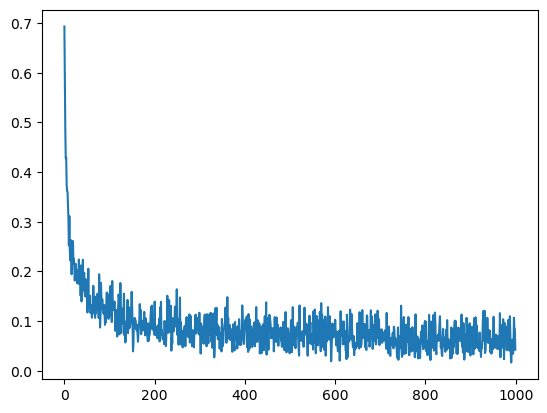

Activated Output [0.99981554 0.001234   0.00701152 0.00340181 0.9998906  0.99998423
 0.01276414 0.0014696  0.00008834 0.00010111 0.11157118 0.01856893
 0.00219142 0.09400344 0.03775202 0.99999997 0.99999935 0.08324909
 0.00557847 0.18877815 0.01615212 0.00056662 0.99999998 0.0023178
 0.0110813  0.47161214 0.00267192 0.22476332 0.08327916 0.16609901
 0.00575878 0.25304195 0.00007215 0.03186805 0.99825617 0.99535968
 0.99998128 0.20903444 0.00212835 0.99999449 0.00010661 0.95304637
 0.06576943 0.99999504 0.99976227 0.99999006 0.00000142 0.999997
 0.99999051 0.0006888  0.01194592 0.00065781 0.0160682  1.
 0.00118253 1.         0.00138463 0.00019585 0.00368373 0.86372201
 0.01517541 0.99999995 0.01841629 0.00548473]
Max accuracy: 1.00000
Accuracy: 0.96875


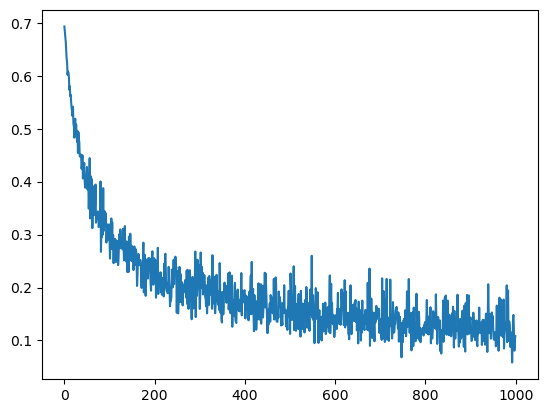

Activated Output [0.59535292 0.05431314 0.62941814 0.21543664 0.01973473 0.92261122
 0.01891884 0.99570717 0.79910641 0.88291801 0.04201431 0.96960623
 0.01437559 0.00848562 0.65807775 0.01899331 0.07383379 0.0325828
 0.0435778  0.91858176 0.55077366 0.96913597 0.98502505 0.00486261
 0.08232047 0.12536278 0.02261548 0.9890536  0.02825448 0.03032194
 0.00845357 0.01696632 0.04063758 0.87957174 0.03862014 0.00696047
 0.99178409 0.98507987 0.07399103 0.0788739  0.07772004 0.99957809
 0.79296693 0.06183915 0.03292802 0.99999224 0.01632678 0.11596364
 0.03364199 0.85330323 0.4623945  0.97900756 0.16738415 0.96262045
 0.43344248 0.78360991 0.01154255 0.23920737 0.0265579  0.20702329
 0.04410802 0.99843669 0.99872615 0.99419916]
Max accuracy: 1.00000
Accuracy: 0.98438


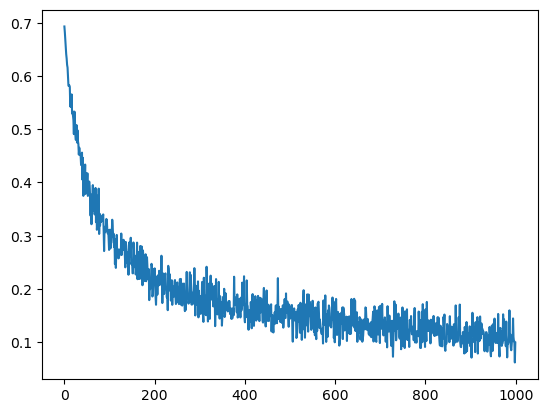

Activated Output [0.7646637  0.01226828 0.99863744 0.29131022 0.02521135 0.00798116
 0.23592856 0.98355119 0.21608248 0.03854383 0.77114369 0.20022791
 0.93257688 0.99999207 0.04468846 0.08589591 0.15523727 0.99968576
 0.16262798 0.0317655  0.56593073 0.99623008 0.33135451 0.22718494
 0.27554235 0.99759422 0.00332283 0.99642912 0.670387   0.06864536
 0.06302802 0.98921928 0.9997388  0.62025412 1.         0.99609216
 0.04129442 0.00486343 0.05491468 0.12835174 0.9900354  0.9842213
 0.32297137 0.00898554 0.03361845 0.9991992  0.99811218 0.19992799
 0.99108837 0.9935695  0.05796023 0.0523199  0.0035564  0.99821803
 0.02438195 0.0846199  0.99999855 0.99999781 0.01093693 0.00460006
 0.12431084 0.98219051 0.99581832 0.10079043]
Max accuracy: 1.00000
Accuracy: 0.98438


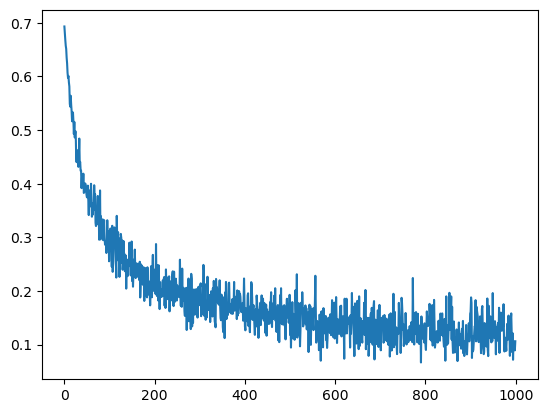

Activated Output [0.08442258 0.01122626 0.15913386 0.12630899 0.12728746 0.97897904
 0.03151152 0.00508779 0.00077181 0.88871211 0.03957577 0.00237409
 0.00286937 0.00720226 0.99643204 0.12773962 0.01109047 0.00454999
 0.08458361 0.62478388 0.01605803 1.         0.9850303  0.03825495
 0.10238484 0.00524315 0.99703891 0.01988852 0.19647973 0.0078173
 0.82611028 0.99912764 0.01601957 0.05859999 0.00405902 0.03471363
 0.04302196 0.8602911  0.03388895 0.04037047 0.99962574 0.83571723
 0.16892682 0.0539533  0.97307141 0.99956788 0.01119209 0.00620038
 0.98065597 0.90129841 0.51108464 0.85721092 0.27421845 0.06756261
 0.36117646 0.04301933 0.02634857 0.11386949 0.02019404 0.00157657
 0.01857443 0.05928448 0.99999605 0.04587907]
Max accuracy: 1.00000
Accuracy: 0.96875


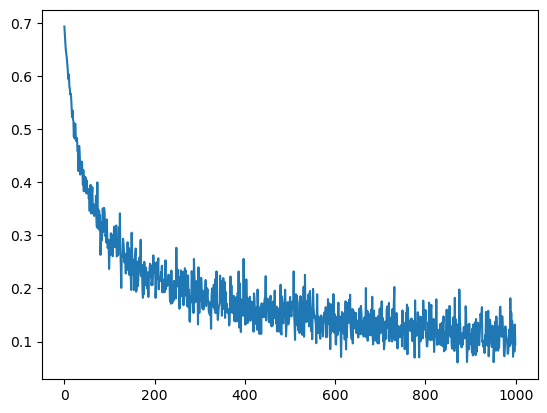

Activated Output [0.99067498 0.07186555 0.999798   0.99410174 0.0048386  0.03143799
 0.99998731 0.99876431 0.53081466 0.90281913 0.0109349  0.08704903
 0.00572081 0.04024581 0.99999211 0.20207328 0.00185859 0.01118468
 0.03045039 0.2026932  0.91225913 0.00566651 0.12639655 0.14569794
 0.02634059 0.04130346 0.01675921 0.00584648 0.02915232 0.0915069
 0.12492447 0.86671345 0.02391044 0.01511324 0.9976446  0.00674402
 0.9999707  0.49101603 0.30028998 0.99998533 0.0268589  0.97161804
 0.99908711 0.17030932 0.03654448 0.00543018 0.03508429 0.0602846
 0.93179629 0.00380589 0.02972744 0.99212817 0.97283878 0.04957977
 0.02170013 0.00394871 0.05303157 0.98317154 0.00100017 0.01388432
 0.16613637 0.99272893 0.0595534  0.05742344]
Max accuracy: 1.00000
Accuracy: 1.00000


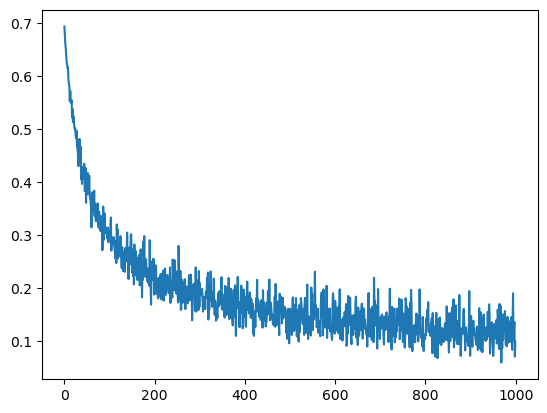

Activated Output [0.89020959 0.04085652 0.29578335 0.07407008 0.434178   0.00710073
 0.02100913 0.01180008 0.03495321 0.99997727 0.91392265 1.
 0.97003807 0.76784887 0.01638434 0.60819166 0.92386701 0.01649028
 0.11319122 0.13501407 0.99934393 0.0303544  0.00479105 0.27565851
 0.99217705 0.01339498 0.99550397 0.99998498 0.74176841 0.04546839
 0.00519622 0.03904586 0.00437596 0.99947112 0.99415322 0.08636792
 0.22182185 0.06716268 0.92447382 0.03037368 0.97968867 0.01356884
 0.99749636 0.10487744 0.13369454 0.83519731 0.99154659 0.99904078
 0.08076177 0.00431992 0.02284499 0.00581877 0.64851865 0.07145804
 0.63078806 0.0058171  0.24841955 0.10977827 0.01638345 0.06041312
 0.9996394  0.008146   0.64140643 0.01532529]
Max accuracy: 1.00000
Accuracy: 0.98438


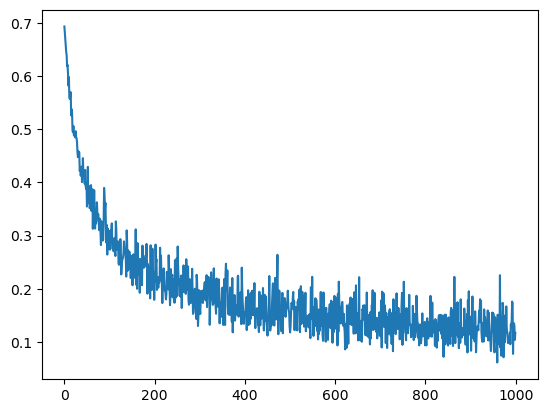

Activated Output [0.56808597 0.02028838 0.93382872 0.03664053 0.98438212 0.07879903
 0.12720504 0.56031725 0.99954321 0.4404016  0.98567244 0.0588154
 0.03477854 0.00404762 0.99516311 0.41830657 0.01837527 0.9985522
 0.02776885 0.99994177 0.98189441 0.01833017 0.90289534 0.19025268
 0.03842674 0.98396297 0.19090757 0.97873203 0.0676511  0.64414115
 0.77435663 0.88034386 0.99972907 0.99647589 0.99428794 0.22031291
 0.25426598 0.02181709 0.54726268 0.01540802 0.91080072 0.06460672
 0.97104743 0.37454345 0.00363376 0.98708656 0.02359611 0.99383486
 0.76170225 0.00476126 0.99999781 0.94680818 0.04689421 0.02210811
 0.04147895 0.1019781  0.95002321 0.97469362 0.01986087 0.93220994
 0.99956656 0.95201781 0.00861028 0.93502533]
Max accuracy: 1.00000
Accuracy: 0.96875


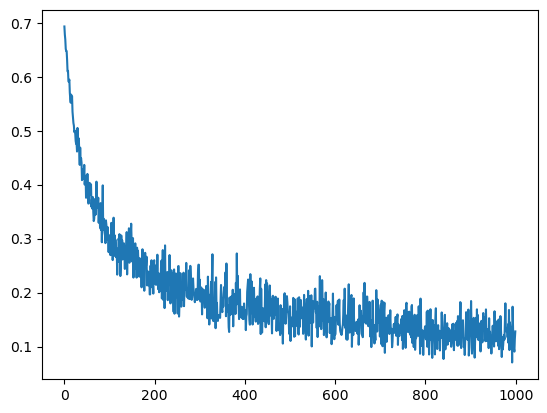

Activated Output [0.04940718 0.05494367 0.03894397 0.66800179 0.97614561 0.18199617
 0.00504889 0.1306148  0.46599632 0.01773789 0.63870688 0.00598021
 0.59913728 0.18825538 0.61908963 0.35769495 0.10151183 0.03885654
 0.85965912 0.04921879 0.03583468 0.0631062  0.39200765 0.03715126
 0.14421672 0.2861277  0.02670656 0.22286214 0.06690133 0.73172787
 0.98452787 0.98705491 0.99539798 0.02619749 0.1377982  0.07163778
 0.99993399 0.99653501 0.69162875 0.01005504 0.02859283 0.97219289
 0.00512739 0.21061285 0.02363824 0.17229265 0.99887369 0.04097153
 0.99810325 0.0684814  0.0557033  0.00735925 0.93849502 0.01658666
 0.03432604 0.08826361 0.99915484 0.99787486 0.9999976  0.02343579
 0.01393064 0.43407177 0.08015404 0.99796379]
Max accuracy: 1.00000
Accuracy: 0.93750


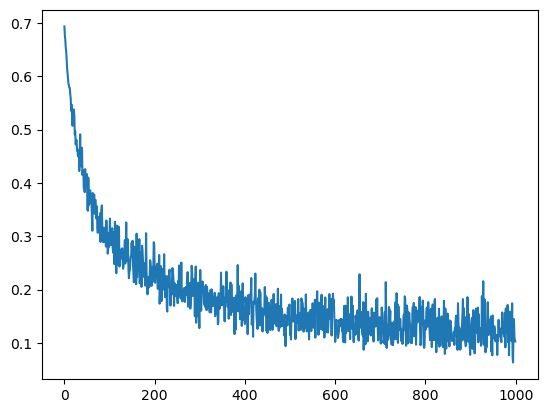

Activated Output [0.30700703 0.00246734 0.99156634 0.08187677 0.99805787 0.99967584
 0.07945599 0.00551543 0.58201605 0.02168869 0.16552869 0.97715241
 0.04386227 0.00955642 0.04177082 0.0076635  0.97080516 0.07595556
 0.28417945 0.03576659 0.56967345 0.98736418 0.99999917 0.99720495
 0.0425424  0.05096287 0.12234057 0.03492967 0.00819876 0.88972325
 0.04533749 0.78822172 0.04946788 0.09666012 0.99997411 0.02325205
 0.99994135 0.0200157  0.0331858  0.00701742 0.09490609 0.89470079
 0.0063439  0.02722823 0.45079616 0.95986216 0.99988906 0.05786128
 0.24801262 0.99812965 0.32599354 0.01651786 0.06233088 0.03964239
 0.08156854 0.99999681 0.04420362 0.99971095 0.01358658 0.26480882
 0.99917437 0.02457373 0.0308527  0.014697  ]
Max accuracy: 1.00000
Accuracy: 0.96875


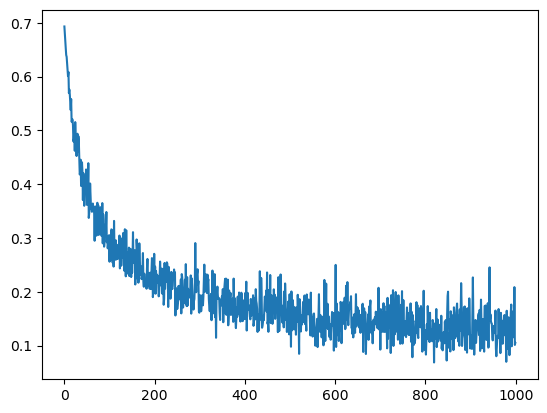

Activated Output [0.00424151 0.99178612 0.3387401  0.01242643 0.29110314 0.01836638
 0.11476175 0.89962675 0.10389523 0.00539425 0.04399565 0.99635141
 0.0022915  0.04138905 0.18042553 0.03697338 0.90969036 0.98272807
 0.03428888 0.50798309 0.99939588 0.99938376 0.98196281 0.01417103
 0.07885245 0.17196071 0.00164104 0.90792983 0.90490517 0.13326223
 0.32062188 0.0092677  0.09469489 0.93302509 0.07117101 0.99874651
 0.9895962  0.00634669 0.00622627 0.00787015 0.98225996 0.03288007
 0.99995307 0.91857489 0.00327195 0.2694083  0.07870064 0.01332521
 0.11134609 0.02433323 0.97662952 0.99987769 0.99930972 0.04565731
 0.01289215 0.07260723 0.33722645 0.60667049 0.14662094 0.1091962
 0.97949828 0.0704495  0.10876191 0.35323075]
Max accuracy: 1.00000
Accuracy: 0.96875


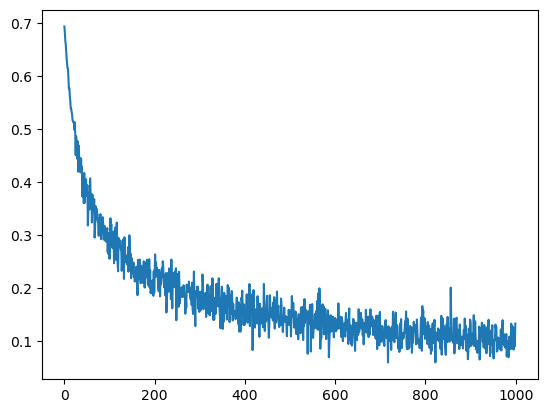

Activated Output [0.2701755  0.9994971  0.15664014 0.0110894  0.02009433 0.98541211
 0.02615526 0.07928871 0.99999444 0.04798967 0.62858981 0.99786679
 0.17052408 0.63321554 0.3135189  0.99683055 0.11624283 0.26912425
 0.33196911 0.99654779 0.96576027 0.99875353 0.99699142 0.99976899
 0.48559206 0.95523298 0.2227569  0.01995399 0.06601778 0.16948817
 0.09840583 0.84887121 0.06280735 0.04275289 0.01534348 0.00344736
 0.11723851 0.00123679 0.01045565 0.02156691 0.35664753 0.60956767
 0.99999947 0.03198544 0.00301161 0.03157911 0.05069486 0.08002815
 0.99998541 0.90810542 0.01902024 0.06368364 0.99999814 0.06083381
 0.9340076  0.08132499 0.54300202 0.01890761 0.03049243 0.17419662
 0.46989361 0.04746068 0.90337508 0.15937895]
Max accuracy: 1.00000
Accuracy: 0.98438


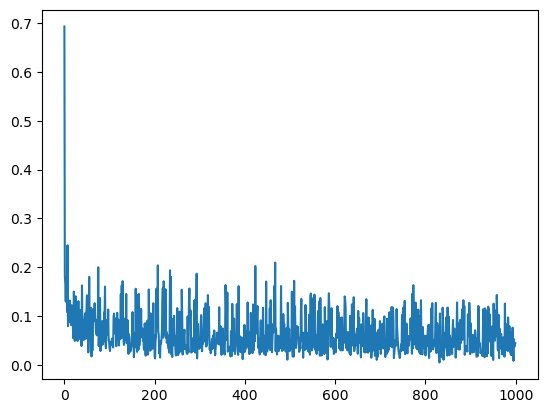

Activated Output [0.00036008 0.99995485 1.         0.00002811 1.         0.00013493
 0.0003282  0.00037719 0.00398425 0.26107551 0.04396324 0.00056588
 1.         0.00080849 0.99984671 0.00017814 0.13789456 0.99999751
 0.0337851  1.         0.99986509 0.99999996 0.19128134 0.99999996
 0.00200631 0.99999975 0.05231919 0.81081231 0.99999587 0.00008905
 0.03891288 0.0000485  0.00058548 0.00000774 0.09433751 0.00039093
 0.73927443 0.00421137 0.00000027 0.00007171 0.00002696 0.01694019
 0.95236377 0.00918942 0.00001017 0.00000143 0.00225905 0.98270994
 0.99952674 0.99998813 0.99999996 0.01081112 1.         0.00027489
 1.         0.00205853 0.83911801 0.00746515 0.99499959 1.
 0.01424918 0.00000892 0.0000107  0.99181359]
Max accuracy: 1.00000
Accuracy: 1.00000


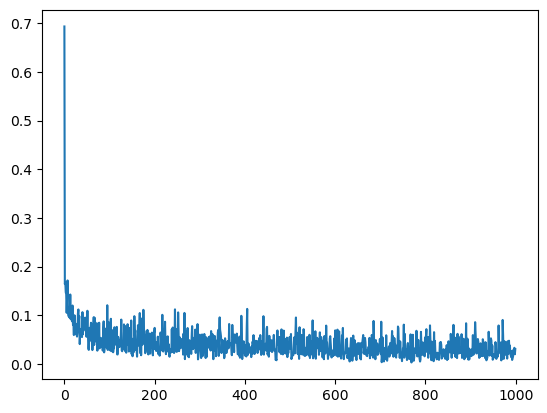

Activated Output [0.00000025 0.0098786  0.00008964 0.01078592 0.00000017 0.00000105
 0.00000403 0.00000009 0.00403165 0.01029979 0.98729258 0.9999397
 0.00006539 0.00000313 0.00001614 0.00273831 0.0002481  0.9398629
 0.99833377 0.00000281 0.00000312 0.00136747 0.96335283 0.99996781
 0.0035551  0.00000104 0.00001217 0.34741787 1.         0.00003373
 0.00043464 0.00028321 0.03864747 0.00072894 0.0000087  1.
 0.0000542  1.         1.         0.01375886 0.00093553 1.
 0.04522123 1.         1.         0.8618004  0.28445214 0.00020901
 0.00000032 0.99999374 0.         0.00007372 1.         0.00006653
 0.98622701 0.87239738 1.         1.         0.94475171 0.00356863
 0.00000055 0.00028274 0.43446485 0.00936097]
Max accuracy: 1.00000
Accuracy: 0.98438


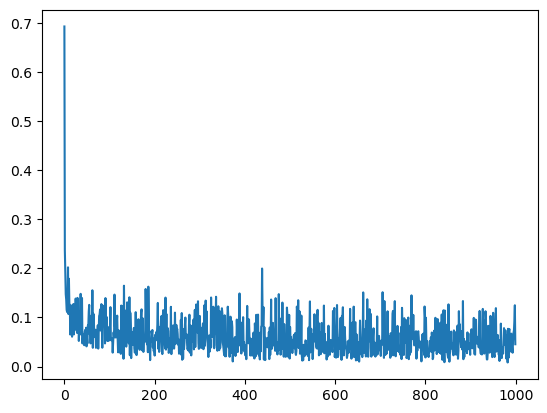

Activated Output [0.0002487  0.00000108 0.15402794 1.         0.97003614 0.00000708
 0.87492839 0.99999401 0.06534204 0.0951451  0.00000002 0.99986344
 0.0049912  0.03317962 0.99927851 0.99999999 0.02928115 0.99998715
 0.98958534 0.000675   0.53032046 1.         0.99999856 0.00029277
 0.00410937 0.34431392 0.99820227 1.         0.00024721 0.39350297
 0.02941718 0.00000013 0.00000043 0.00190975 1.         0.00049867
 0.01546304 0.00260385 0.99752785 0.01030492 0.27189832 0.00006078
 0.00138021 0.00000003 1.         0.0404119  0.99999996 1.
 0.0009478  0.00000195 0.00000315 0.0005083  0.78648393 0.00021131
 0.00275269 0.02745268 0.99999954 0.96722481 0.00134457 0.00000995
 0.00561172 0.00349919 0.99948339 0.02529636]
Max accuracy: 1.00000
Accuracy: 0.96875


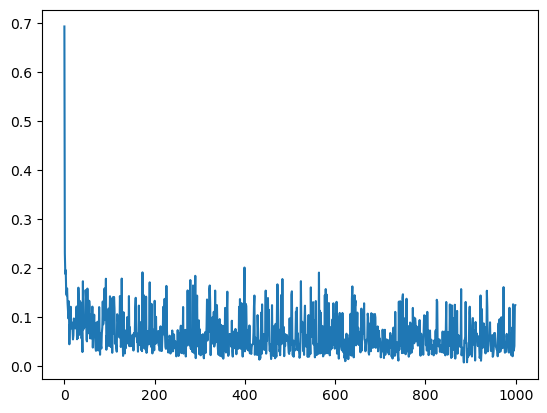

Activated Output [0.99999989 0.00000235 0.98948923 0.00000779 0.00004068 0.00000854
 0.00001812 0.98579067 0.00013932 0.00021506 1.         0.02574036
 0.00000299 0.0020014  0.00064634 0.00019006 0.99999085 0.12751938
 0.99999864 0.14167625 0.99992942 0.00180583 0.99997122 1.
 0.99994539 0.00002821 0.00000002 0.00934691 0.00032638 0.0018062
 0.00206687 0.00014929 0.3974528  0.01530233 0.99999995 0.14942765
 0.01381351 0.9997934  0.99999992 0.00273338 0.00014486 0.00001306
 0.00000424 0.01042405 0.0002576  0.83556651 0.00000219 0.00524664
 1.         0.00205728 0.01334067 0.00008283 0.99977429 0.01302251
 0.00001782 0.00002269 0.00000679 0.00000828 0.00000481 0.82821323
 0.99999989 0.00022937 0.00001221 0.99992896]
Max accuracy: 1.00000
Accuracy: 0.98438


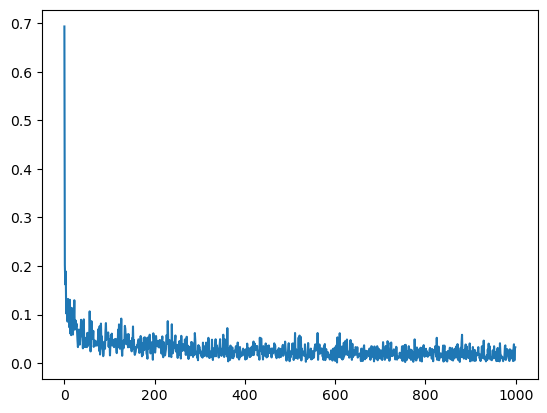

Activated Output [0.00000354 0.99778881 0.00000146 0.97679917 0.00000251 0.99960119
 1.         0.00000402 0.99999851 0.00000008 0.0004072  0.00000374
 0.00000358 0.97574611 0.         1.         0.99998899 0.99999999
 0.22168845 0.00043017 1.         1.         0.99939874 1.
 0.00011266 0.         0.000026   0.00000004 1.         0.00000008
 0.00000013 0.00000001 0.00012673 0.00000073 0.02474171 1.
 0.0222359  1.         0.99999999 0.50377216 1.         0.00000145
 0.00000002 0.00062666 0.00000002 0.99998717 0.00043924 0.00000003
 0.9917693  0.00034189 0.99999994 0.         0.01634428 0.99999958
 0.00000348 0.00000012 0.00013223 0.99999996 0.87512889 0.99999895
 0.04963757 0.00086241 0.56947071 0.        ]
Max accuracy: 1.00000
Accuracy: 0.96875


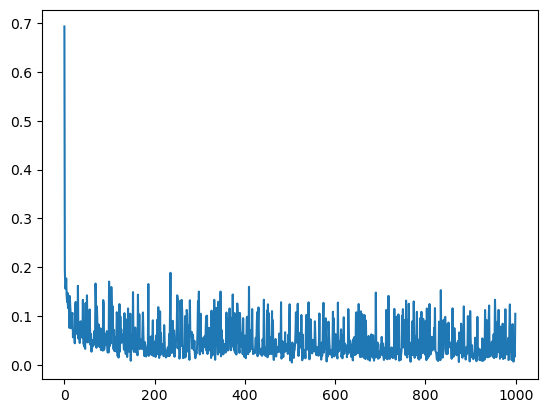

Activated Output [1.         0.9993855  0.         0.00089947 0.00001306 0.00000047
 0.0137647  0.00007479 0.00000001 0.0023681  0.00000095 0.00009244
 0.99999962 1.         0.99999998 0.00192733 0.00560123 0.01745245
 0.00003473 0.00239673 0.03154135 1.         0.99956651 1.
 0.00002046 0.14418977 0.00102775 0.99999921 0.99301406 1.
 0.99999997 0.99497382 0.99999997 0.00000308 0.0000586  0.99958006
 0.00000962 0.00001065 0.00015671 0.99898832 0.99999999 0.99902295
 0.00000775 0.99999976 0.99864238 0.00039389 0.00008149 0.00063999
 0.99999808 0.0001848  0.00014822 0.00000132 0.00008045 0.9999914
 0.00022835 0.00000054 0.00054088 0.00206641 0.00731376 0.00000341
 0.06290941 0.73844684 0.00000916 0.00000211]
Max accuracy: 1.00000
Accuracy: 0.95312


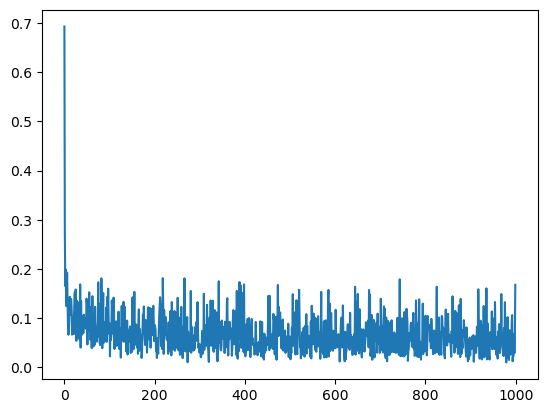

Activated Output [0.00023645 0.99999539 0.01273827 0.99991032 0.00010148 0.00000273
 0.99167221 0.99980566 0.000634   0.00122468 0.00299872 0.06985187
 0.24794142 0.99999998 1.         0.59673202 0.00213725 0.99998671
 0.00001313 0.07153729 0.01236032 0.00001475 0.00337187 0.00093067
 0.9999984  1.         0.00002372 0.99999109 0.99955318 0.99969532
 0.00184653 0.00000097 0.00008113 0.00000015 0.99999986 0.82025725
 0.0035541  0.00000178 0.99999148 0.01255191 0.02895617 0.01735025
 0.00003461 0.01893701 0.09735374 0.00000132 0.9889476  0.51840291
 0.00000304 0.99999178 0.11550509 0.00001538 0.00000587 0.97948028
 0.34082193 0.99998759 0.0000607  0.99934696 0.99996403 0.00220023
 0.01531306 0.28309087 0.00018277 0.99961095]
Max accuracy: 1.00000
Accuracy: 0.98438


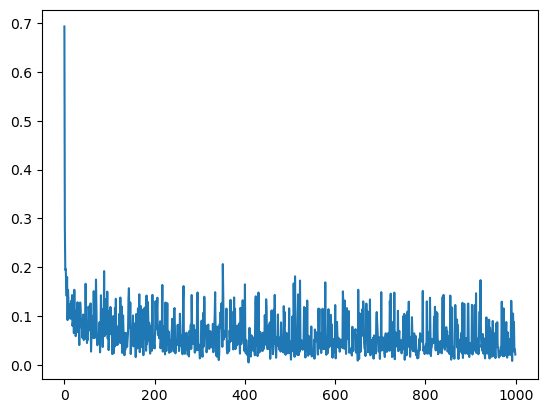

Activated Output [0.13803466 1.         0.02890155 0.00283915 1.         0.00148198
 0.99999997 0.99999998 0.99999823 0.96259253 0.00550217 0.99977254
 0.00004998 0.00016378 0.99965526 0.99613412 0.00090962 0.99480247
 0.99999999 0.00029606 0.99974135 0.03076685 0.00007517 0.00000001
 0.99999996 0.99999998 0.99983943 0.48664692 1.         0.00000644
 1.         0.01221669 0.00418678 0.12394508 0.99981764 0.00003264
 0.99979014 0.04615861 0.99985658 0.00009289 0.00121865 0.00243381
 0.99999858 0.99960803 0.07863831 0.99999778 1.         0.00116139
 1.         0.00049905 0.9892482  0.00006289 0.99999911 0.02779774
 0.00808698 0.00000581 0.00038316 0.00561965 0.00006919 1.
 0.99998776 0.00000097 0.99687895 0.9998894 ]
Max accuracy: 1.00000
Accuracy: 0.98438


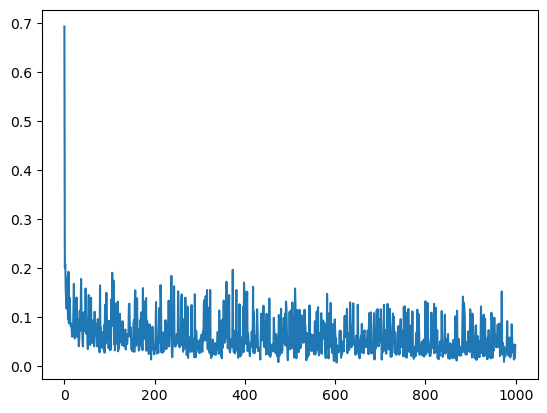

Activated Output [0.98996982 1.         0.00012746 0.00000378 0.40045853 1.
 0.00000408 0.0090482  0.44239256 0.00017658 0.00010632 0.99906751
 0.9999841  0.00195998 0.94038951 0.20299596 0.00717577 0.00005843
 0.24043137 0.82927353 0.00298875 0.0097617  0.01224128 0.00000264
 0.99637515 0.01182647 0.99999986 1.         0.00881471 0.00009533
 0.99908313 0.99999999 0.99999997 1.         1.         0.00253589
 0.00216538 0.00050166 0.00042638 0.00931531 0.00000441 0.99954252
 0.03675695 0.92339213 0.99999888 0.00310156 0.00000048 0.00017511
 0.02639522 0.99988172 0.01992664 0.00043362 1.         0.99291016
 0.99998887 0.06698671 0.99999998 0.0213054  1.         1.
 0.01981818 0.98902576 0.97709109 1.        ]
Max accuracy: 1.00000
Accuracy: 0.98438


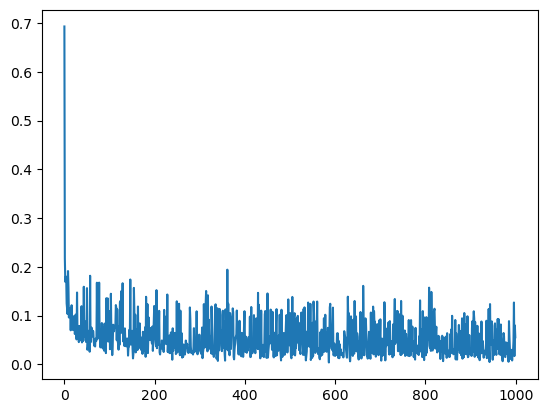

Activated Output [0.99971162 0.99983323 0.00001562 0.99999995 0.00001062 0.99999997
 0.15821485 1.         1.         0.00114265 0.0000003  1.
 0.00000508 0.01289949 0.00000561 0.00300571 1.         0.99995327
 0.99999937 0.99999998 0.03451642 0.99999996 0.99999471 0.99548538
 0.00002643 0.01800479 1.         0.01791261 1.         0.07292127
 0.00527781 0.00210834 0.00000901 0.97749428 0.00012001 0.00000002
 0.00000129 0.00033689 0.80683856 1.         0.99998354 1.
 0.0141403  0.99999986 0.99952681 0.00005143 0.99999999 0.00117055
 0.73139977 0.00009542 0.99997524 0.00011411 0.99999995 0.00004978
 0.01021275 0.85753894 0.00021508 0.00826252 0.01520866 0.000071
 0.00000016 0.00001247 0.00022051 0.08697021]
Max accuracy: 1.00000
Accuracy: 0.96875


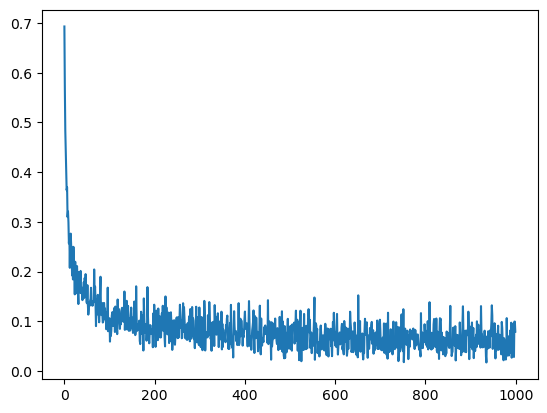

Activated Output [0.00136691 0.1647469  0.00016247 0.9979785  0.01367845 0.97375477
 0.02106872 0.03451    0.00061618 0.99999997 0.00478615 0.99999712
 0.00174966 0.99382326 0.00288993 0.03191713 0.99999998 0.0072233
 0.00068261 0.54892469 0.06574154 0.00074562 0.01692529 0.00008485
 0.99998228 0.00400738 0.00005811 0.9994604  0.01220414 0.40584338
 0.00023101 0.00000234 1.         0.02495268 0.00336991 0.21372463
 0.99999926 0.99841404 0.03938475 0.60691528 0.0128545  0.00172695
 0.00041186 0.00000176 0.00218898 0.00003531 0.00289971 0.13900473
 0.0001857  0.00211625 0.9245442  0.01293729 0.02126146 0.08895904
 0.03742131 0.99976561 0.00012076 0.99999891 0.80302485 0.12343778
 0.00004719 0.00029056 0.97666785 0.08870133]
Max accuracy: 1.00000
Accuracy: 0.95312


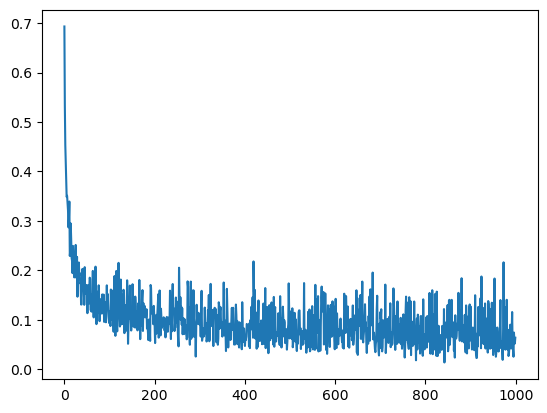

Activated Output [0.78987241 0.02473948 0.01531352 0.00043731 0.99995552 0.07802343
 0.0001544  0.33966801 0.00003905 0.99938379 0.00973099 0.00017691
 0.01706069 0.99958657 0.00075817 0.99997789 0.00008963 0.03658559
 0.99861834 0.7150402  0.00004181 0.04719896 0.00342697 0.99999885
 0.00019865 0.00001285 0.00110135 0.0049375  0.99006879 0.99997466
 0.97341161 0.00007735 0.0006905  0.00043072 0.99975068 0.03830814
 0.04102775 0.00003197 0.99462549 0.9999254  0.99468742 0.99967374
 0.46623651 0.00404234 0.99999981 0.04560382 0.0000403  0.01024623
 0.00266579 0.99993481 0.00436523 0.61904349 0.00183195 0.99990449
 0.98041452 0.02394336 0.0026048  0.6146295  0.99920094 0.00035367
 0.02473048 0.00290389 0.02263927 0.01947977]
Max accuracy: 1.00000
Accuracy: 0.98438


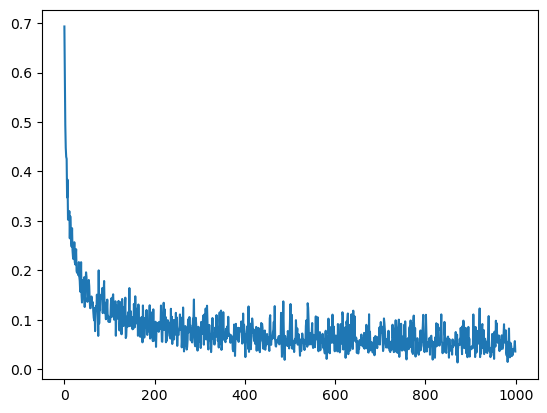

Activated Output [0.01004006 0.00269684 0.14974876 0.00699889 0.00031444 0.00234293
 0.00000996 0.0053958  0.97244571 0.99521421 0.94617686 0.01496307
 0.62373409 0.03102643 0.99999522 0.99672318 0.0000248  0.00217247
 0.99902194 0.01862665 0.878386   0.18687711 0.74394    0.00229566
 0.0342673  0.99950147 0.99971539 0.98249072 0.0001996  0.99999754
 0.0435386  0.9996519  0.00002327 0.00062543 0.99934709 0.9995627
 0.00024552 0.9999725  0.75336673 0.9999507  0.76046157 0.98879703
 0.00019313 0.00005127 0.00011993 0.99799993 0.99999828 0.99993211
 0.00000087 0.00121123 0.00070454 0.00129031 0.90724735 0.00540956
 0.02001202 0.00054665 0.0004075  0.03092527 0.99999914 0.9960703
 0.00001264 0.00820128 0.00000119 0.00000705]
Max accuracy: 1.00000
Accuracy: 0.96875


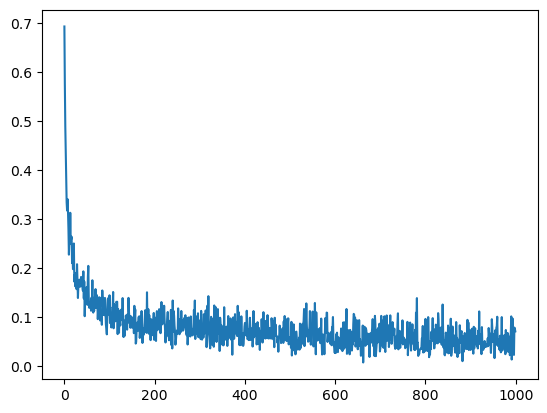

Activated Output [0.00657335 0.60932561 0.12053583 0.01120215 0.00035227 0.87509775
 1.         1.         0.02770145 0.99999368 0.00402616 0.00078884
 0.17649328 0.00037462 0.01480967 0.97979948 0.00005504 0.00039967
 0.56612228 0.00072553 0.00003735 0.19579261 0.99995286 0.00070465
 0.00028896 0.00002287 0.05233348 0.02125712 0.0002035  0.01266866
 0.07884856 0.96808151 0.02880236 0.001804   0.00038832 0.01095866
 0.99990386 0.00216443 0.01343674 0.04185779 0.00139399 0.9828816
 0.0002231  0.0000262  0.95256013 0.00166008 0.99999802 0.0002444
 0.99999994 0.00740843 0.00058063 0.00261251 0.99999337 0.99998701
 0.21773198 0.00158792 0.00285716 0.00013519 0.00475389 0.00000191
 0.97740185 0.10076421 0.26676382 0.99985838]
Max accuracy: 1.00000
Accuracy: 0.98438


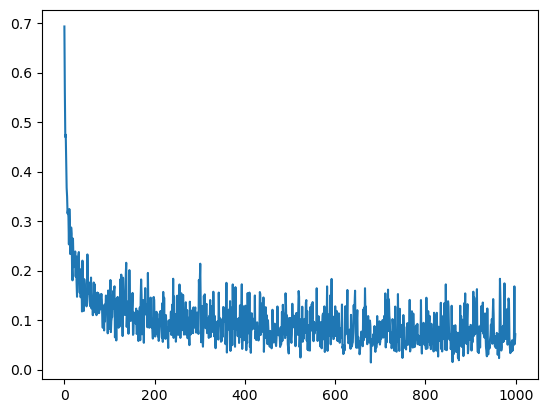

Activated Output [0.77945159 0.00226892 0.00014424 0.00040435 0.99999908 0.81764175
 0.01487321 0.15286362 0.97485561 0.00029898 0.00135745 0.00070761
 0.00171719 0.99906651 0.00231356 0.02678305 0.99999378 0.0087989
 0.01204148 0.00081987 0.01233981 0.39300825 0.00081817 0.00007087
 0.0753503  0.0022622  0.02532817 0.9999271  0.00000279 0.99999808
 0.99972744 0.99998795 0.00934891 0.03326851 0.00056457 0.98901275
 0.01500206 0.70392239 0.24186872 0.00000659 0.00035563 0.99977747
 0.5071159  0.03055996 0.99992961 0.99999994 0.0507422  0.00628475
 0.02715758 0.99998556 0.00366781 0.99999566 0.01103729 0.00476118
 0.89621661 0.22188231 0.00302195 0.29418565 0.02424726 0.00146447
 0.05208101 0.99815986 0.00495216 0.03708906]
Max accuracy: 1.00000
Accuracy: 0.96875


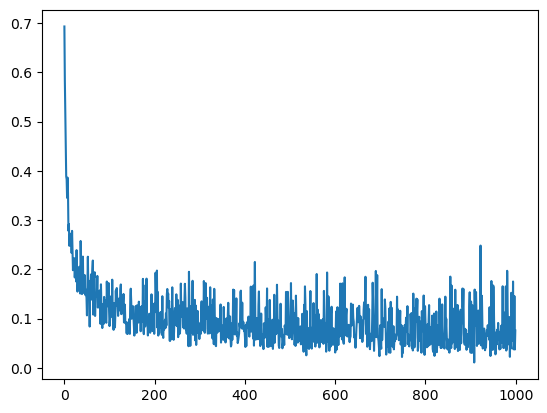

Activated Output [0.00943748 0.00000332 0.99999891 0.0012584  0.10975662 0.06675667
 0.10664186 0.00723034 0.14843117 0.99999912 0.01248326 0.00014205
 0.00039286 0.97392272 0.9904337  0.95843293 0.00289303 0.00114217
 0.00522786 0.99999812 0.99981149 0.00062435 0.00039781 0.00033038
 1.         0.98028737 0.00025183 0.99331849 0.00014673 0.00021523
 0.99986899 0.68024196 0.99958875 0.03854001 0.99999687 0.00031503
 0.00009916 0.50204591 0.99907435 0.00351166 0.00003798 0.97064288
 0.00948942 0.19690266 0.99953613 0.33151447 0.00307925 0.00023267
 0.15584409 0.99999995 0.00027075 0.99300256 0.01459986 0.00024742
 0.99939828 0.99947616 0.00346923 0.95421721 0.00050827 0.02888031
 0.04403438 0.00188292 0.00088821 0.99667819]
Max accuracy: 1.00000
Accuracy: 0.93750


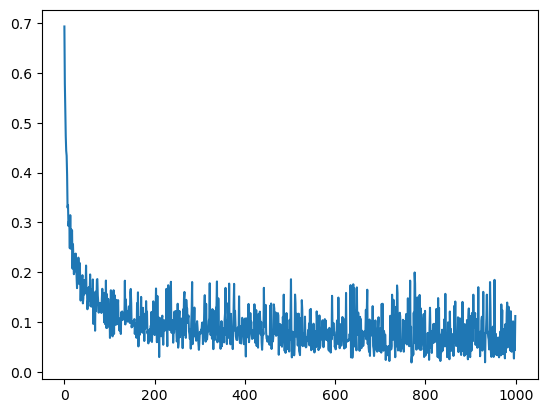

Activated Output [0.0118797  0.01705627 0.86349099 0.00041939 0.31748643 0.00168928
 0.00001274 0.00302773 0.99999652 0.99122737 0.99995701 1.
 0.99990136 0.00047531 0.00008013 0.13655564 0.00637789 0.00003916
 0.00000312 1.         0.00029773 0.00020869 0.57608046 0.03849029
 0.02391644 0.99999999 0.99999317 0.03780575 0.00636284 0.10987172
 0.00397976 0.99999149 0.00129805 0.01809401 0.99945622 0.00041937
 0.69984033 0.99975684 0.57856901 0.00000611 0.99998323 0.00014758
 0.99975663 0.99964667 0.99999988 0.00006225 0.01613021 0.00791964
 0.00019512 0.00008819 0.01435357 0.02572019 0.00003421 0.00403525
 0.99478184 0.13476854 0.02198298 0.99999947 0.00123336 0.99999981
 0.98025762 0.17893743 0.00232067 0.034304  ]
Max accuracy: 1.00000
Accuracy: 0.95312


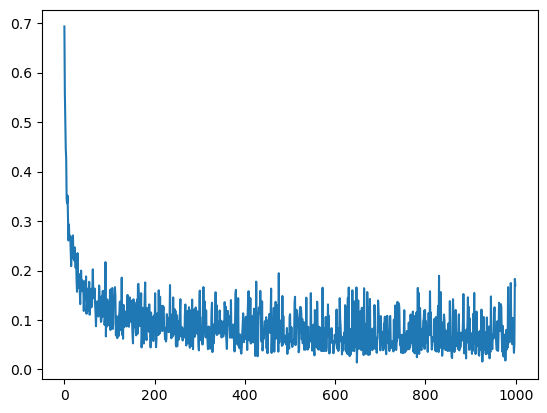

Activated Output [0.28967278 0.03368214 0.0001126  0.02440211 0.99997898 0.99996462
 0.0768099  0.9994833  0.18802823 0.99999567 0.99999758 0.73807274
 0.00792571 0.99279657 0.98972943 0.58111527 0.50753079 0.00010998
 0.00007372 0.00868808 0.01536197 0.99147381 0.00053308 0.45797666
 0.00585386 0.00328297 0.00193093 0.99964245 0.00000299 0.9999711
 0.00194394 0.97983721 0.99968662 0.98619125 0.79342567 0.05243644
 0.06515977 0.06955672 0.00208577 0.0031901  0.00077023 0.00395925
 0.99398454 0.00607608 0.95507428 0.00890561 0.00133234 0.0018081
 0.00083125 0.01653157 0.00016639 0.01411803 1.         0.9999693
 0.99832369 0.00270054 0.00358225 0.01592278 0.99806591 0.88836531
 0.0989492  0.09807351 0.00001687 0.99999988]
Max accuracy: 1.00000
Accuracy: 0.96875


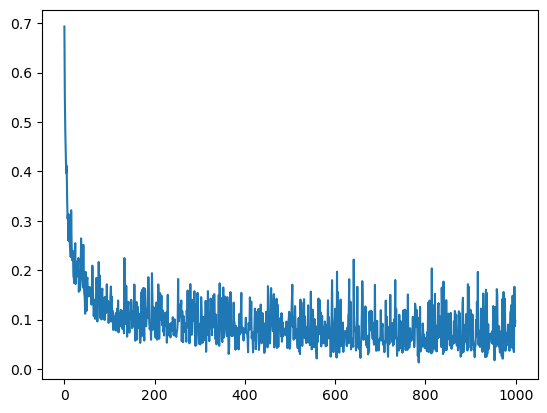

Activated Output [0.00000213 0.00024231 0.94979029 0.0381408  0.00097989 0.00616298
 0.99996413 0.00052323 0.00269243 0.02361908 0.86361307 0.00009426
 0.16677416 0.01427567 0.99988429 0.00020317 0.9883361  0.95258473
 1.         0.99998541 0.99404175 0.00141375 0.99999991 0.79866031
 0.00000684 0.00023653 0.07203252 0.0000939  0.1603761  0.99999039
 0.00087993 0.00052767 0.01806626 0.00133712 0.00109839 0.78499177
 0.00014099 1.         0.00238523 0.01872795 0.00055682 0.01917176
 0.99999983 1.         0.00004837 1.         0.37485061 0.99127267
 0.00052906 0.99999724 0.99963434 0.00295006 0.97654308 0.8886057
 0.27668543 0.74411123 0.00047268 0.99991795 0.00783155 0.91075096
 0.00545175 0.13690184 0.00517926 0.14646769]
Max accuracy: 1.00000
Accuracy: 0.95312


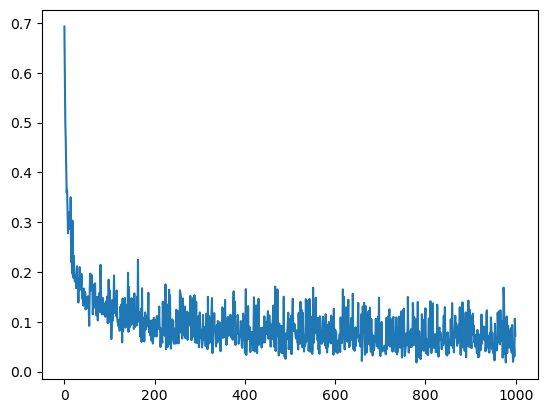

Activated Output [0.99960053 0.00023268 0.05209148 0.12640231 0.04249727 0.99999972
 0.00005732 0.1278043  1.         0.04188711 0.99017288 0.00088283
 0.0000578  0.02542611 0.89355257 0.99866648 1.         0.00003311
 0.01310813 0.35054505 0.00115458 0.99359028 0.98655779 0.90134647
 0.97014244 0.02973246 0.99999857 0.99999996 0.99284422 0.00324131
 0.00003364 0.62497324 0.55049334 0.03133037 0.98860371 0.29144656
 0.00888353 0.99999996 0.99995618 0.0004343  0.008081   0.00044105
 0.00030734 0.02328308 0.01941871 0.99998005 0.04139723 0.00465932
 0.55450552 0.08704715 0.99843602 0.0000376  0.99997971 0.01865037
 0.00613797 0.0000473  0.01610192 0.00025286 0.02322524 0.00186323
 1.         0.01334317 0.01807314 0.00191743]
Max accuracy: 1.00000
Accuracy: 0.93750


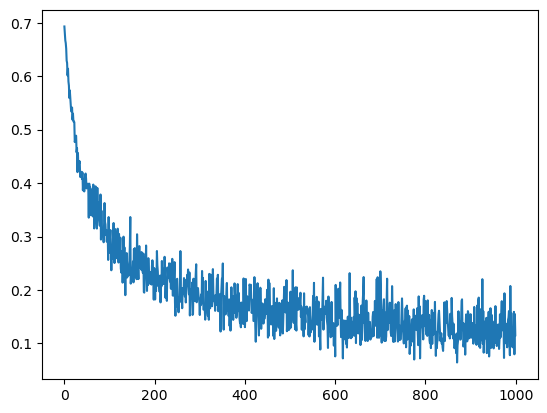

Activated Output [0.0351512  0.09885986 0.0048083  0.53844326 0.0734864  0.00899339
 0.98072002 0.38316611 0.04555007 0.05090116 0.02035164 0.04362401
 0.03537964 0.12816338 0.98442772 0.01864517 0.00292995 0.99972051
 0.00534037 0.06747887 0.02120189 0.1418831  0.00704874 0.99993702
 0.99874065 0.07995856 0.99822294 0.04208979 0.36459602 0.59508417
 0.21627348 0.02448544 0.02986617 0.01042874 0.08251745 0.14218473
 0.74432135 0.00451874 0.999981   0.03809406 0.02533751 0.99558008
 0.05127448 0.99999435 0.06227635 0.01240554 0.01221301 0.36298506
 0.38991648 0.99947455 0.99999956 0.33496219 0.00900203 0.05879497
 0.999772   0.0378846  0.87746811 0.68146809 0.05066882 0.10437661
 0.17689942 0.03595075 0.1381155  0.02505721]
Max accuracy: 1.00000
Accuracy: 0.96875


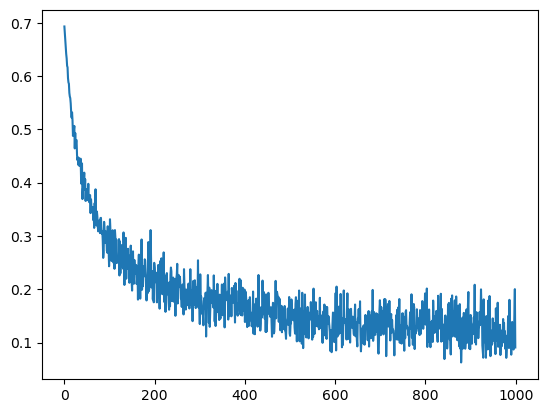

Activated Output [0.01580145 0.99763223 0.00579999 0.01431945 0.9998156  0.99867907
 0.75611432 0.08694886 0.03246663 0.24034192 0.04167473 0.11431182
 0.03854044 0.01275827 0.9821128  0.0225843  0.01101091 0.99992237
 0.9103958  0.02445228 0.55348085 0.00314073 0.33167422 0.19760291
 0.89362958 0.81055698 0.13874428 0.99949691 0.14134343 0.99194826
 0.29574122 1.         0.89231188 0.03484036 0.99876779 0.04983168
 0.03163829 0.98456003 0.02565248 0.07345792 0.0250696  0.99943087
 0.00741917 0.99442696 0.08580263 0.19252589 0.07473717 0.06105214
 0.17234603 0.10002985 0.99723454 0.9782881  0.65880621 0.02404328
 0.89318802 0.0148527  0.9482592  0.00773895 0.99997421 0.00225256
 0.45709201 0.01455443 0.00338601 0.08023563]
Max accuracy: 1.00000
Accuracy: 0.95312


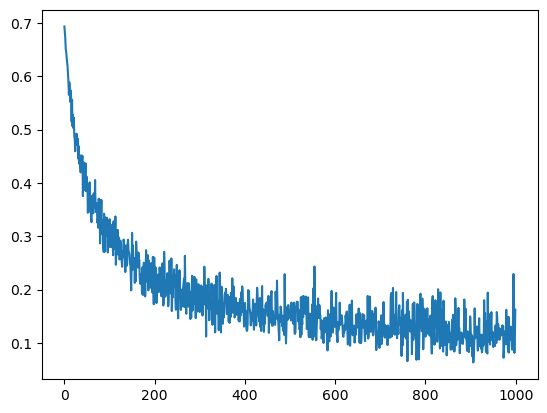

Activated Output [0.00318385 0.04788871 0.00258473 0.0049703  0.04963967 0.03208355
 0.0291366  0.09504919 0.04693416 0.19010381 0.45089521 0.03334092
 0.05694525 0.98902843 0.999999   0.99952752 0.99835613 0.02013491
 0.02338326 0.98527227 0.04173789 0.07673562 0.38944065 0.00697637
 0.03337336 0.09009646 0.00154875 0.00664254 0.75415008 0.01075951
 0.78636135 0.08419391 0.02094412 0.19980777 0.9339571  0.00893692
 0.01503114 0.02970109 0.00328392 0.8981391  0.04299295 0.04830394
 0.00403957 0.21981132 0.99973338 0.61834219 0.87160839 0.31664476
 0.03970405 0.98594852 0.09196313 0.98302472 0.99918966 0.98382636
 0.29302361 0.27396088 0.99997554 0.93131821 0.07723251 0.55508212
 0.00197806 0.03862311 0.79836284 0.31649448]
Max accuracy: 1.00000
Accuracy: 0.93750


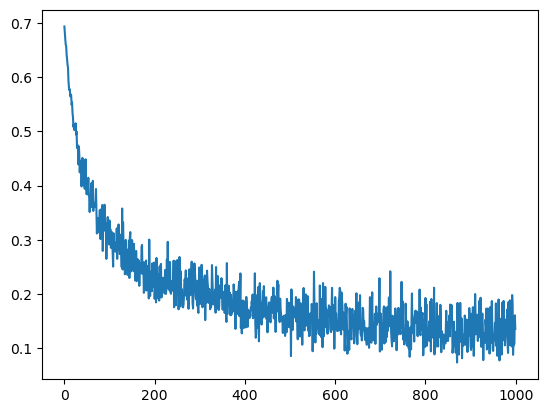

Activated Output [0.81794778 0.7264472  0.97633772 0.5725764  0.98439748 0.90746938
 0.92065223 0.00614112 0.00694941 0.89002784 0.00149946 0.01892207
 0.00382493 0.19107463 0.15762219 0.06891285 0.36090137 0.00543565
 0.98215374 0.02906207 0.99948874 0.21786421 0.01709651 0.00500385
 0.99733125 0.05423688 0.42247304 0.07482847 0.59211832 0.53657949
 0.00710851 0.99000811 0.01147848 0.08799009 0.0253945  0.97434891
 0.00589978 0.12684269 0.82876992 0.99963842 0.27109368 0.14647411
 0.99999666 0.99782052 0.16340831 0.99999806 0.03507911 0.01312428
 0.11113705 0.01904119 0.07416943 0.03875908 0.23669451 0.99803845
 0.45003209 0.26293684 0.99734255 0.48426377 0.03609294 0.9975701
 0.07298829 0.02656315 0.18264693 0.98319014]
Max accuracy: 1.00000
Accuracy: 0.96875


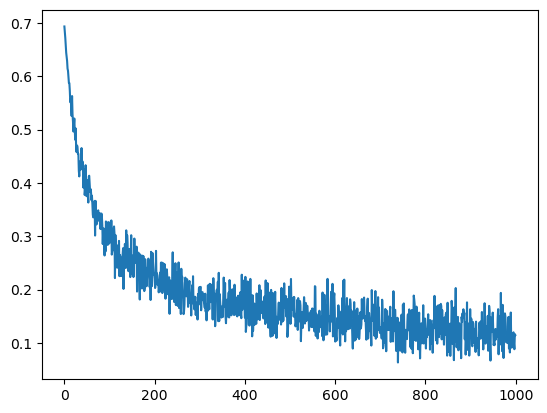

Activated Output [0.13969129 0.02108317 0.81621256 0.07252176 0.99623741 0.00569872
 0.99999482 0.97653712 0.99999862 0.039347   0.99914963 0.99135113
 0.08993502 0.98764586 0.27354962 0.98656396 0.09129903 0.99876712
 0.09989757 0.08634084 0.01718159 0.52714023 0.04668603 0.08591262
 0.06667032 0.90533509 0.04669472 0.98449849 0.04301494 0.98908096
 0.91606406 0.19999379 0.04921031 0.03958351 0.07940336 0.34825712
 0.91491687 0.02353244 0.05624118 0.9993619  0.99801853 0.99793103
 0.190839   0.21924256 0.0345906  0.07667012 0.14931295 0.03063423
 0.99574776 0.93378325 0.50880991 0.02222959 0.05247916 0.2791914
 0.90345642 0.3832744  0.11779736 0.03877963 0.99865703 0.99830506
 0.05838679 0.01886948 0.00721445 0.4777654 ]
Max accuracy: 1.00000
Accuracy: 0.95312


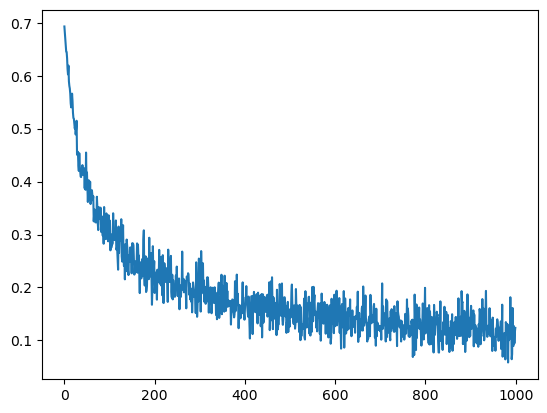

Activated Output [0.68950424 0.04131914 0.87614002 0.06356211 0.16438375 0.07961617
 0.99999429 0.86864245 0.50953433 0.31349174 0.45378685 0.63863344
 0.08562669 0.99296478 0.92044938 0.99978984 0.92784123 0.04675017
 0.99998962 0.00721369 0.99999919 0.02737944 0.99961141 0.10388696
 0.99992238 0.99888559 0.00307611 0.97781014 0.03071178 0.97496468
 0.04688062 0.99238057 0.90654374 0.92438656 0.05126208 0.09218766
 0.03202984 0.12635575 0.02688285 0.00398038 0.31247534 0.10677259
 0.35678383 0.04690931 0.96089871 0.01376423 0.08582613 0.9999395
 0.02530202 0.9999845  0.0060477  0.00231422 0.91157572 0.97156262
 0.21185899 0.82821427 0.03117258 0.89563852 0.08256864 0.00196182
 0.91520537 0.1196306  0.13577531 0.03055131]
Max accuracy: 1.00000
Accuracy: 0.93750


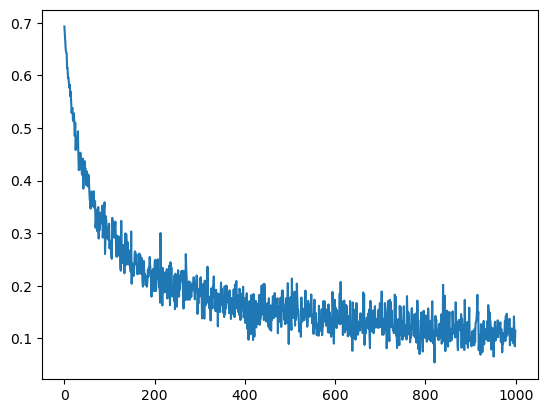

Activated Output [0.06805538 0.93962897 0.9986963  0.95787763 0.99700028 0.09671681
 0.06050836 0.13846826 0.11378126 0.13293595 0.95707252 0.00822356
 0.98601481 0.99969144 0.00081627 0.99436967 0.14124082 0.86607272
 0.03905659 0.00714674 0.02950622 0.01751057 0.05224353 0.1338222
 0.09575262 0.09340569 0.06036373 0.99288011 0.97895837 0.99828792
 0.97088586 0.00564688 0.26597645 0.00605054 0.04187086 0.03020913
 0.0182645  0.02771526 0.87792527 0.47559137 0.76713933 0.61053607
 0.07532866 0.28120053 0.01467751 0.03652346 0.45400263 0.91185508
 0.99998789 0.63639046 0.01594076 0.98400592 0.14516122 0.95504227
 0.98366998 0.32253337 0.07771121 0.99919667 0.99961148 0.00240897
 0.12761138 0.03444406 0.07827333 0.88986473]
Max accuracy: 1.00000
Accuracy: 0.98438


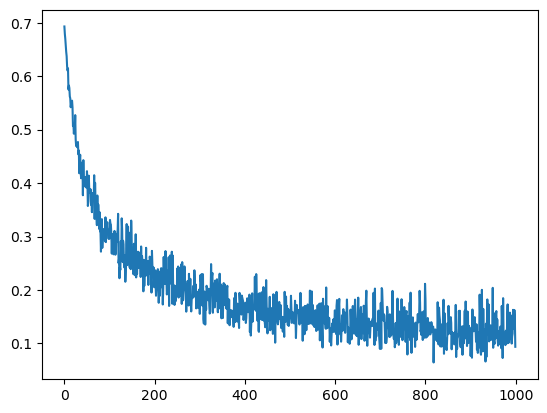

Activated Output [0.0620816  0.07651953 0.99990256 0.25015328 0.93355107 0.22139642
 0.05454421 0.89352102 0.99173402 0.03889124 0.99953974 0.11118383
 0.26186464 0.03354911 0.17368879 0.04133531 0.90867565 0.17614091
 0.0428593  0.14189859 0.00350037 0.33038265 0.00477908 0.86451786
 0.98432403 0.2728816  0.04364196 0.99998323 0.0135456  0.04016846
 0.9878534  0.07950282 0.23923936 0.01296048 0.00604384 0.03015009
 0.59926741 0.01638315 0.00540897 0.01919285 0.09979134 0.12581716
 0.06870667 0.99999102 0.99182762 0.03042814 0.99358114 0.98530893
 0.94095406 0.01404139 0.007361   0.97472345 0.96882669 0.04378225
 0.32987024 0.30192695 0.99870883 0.03476956 0.99577121 0.99999974
 0.12549371 0.99162086 0.03713594 0.29434095]
Max accuracy: 1.00000
Accuracy: 0.92188


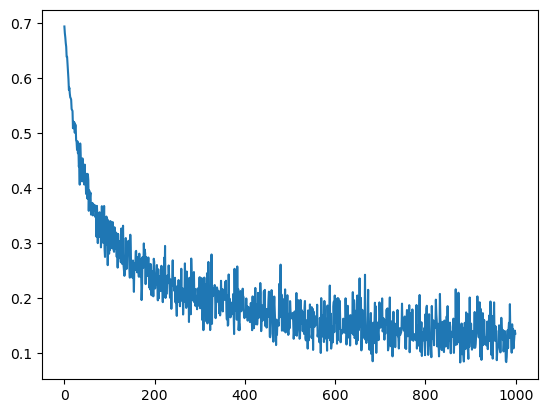

Activated Output [0.04130251 0.62599467 0.02222177 0.99046539 0.6191363  0.16697259
 0.28663589 0.01364736 0.99952082 0.01345384 0.00154476 0.17265362
 0.09134294 0.08294837 0.22955782 0.02104155 0.01292516 0.00318016
 0.03941471 0.00380791 0.99776104 0.90513706 0.23266615 0.99590511
 0.36654355 0.02129121 0.56033027 0.02438675 0.97352136 0.99846593
 0.99965989 0.06485178 0.02104131 0.01016781 0.07627958 0.0183977
 0.13375725 0.18792089 0.57175617 0.04420918 0.29250575 0.0086254
 0.06377463 0.9235613  0.42621649 0.01434297 0.97901449 0.00491556
 0.01577509 0.24547864 0.9983632  0.99602685 0.17694594 0.08491166
 0.45656173 0.84026782 0.43352231 0.00711631 0.00373594 0.04593798
 0.80291881 0.09651059 0.06321873 0.08629553]
Max accuracy: 1.00000
Accuracy: 0.93750


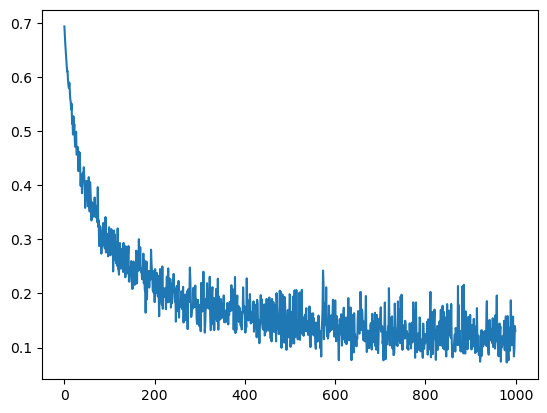

Activated Output [0.02688747 0.03723766 0.096249   0.99086929 0.99878336 0.00394983
 0.3374587  0.99304117 0.30255101 0.02885016 0.99960091 0.2364846
 0.08285197 0.04104752 0.03716183 0.02658375 0.0297837  0.11534668
 0.63252612 0.03232437 0.99816948 0.98294263 0.96122066 0.97180383
 0.97567618 0.99876749 0.0322627  0.06478473 0.03742609 0.10882799
 0.99979192 0.00253605 0.01268451 0.66062606 0.19480886 0.06707105
 0.99026906 0.93363769 0.90616429 0.1121012  0.85645613 0.99844149
 0.99888813 0.78580663 0.0012624  0.05058496 0.99745628 0.02515238
 0.88472898 0.92839789 0.17323823 0.99999811 0.99677325 0.62034438
 0.01185149 0.09785719 0.99986128 0.12625708 0.13012839 0.25206077
 0.26778138 0.30838374 0.14548217 0.2207635 ]


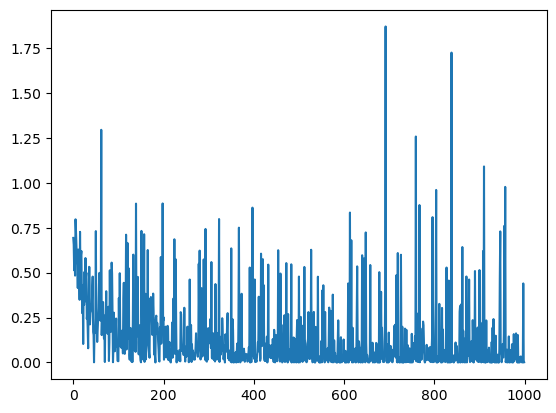

Activated Output [0.00130627]


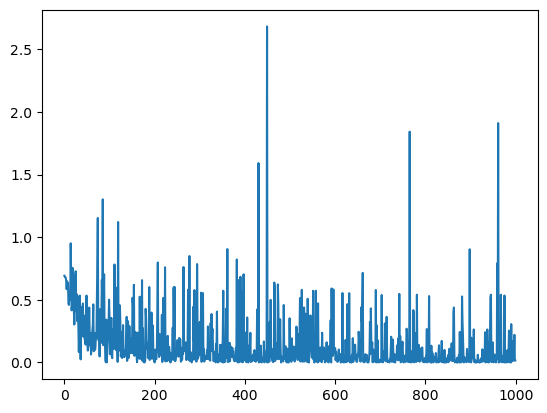

Activated Output [0.98431682]


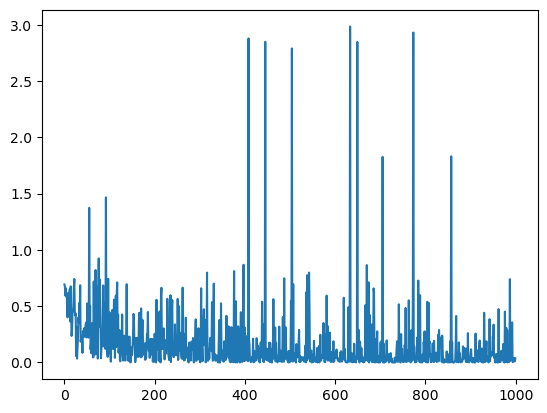

Activated Output [0.03627455]


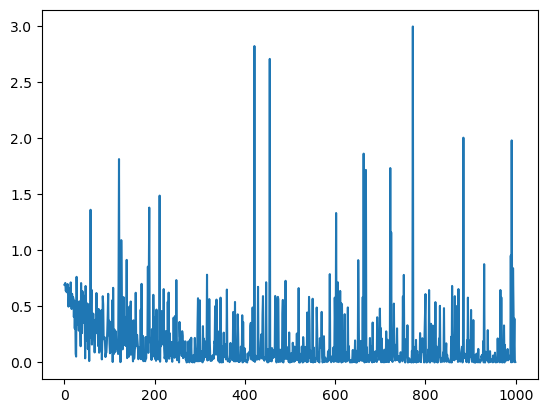

Activated Output [0.00396519]


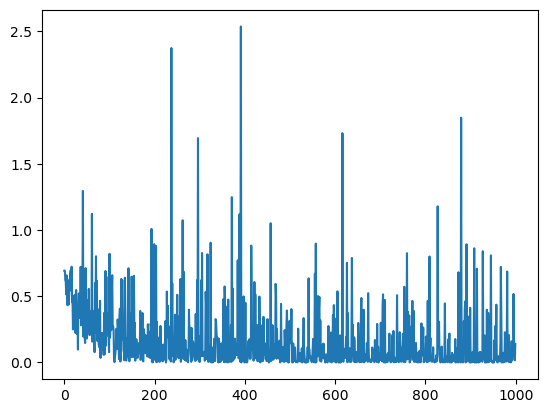

Activated Output [0.87056168]


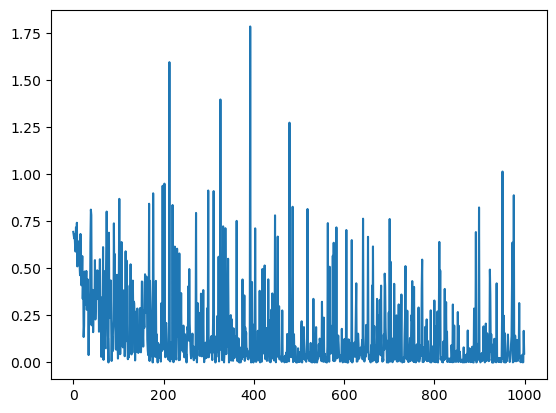

Activated Output [0.04664624]


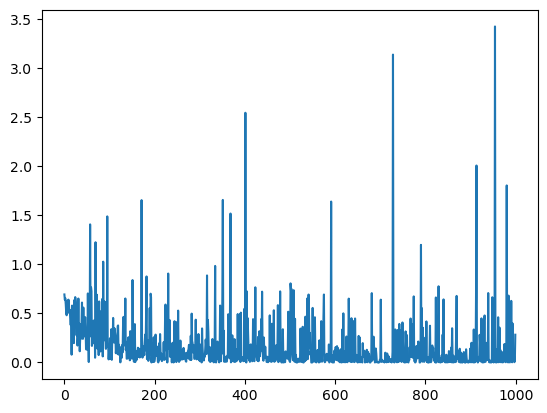

Activated Output [0.24641573]


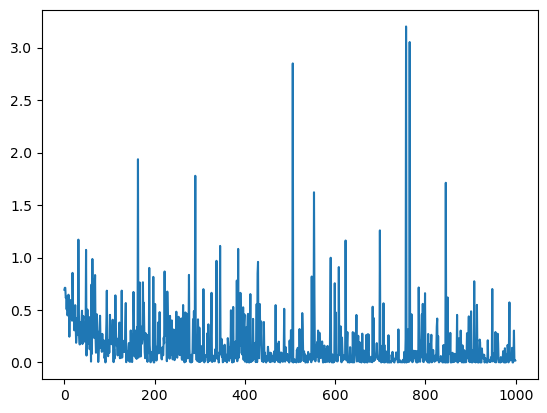

Activated Output [0.01818413]


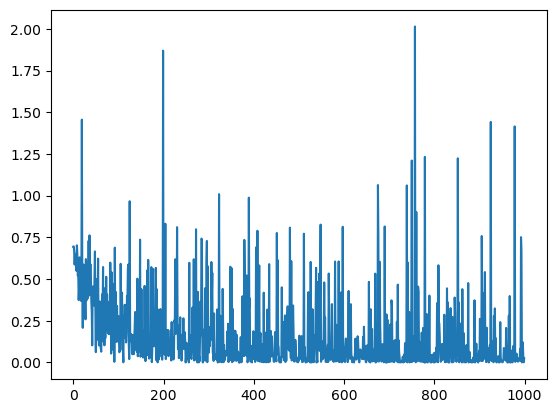

Activated Output [0.02466291]


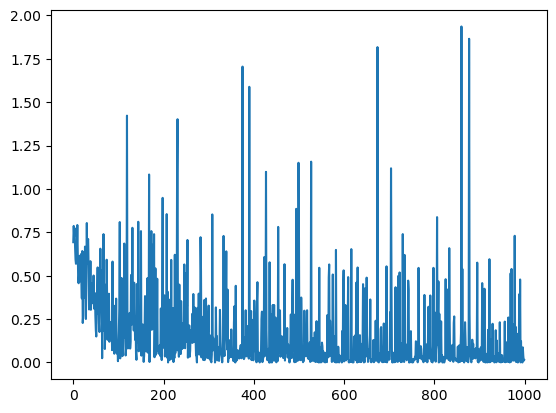

Activated Output [0.98526107]


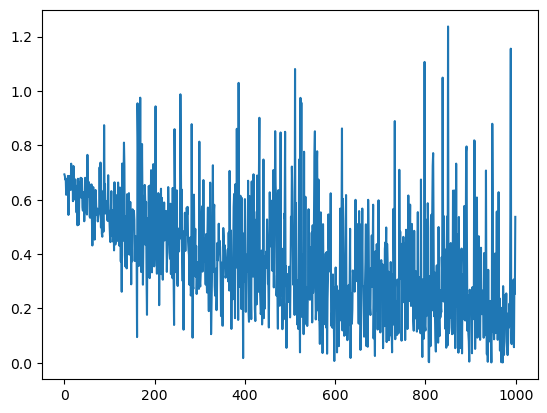

Activated Output [0.41542256]


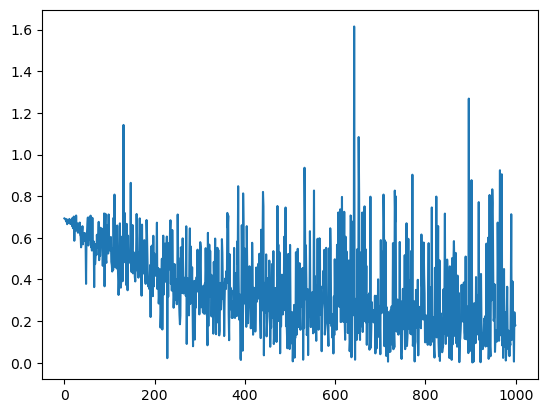

Activated Output [0.16443655]


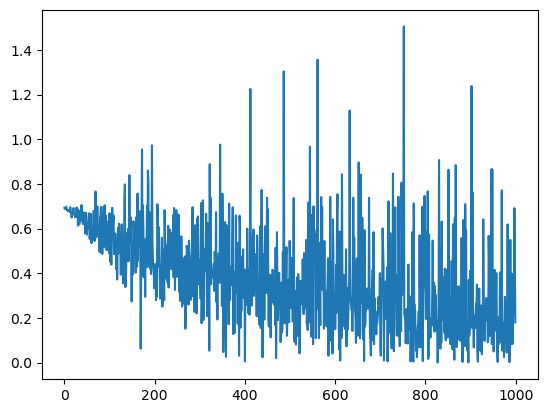

Activated Output [0.83573173]


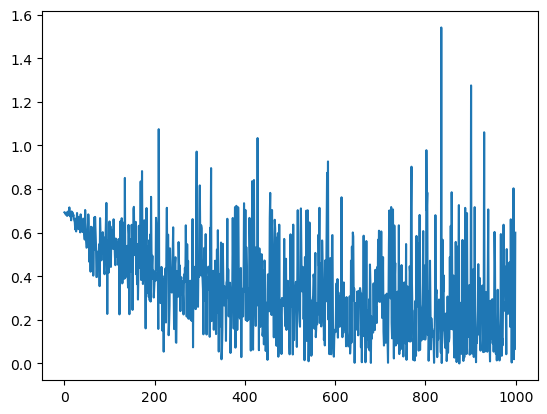

Activated Output [0.45114657]


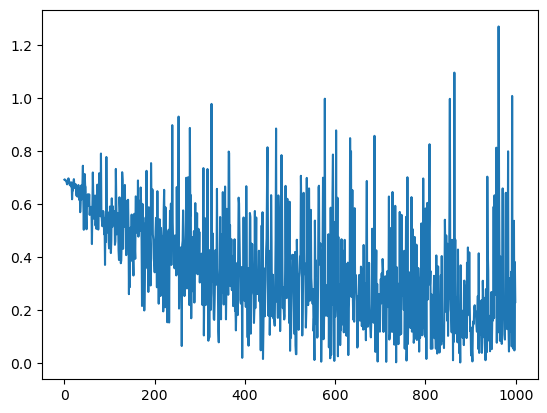

Activated Output [0.79369418]


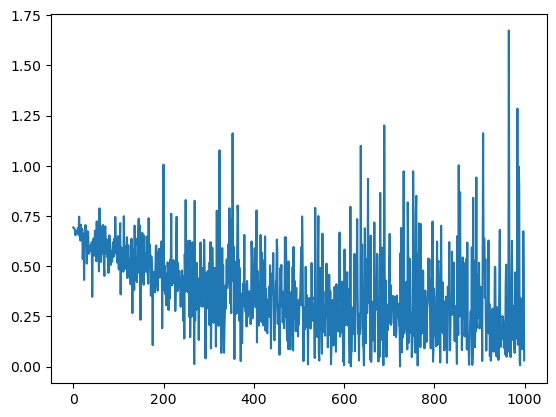

Activated Output [0.97003385]


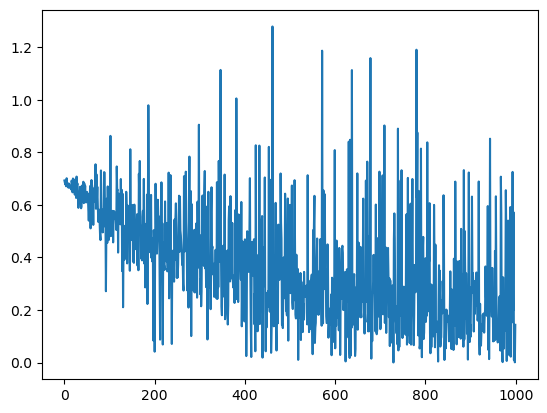

Activated Output [0.13385524]


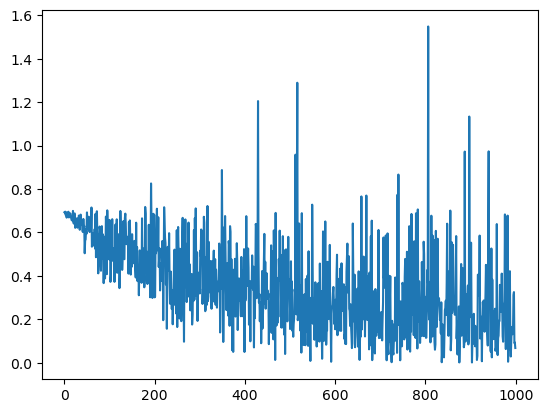

Activated Output [0.06536766]


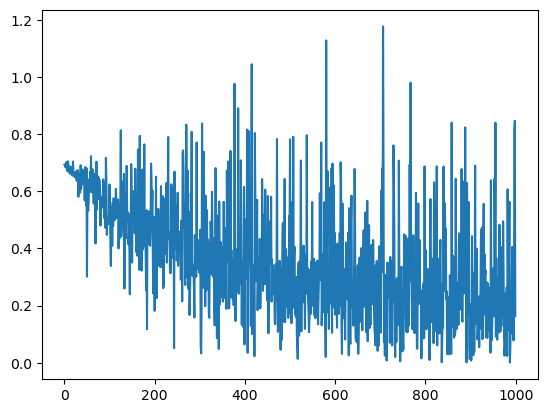

Activated Output [0.15045267]


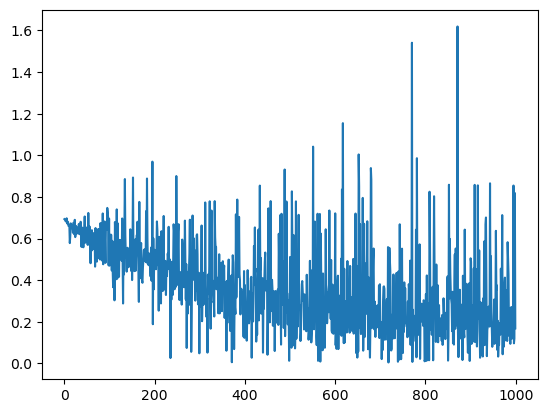

Activated Output [0.84508447]


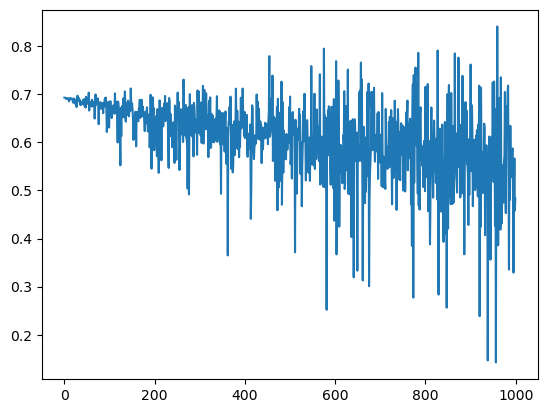

Activated Output [0.38320066]


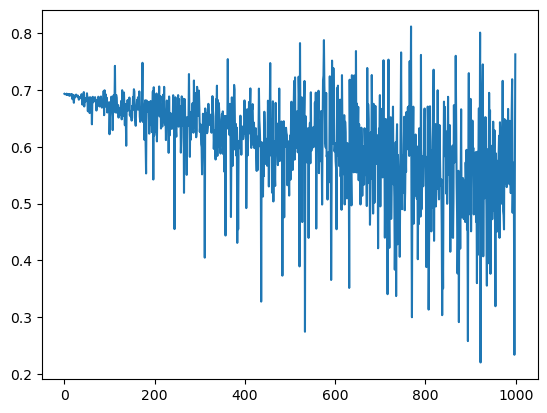

Activated Output [0.53351104]


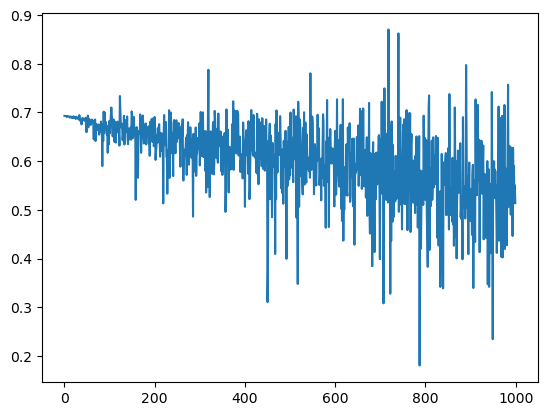

Activated Output [0.40175597]


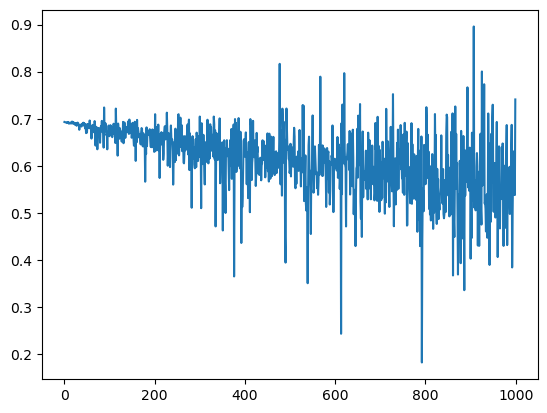

Activated Output [0.52334608]


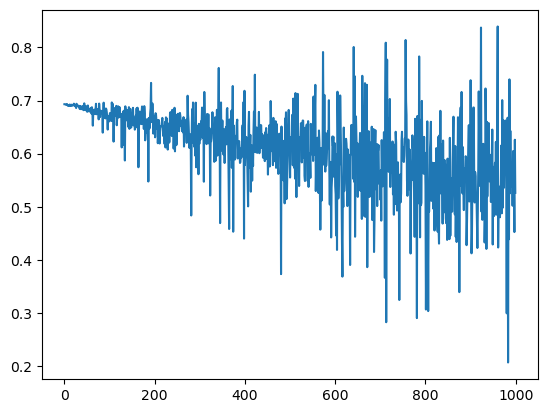

Activated Output [0.40913987]


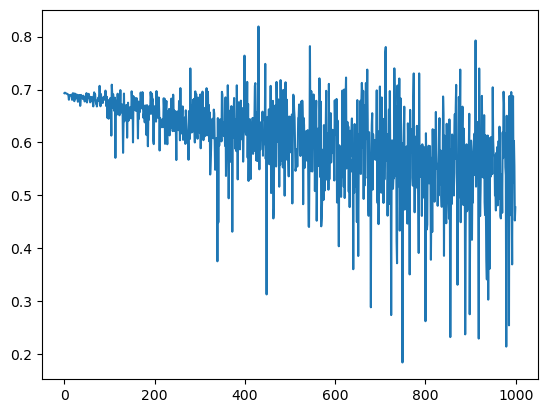

Activated Output [0.37964155]


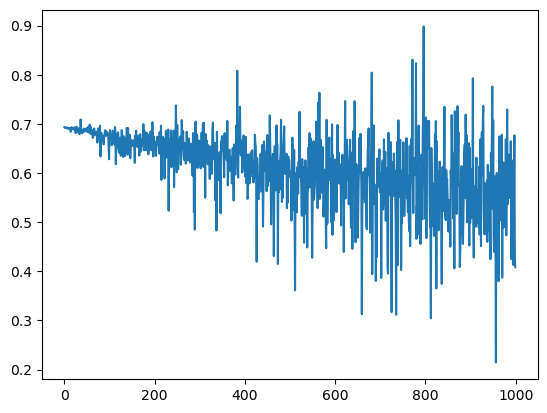

Activated Output [0.66477214]


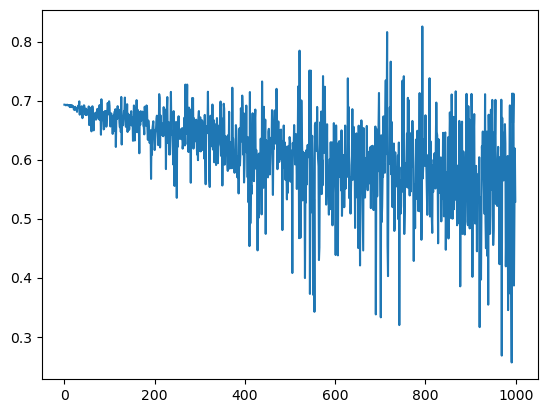

Activated Output [0.58910361]


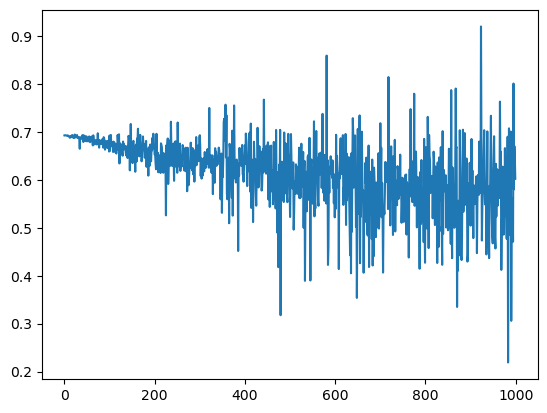

Activated Output [0.45252162]


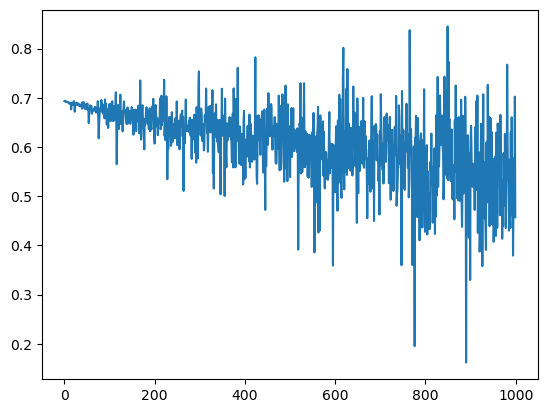

Activated Output [0.6329873]


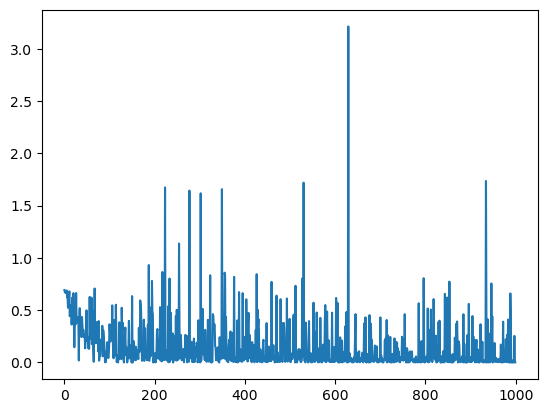

Activated Output [0.00088606]


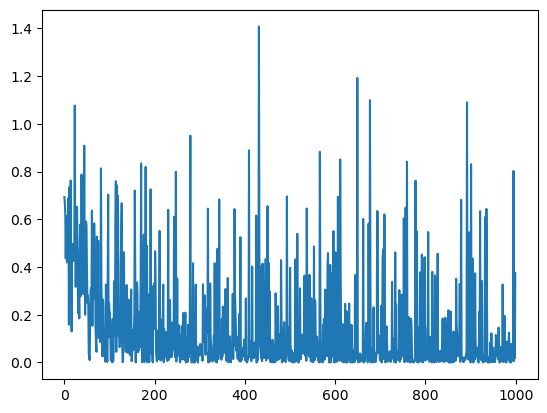

Activated Output [0.68796479]


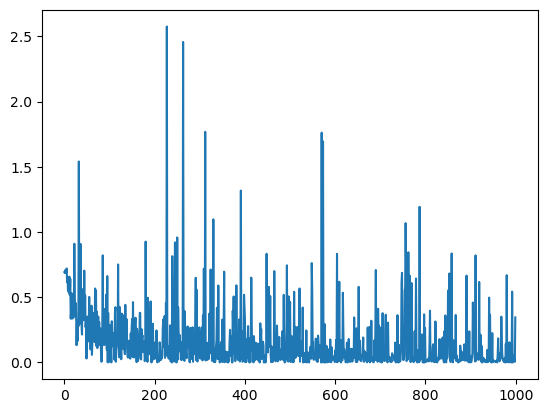

Activated Output [0.29218714]


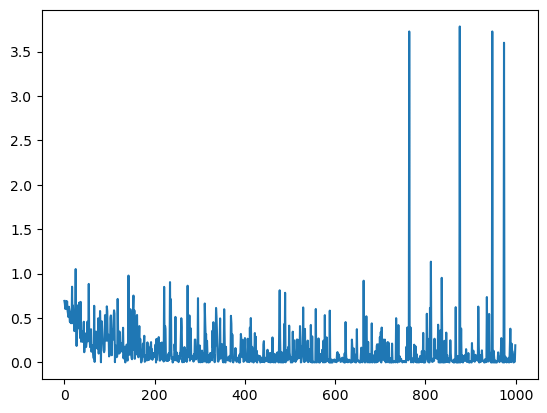

Activated Output [0.17604379]


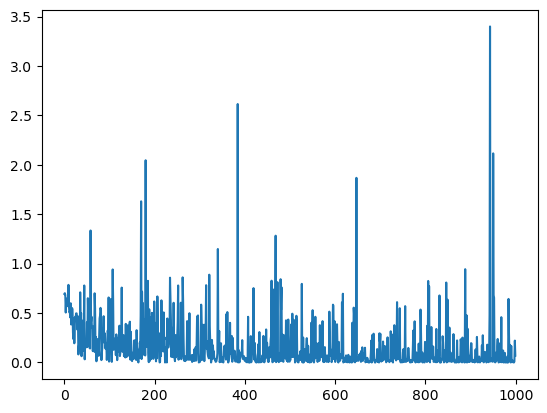

Activated Output [0.06700031]


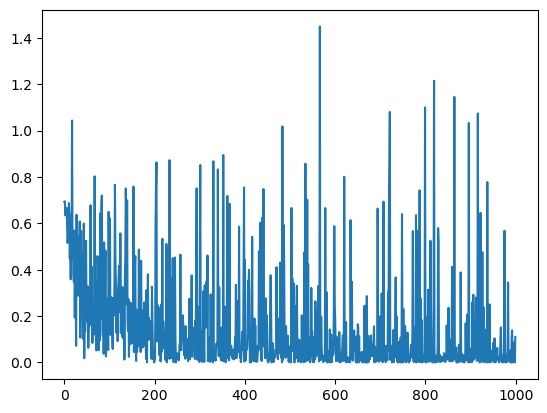

Activated Output [0.10403412]


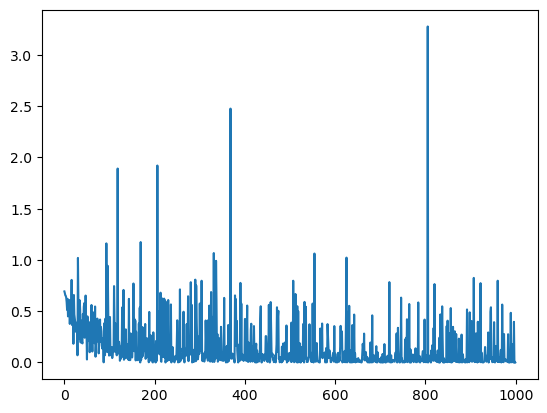

Activated Output [0.99999999]


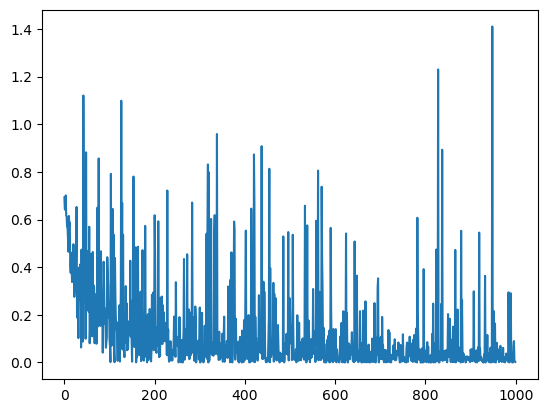

Activated Output [0.0022363]


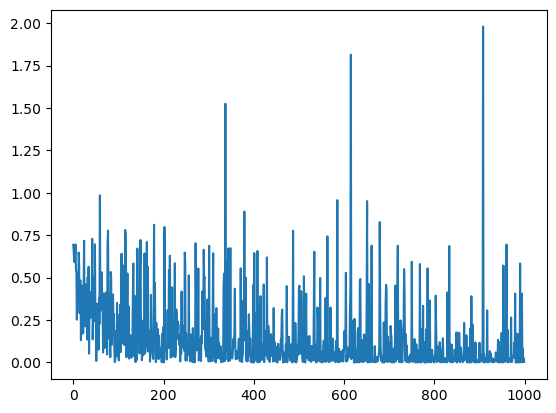

Activated Output [0.00345543]


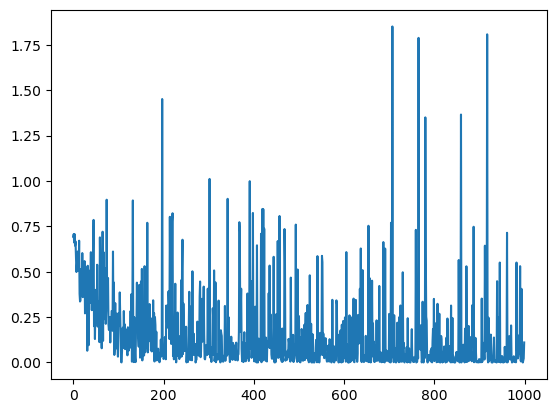

Activated Output [0.10446441]


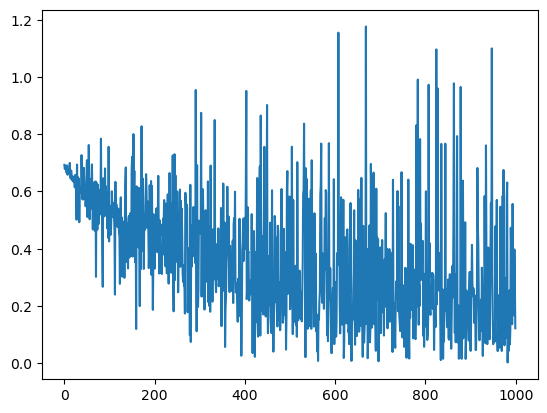

Activated Output [0.1146649]


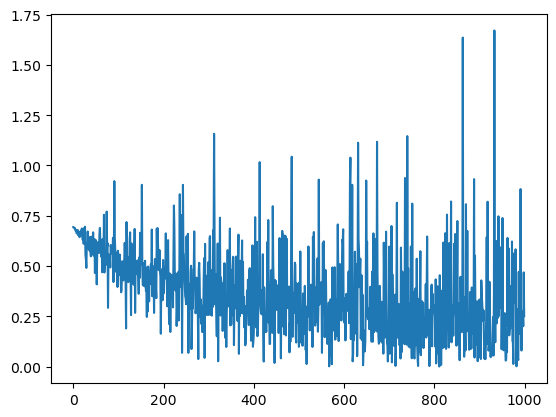

Activated Output [0.22143058]


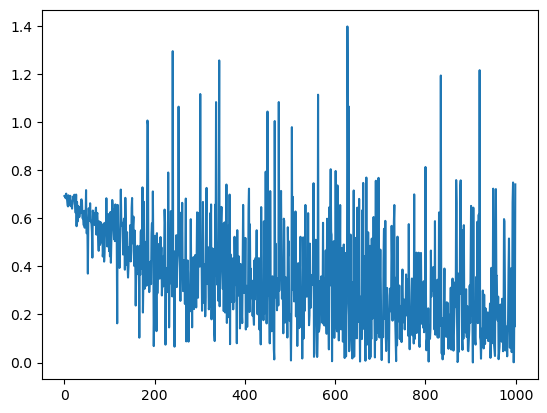

Activated Output [0.52352299]


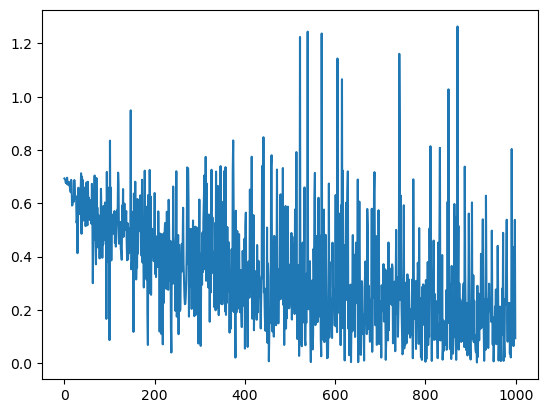

Activated Output [0.91090583]


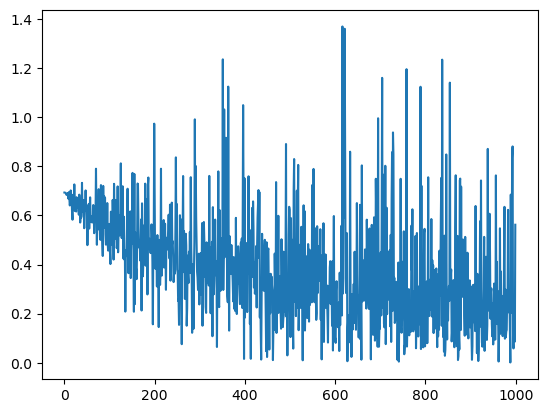

Activated Output [0.42996497]


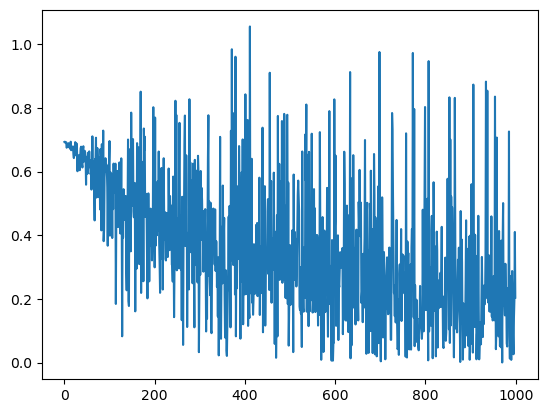

Activated Output [0.18450229]


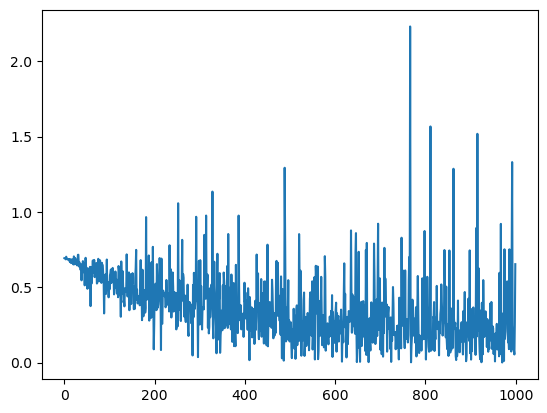

Activated Output [0.52029215]


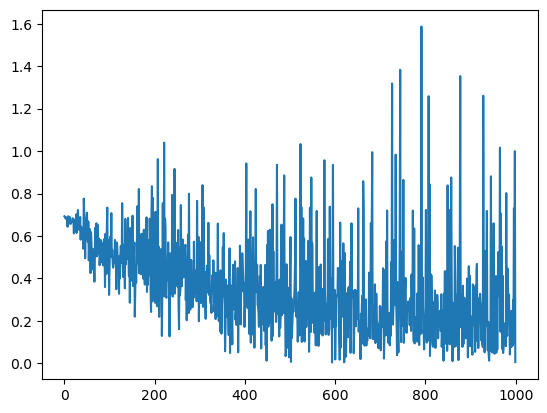

Activated Output [0.99443656]


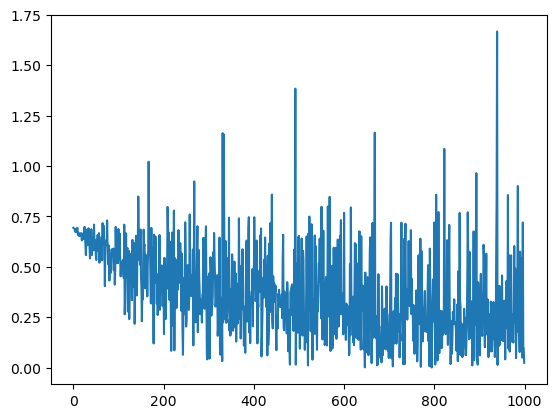

Activated Output [0.97705672]


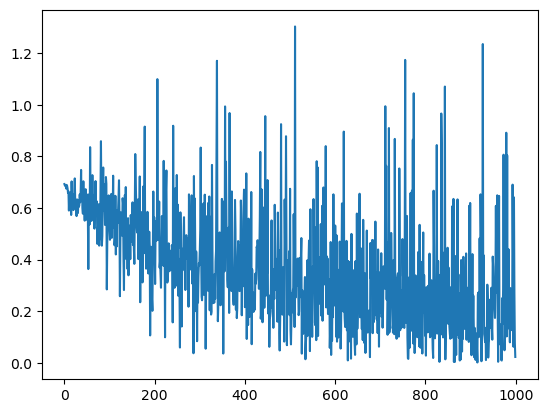

Activated Output [0.9774751]


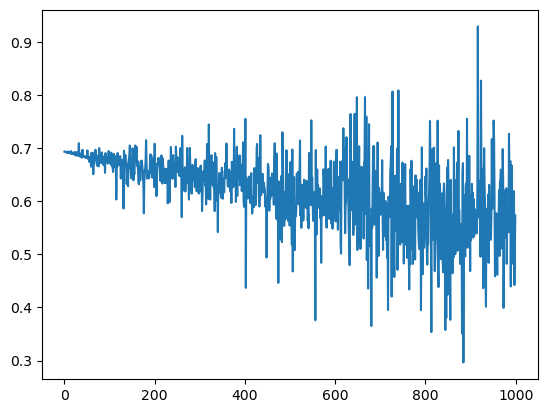

Activated Output [0.56381359]


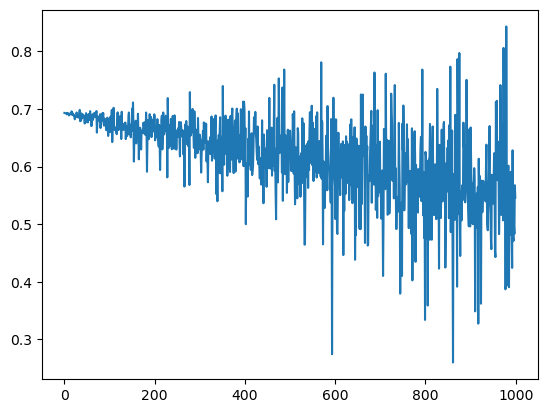

Activated Output [0.42076437]


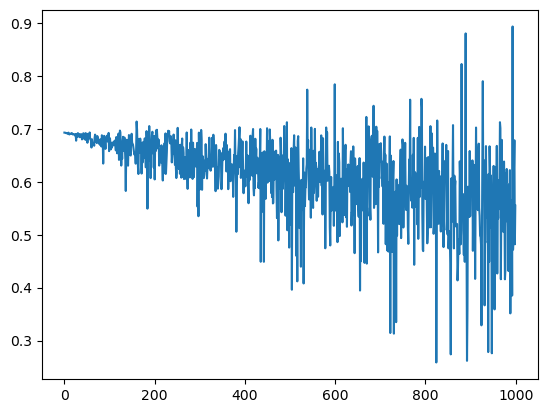

Activated Output [0.42599815]


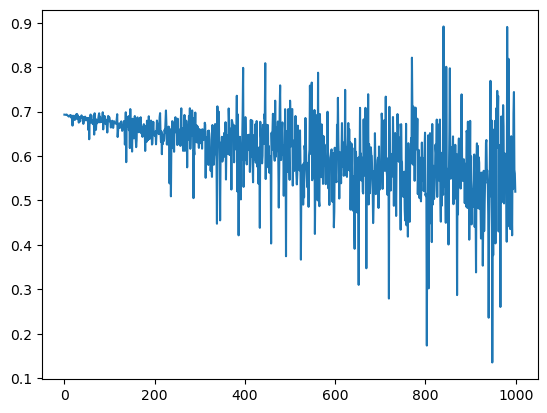

Activated Output [0.40534393]


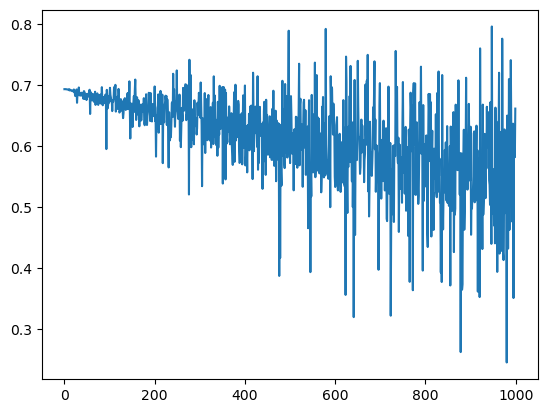

Activated Output [0.51617835]


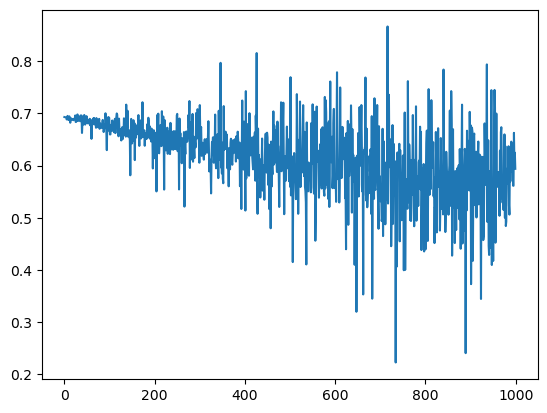

Activated Output [0.44784058]


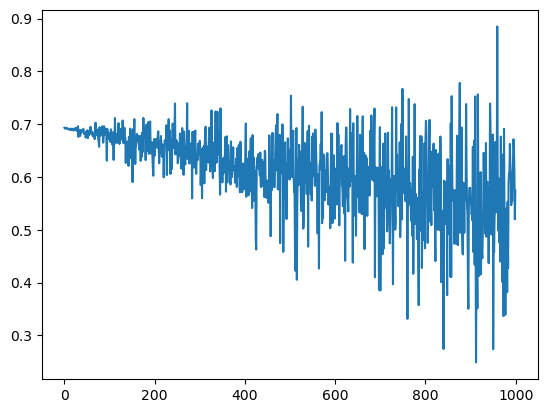

Activated Output [0.43668293]


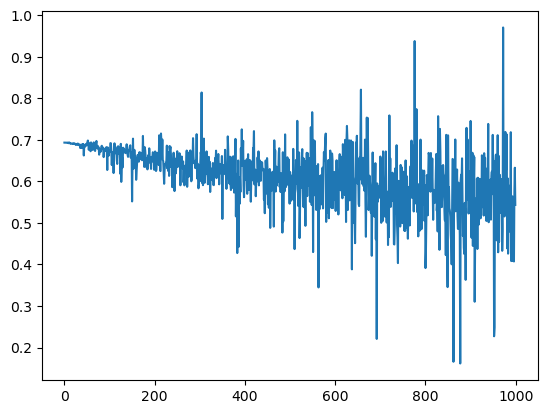

Activated Output [0.41913658]


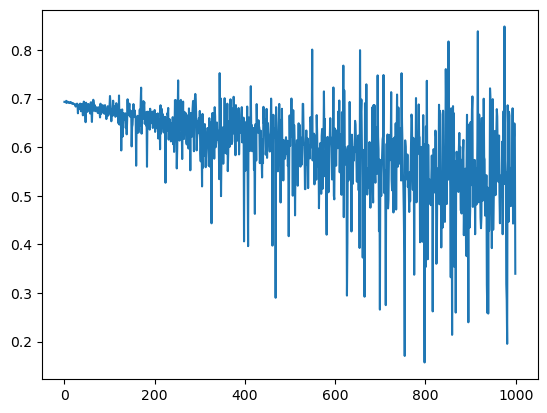

Activated Output [0.7121532]


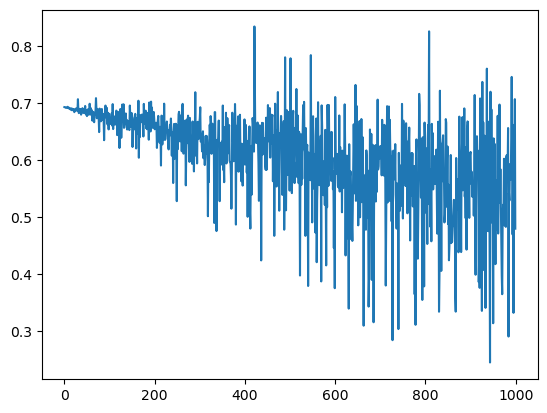

Activated Output [0.38113267]


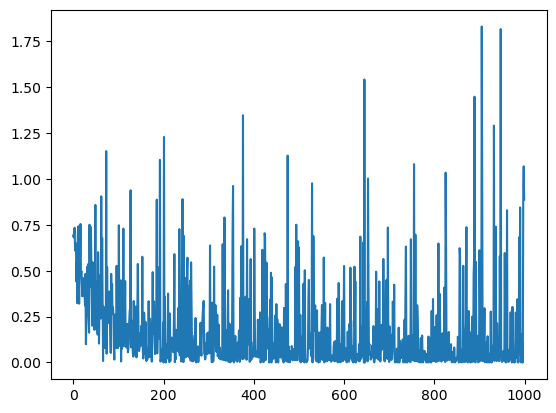

Activated Output [0.41135993]


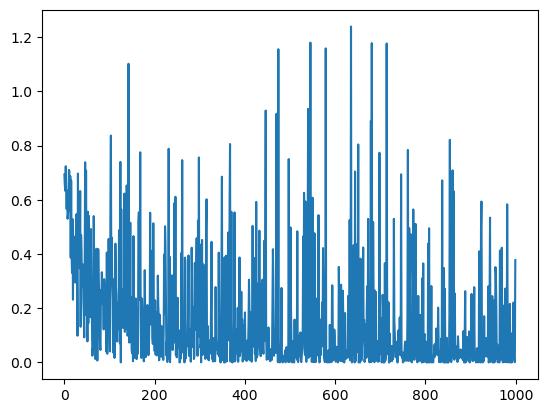

Activated Output [0.31446114]


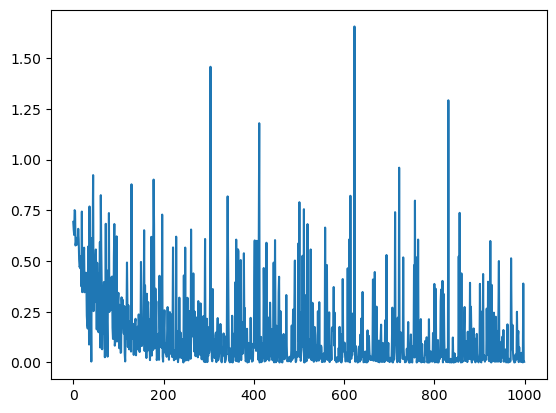

Activated Output [0.99674314]


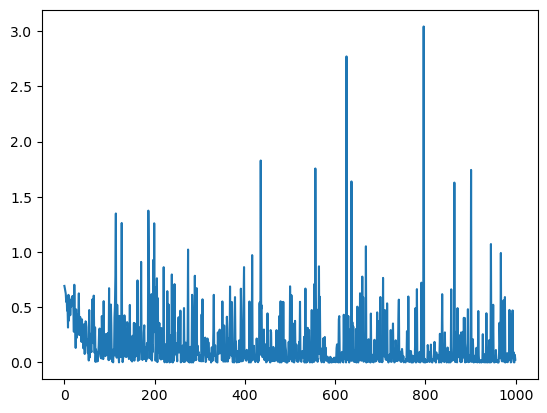

Activated Output [0.02481925]


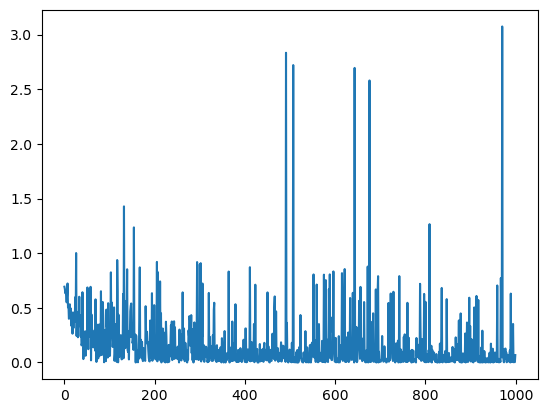

Activated Output [0.0655611]


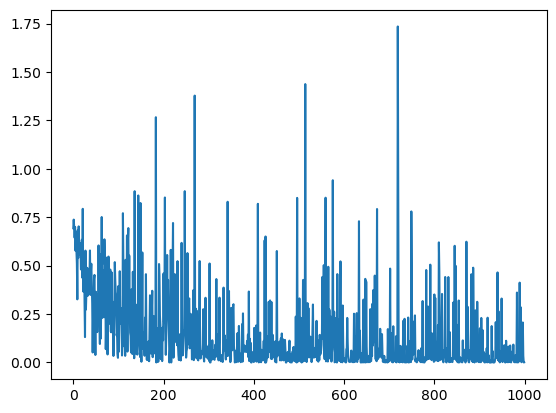

Activated Output [0.99905048]


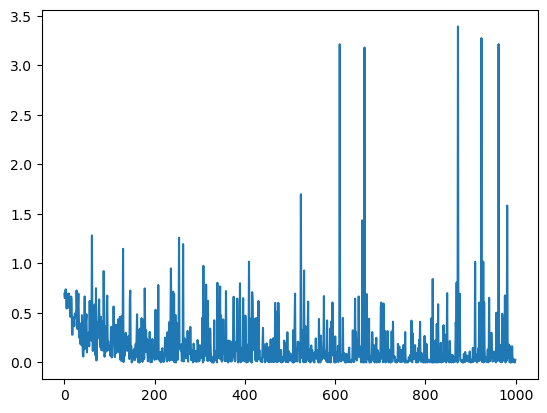

Activated Output [0.02571278]


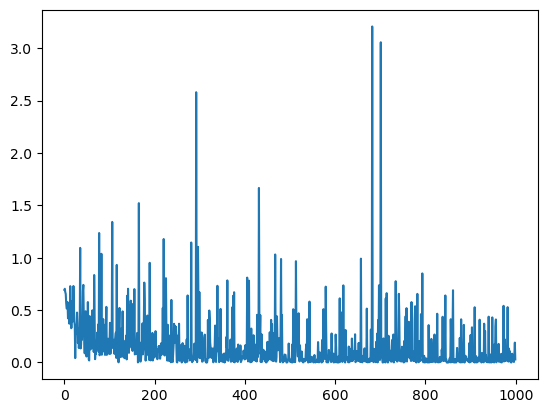

Activated Output [0.97143488]


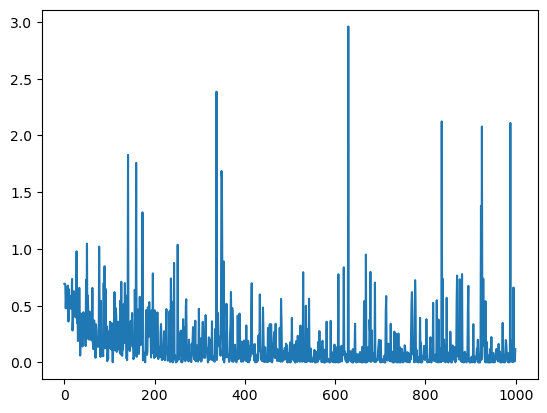

Activated Output [0.11091379]


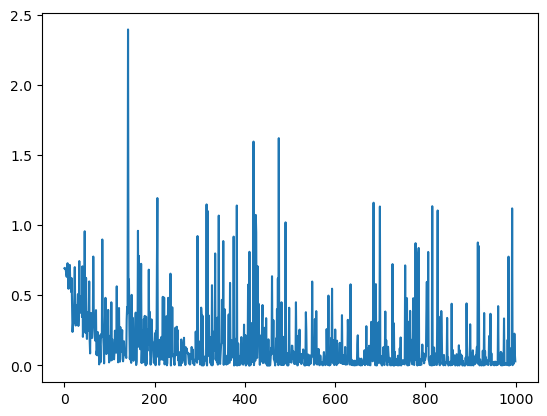

Activated Output [0.02885891]


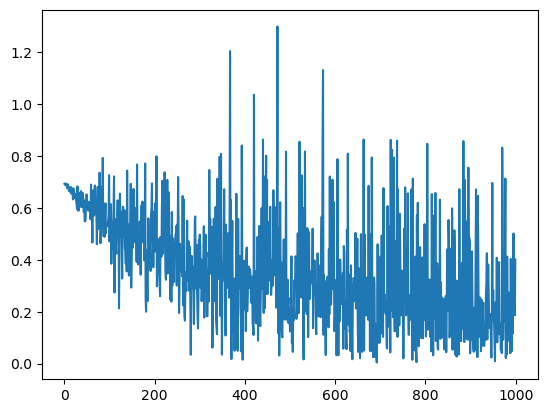

Activated Output [0.33051247]


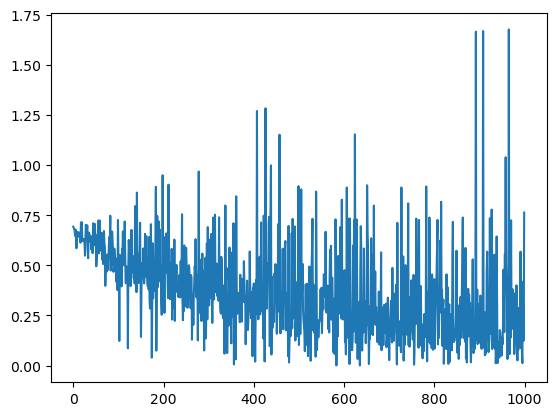

Activated Output [0.46596098]


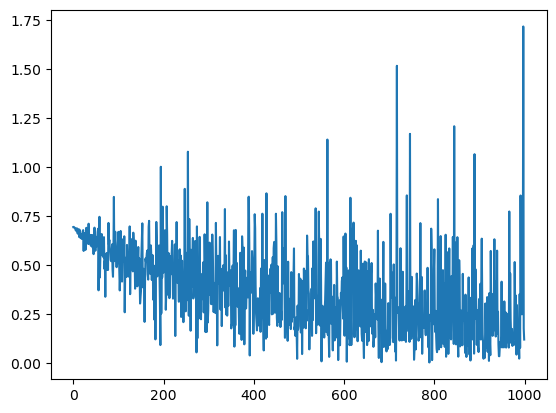

Activated Output [0.11273977]


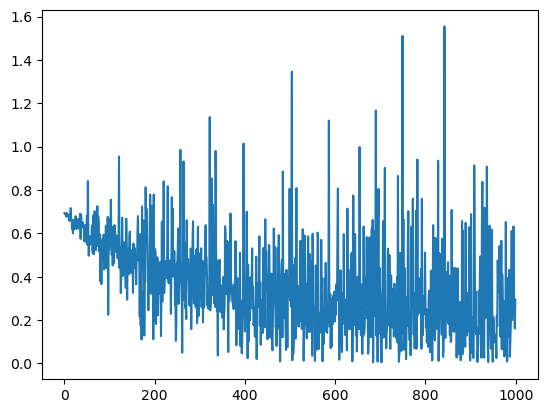

Activated Output [0.74460332]


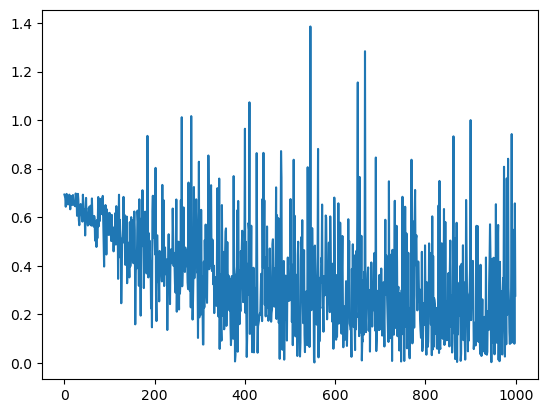

Activated Output [0.24152964]


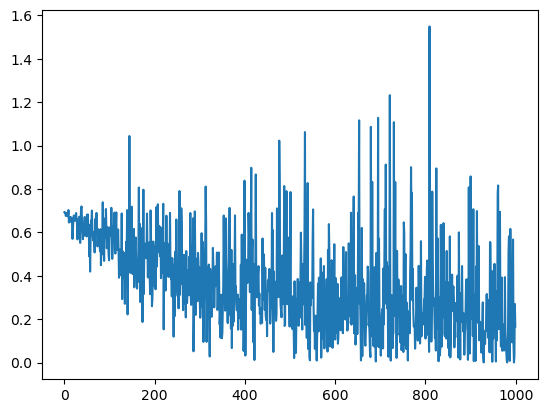

Activated Output [0.152834]


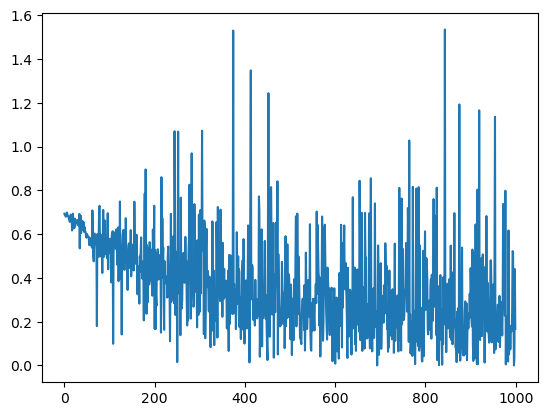

Activated Output [0.15359087]


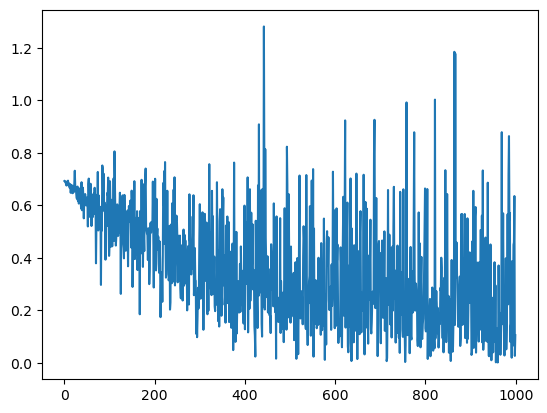

Activated Output [0.89962744]


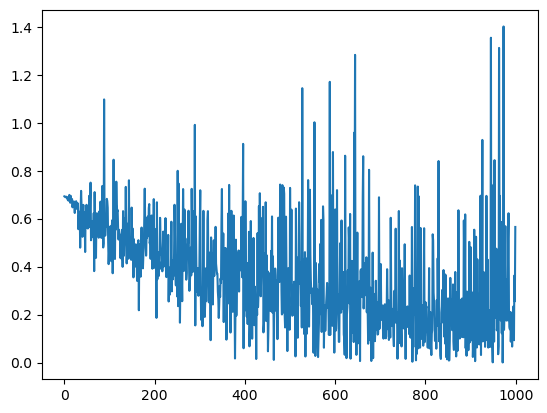

Activated Output [0.56811461]


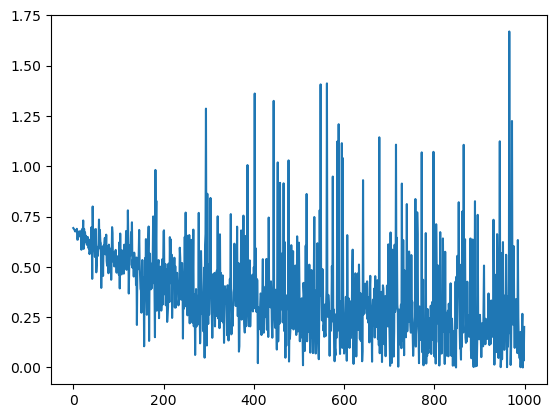

Activated Output [0.18248398]


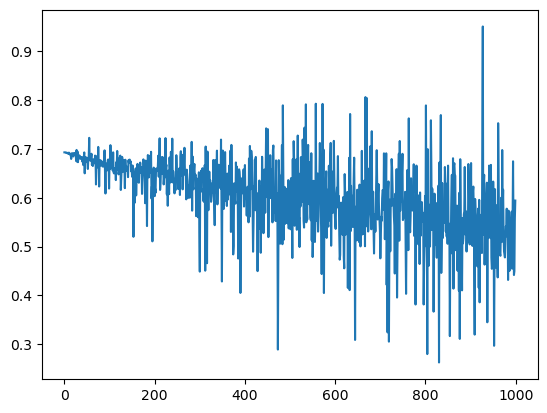

Activated Output [0.55193525]


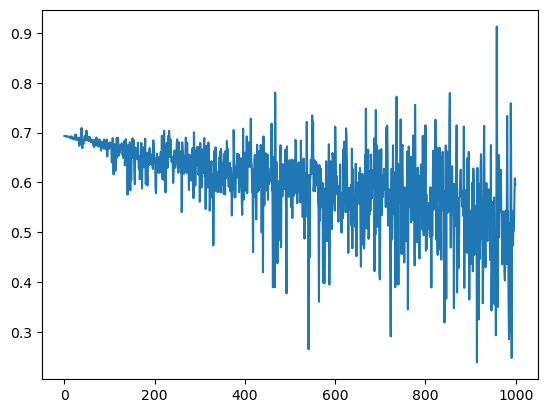

Activated Output [0.44841157]


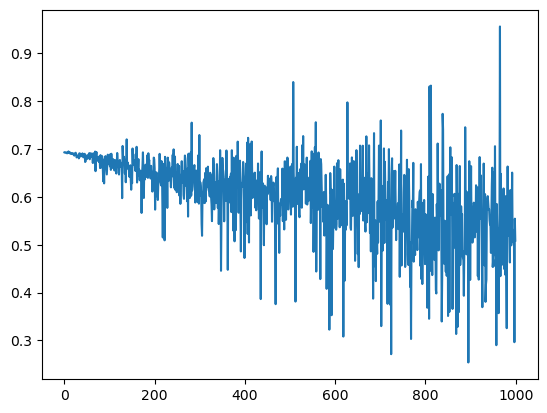

Activated Output [0.60120611]


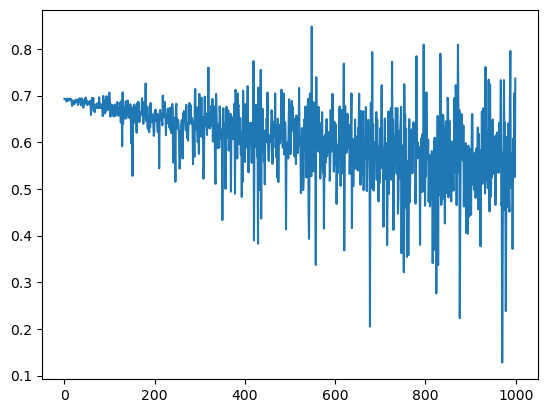

Activated Output [0.52118531]


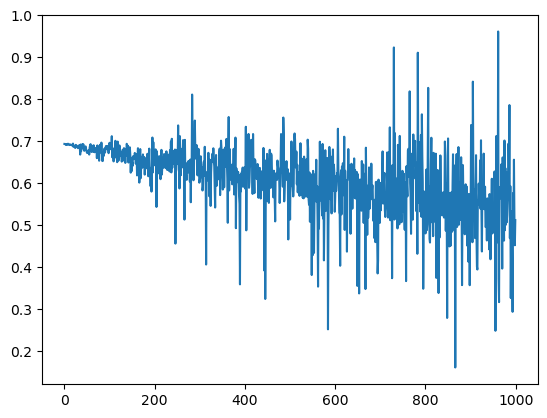

Activated Output [0.40041844]


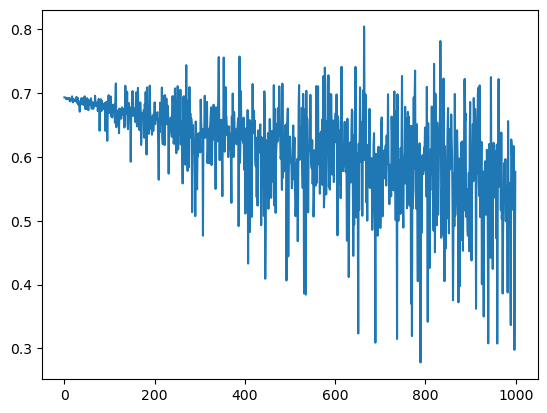

Activated Output [0.43821322]


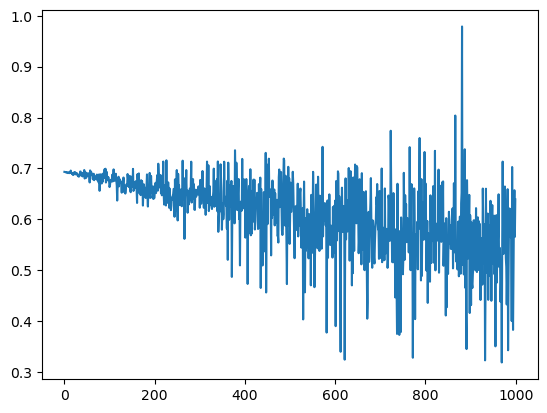

Activated Output [0.47223162]


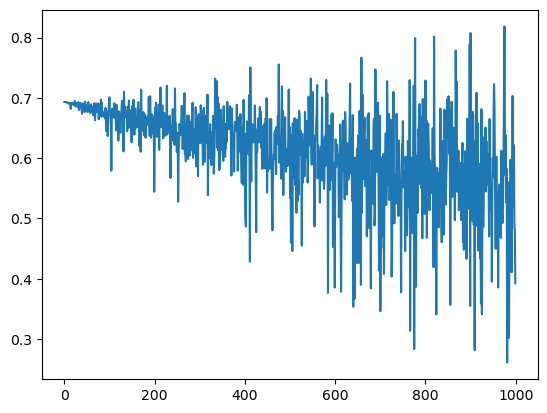

Activated Output [0.67543701]


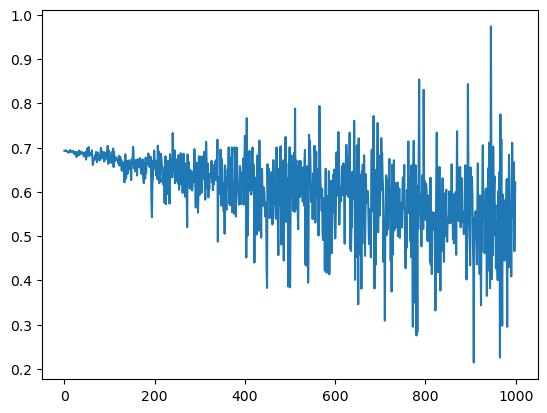

Activated Output [0.53709503]


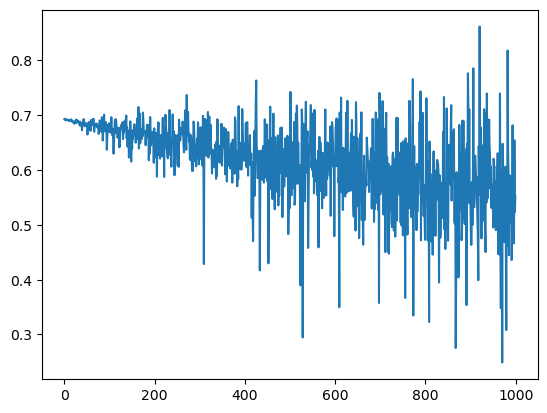

Activated Output [0.42430903]


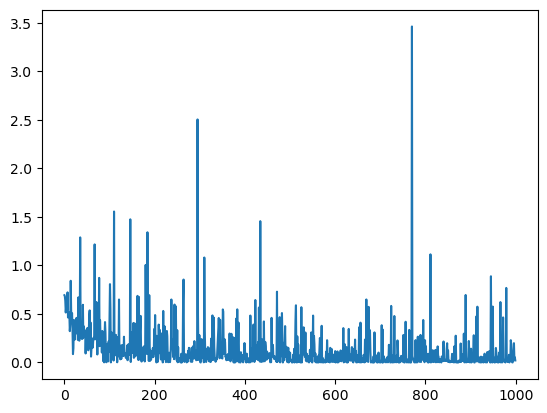

Activated Output [0.02068627]


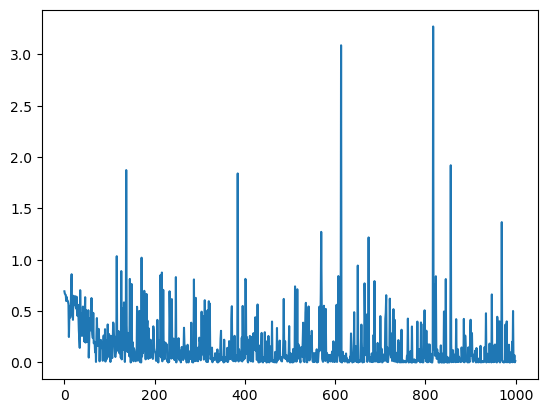

Activated Output [0.01346705]


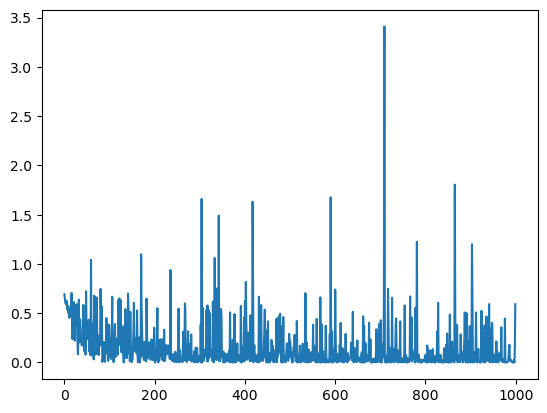

Activated Output [0.55349448]


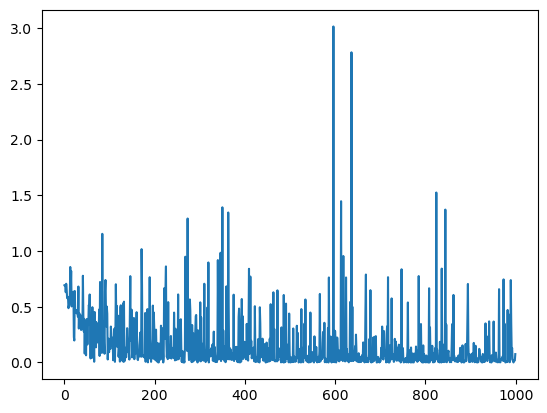

Activated Output [0.07248775]


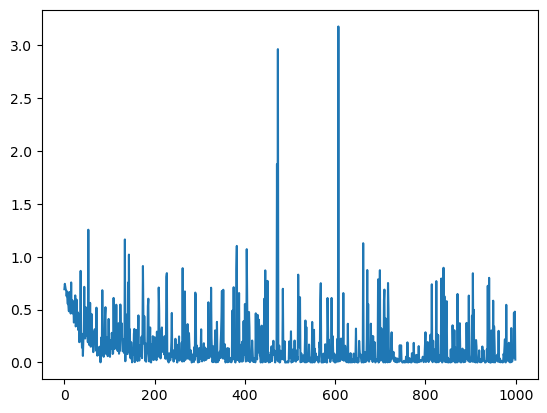

Activated Output [0.97315823]


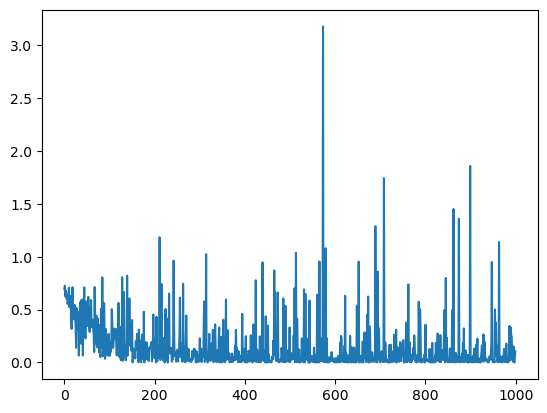

Activated Output [0.10067212]


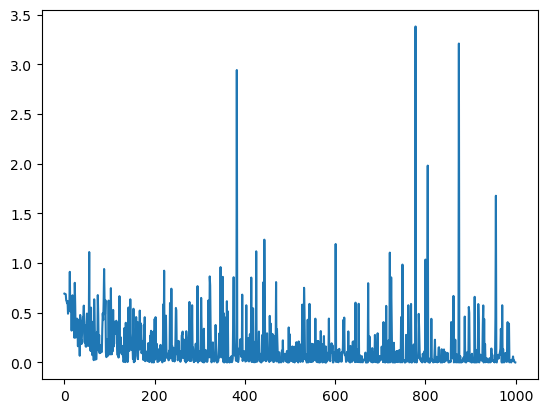

Activated Output [0.99988822]


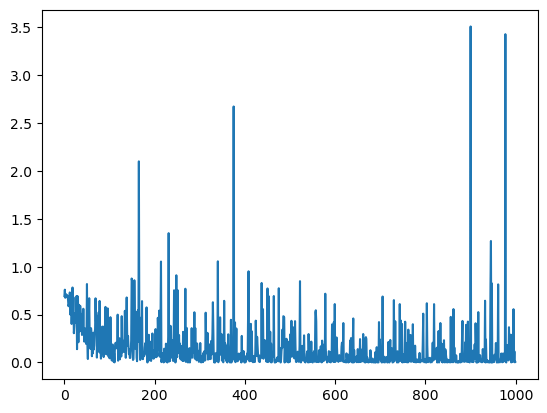

Activated Output [0.00572291]


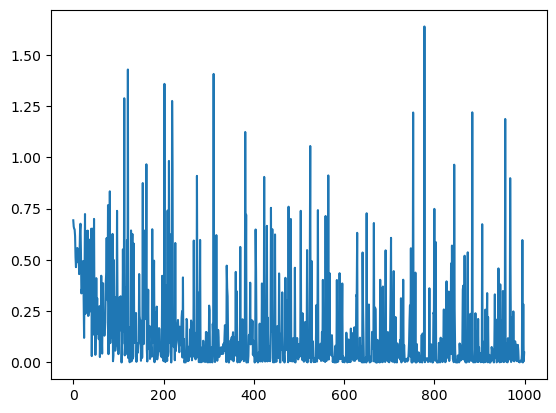

Activated Output [0.04707525]


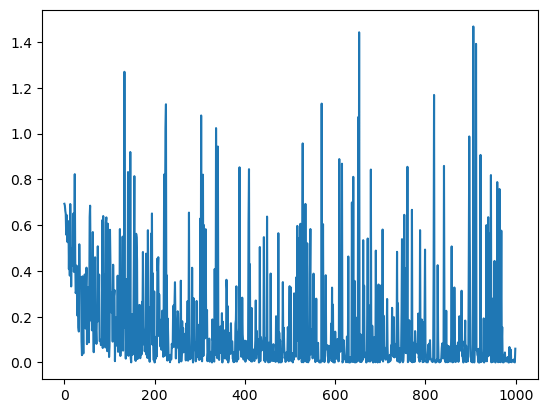

Activated Output [0.05843313]


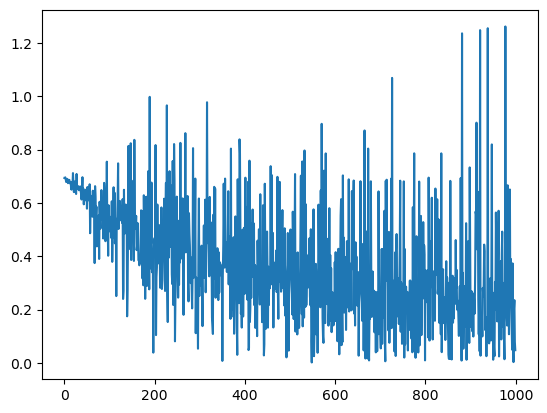

Activated Output [0.95353178]


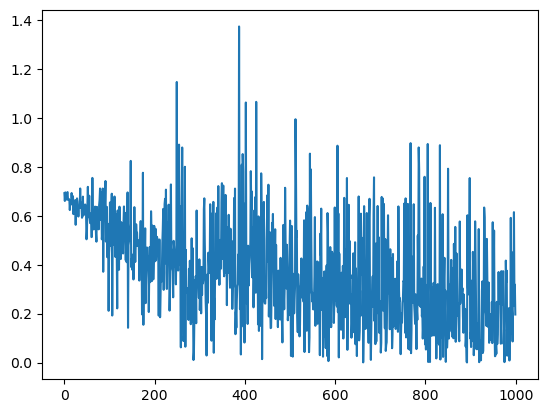

Activated Output [0.82160199]


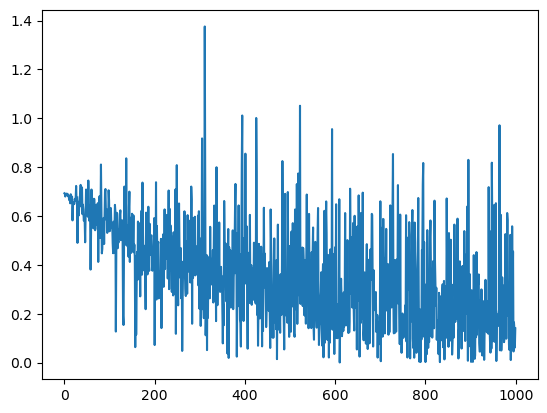

Activated Output [0.130827]


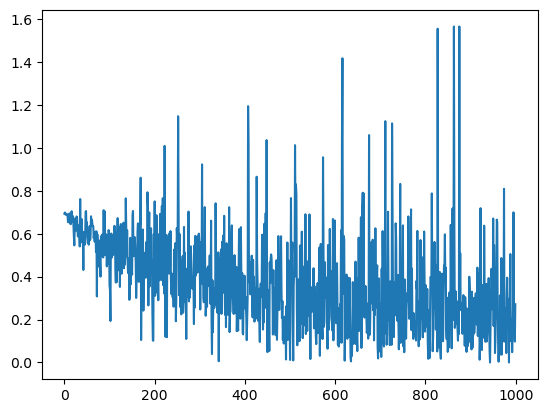

Activated Output [0.76224621]


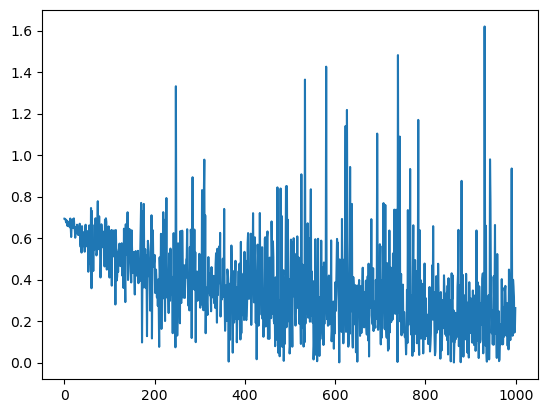

Activated Output [0.23072222]


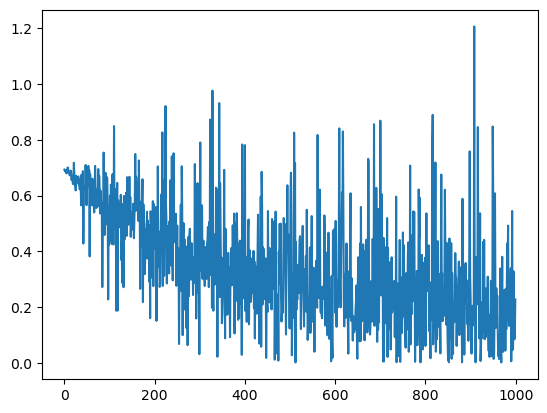

Activated Output [0.79649283]


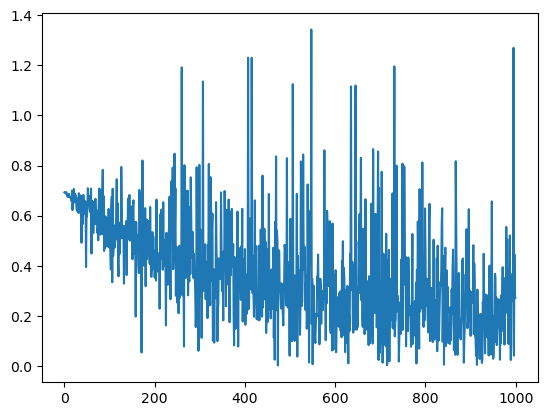

Activated Output [0.23743446]


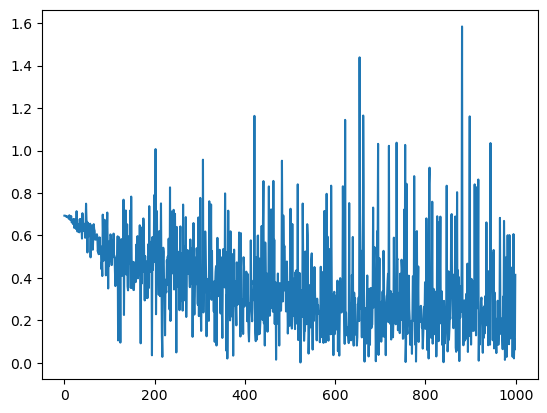

Activated Output [0.33911488]


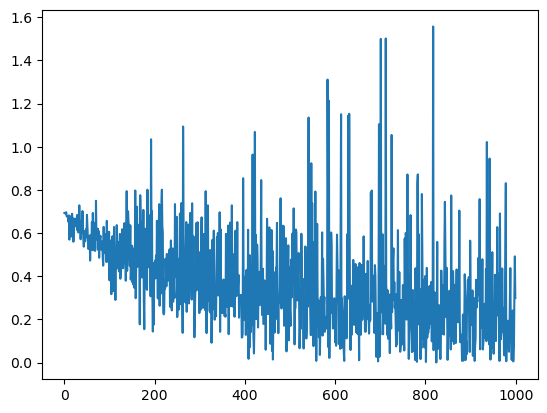

Activated Output [0.25837041]


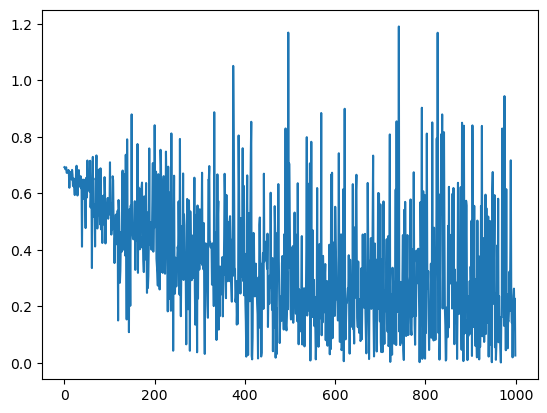

Activated Output [0.97398527]


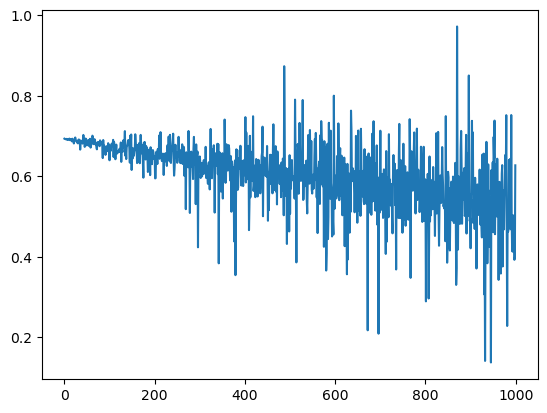

Activated Output [0.465773]


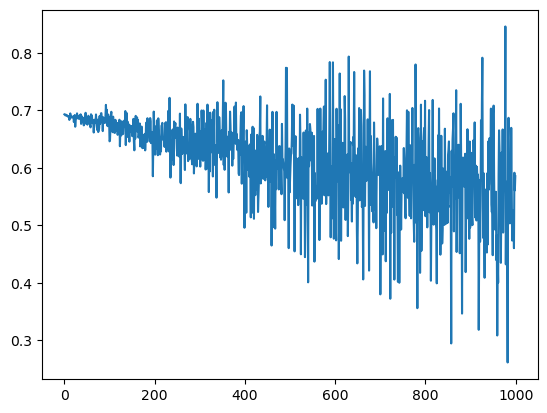

Activated Output [0.44321236]


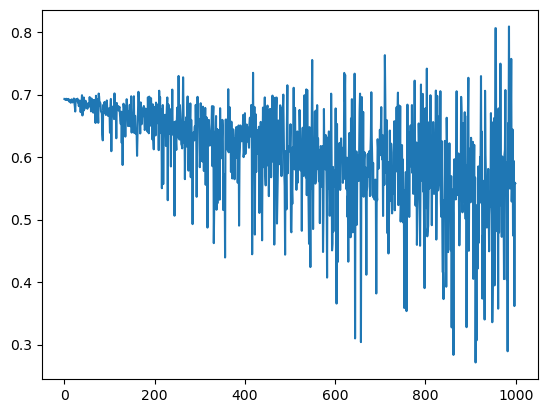

Activated Output [0.57231288]


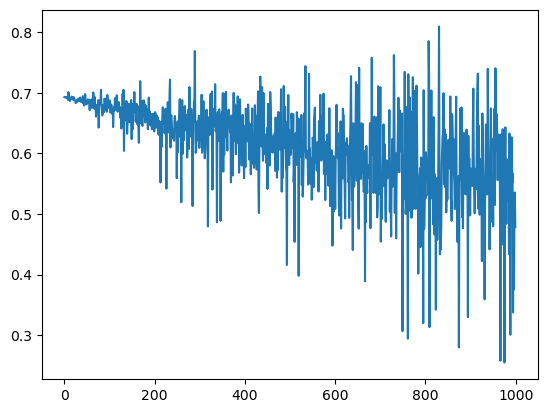

Activated Output [0.61970684]


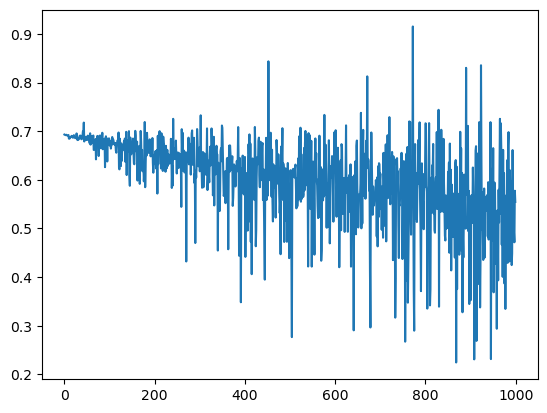

Activated Output [0.57429126]


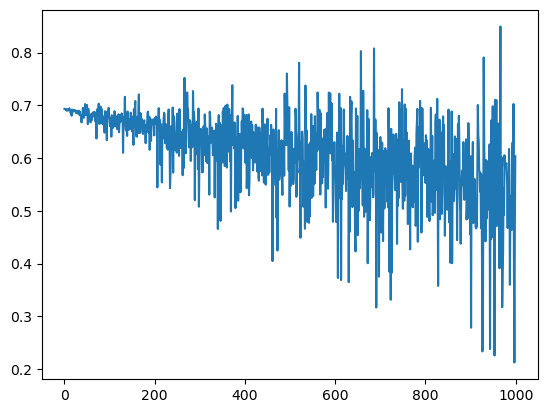

Activated Output [0.45310057]


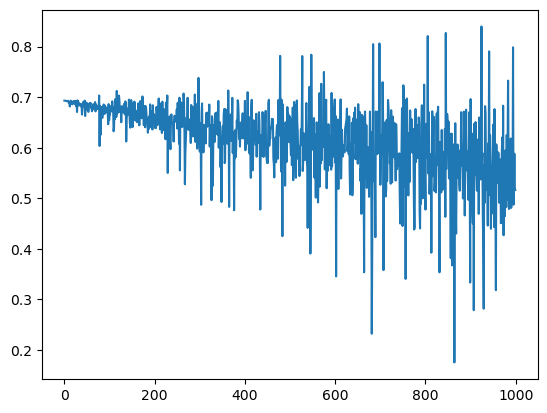

Activated Output [0.40332879]


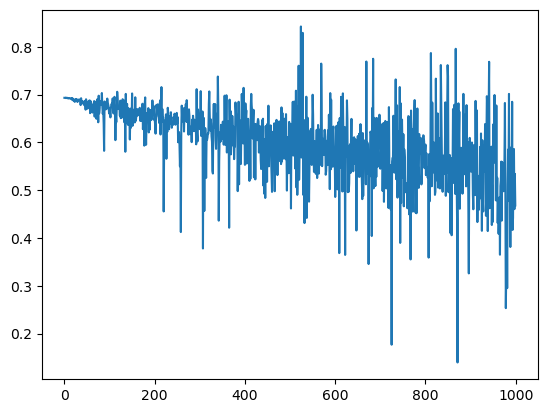

Activated Output [0.62617497]


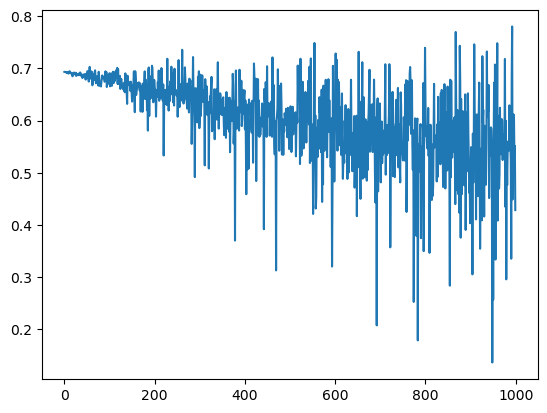

Activated Output [0.65145406]


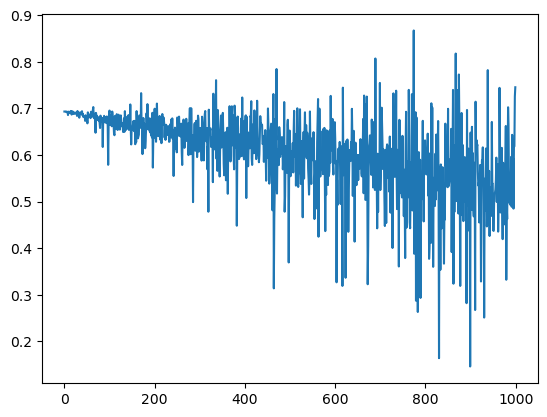

Activated Output [0.5253923]


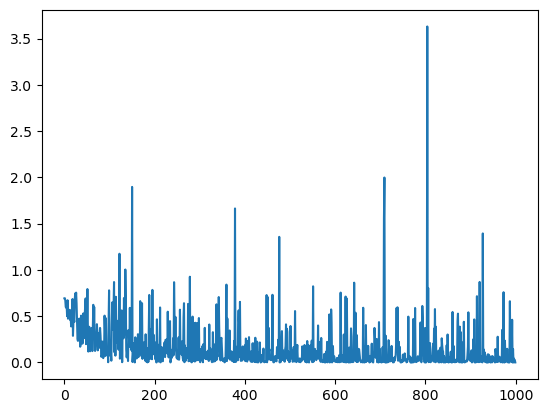

Activated Output [0.9993873]


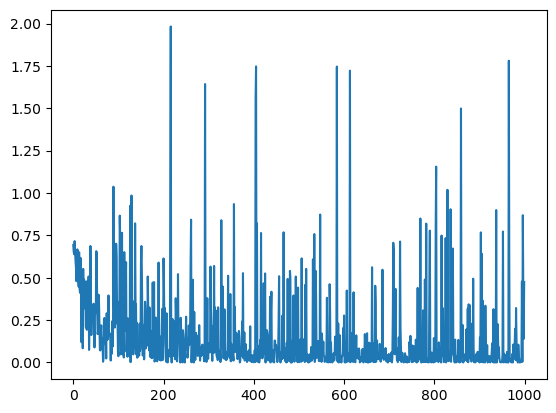

Activated Output [0.62211301]


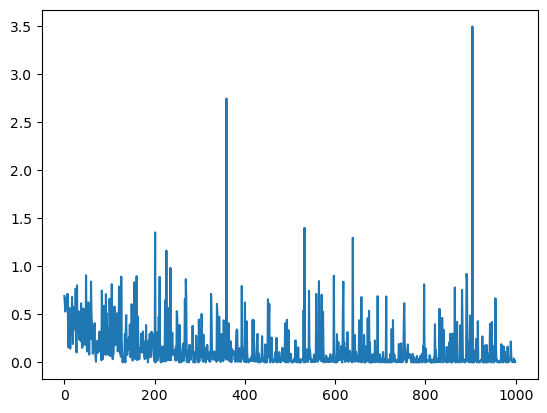

Activated Output [0.00580613]


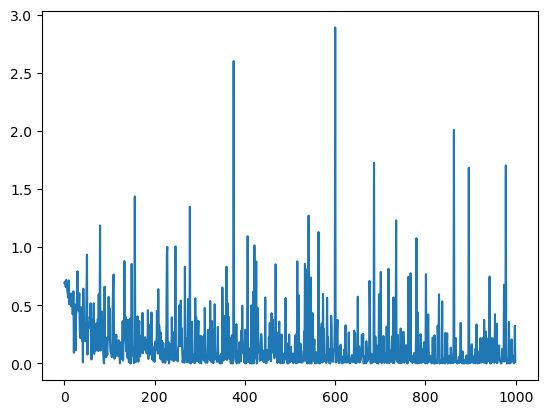

Activated Output [0.01369426]


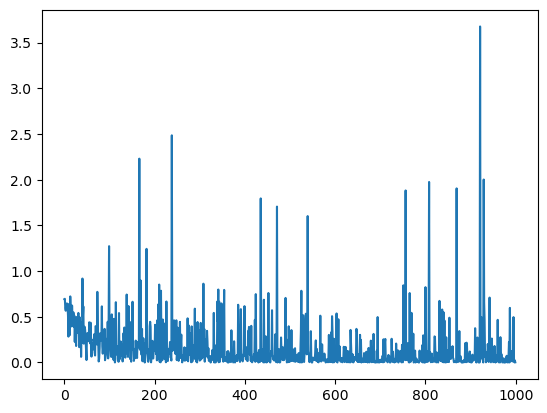

Activated Output [0.9981918]


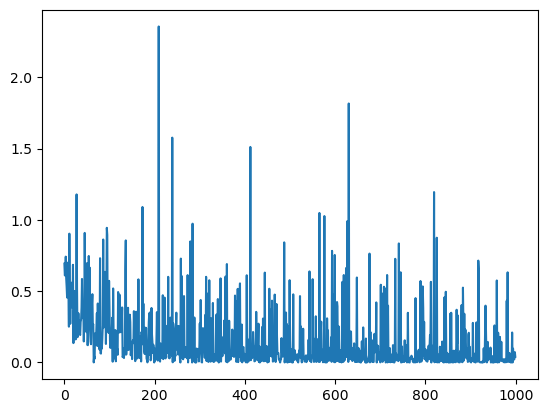

Activated Output [0.03929192]


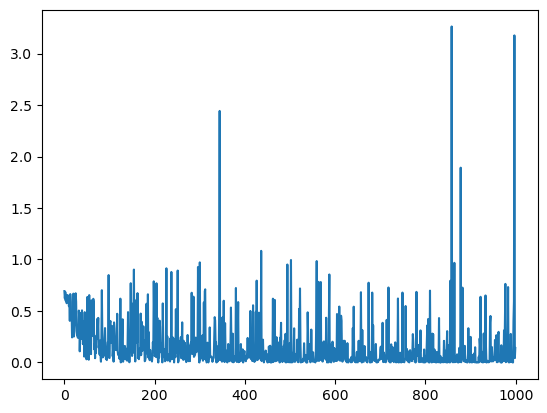

Activated Output [0.13125495]


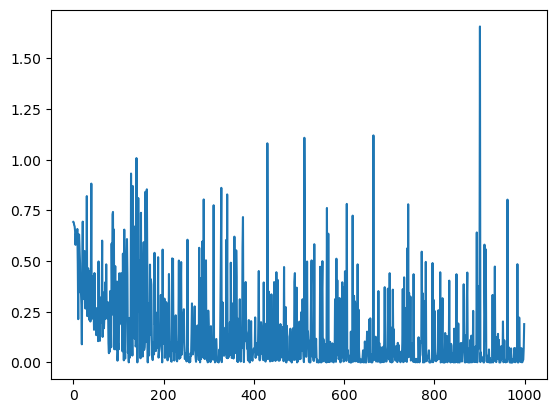

Activated Output [0.17237857]


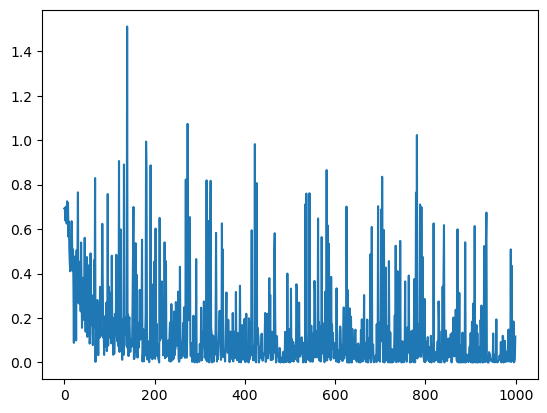

Activated Output [0.88977787]


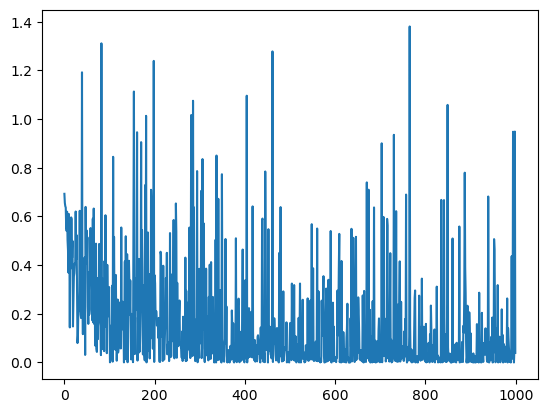

Activated Output [0.03869494]


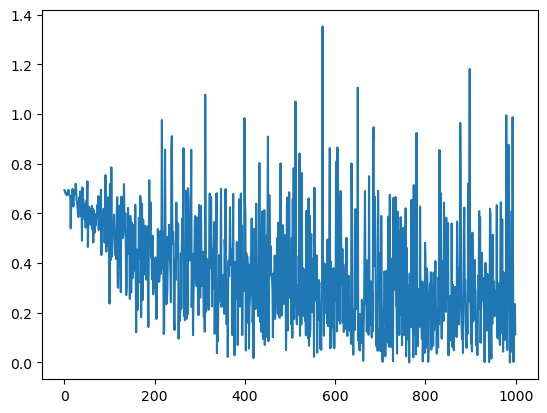

Activated Output [0.10698019]


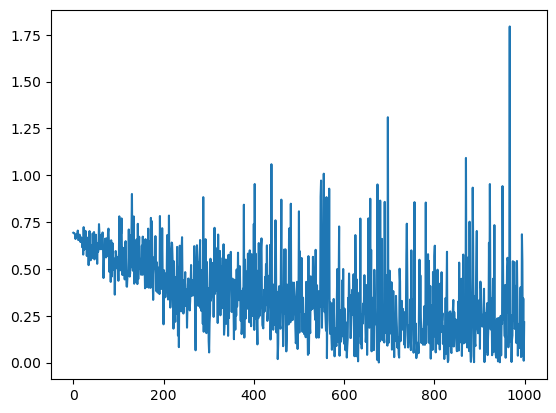

Activated Output [0.80669828]


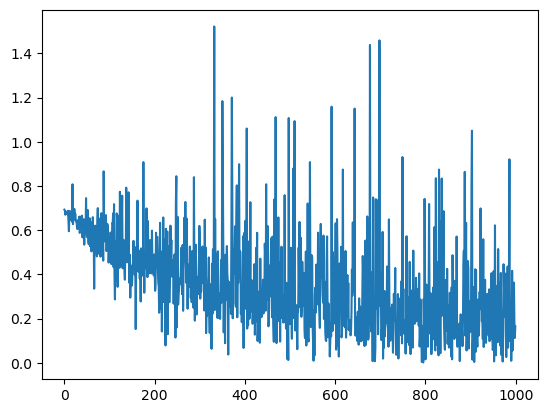

Activated Output [0.84775556]


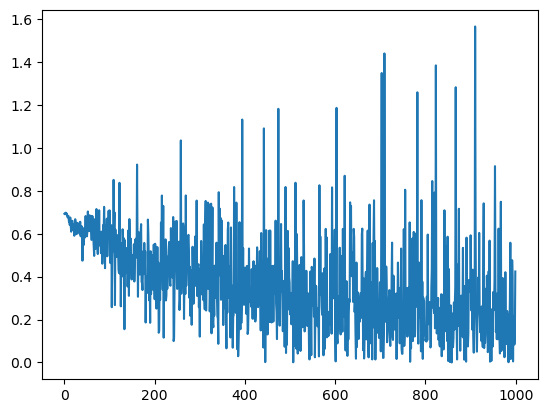

Activated Output [0.34570629]


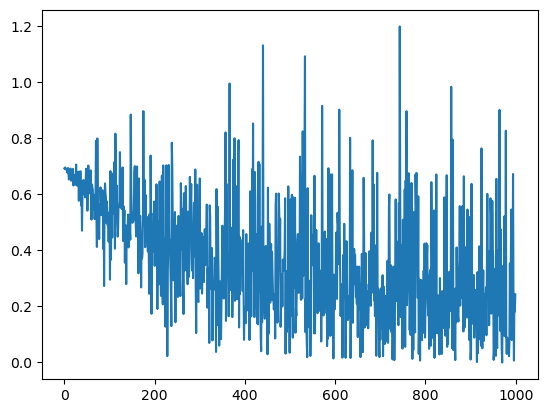

Activated Output [0.78411843]


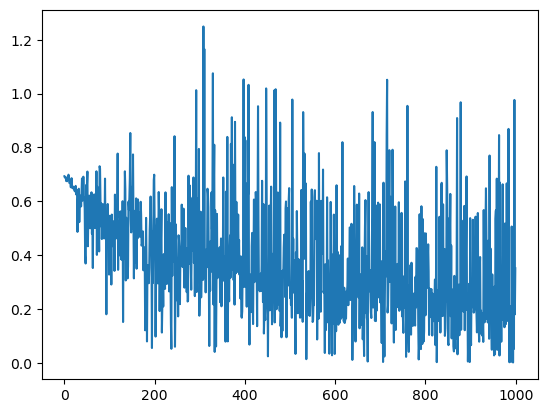

Activated Output [0.70359239]


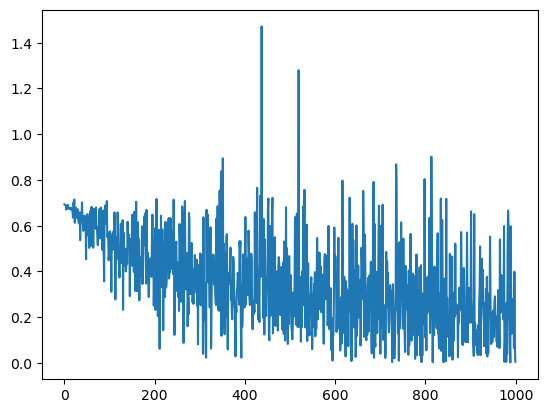

Activated Output [0.99514201]


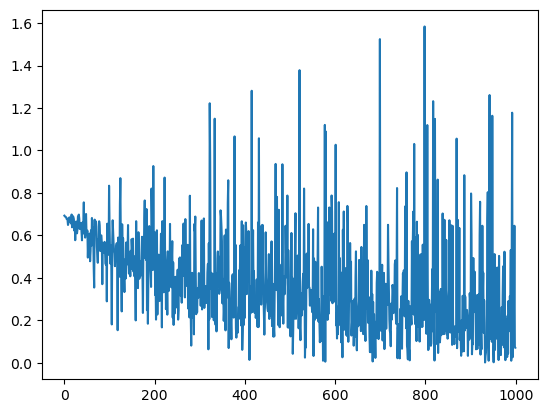

Activated Output [0.06884594]


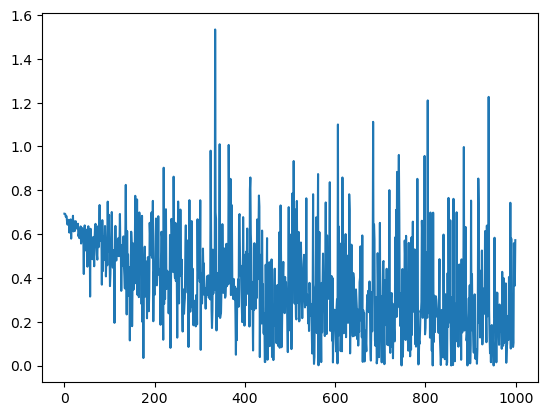

Activated Output [0.4356959]


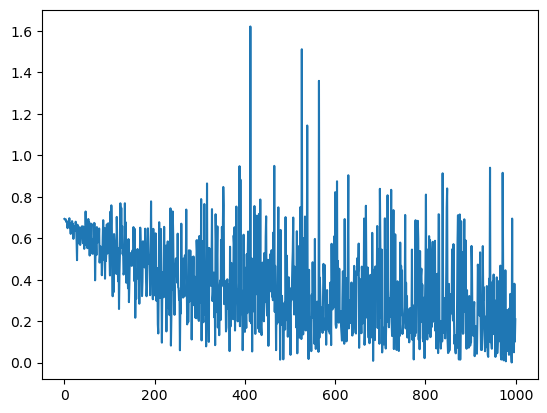

Activated Output [0.81100249]


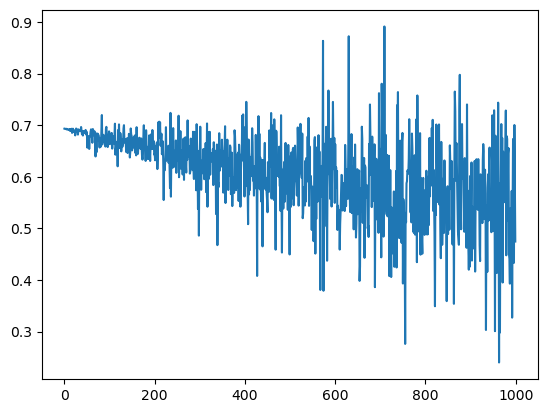

Activated Output [0.37783772]


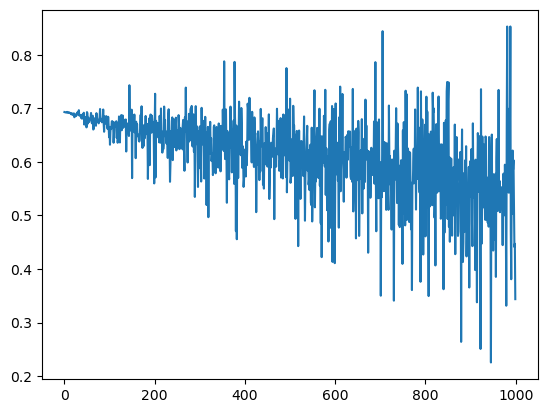

Activated Output [0.70918864]


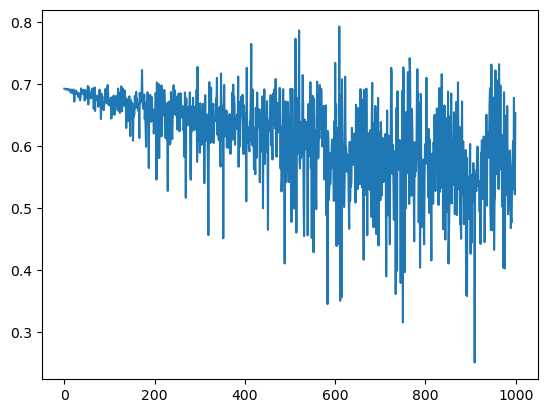

Activated Output [0.47975262]


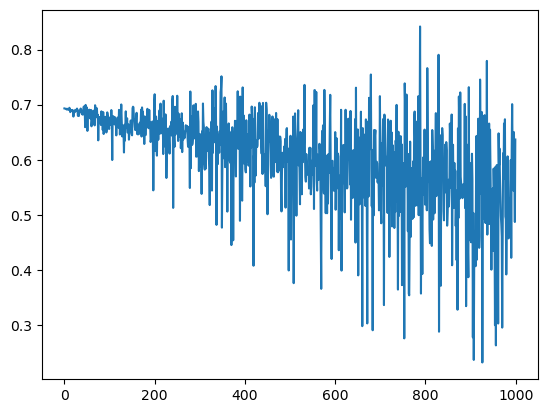

Activated Output [0.52904351]


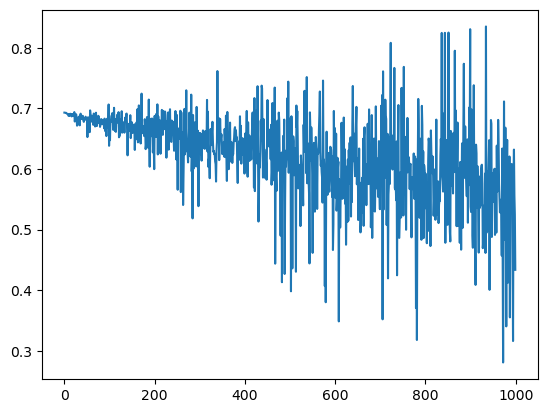

Activated Output [0.64806186]


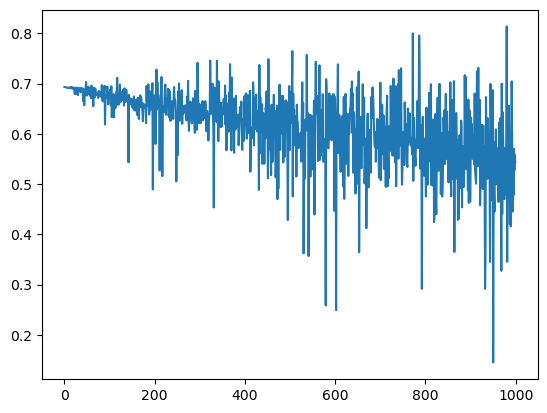

Activated Output [0.58106541]


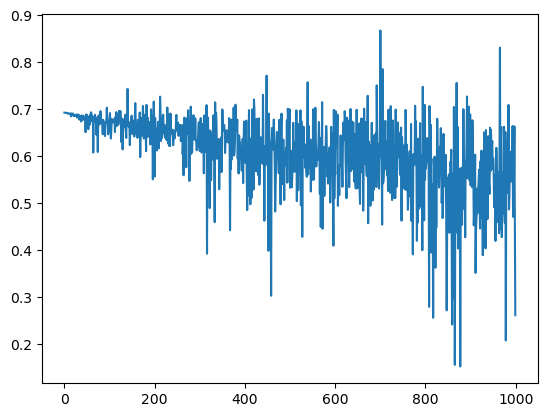

Activated Output [0.76961361]


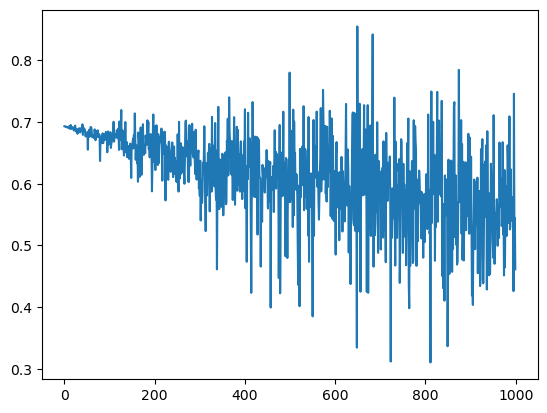

Activated Output [0.36947577]


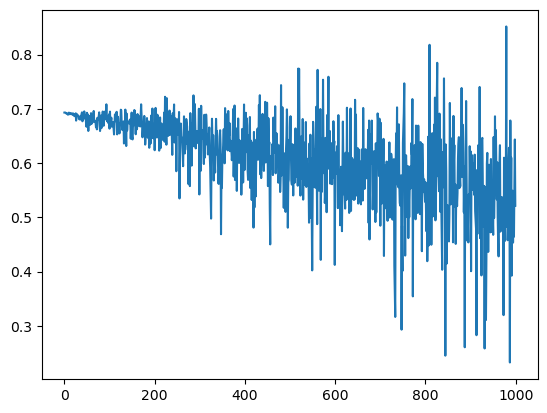

Activated Output [0.40635611]


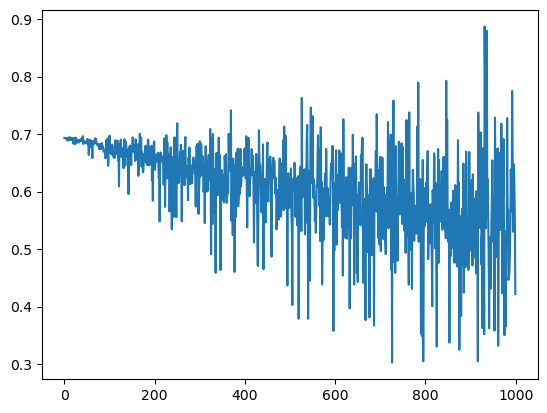

Activated Output [0.65583288]
max_neta_bgd 0.0001
max_thresh_bgd 0.7
max_neta_mbgd 0.0001
max_thresh_mbgd 0.7
max_neta_sgd 0.0001
max_thresh_sgd 0.7


In [ ]:
neta_list = [ 0.01, 0.001 ,0.0001]
grad =['bgd','mbgd','sgd']
thresh = [0.3,0.4,0.5,0.6,0.7]
accuracy_bgd = []
accuracy_mbgd = []
accuracy_sgd = []
max_neta_sgd = 0
max_neta_bgd = 0
max_neta_mbgd = 0
max_thresh_sgd = 0
max_thresh_bgd = 0
max_thresh_mbgd = 0
for g in grad:
    for t in thresh:
        for n in neta_list:
            average_accuracy_bgd = []
            average_accuracy_mbgd = []
            average_accuracy_sgd = []
            for i in range(10):
                # ---------------- test train split--------------------
                order=[]
                for i in range(len(df)):
                    order.append(i)
                shuffle = random.sample(order, int(len(order) * 0.67))

                rem = [i for i in order if i not in shuffle]
                X_train = df.iloc[shuffle]
                X_test = df.iloc[rem]
                Y_train = target.iloc[shuffle]
                Y_test = target.iloc[rem]
                # ---------------- test train split--------------------
                if g == 'bgd':
                    # def model(X_train, y_train, X_test, y_test, learning_rate, num_iter,probability_threshold):
                    weights, bias = model(X_train, Y_train, X_test, Y_test,n,1000,t)
                    average_accuracy_bgd.append(compute_accuracy(X_test, Y_test, weights, bias, probability_threshold=t))
                    max_neta = max(n,0)
                    max_thresh_bgd = max(t,0)
                elif g == 'mbgd':
                    weights, bias = mini_batch_gd(X_train, Y_train, learning_rate=n, num_iter=1000, batch_size = 64, probability_threshold=t)
                    average_accuracy_mbgd.append(compute_accuracy(X_test, Y_test, weights, bias, probability_threshold=t))
                    max_neta_mbgd = max(n,0)
                    max_thresh_mbgd = max(t,0)
                elif g == 'sgd':
                    weights, bias = stochastic_gd(X_train, Y_train, learning_rate=n, num_iter=1000, probability_threshold=t)
                    average_accuracy_sgd.append(compute_accuracy(X_test, Y_test, weights, bias, probability_threshold=t))
                    max_neta_sgd = max(n,0)
                    max_thresh_sgd = max(t,0)
            # mean 
            if g == 'bgd':
                accuracy_bgd.append(np.mean(average_accuracy_bgd))
            elif g == 'mbgd':
                accuracy_mbgd.append(np.mean(average_accuracy_mbgd))
            elif g == 'sgd':
                accuracy_sgd.append(np.mean(average_accuracy_sgd))
print("max_neta_bgd",max_neta)
print("max_thresh_bgd",max_thresh_bgd)
print("max_neta_mbgd",max_neta_mbgd)
print("max_thresh_mbgd",max_thresh_mbgd)
print("max_neta_sgd",max_neta_sgd)
print("max_thresh_sgd",max_thresh_sgd)

In [ ]:
variance_bgd = np.var(accuracy_bgd)
variance_mbgd = np.var(accuracy_mbgd)
variance_sgd = np.var(accuracy_sgd)

In [ ]:
print("Accuracy for BGD:", accuracy_bgd)
print("Variance for BGD:", variance_bgd)
print("Accuracy for MBGD:", accuracy_mbgd)
print("Variance for MBGD:", variance_mbgd)
print("Accuracy for SGD:", accuracy_sgd)
print("Variance for SGD:", variance_sgd)

Accuracy for BGD: [0.9579787234042552, 0.9691489361702128, 0.9643617021276597, 0.9691489361702128, 0.975, 0.972872340425532, 0.9686170212765959, 0.973404255319149, 0.9760638297872342, 0.9718085106382979, 0.9776595744680853, 0.9744680851063829, 0.9606382978723405, 0.9744680851063829, 0.9638297872340427]
Variance for BGD: 3.2588903978673337e-05
Accuracy for MBGD: [0.9696808510638298, 0.9627659574468085, 0.9409574468085106, 0.9702127659574469, 0.9702127659574469, 0.9595744680851066, 0.9792553191489363, 0.9750000000000002, 0.9670212765957448, 0.9718085106382979, 0.9744680851063829, 0.9675531914893618, 0.9723404255319149, 0.9787234042553192, 0.9515957446808511]
Variance for MBGD: 9.821437553443042e-05
Accuracy for SGD: [0.9590425531914895, 0.8632978723404255, 0.37659574468085105, 0.9632978723404257, 0.9207446808510638, 0.4999999999999999, 0.9781914893617023, 0.9515957446808511, 0.9281914893617023, 0.9659574468085106, 0.9393617021276596, 0.8175531914893618, 0.952659574468085, 0.9191489361702

In [ ]:
print(max(accuracy_mbgd))

0.9792553191489363


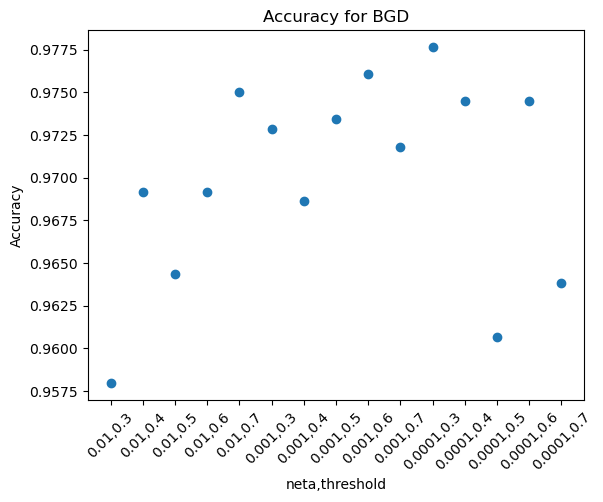

In [ ]:
plt.ylabel('Accuracy')
# scatterplot
neta_list = [ 0.01, 0.001 ,0.0001]
thresh = [0.3,0.4,0.5,0.6,0.7]
plt.scatter(range(0,15),accuracy_bgd)
_ =[]
for i in neta_list:
    for j in thresh:
        _.append(str(i)+","+str(j))
plt.xticks(range(0,15),_)
plt.xticks(rotation=45)
plt.title('Accuracy for BGD max of {:.3f} at ({},{})'.format(max(accuracy_bgd),max_neta_bgd,max_thresh_bgd))
plt.xlabel('neta,threshold')
plt.title('Accuracy for BGD')
plt.show()


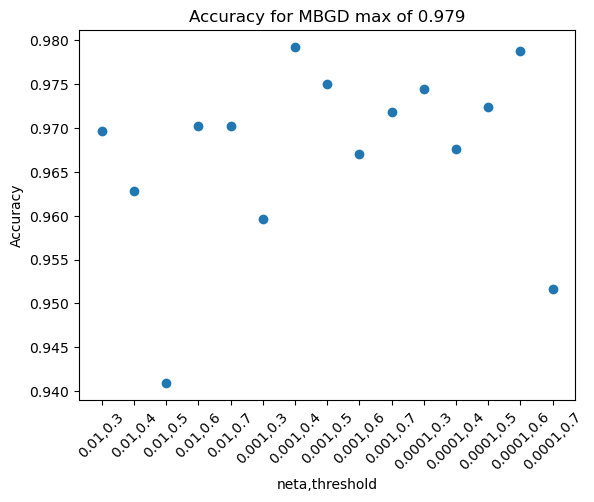

In [ ]:
plt.ylabel('Accuracy')
# scatterplot
plt.scatter(range(0,15),accuracy_mbgd)
_ =[]
for i in neta_list:
    for j in thresh:
        _.append(str(i)+","+str(j))
plt.xticks(range(0,15),_)
plt.xticks(rotation=45)
plt.xlabel('neta,threshold')
plt.title('Accuracy for MBGD max of {:.3f}'.format(max(accuracy_mbgd)))
plt.show()


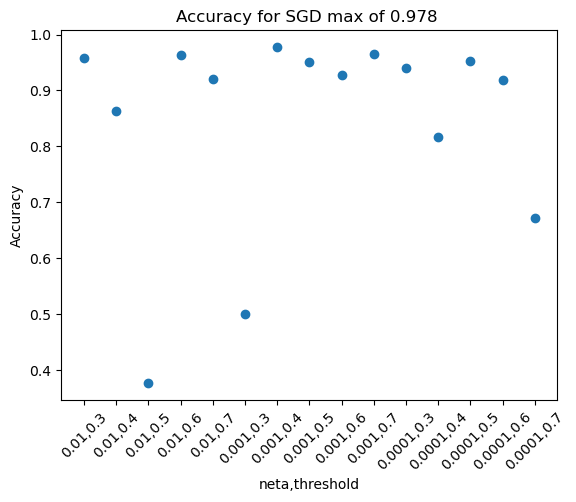

In [ ]:
plt.ylabel('Accuracy')
# scatterplot
plt.scatter(range(0,15),accuracy_sgd)
_ =[]
for i in neta_list:
    for j in thresh:
        _.append(str(i)+","+str(j))
plt.xticks(range(0,15),_)
# increase space in y axis
plt.xticks(rotation=45)
plt.xlabel('neta,threshold')
plt.title('Accuracy for SGD max of {:.3f} '.format(max(accuracy_sgd)))
plt.show()


In [ ]:
# save this in csv file 
dict_ = {"sgd":accuracy_sgd,"bgd":accuracy_bgd,"mbgd":accuracy_mbgd}
df = pd.DataFrame(dict_) 
# saving the dataframe 
df.to_csv('GFG.csv') 